In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [ ]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 99% 0.99G/1.00G [00:12<00:00, 300MB/s]
100% 1.00G/1.00G [00:12<00:00, 87.1MB/s]
Dataset downloaded and extracted to /content/dataset/


In [ ]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6379 files.


In [ ]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [ ]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - d_loss: 0.4737 - g_loss: 0.7429

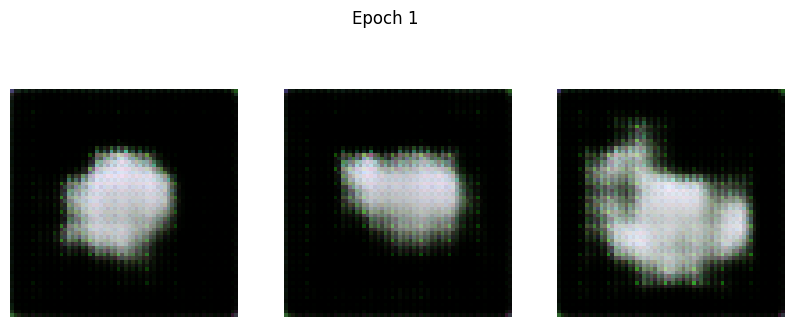

100/100 ━━━━━━━━━━━━━━━━━━━━ 40s 201ms/step - d_loss: 0.4741 - g_loss: 0.7433
Epoch 2/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: 0.6769 - g_loss: 0.7094

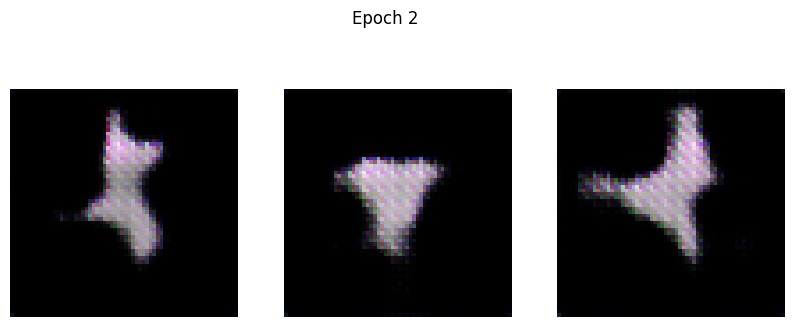

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6769 - g_loss: 0.7095
Epoch 3/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6750 - g_loss: 0.7058

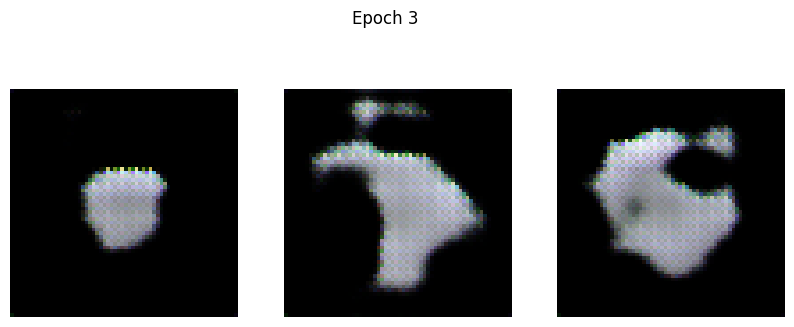

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6750 - g_loss: 0.7058
Epoch 4/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6534 - g_loss: 0.7462

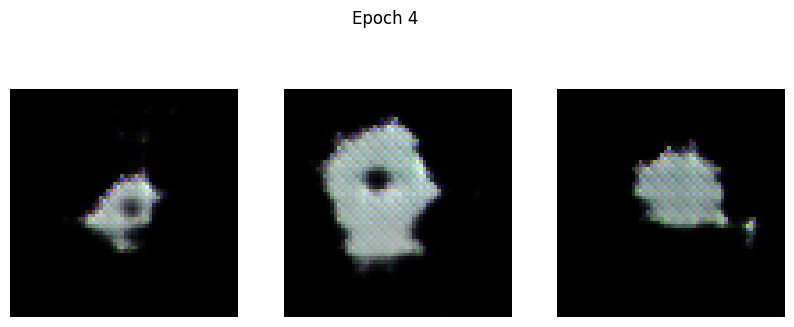

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6535 - g_loss: 0.7462
Epoch 5/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6622 - g_loss: 0.7488

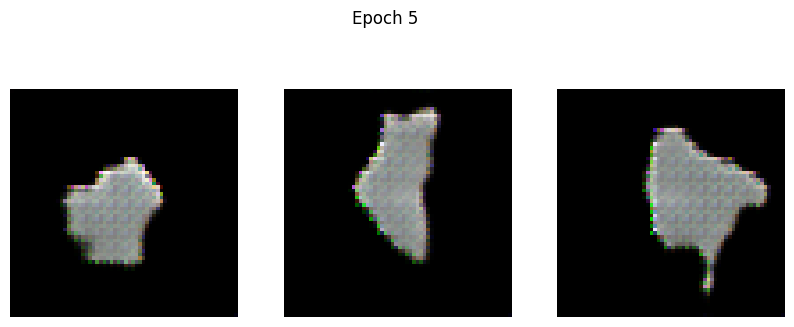

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6622 - g_loss: 0.7487
Epoch 6/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.6589 - g_loss: 0.7784

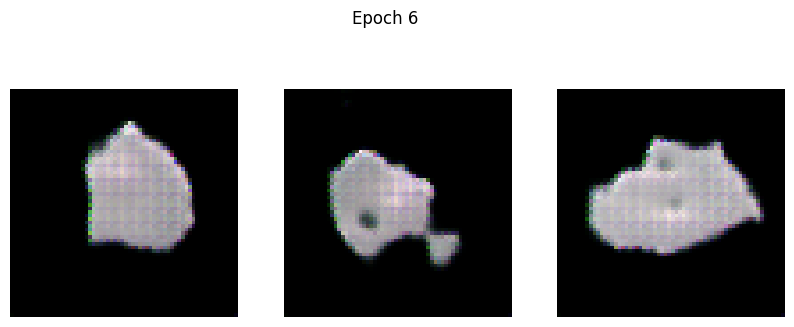

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.6589 - g_loss: 0.7783
Epoch 7/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.6659 - g_loss: 0.7523

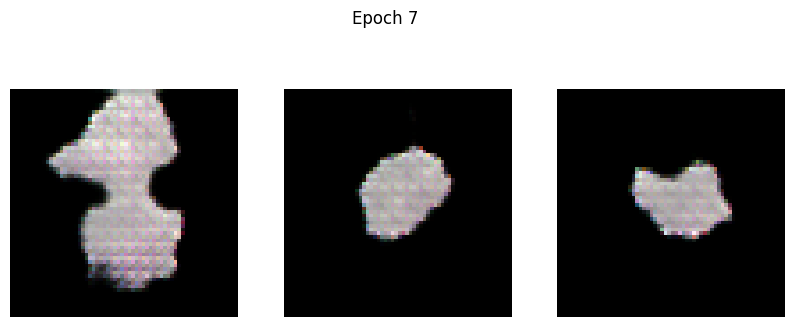

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6659 - g_loss: 0.7524
Epoch 8/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6618 - g_loss: 0.7335

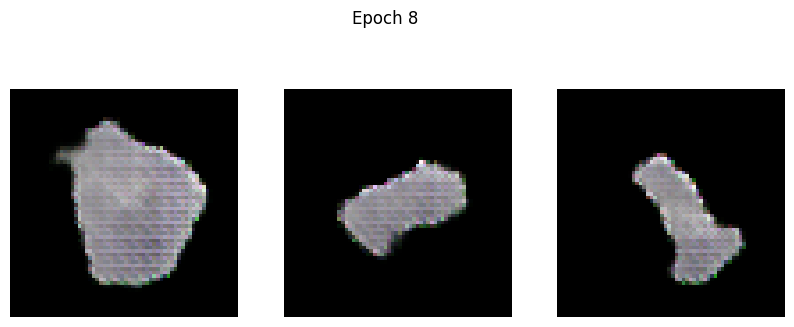

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6617 - g_loss: 0.7337
Epoch 9/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6682 - g_loss: 0.7467

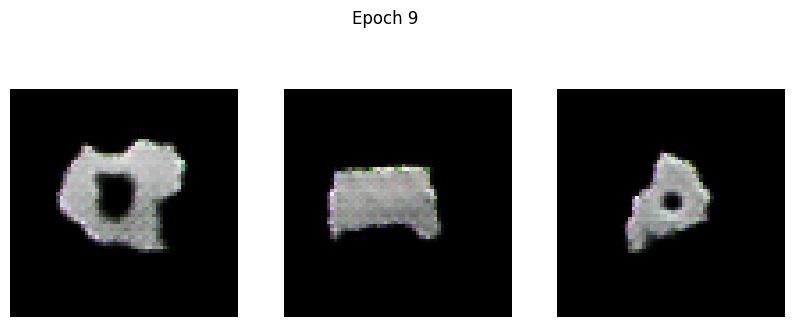

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6682 - g_loss: 0.7466
Epoch 10/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6631 - g_loss: 0.7323

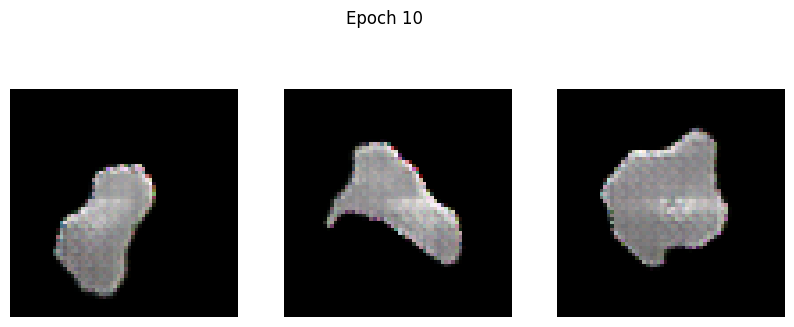

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6631 - g_loss: 0.7323
Epoch 11/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6617 - g_loss: 0.7326

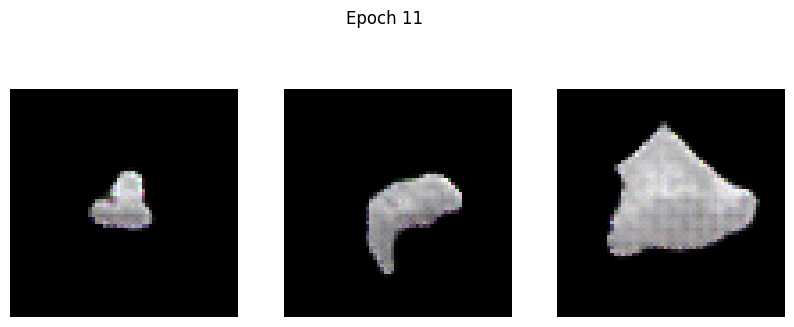

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6617 - g_loss: 0.7327
Epoch 12/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6577 - g_loss: 0.7540

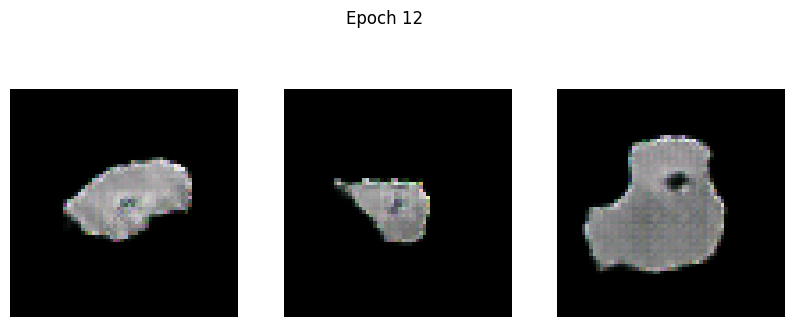

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6577 - g_loss: 0.7541
Epoch 13/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6456 - g_loss: 0.7914

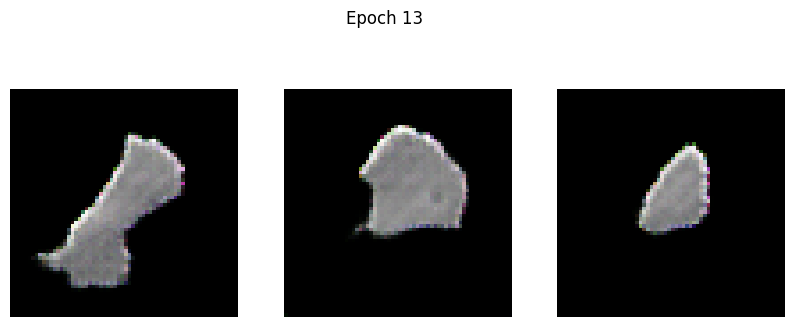

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6456 - g_loss: 0.7914
Epoch 14/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6449 - g_loss: 0.8319

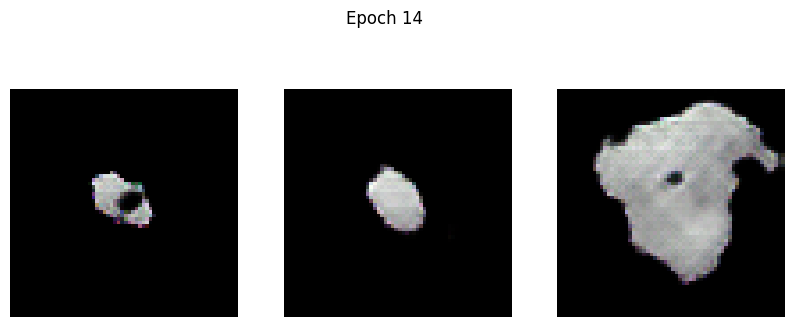

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6448 - g_loss: 0.8319
Epoch 15/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6349 - g_loss: 0.8793

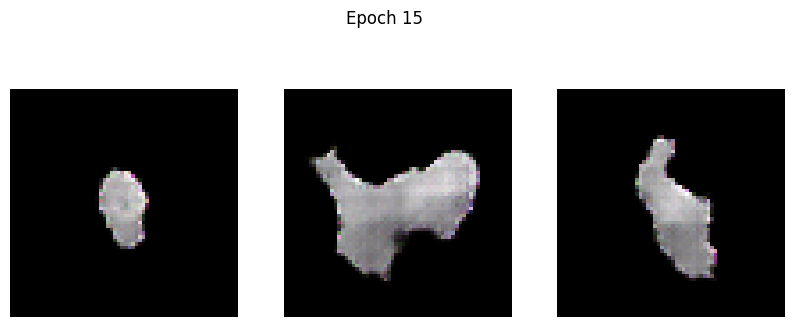

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6348 - g_loss: 0.8793
Epoch 16/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6593 - g_loss: 0.8589

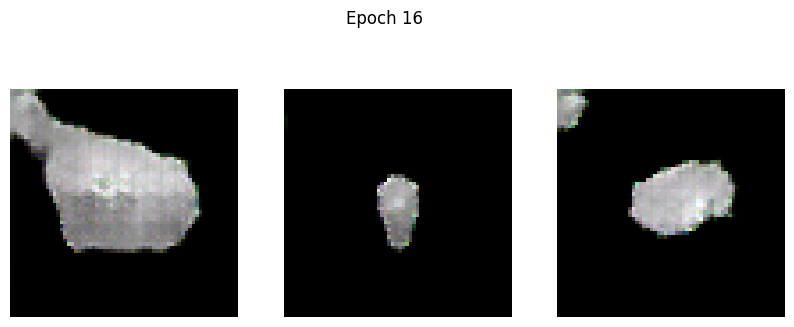

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6595 - g_loss: 0.8587
Epoch 17/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6208 - g_loss: 0.7931

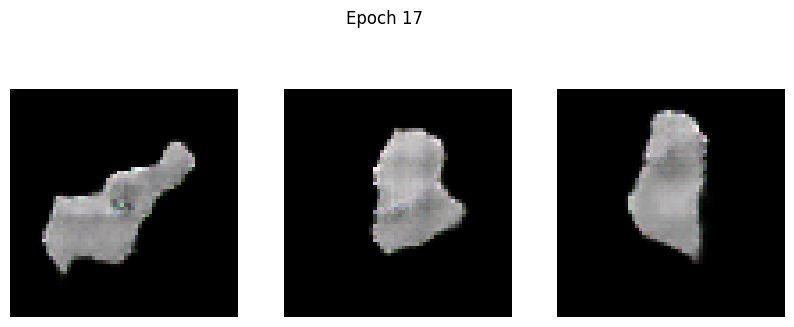

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6207 - g_loss: 0.7934
Epoch 18/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6023 - g_loss: 0.8382

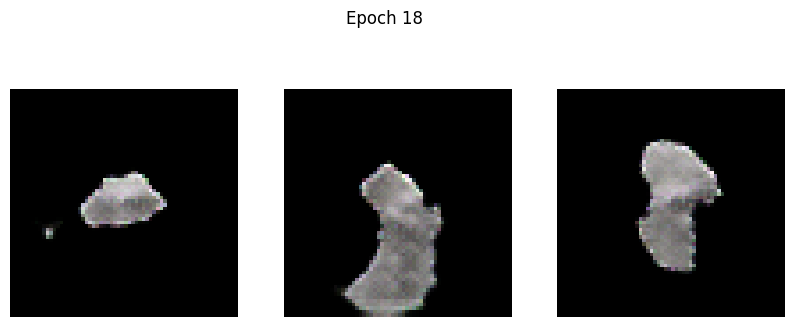

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6023 - g_loss: 0.8383
Epoch 19/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5998 - g_loss: 0.8784

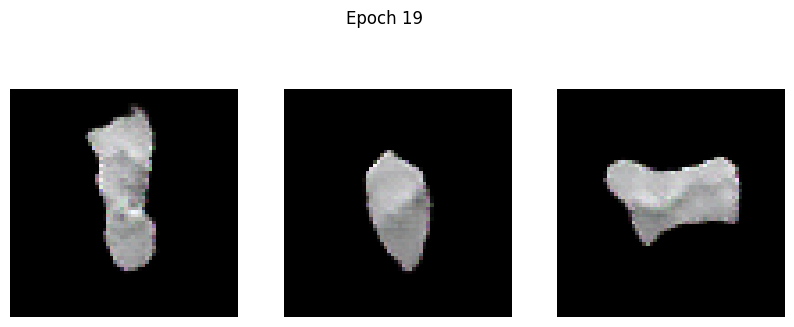

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5998 - g_loss: 0.8785
Epoch 20/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5953 - g_loss: 0.9407

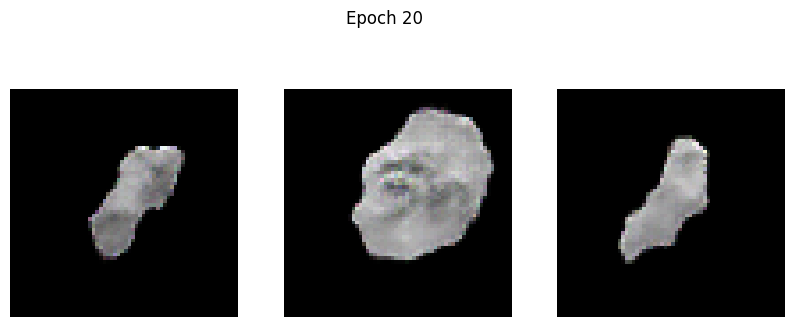

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5953 - g_loss: 0.9405
Epoch 21/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5777 - g_loss: 0.9250

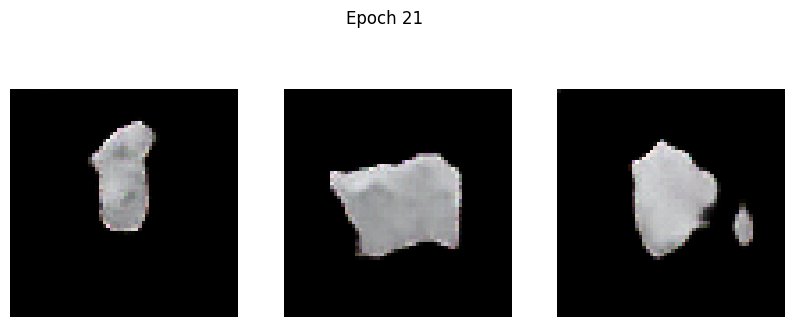

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5777 - g_loss: 0.9250
Epoch 22/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5627 - g_loss: 0.9456

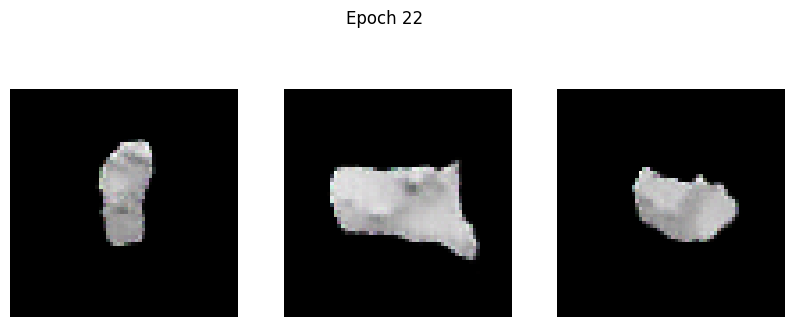

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5627 - g_loss: 0.9456
Epoch 23/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5596 - g_loss: 0.9993

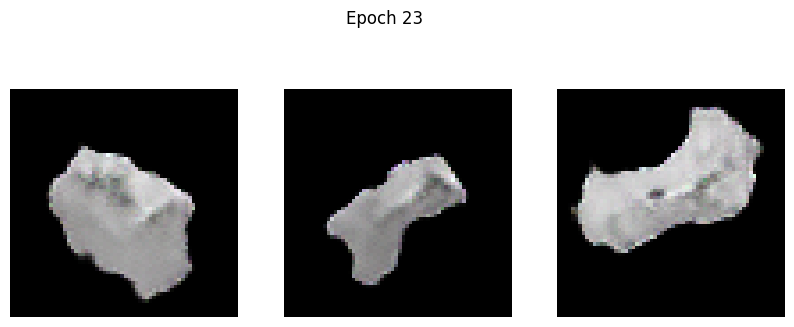

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5595 - g_loss: 0.9992
Epoch 24/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5548 - g_loss: 0.9939

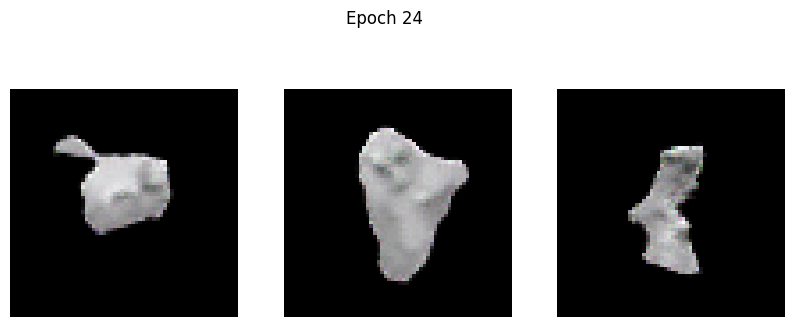

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5548 - g_loss: 0.9939
Epoch 25/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.5321 - g_loss: 1.0573

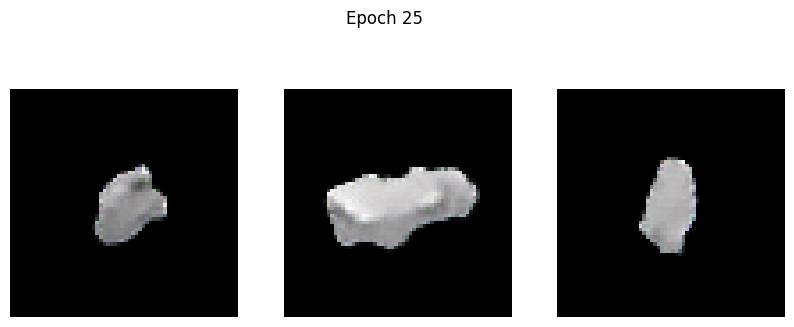

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5321 - g_loss: 1.0572
Epoch 26/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5400 - g_loss: 1.0680

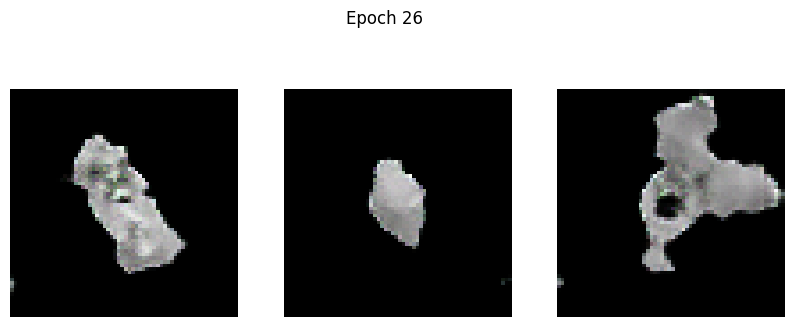

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5400 - g_loss: 1.0682
Epoch 27/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5024 - g_loss: 1.0949

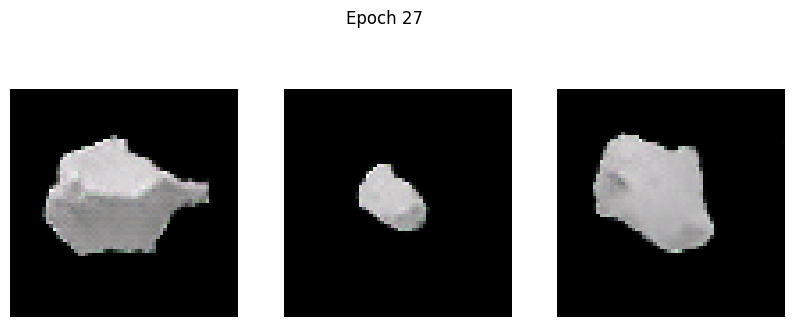

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5024 - g_loss: 1.0950
Epoch 28/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4987 - g_loss: 1.1371

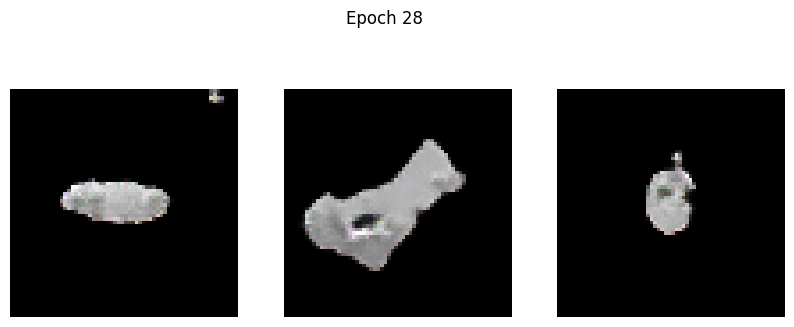

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4986 - g_loss: 1.1373
Epoch 29/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5066 - g_loss: 1.2074

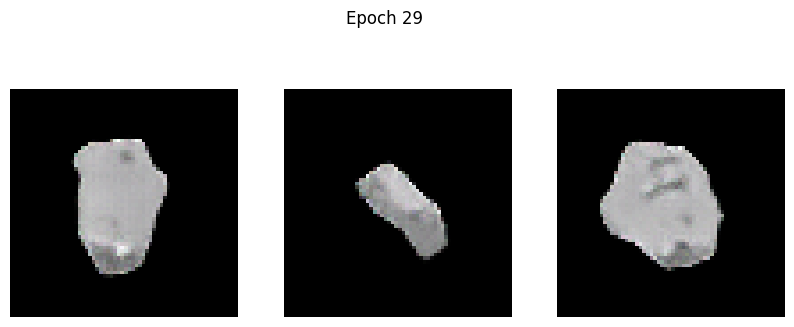

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5065 - g_loss: 1.2072
Epoch 30/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4877 - g_loss: 1.2081

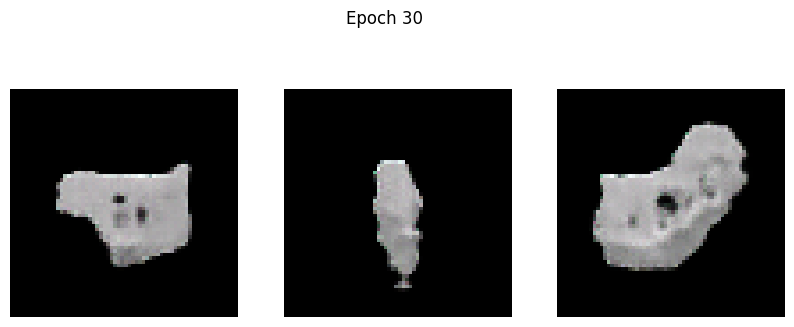

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4882 - g_loss: 1.2087
Epoch 31/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4789 - g_loss: 1.1297

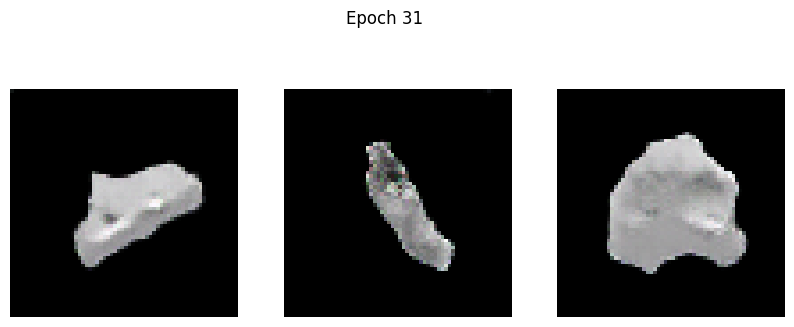

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4788 - g_loss: 1.1299
Epoch 32/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4507 - g_loss: 1.2229

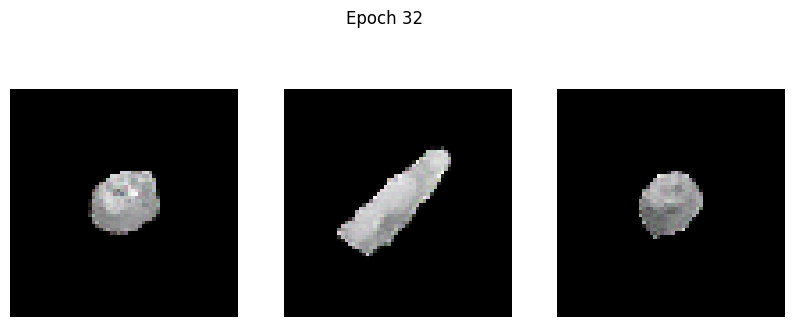

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4508 - g_loss: 1.2230
Epoch 33/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4479 - g_loss: 1.2528

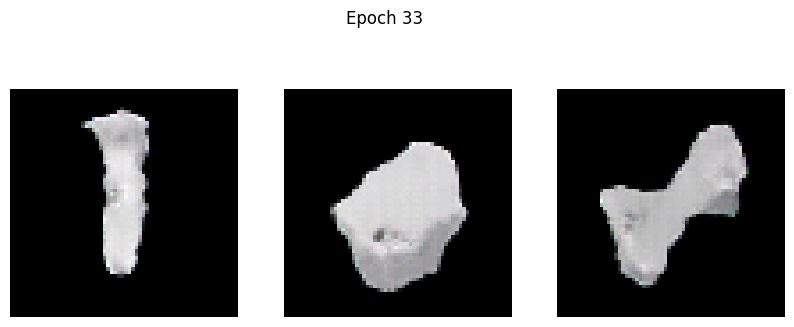

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4479 - g_loss: 1.2531
Epoch 34/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4428 - g_loss: 1.3086

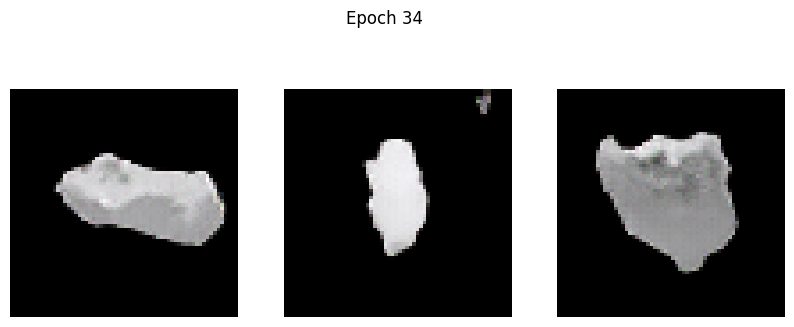

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4428 - g_loss: 1.3087
Epoch 35/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4362 - g_loss: 1.3521

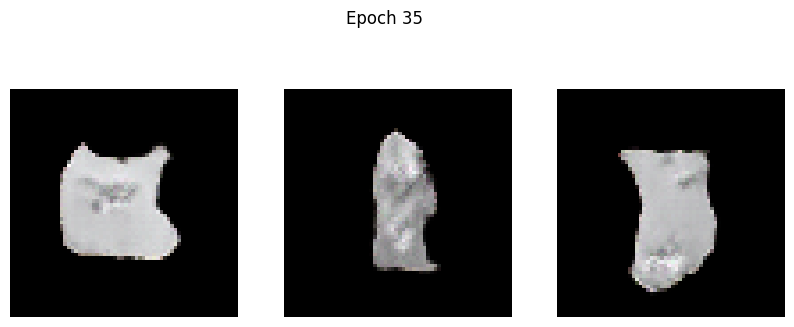

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4362 - g_loss: 1.3519
Epoch 36/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4582 - g_loss: 1.3683

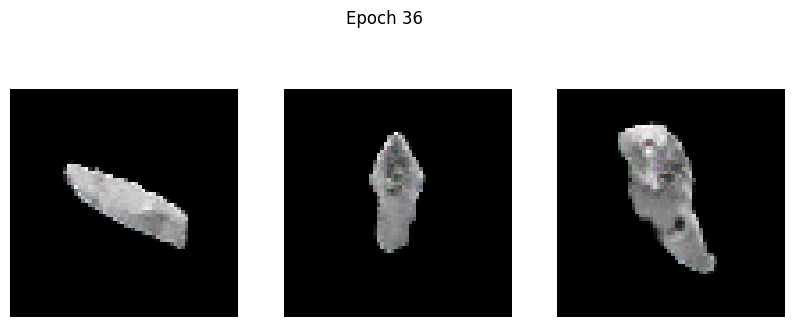

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4582 - g_loss: 1.3682
Epoch 37/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4018 - g_loss: 1.3607

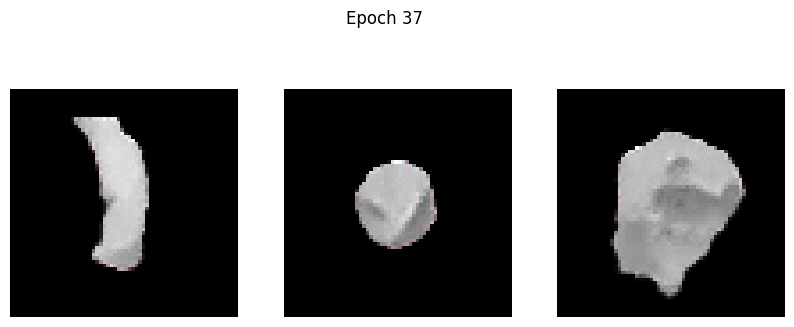

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4019 - g_loss: 1.3613
Epoch 38/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4033 - g_loss: 1.3997

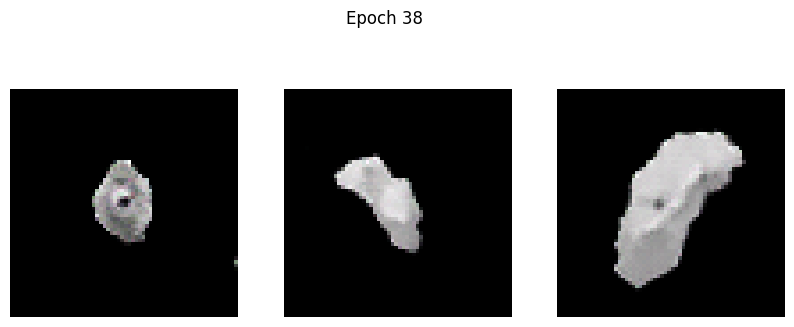

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4035 - g_loss: 1.4001
Epoch 39/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3969 - g_loss: 1.3990

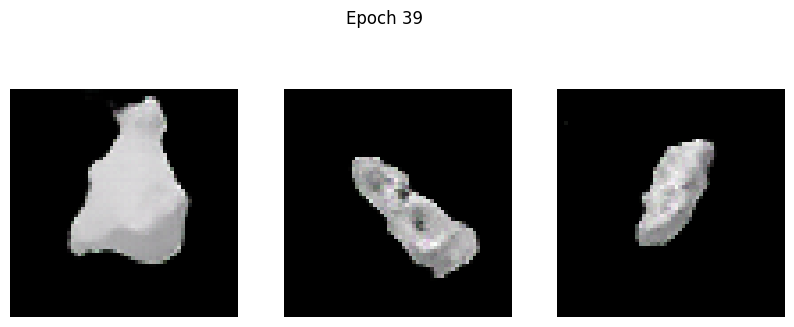

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3969 - g_loss: 1.3995
Epoch 40/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3846 - g_loss: 1.4362

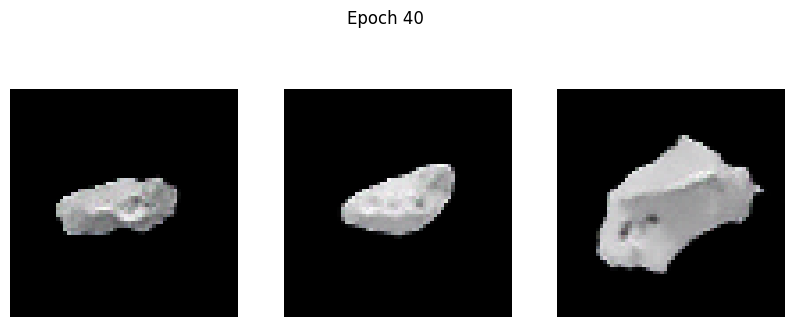

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3846 - g_loss: 1.4365
Epoch 41/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4011 - g_loss: 1.5725

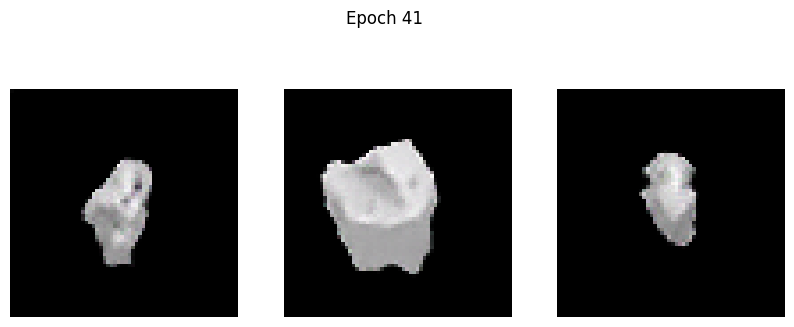

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4011 - g_loss: 1.5722
Epoch 42/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3756 - g_loss: 1.5178

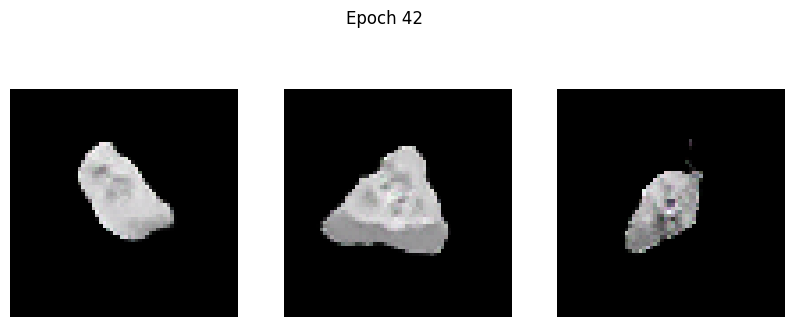

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3756 - g_loss: 1.5178
Epoch 43/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4051 - g_loss: 1.5594

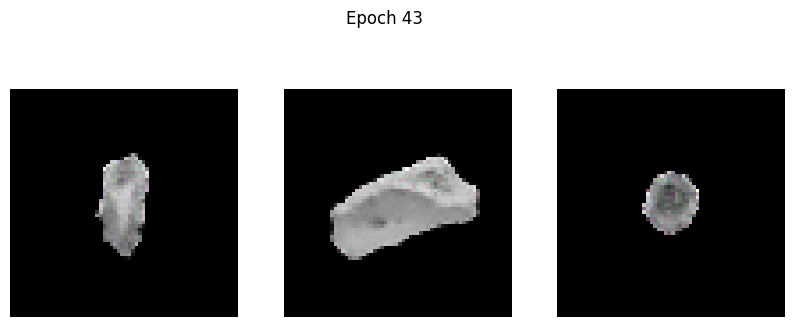

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.4049 - g_loss: 1.5595
Epoch 44/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3852 - g_loss: 1.6544

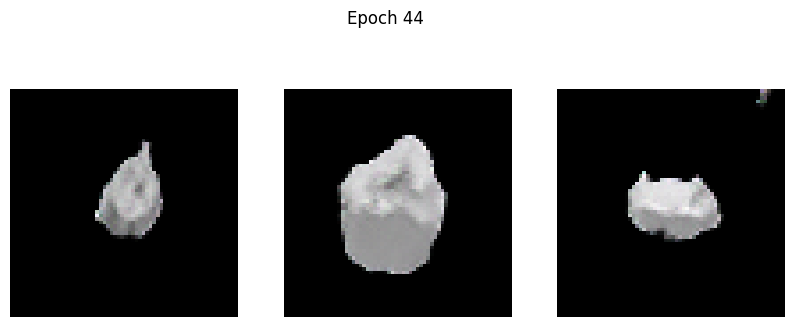

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3851 - g_loss: 1.6538
Epoch 45/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5361 - g_loss: 1.7603

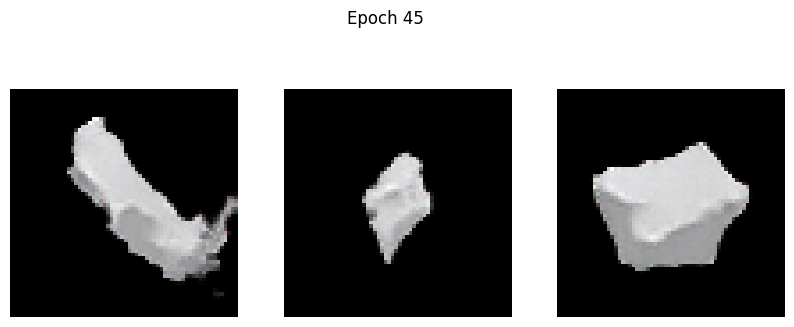

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.5354 - g_loss: 1.7587
Epoch 46/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3623 - g_loss: 1.5311

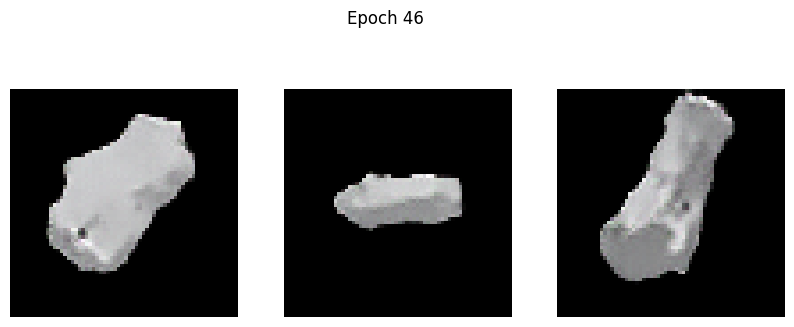

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3624 - g_loss: 1.5314
Epoch 47/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3659 - g_loss: 1.6018

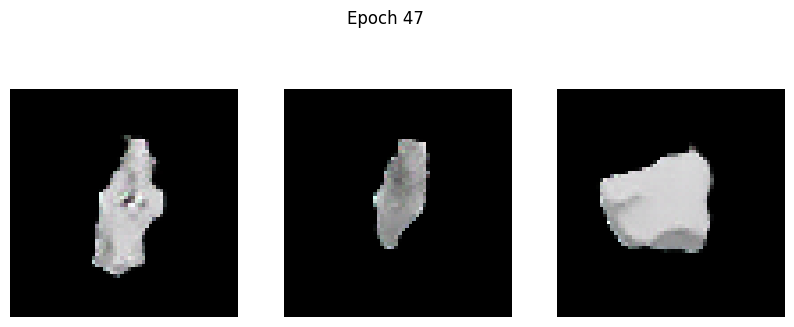

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3659 - g_loss: 1.6019
Epoch 48/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3548 - g_loss: 1.5824

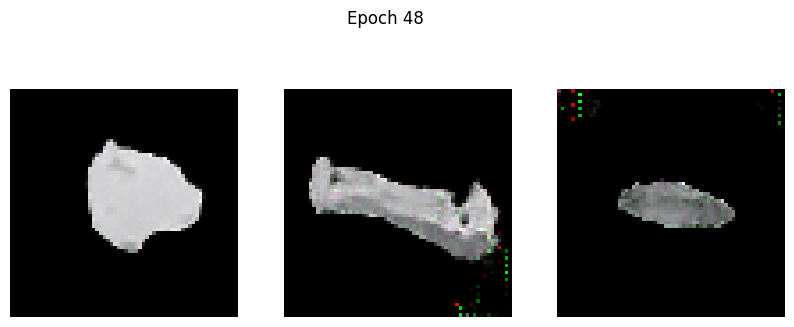

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3549 - g_loss: 1.5829
Epoch 49/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3961 - g_loss: 1.6704

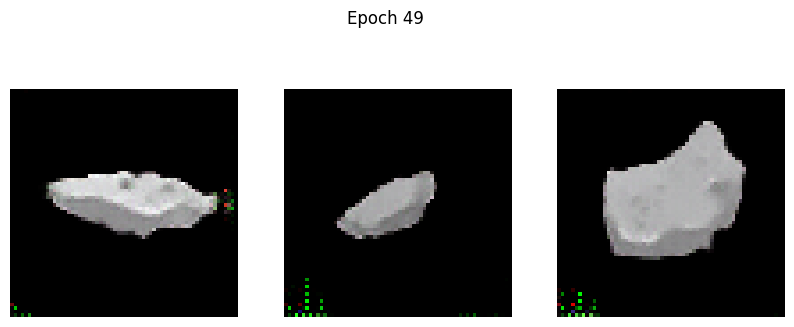

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3960 - g_loss: 1.6702
Epoch 50/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3789 - g_loss: 1.5941

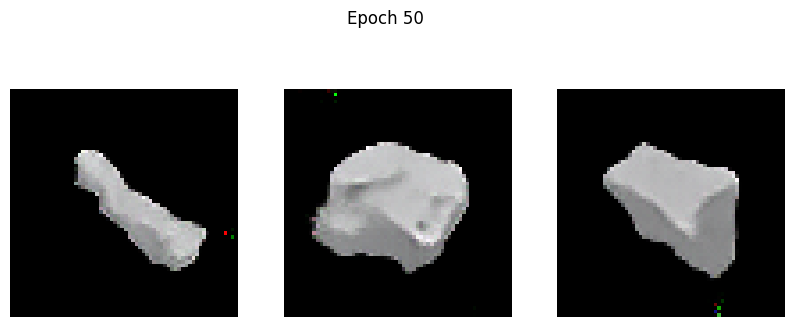

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3788 - g_loss: 1.5947
Epoch 51/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4734 - g_loss: 1.8627

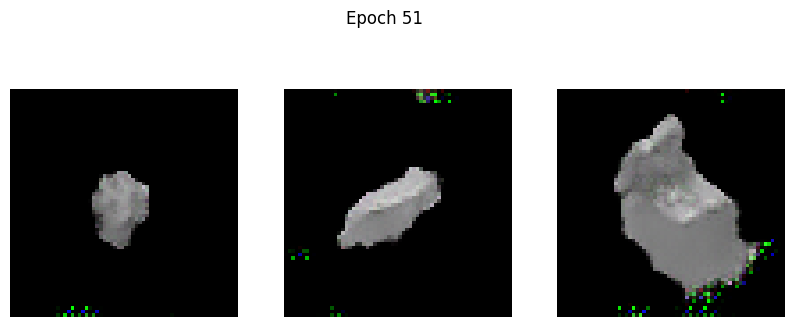

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4733 - g_loss: 1.8622
Epoch 52/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3537 - g_loss: 1.5741

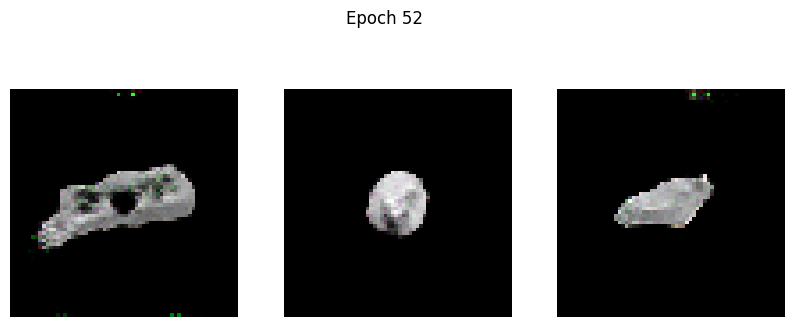

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3538 - g_loss: 1.5744
Epoch 53/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3555 - g_loss: 1.6030

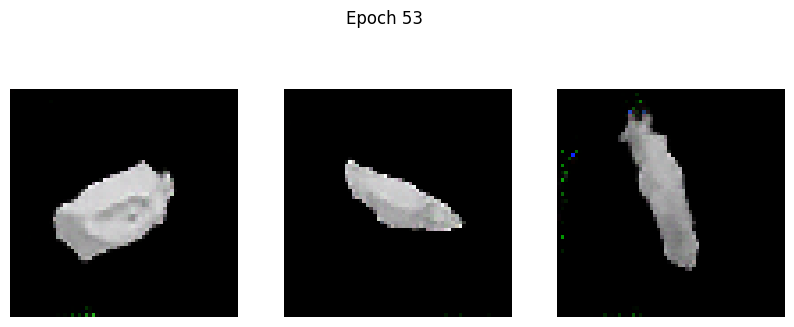

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3555 - g_loss: 1.6032
Epoch 54/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3550 - g_loss: 1.6580

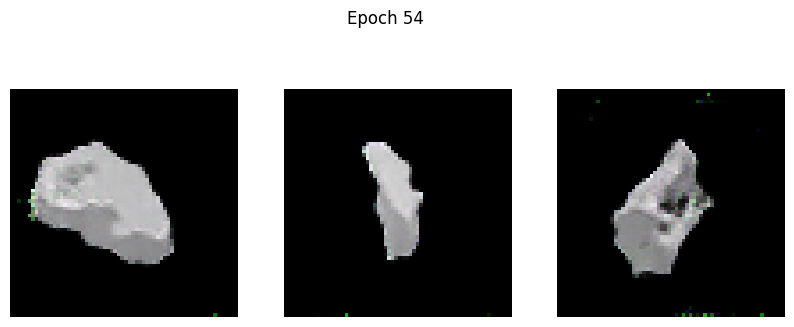

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3551 - g_loss: 1.6582
Epoch 55/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3517 - g_loss: 1.6852

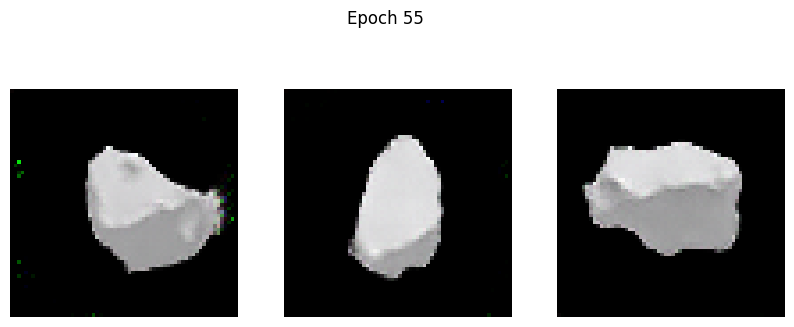

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3518 - g_loss: 1.6852
Epoch 56/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3535 - g_loss: 1.7279

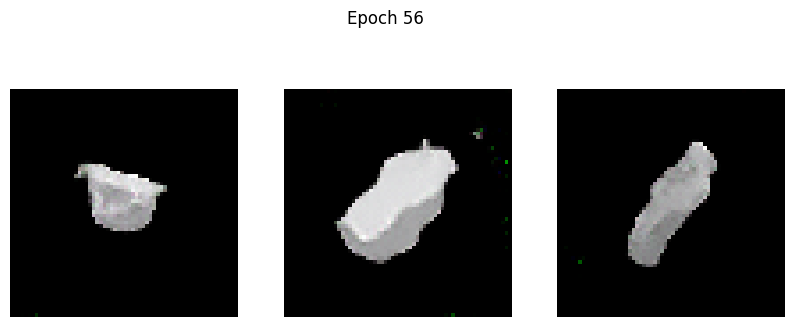

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3535 - g_loss: 1.7277
Epoch 57/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3415 - g_loss: 1.7666

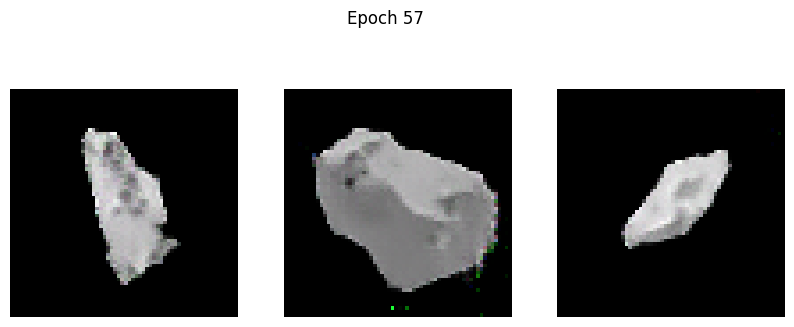

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3416 - g_loss: 1.7663
Epoch 58/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3553 - g_loss: 1.7435

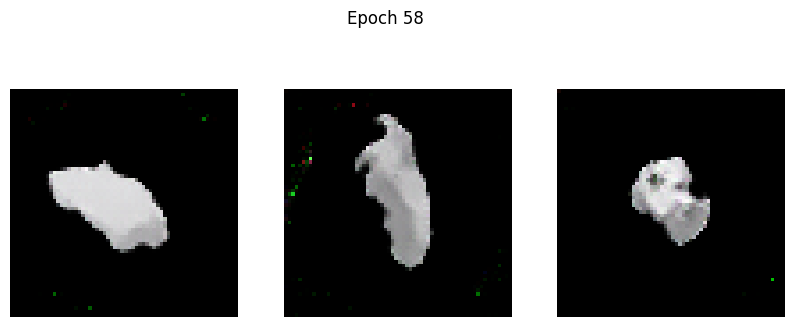

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3554 - g_loss: 1.7435
Epoch 59/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3339 - g_loss: 1.7446

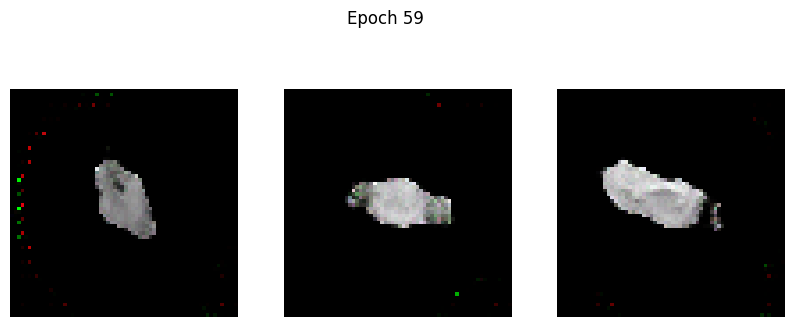

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3344 - g_loss: 1.7453
Epoch 60/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3357 - g_loss: 1.7138

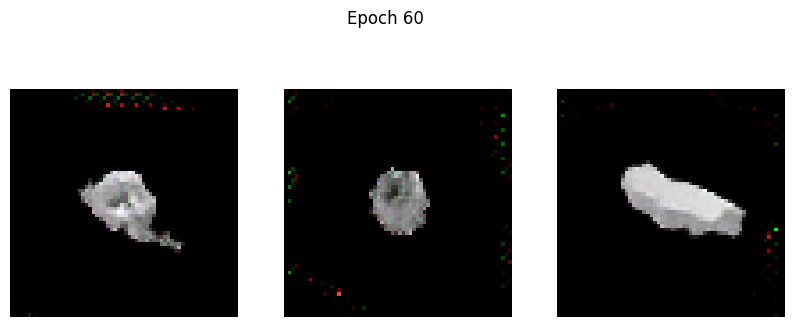

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3361 - g_loss: 1.7140
Epoch 61/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3360 - g_loss: 1.6999

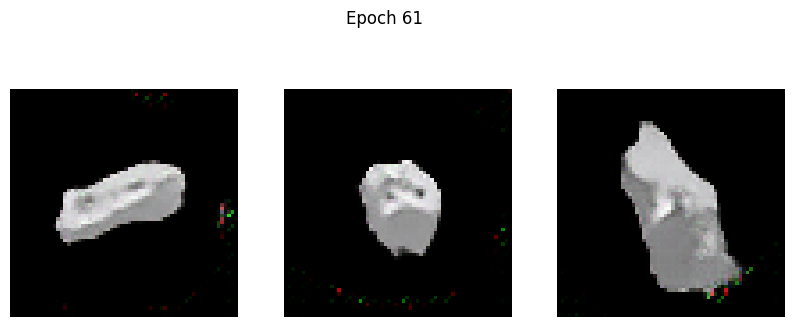

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3359 - g_loss: 1.7002
Epoch 62/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3073 - g_loss: 1.7492

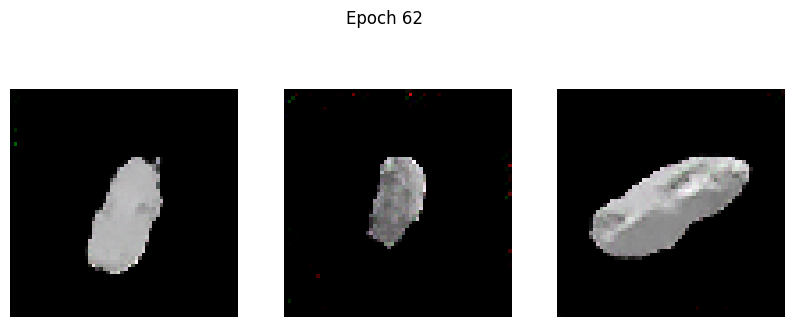

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3075 - g_loss: 1.7495
Epoch 63/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3203 - g_loss: 1.8124

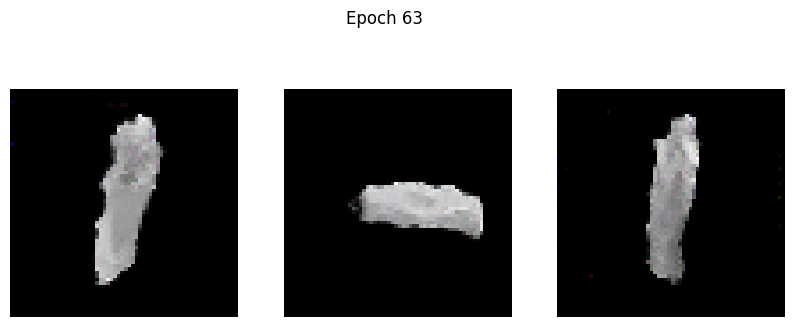

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3202 - g_loss: 1.8124
Epoch 64/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3723 - g_loss: 1.9339

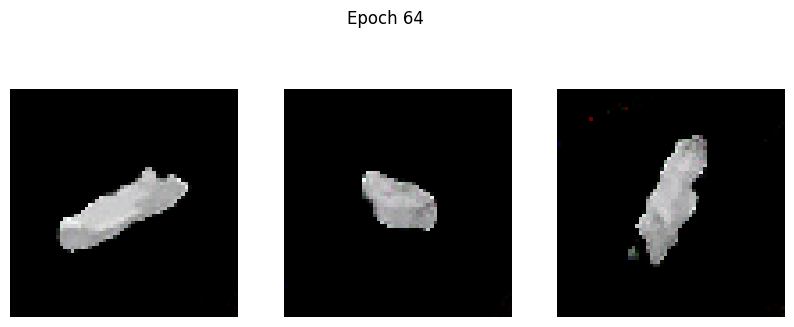

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3719 - g_loss: 1.9333
Epoch 65/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3259 - g_loss: 1.8913

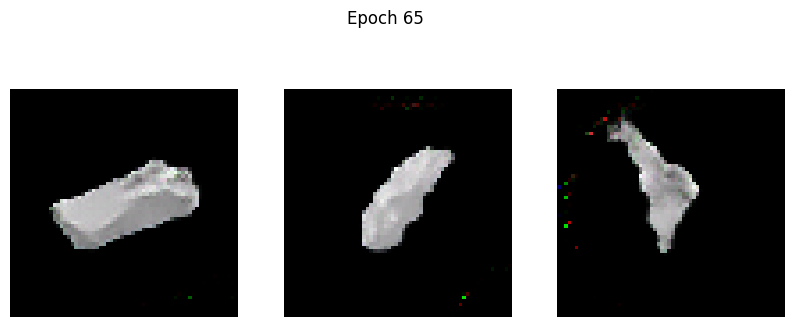

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3258 - g_loss: 1.8913
Epoch 66/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3636 - g_loss: 2.0023

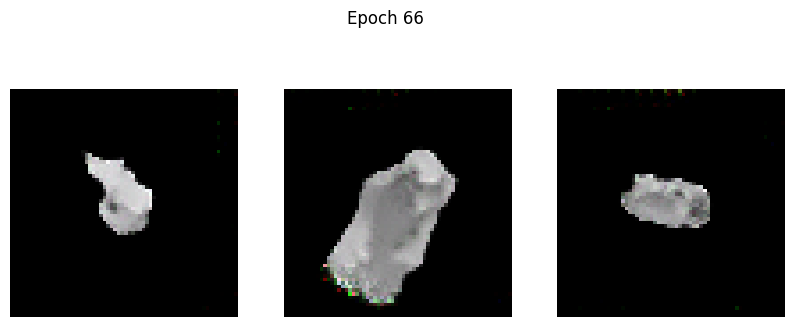

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.3634 - g_loss: 2.0014
Epoch 67/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3015 - g_loss: 1.8491

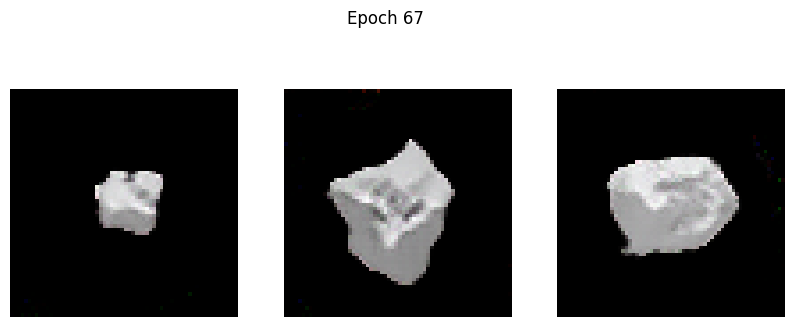

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3016 - g_loss: 1.8493
Epoch 68/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3085 - g_loss: 2.0195

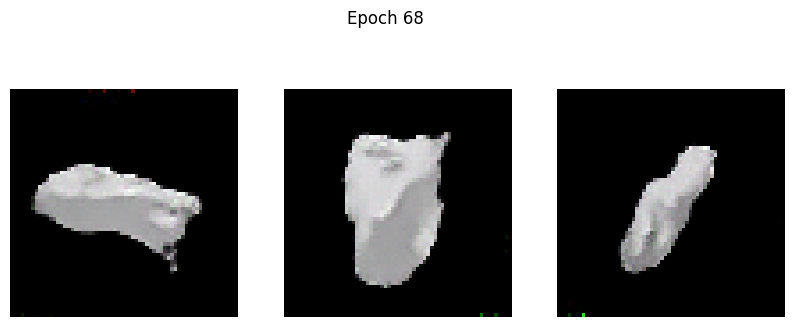

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3088 - g_loss: 2.0192
Epoch 69/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2982 - g_loss: 1.8793

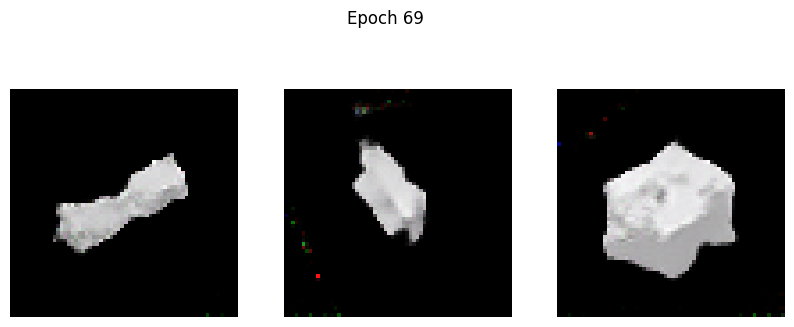

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2980 - g_loss: 1.8794
Epoch 70/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3177 - g_loss: 1.9524

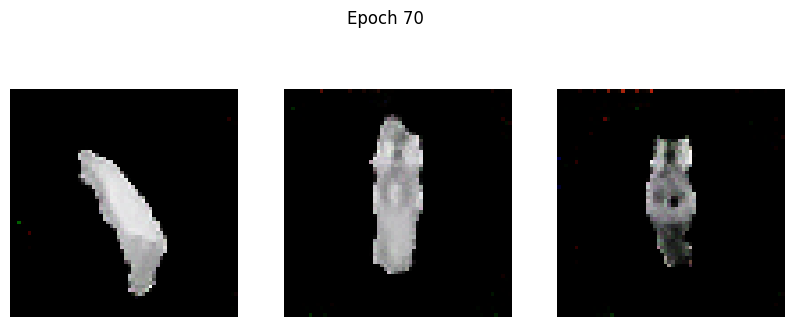

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3178 - g_loss: 1.9523
Epoch 71/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2801 - g_loss: 2.0025

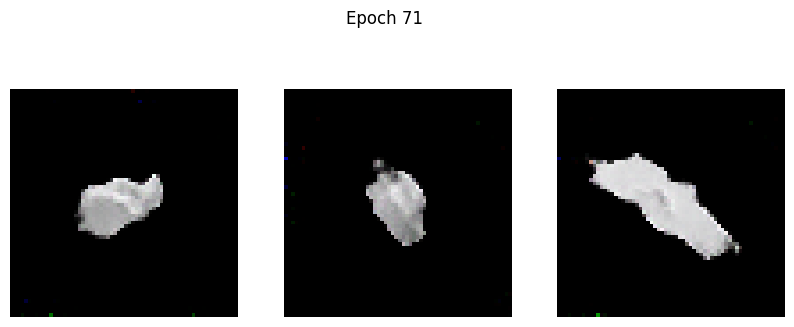

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2802 - g_loss: 2.0023
Epoch 72/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3138 - g_loss: 2.0109

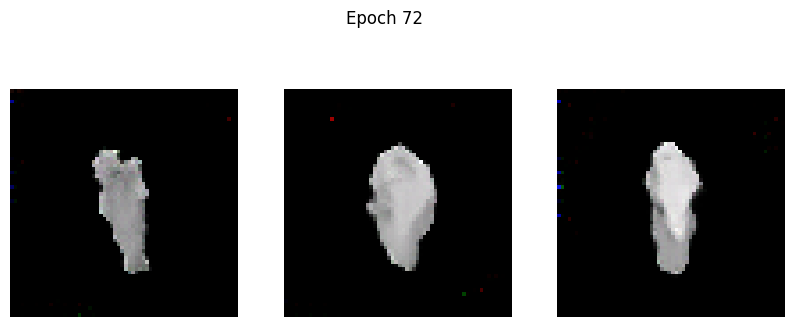

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3146 - g_loss: 2.0117
Epoch 73/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2811 - g_loss: 1.8323

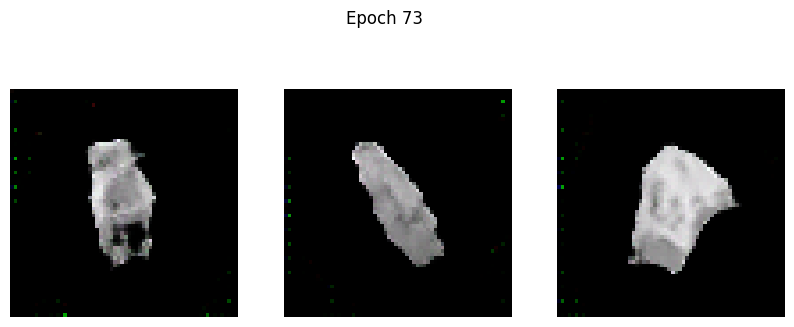

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2811 - g_loss: 1.8329
Epoch 74/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2823 - g_loss: 1.9704

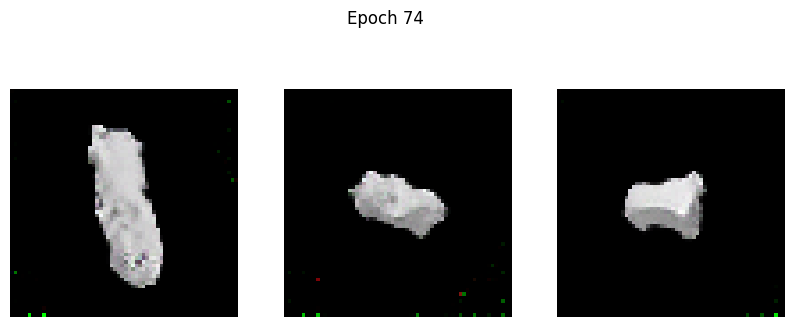

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2823 - g_loss: 1.9704
Epoch 75/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2935 - g_loss: 2.0685

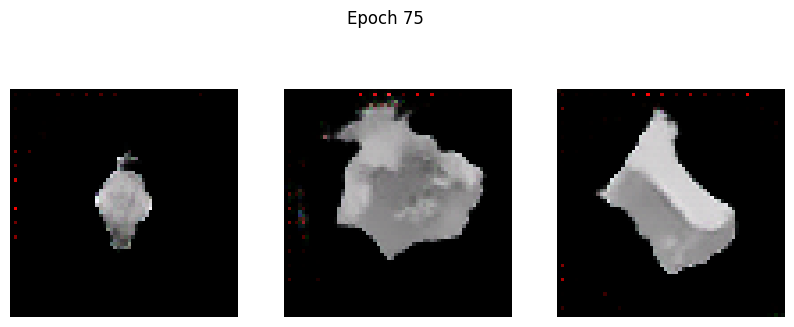

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2936 - g_loss: 2.0685
Epoch 76/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2796 - g_loss: 2.0281

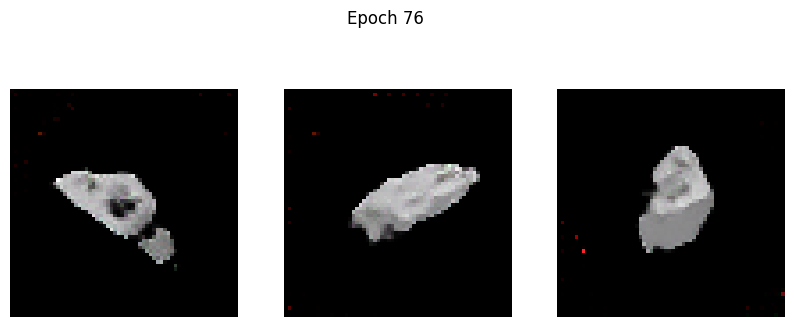

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2797 - g_loss: 2.0281
Epoch 77/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2812 - g_loss: 2.0333

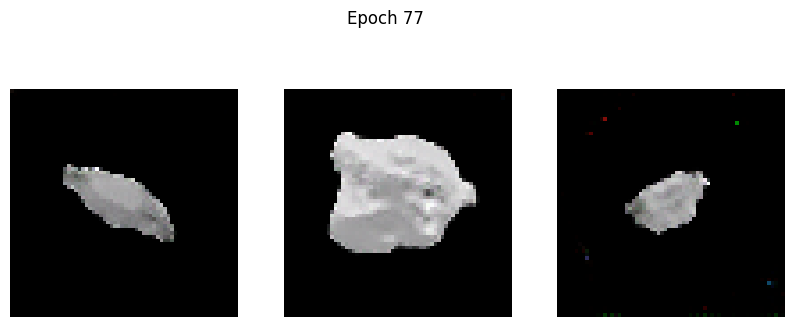

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2812 - g_loss: 2.0333
Epoch 78/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3679 - g_loss: 2.2757

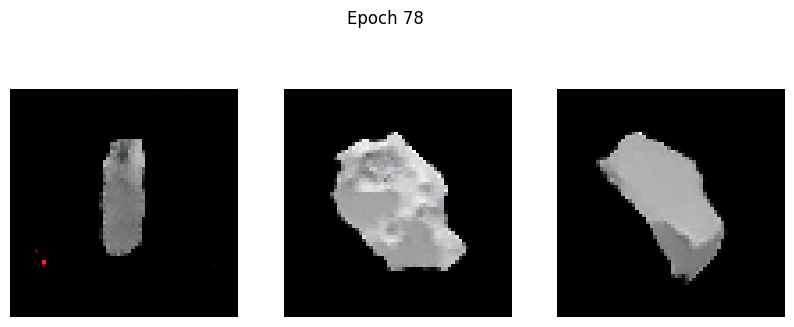

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3679 - g_loss: 2.2752
Epoch 79/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2498 - g_loss: 1.9572

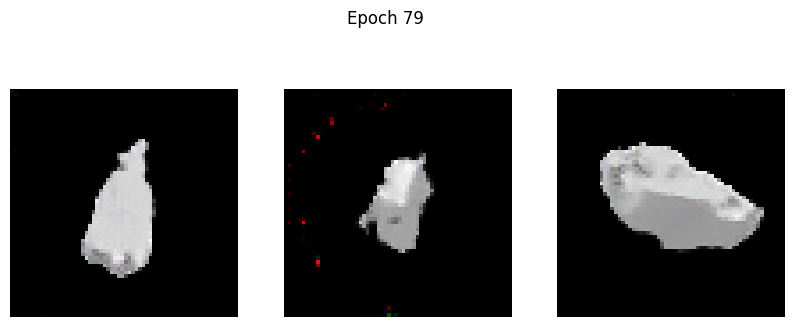

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2499 - g_loss: 1.9576
Epoch 80/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2483 - g_loss: 2.0511

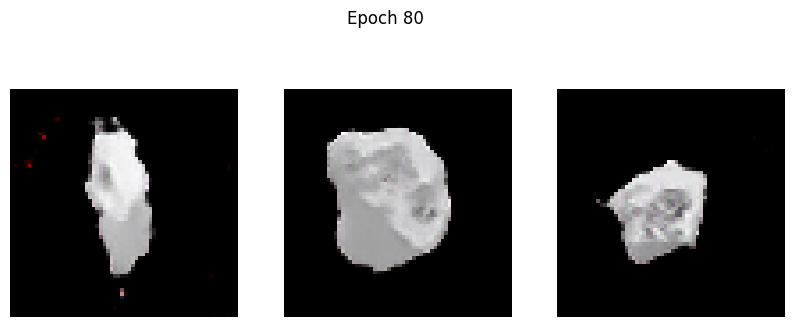

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2485 - g_loss: 2.0516
Epoch 81/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2873 - g_loss: 2.1338

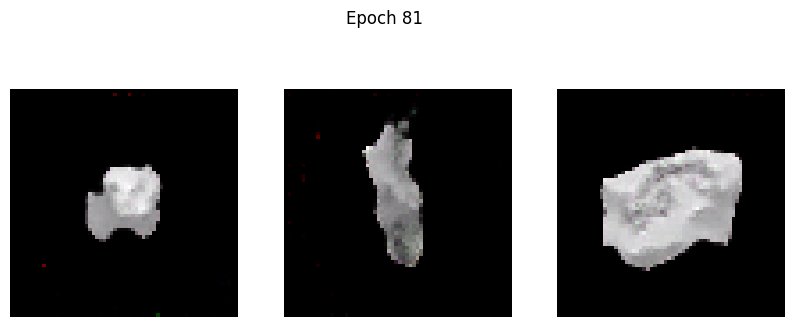

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2872 - g_loss: 2.1336
Epoch 82/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2550 - g_loss: 2.1149

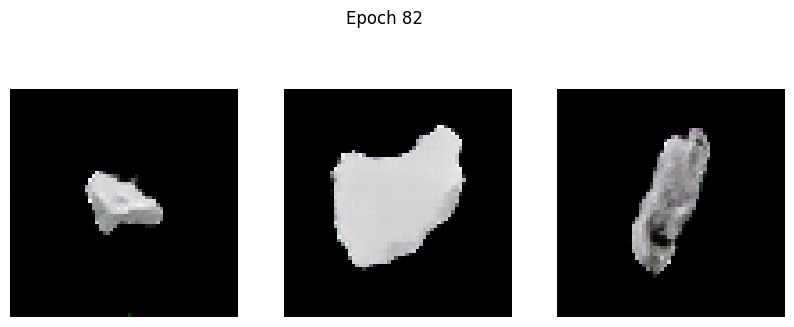

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2551 - g_loss: 2.1152
Epoch 83/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3327 - g_loss: 2.2727

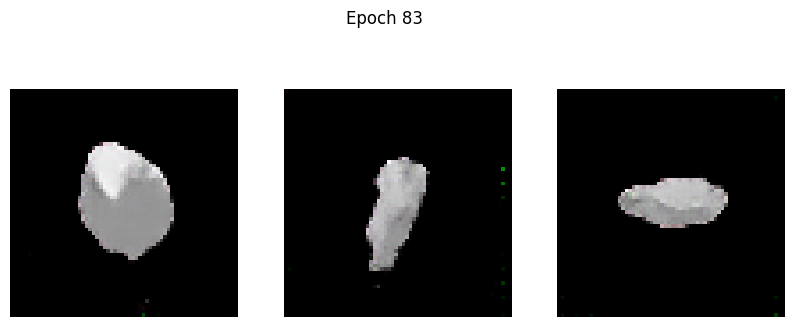

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3325 - g_loss: 2.2723
Epoch 84/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2688 - g_loss: 2.1052

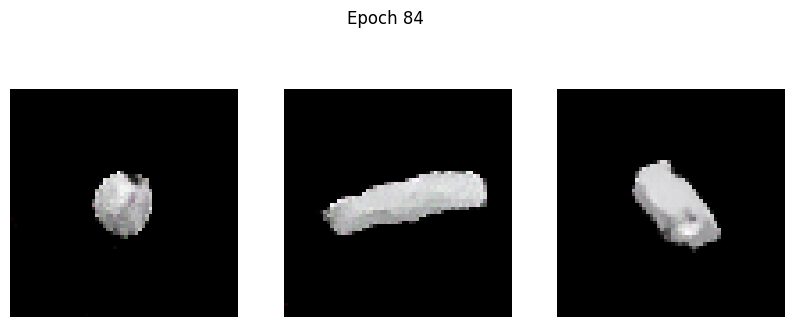

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2688 - g_loss: 2.1057
Epoch 85/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2558 - g_loss: 2.2373

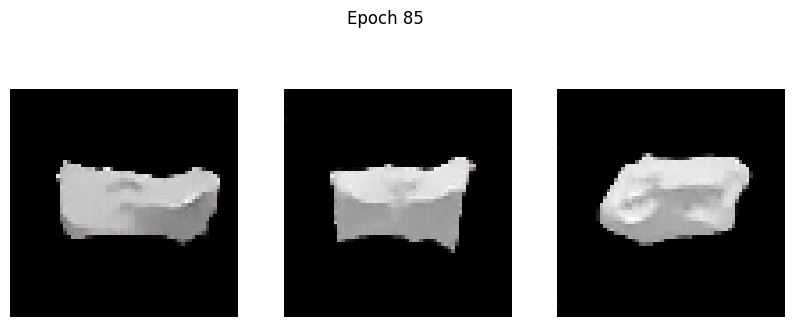

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2557 - g_loss: 2.2366
Epoch 86/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3036 - g_loss: 2.2343

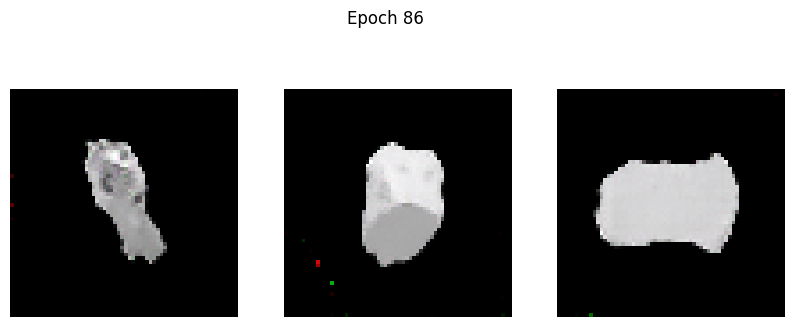

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3034 - g_loss: 2.2340
Epoch 87/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2501 - g_loss: 2.2294

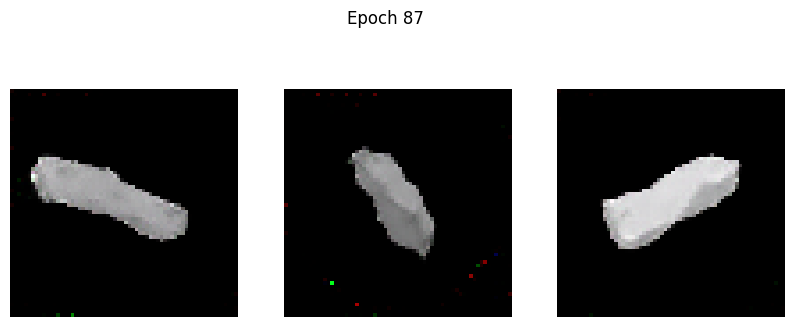

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2506 - g_loss: 2.2296
Epoch 88/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2237 - g_loss: 2.1397

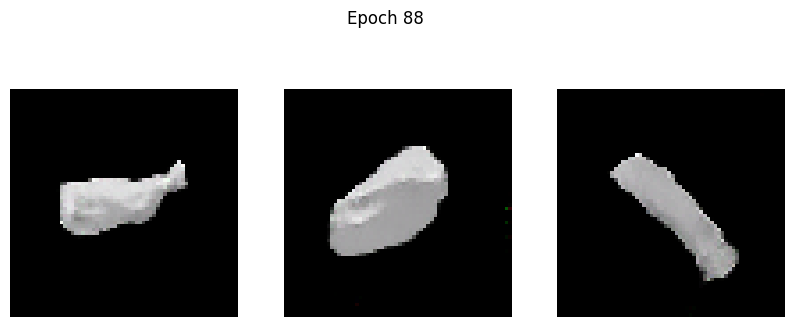

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2239 - g_loss: 2.1398
Epoch 89/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2287 - g_loss: 2.2344

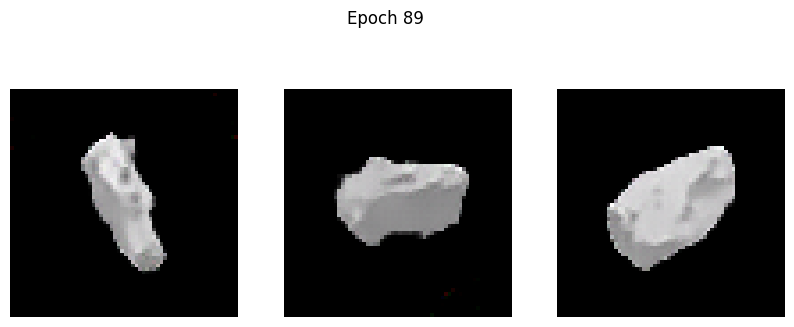

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2287 - g_loss: 2.2344
Epoch 90/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2738 - g_loss: 2.2904

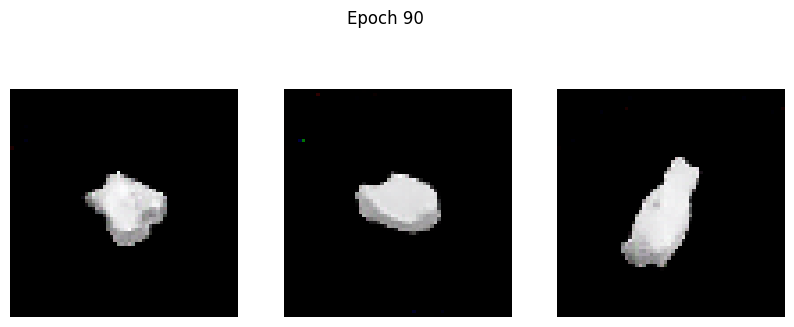

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2739 - g_loss: 2.2902
Epoch 91/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2379 - g_loss: 2.2631

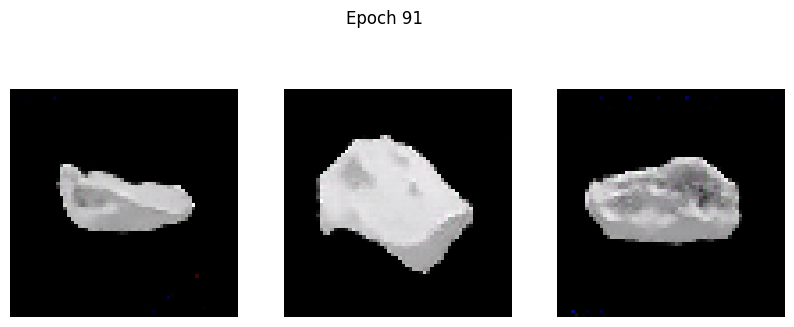

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2379 - g_loss: 2.2632
Epoch 92/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4270 - g_loss: 2.6193

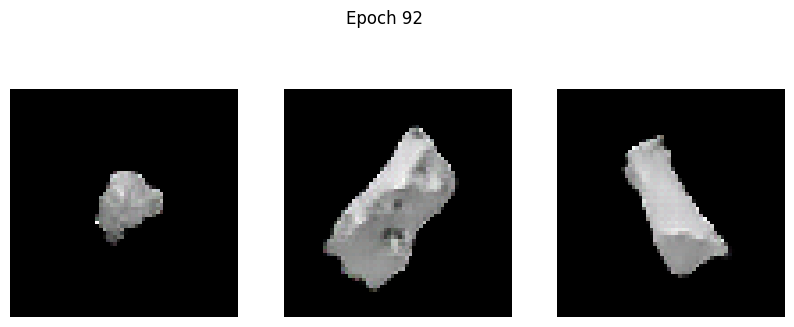

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4282 - g_loss: 2.6206
Epoch 93/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2724 - g_loss: 1.9554

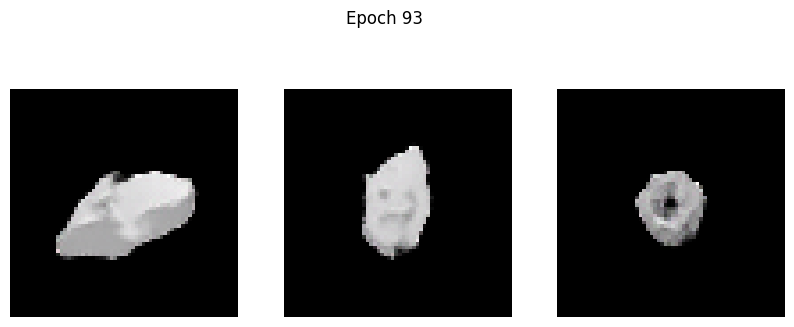

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2723 - g_loss: 1.9558
Epoch 94/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2302 - g_loss: 2.1419

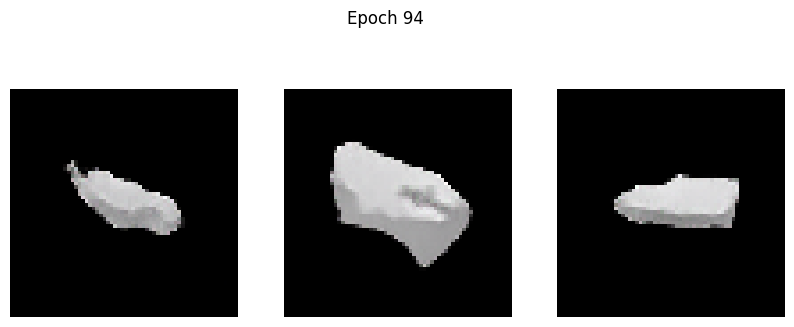

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2302 - g_loss: 2.1421
Epoch 95/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2122 - g_loss: 2.2758

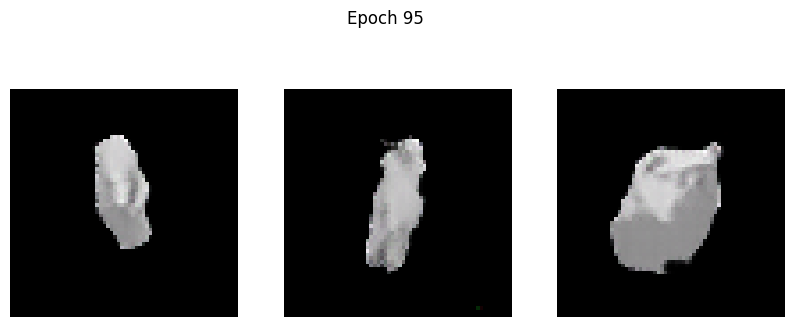

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2123 - g_loss: 2.2756
Epoch 96/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2226 - g_loss: 2.2725

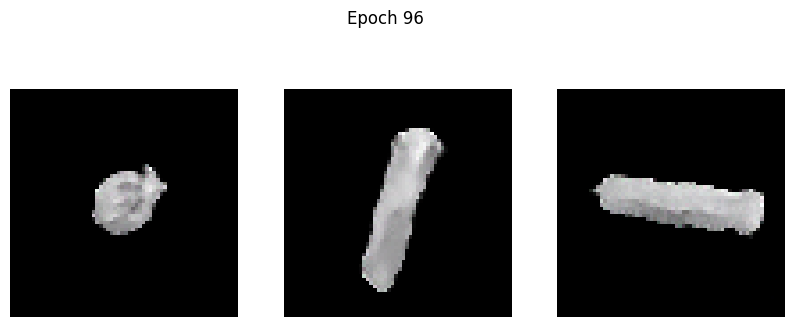

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2227 - g_loss: 2.2725
Epoch 97/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2501 - g_loss: 2.3317

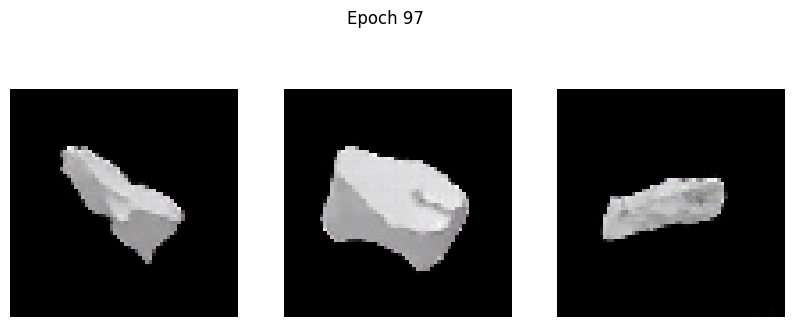

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2499 - g_loss: 2.3317
Epoch 98/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2424 - g_loss: 2.4470

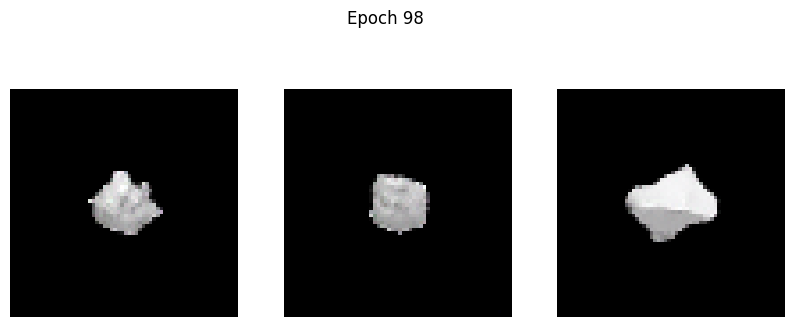

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2424 - g_loss: 2.4464
Epoch 99/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5881 - g_loss: 2.8546

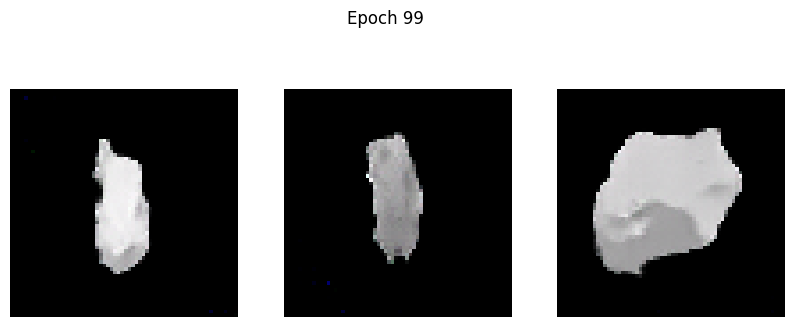

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5865 - g_loss: 2.8509
Epoch 100/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1956 - g_loss: 2.2150

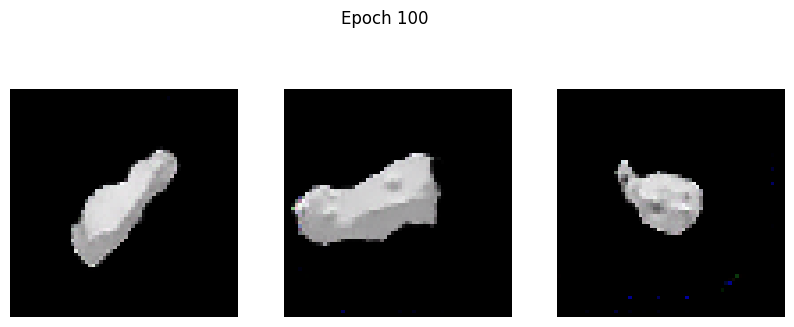

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1957 - g_loss: 2.2151
Epoch 101/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2491 - g_loss: 2.3401

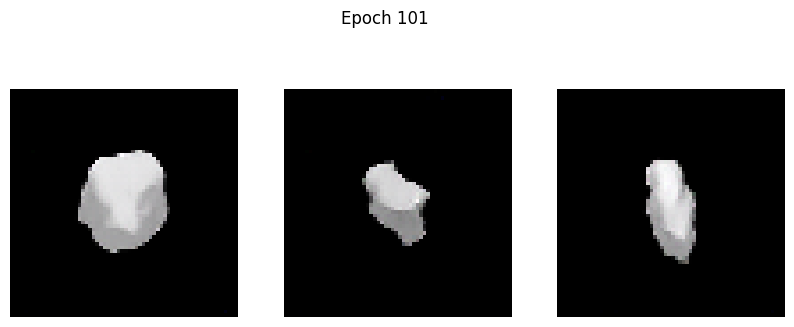

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2489 - g_loss: 2.3400
Epoch 102/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2339 - g_loss: 2.3778

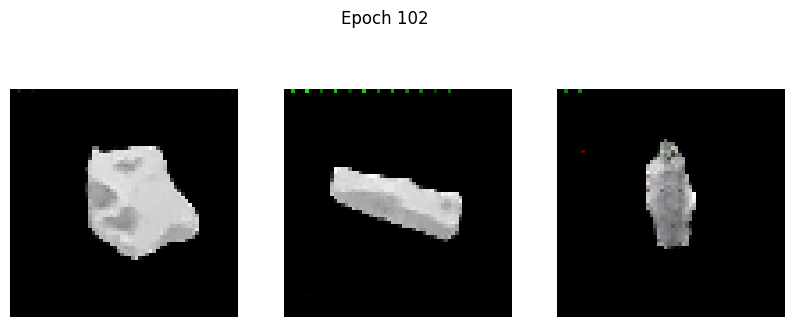

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2341 - g_loss: 2.3780
Epoch 103/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2548 - g_loss: 2.3970

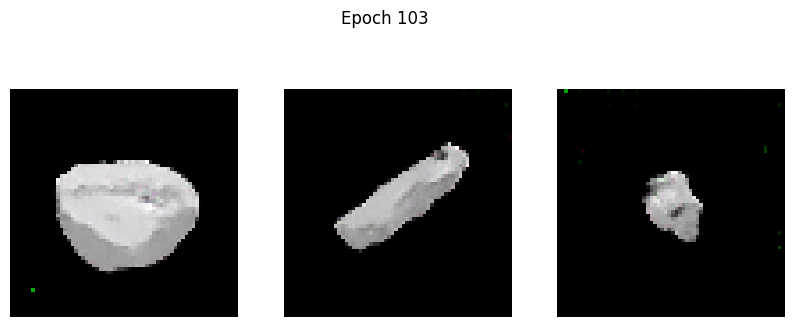

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2549 - g_loss: 2.3970
Epoch 104/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2342 - g_loss: 2.3654

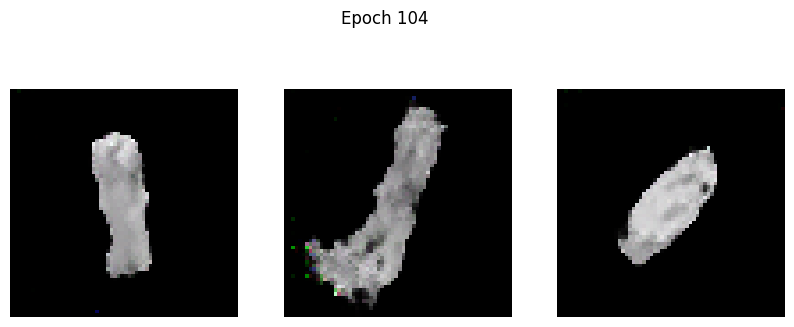

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2341 - g_loss: 2.3655
Epoch 105/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2368 - g_loss: 2.4476

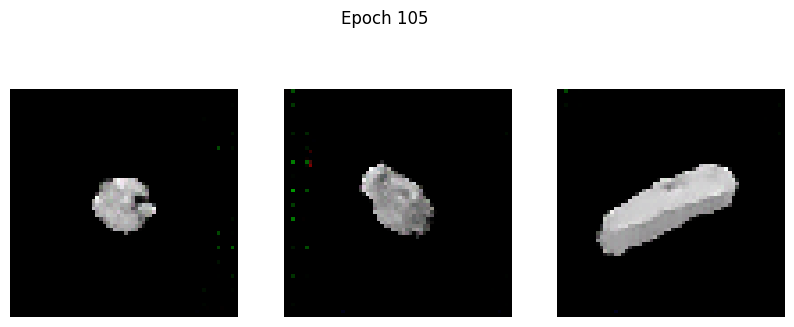

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2368 - g_loss: 2.4475
Epoch 106/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2076 - g_loss: 2.4062

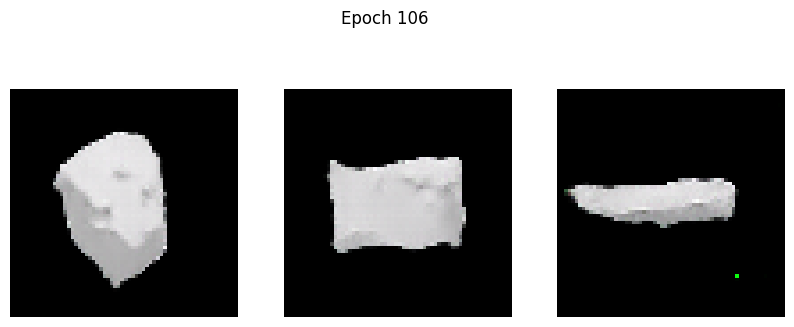

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2078 - g_loss: 2.4066
Epoch 107/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1929 - g_loss: 2.4070

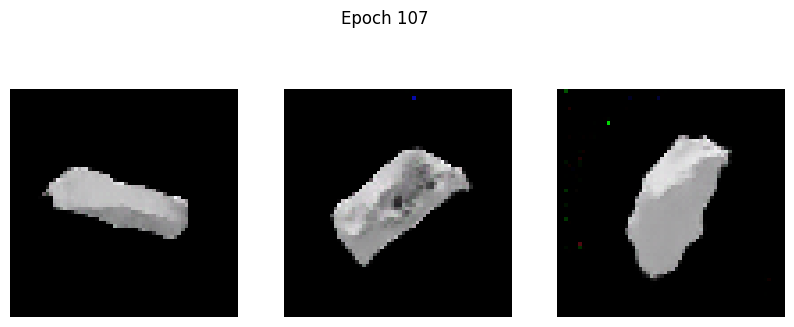

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1932 - g_loss: 2.4075
Epoch 108/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2785 - g_loss: 2.5030

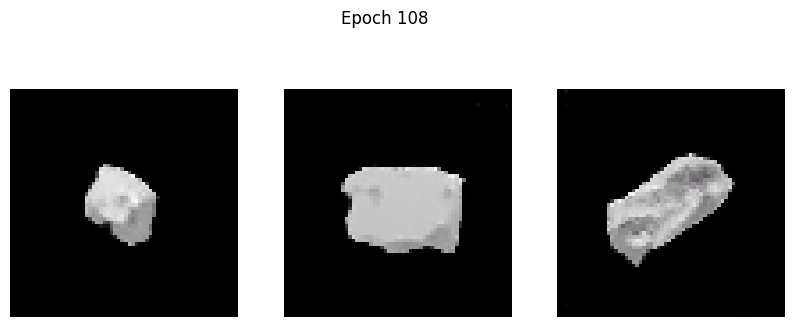

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2782 - g_loss: 2.5026
Epoch 109/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2002 - g_loss: 2.4314

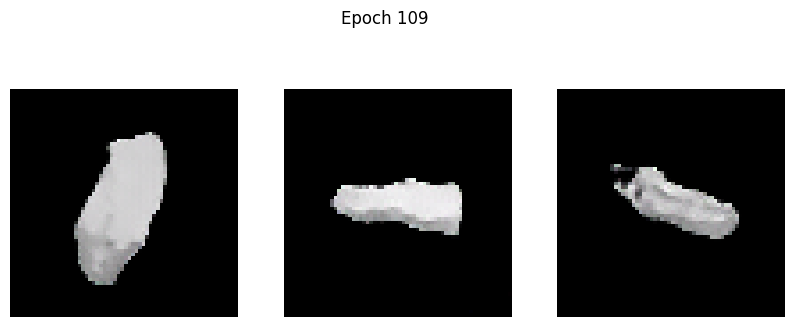

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2004 - g_loss: 2.4320
Epoch 110/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2809 - g_loss: 2.6203

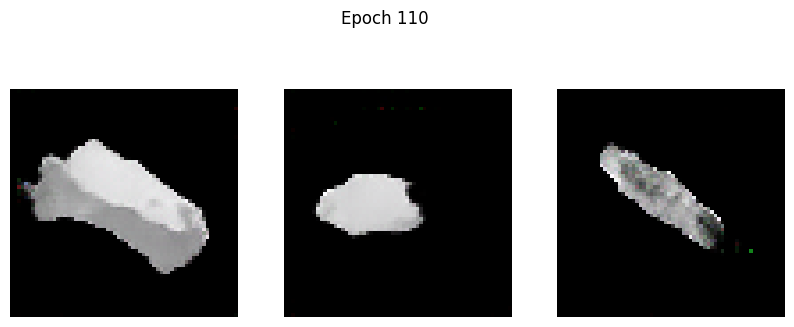

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2819 - g_loss: 2.6219
Epoch 111/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2098 - g_loss: 2.3042

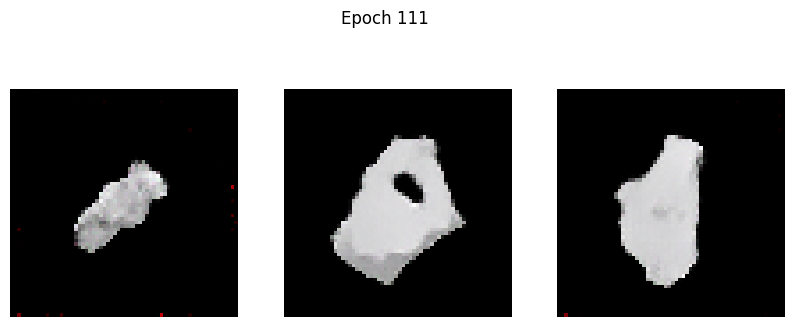

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2097 - g_loss: 2.3043
Epoch 112/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2203 - g_loss: 2.4720

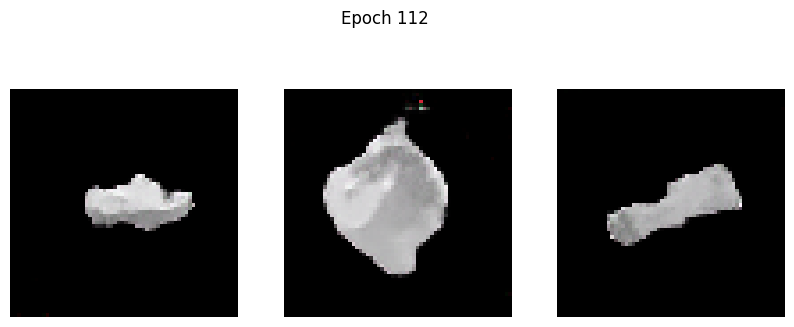

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2203 - g_loss: 2.4720
Epoch 113/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2134 - g_loss: 2.4635

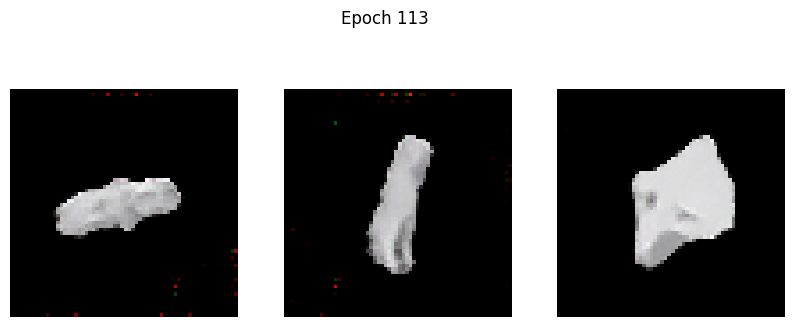

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2136 - g_loss: 2.4636
Epoch 114/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2002 - g_loss: 2.3869

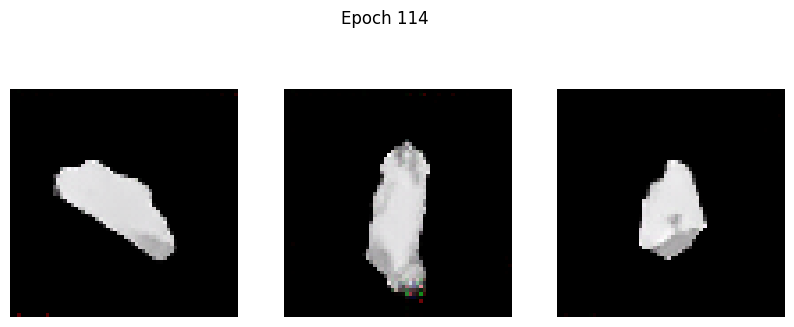

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2003 - g_loss: 2.3873
Epoch 115/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2210 - g_loss: 2.5518

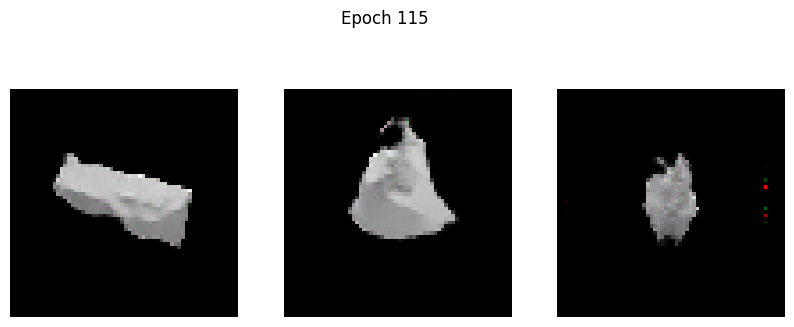

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2211 - g_loss: 2.5519
Epoch 116/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2081 - g_loss: 2.4926

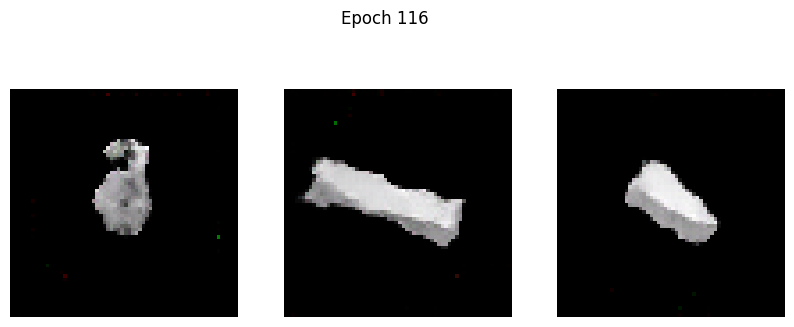

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2087 - g_loss: 2.4940
Epoch 117/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2483 - g_loss: 2.6079

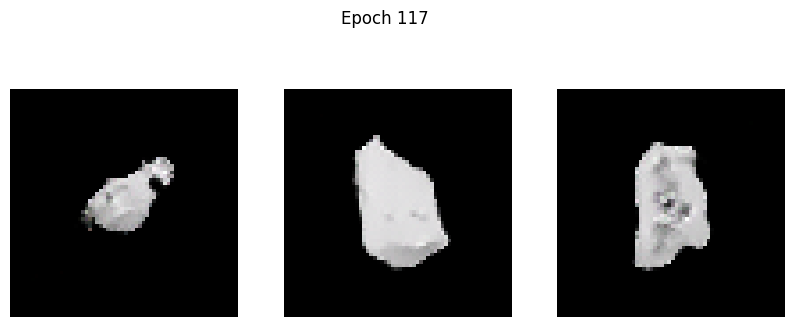

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2480 - g_loss: 2.6070
Epoch 118/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2220 - g_loss: 2.5370

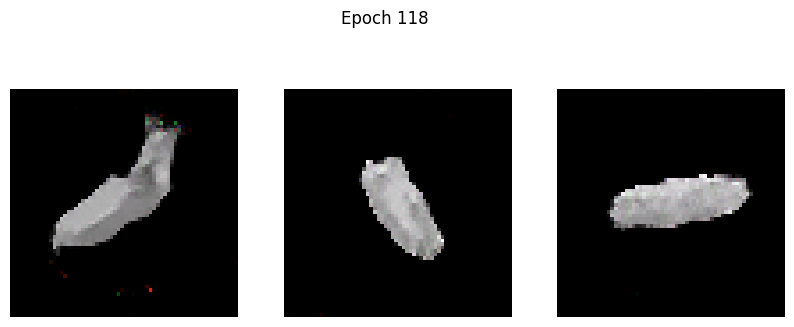

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2219 - g_loss: 2.5369
Epoch 119/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2074 - g_loss: 2.5858

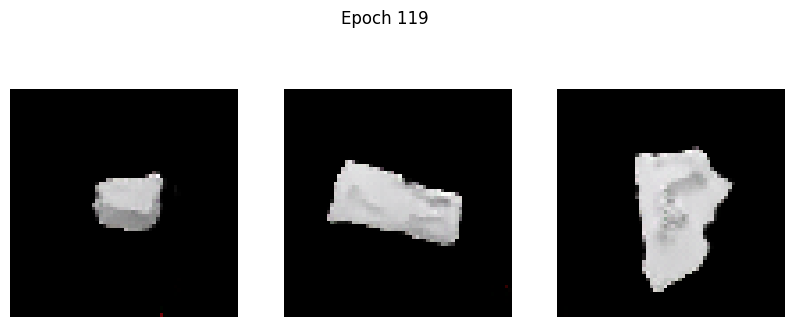

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2078 - g_loss: 2.5859
Epoch 120/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2091 - g_loss: 2.4475

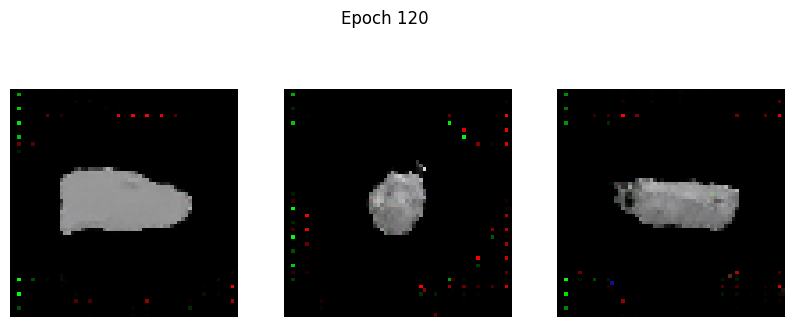

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2093 - g_loss: 2.4482
Epoch 121/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2383 - g_loss: 2.5910

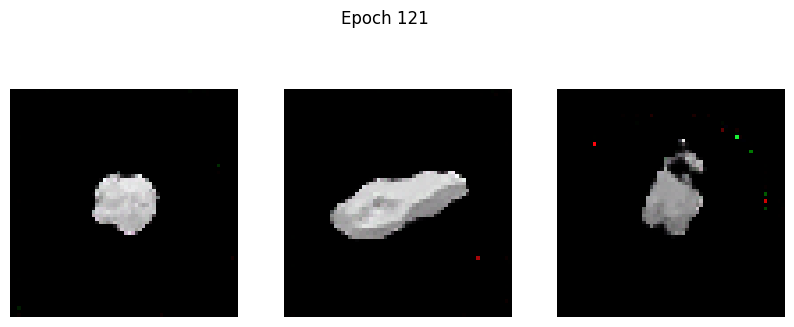

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2380 - g_loss: 2.5905
Epoch 122/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3295 - g_loss: 2.6800

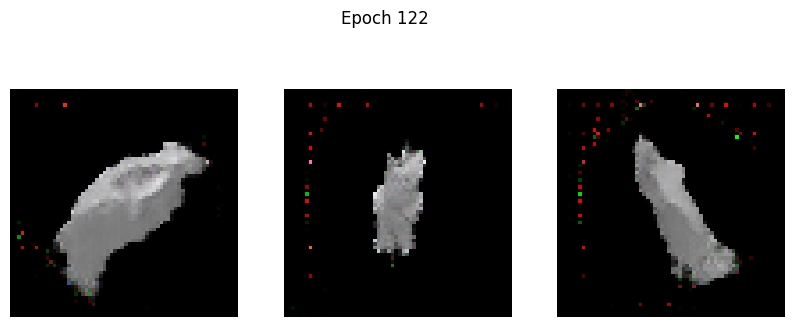

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3318 - g_loss: 2.6814
Epoch 123/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2487 - g_loss: 2.2011

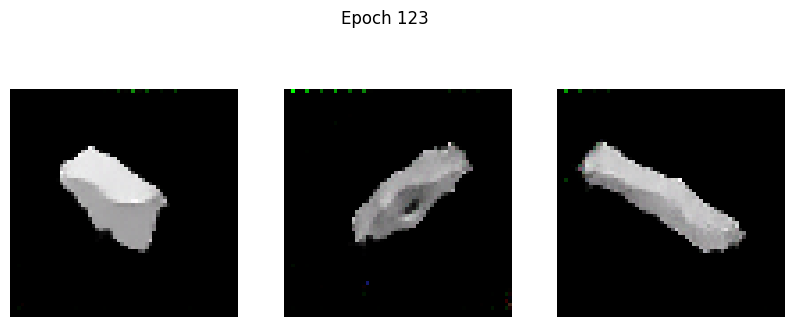

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2485 - g_loss: 2.2017
Epoch 124/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1800 - g_loss: 2.4050

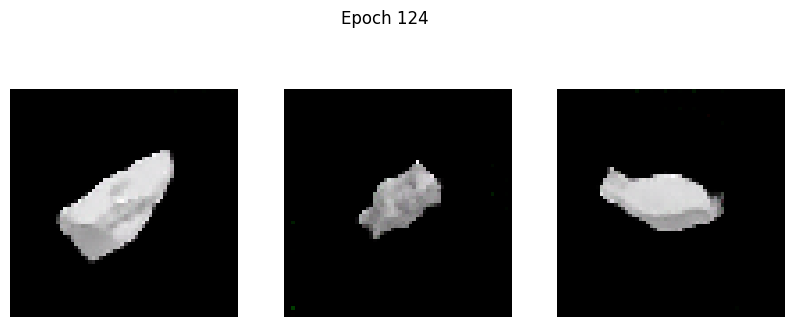

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1801 - g_loss: 2.4051
Epoch 125/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2045 - g_loss: 2.5299

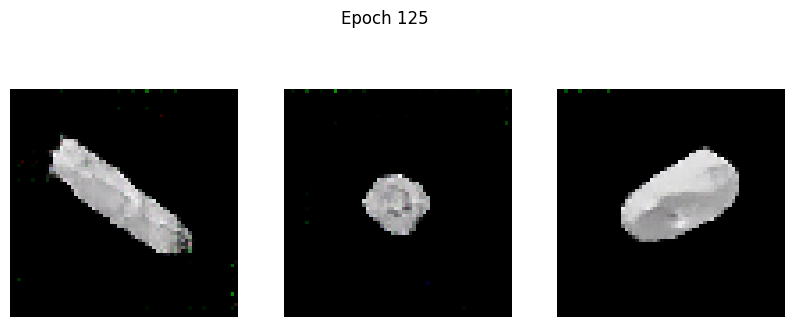

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2044 - g_loss: 2.5296
Epoch 126/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1744 - g_loss: 2.5083

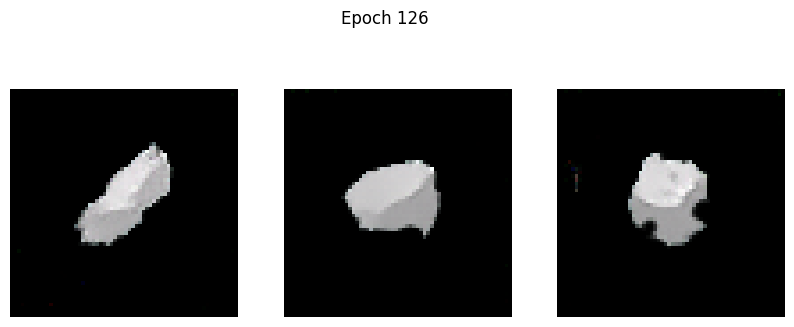

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1745 - g_loss: 2.5087
Epoch 127/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2855 - g_loss: 2.6623

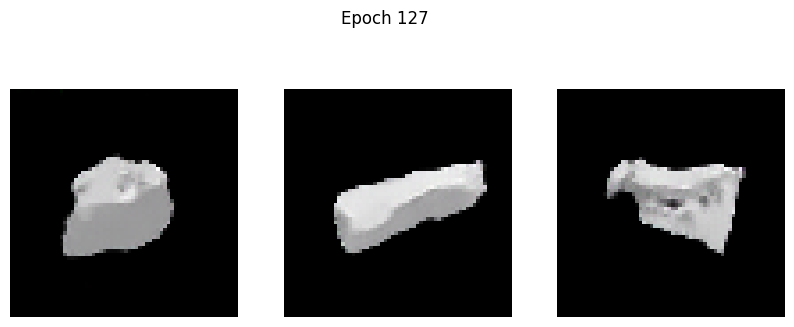

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2851 - g_loss: 2.6621
Epoch 128/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1730 - g_loss: 2.5900

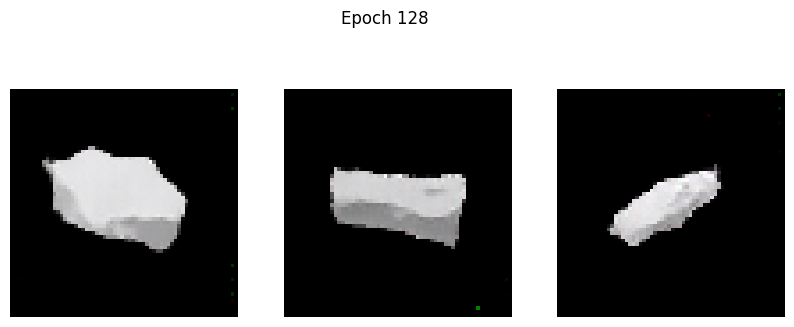

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1730 - g_loss: 2.5901
Epoch 129/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1856 - g_loss: 2.6515

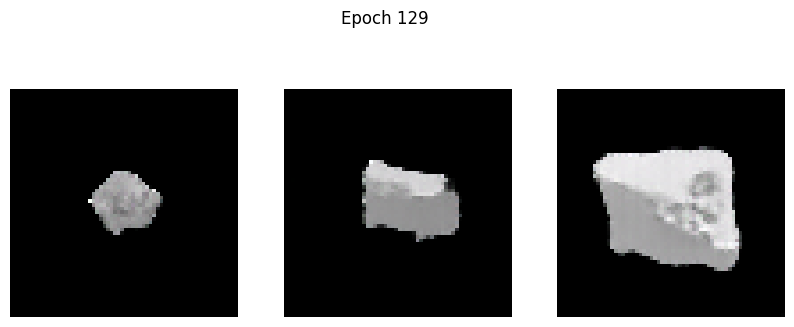

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1856 - g_loss: 2.6513
Epoch 130/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2308 - g_loss: 2.6709

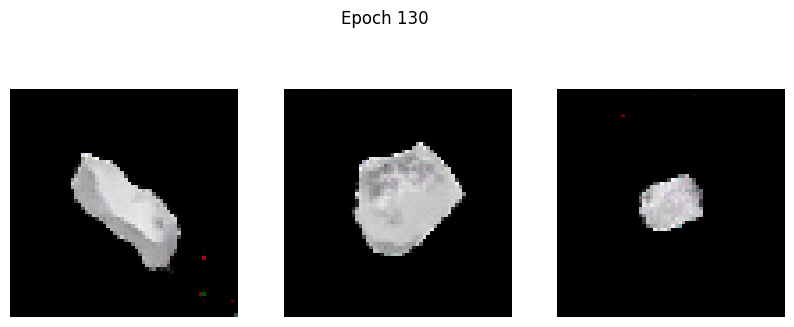

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2324 - g_loss: 2.6734
Epoch 131/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2880 - g_loss: 2.6378

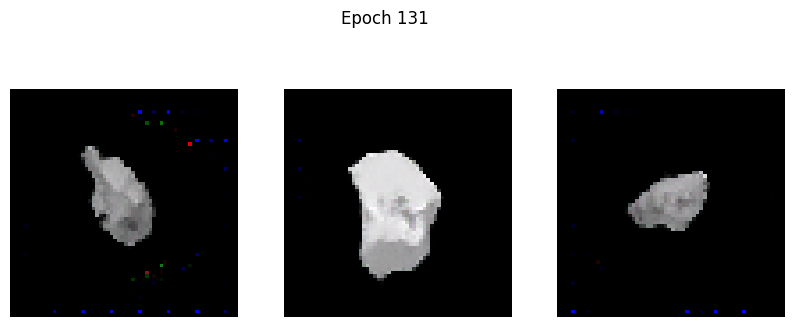

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2873 - g_loss: 2.6371
Epoch 132/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1689 - g_loss: 2.5329

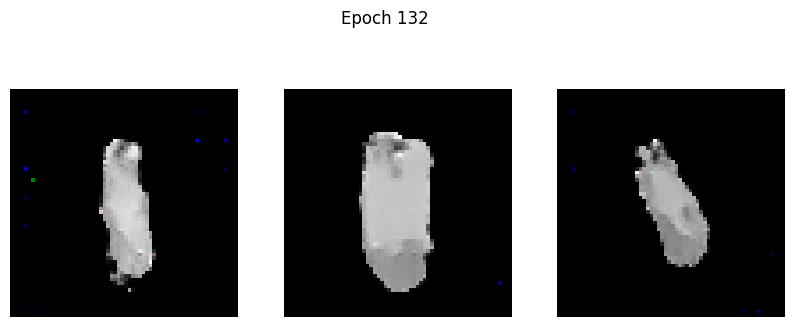

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1689 - g_loss: 2.5330
Epoch 133/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2299 - g_loss: 2.8030

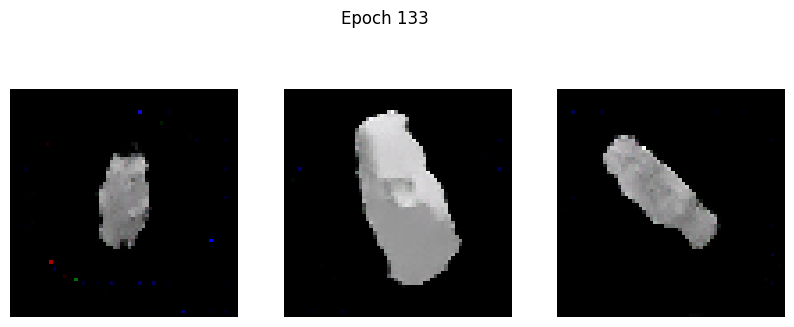

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2297 - g_loss: 2.8017
Epoch 134/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1770 - g_loss: 2.6241

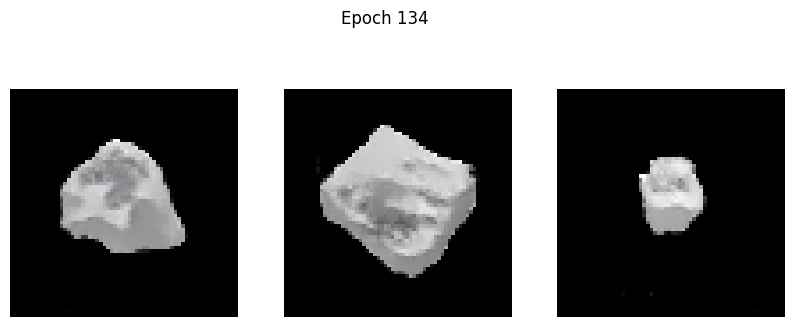

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1771 - g_loss: 2.6241
Epoch 135/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1598 - g_loss: 2.6872

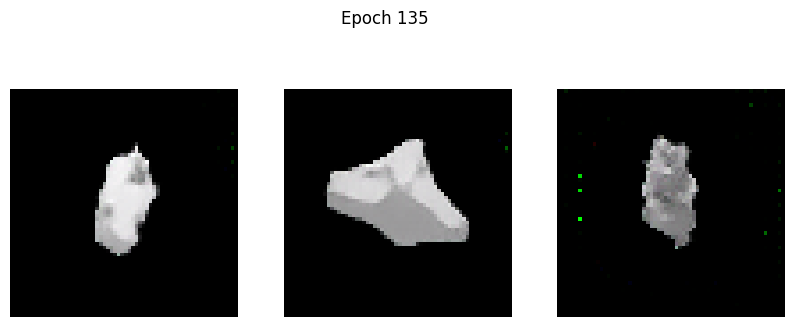

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1598 - g_loss: 2.6872
Epoch 136/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2567 - g_loss: 2.8411

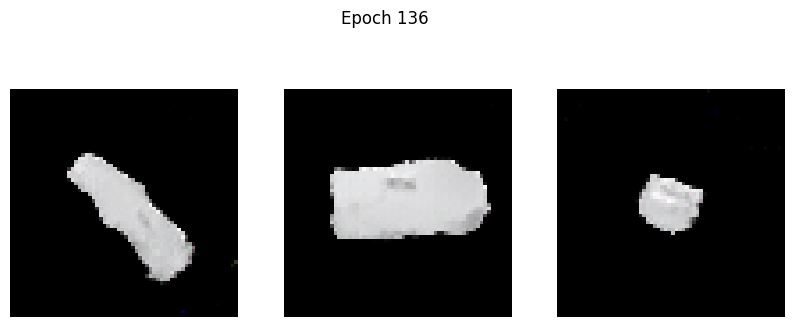

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2569 - g_loss: 2.8406
Epoch 137/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1967 - g_loss: 2.7224

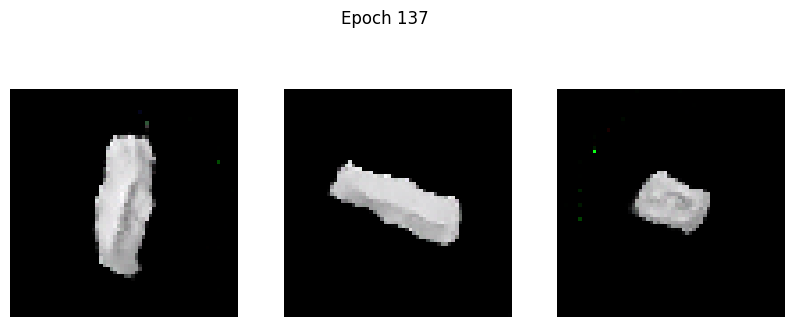

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1968 - g_loss: 2.7224
Epoch 138/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1976 - g_loss: 2.7088

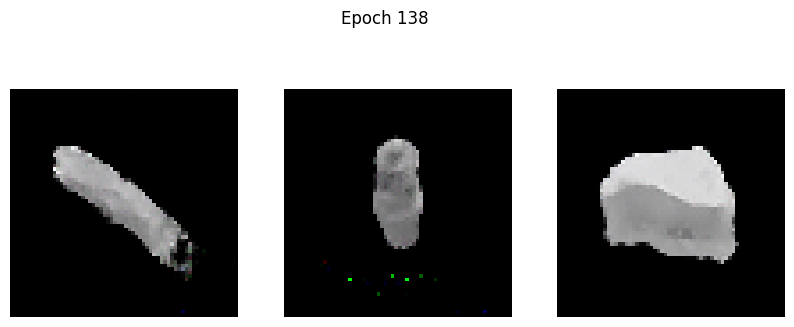

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1977 - g_loss: 2.7089
Epoch 139/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1649 - g_loss: 2.6760

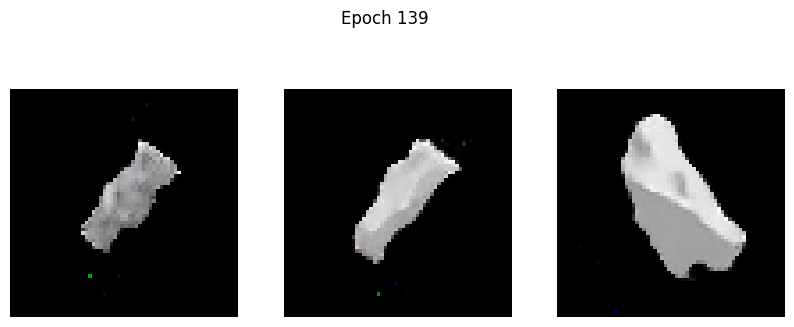

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1649 - g_loss: 2.6766
Epoch 140/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1888 - g_loss: 2.8502

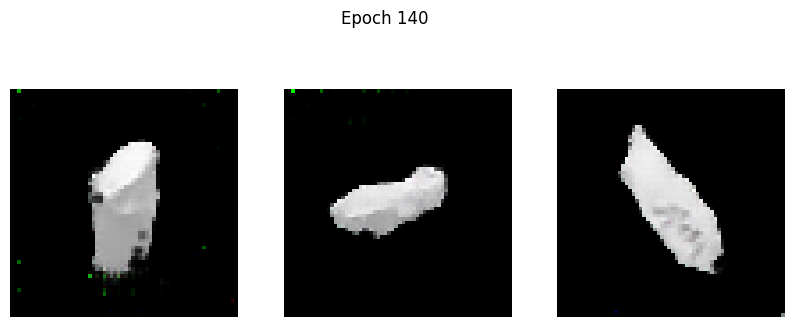

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1889 - g_loss: 2.8503
Epoch 141/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2512 - g_loss: 2.9399

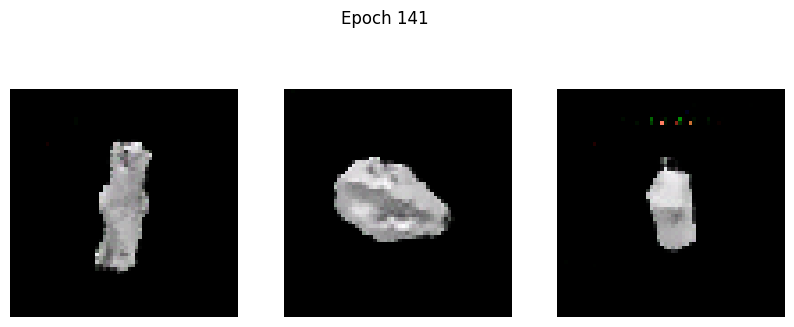

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2509 - g_loss: 2.9391
Epoch 142/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1792 - g_loss: 2.8004

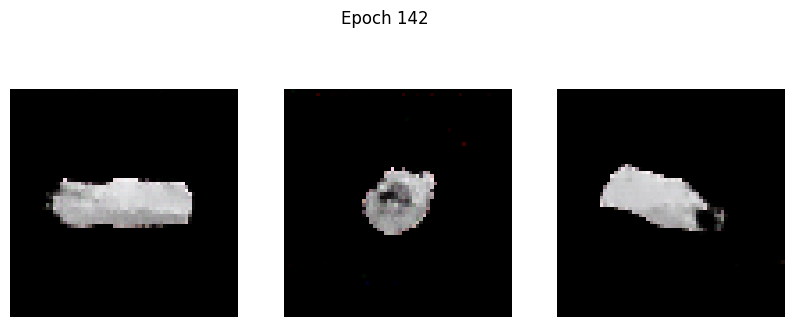

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1794 - g_loss: 2.8011
Epoch 143/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2323 - g_loss: 2.8610

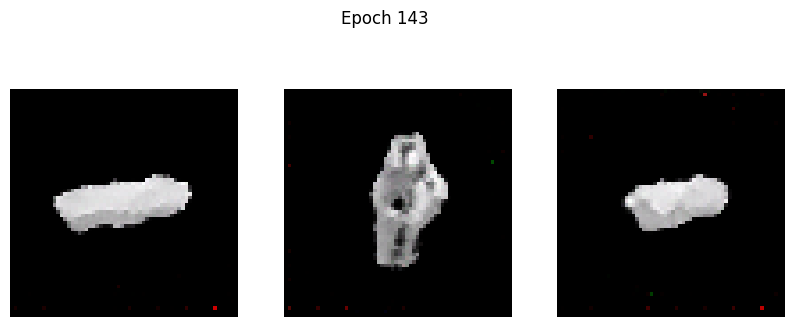

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2321 - g_loss: 2.8606
Epoch 144/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1433 - g_loss: 2.7401

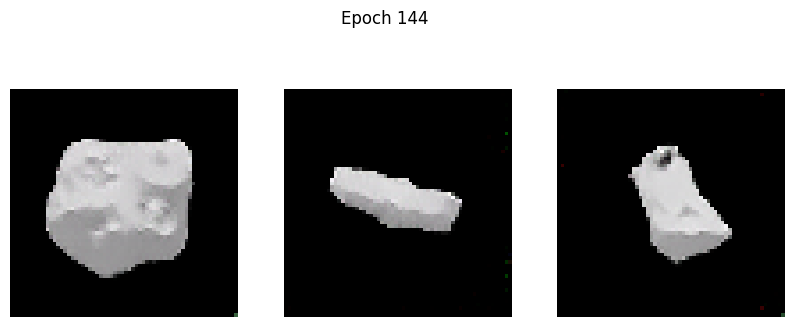

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1435 - g_loss: 2.7408
Epoch 145/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1782 - g_loss: 2.7939

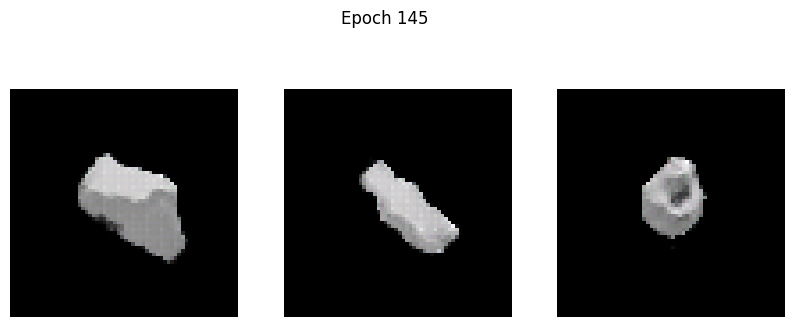

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1794 - g_loss: 2.7960
Epoch 146/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2159 - g_loss: 2.6993

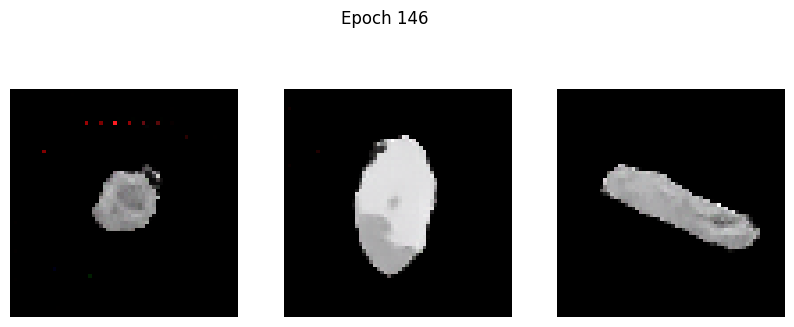

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2155 - g_loss: 2.6993
Epoch 147/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1404 - g_loss: 2.8069

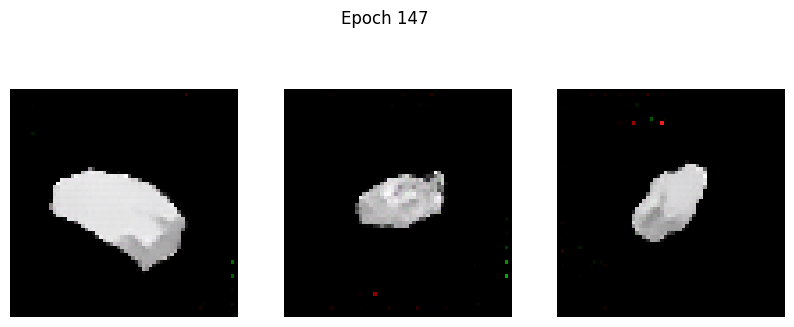

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1404 - g_loss: 2.8067
Epoch 148/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1543 - g_loss: 2.8252

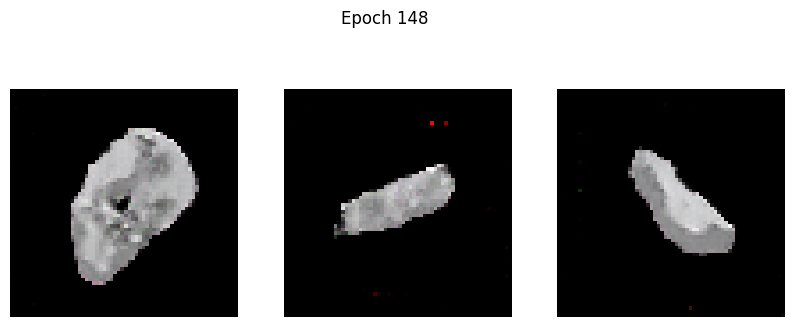

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1546 - g_loss: 2.8253
Epoch 149/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5892 - g_loss: 3.3499

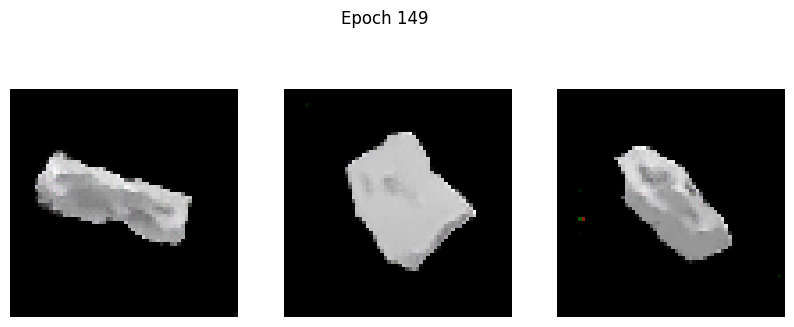

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5871 - g_loss: 3.3459
Epoch 150/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1494 - g_loss: 2.6855

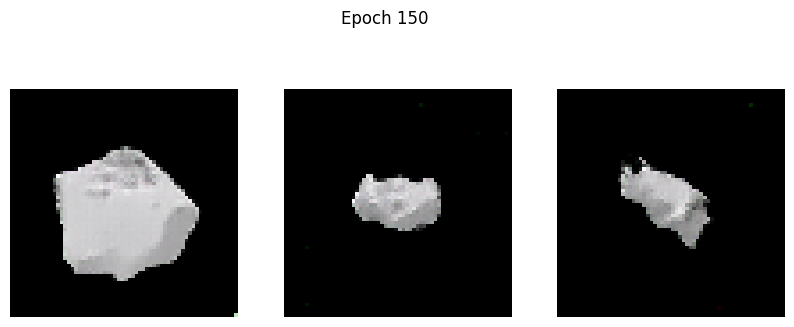

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1495 - g_loss: 2.6857
Epoch 151/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1629 - g_loss: 2.6845

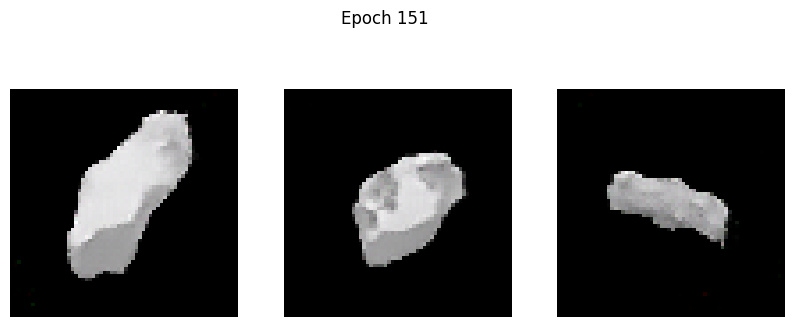

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1628 - g_loss: 2.6851
Epoch 152/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1469 - g_loss: 2.9251

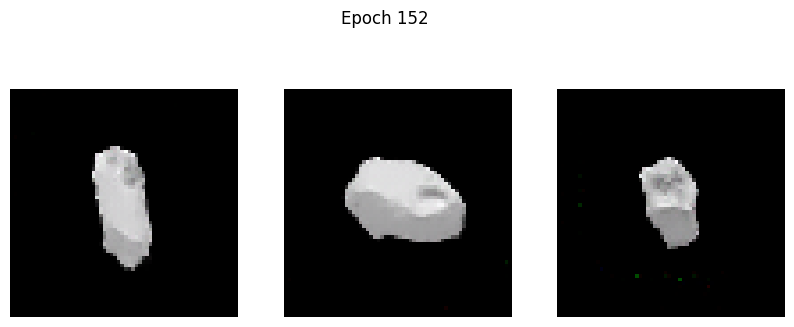

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1472 - g_loss: 2.9252
Epoch 153/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3478 - g_loss: 2.8892

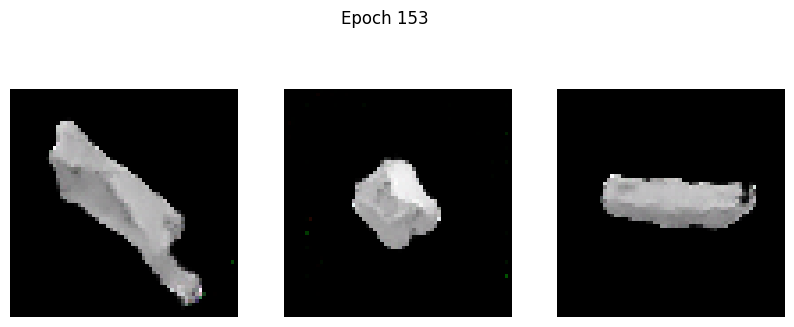

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3466 - g_loss: 2.8886
Epoch 154/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1514 - g_loss: 2.8128

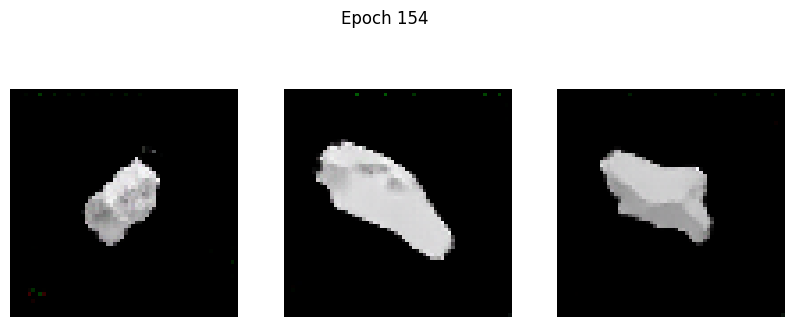

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1515 - g_loss: 2.8129
Epoch 155/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2028 - g_loss: 2.9796

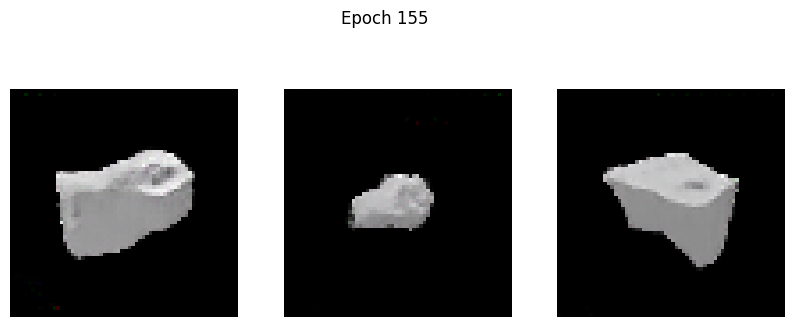

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2029 - g_loss: 2.9797
Epoch 156/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1710 - g_loss: 2.8568

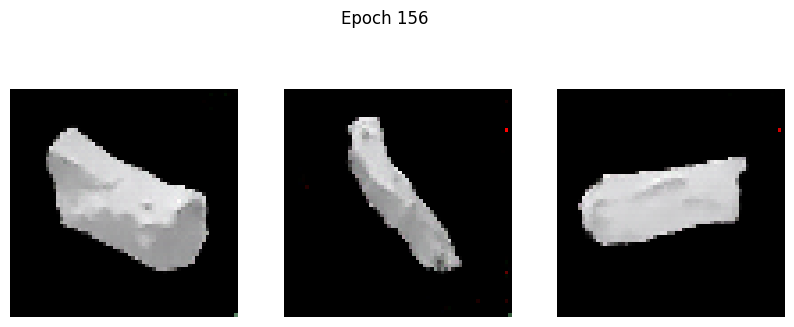

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1714 - g_loss: 2.8572
Epoch 157/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1739 - g_loss: 2.8987

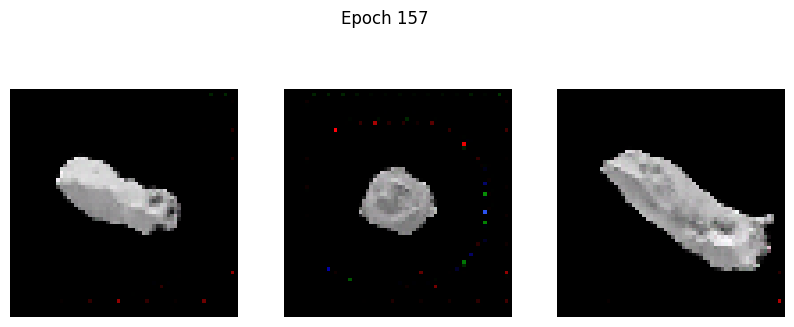

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1740 - g_loss: 2.8989
Epoch 158/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1396 - g_loss: 2.8889

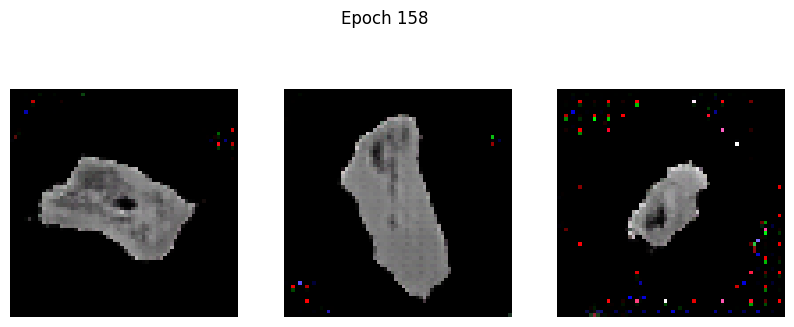

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1413 - g_loss: 2.8912
Epoch 159/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.7327 - g_loss: 3.6097

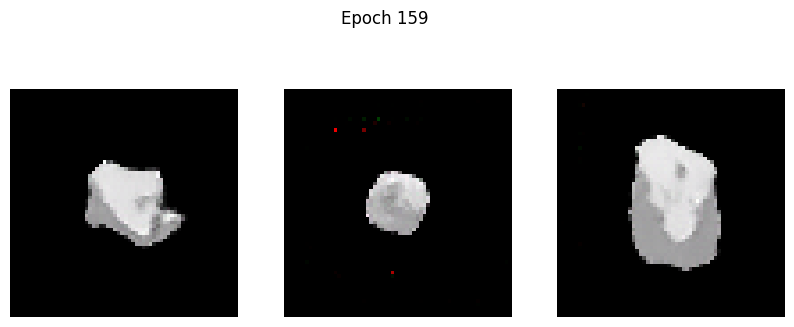

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.7291 - g_loss: 3.6023
Epoch 160/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1571 - g_loss: 2.7759

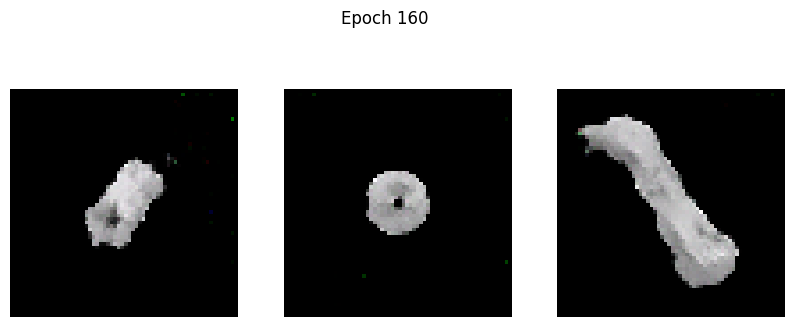

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1571 - g_loss: 2.7757
Epoch 161/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1507 - g_loss: 2.8401

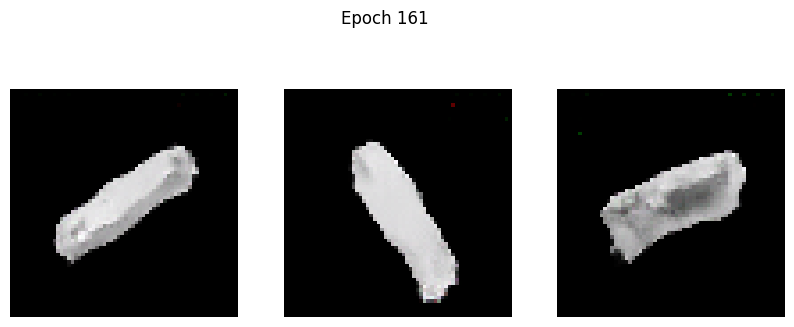

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1507 - g_loss: 2.8399
Epoch 162/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1273 - g_loss: 2.8942

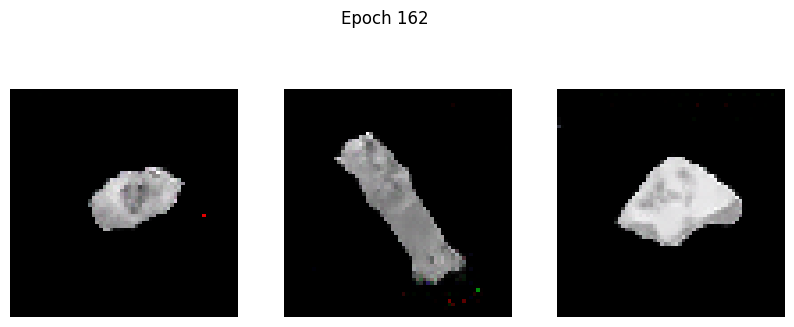

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1274 - g_loss: 2.8940
Epoch 163/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1538 - g_loss: 3.0061

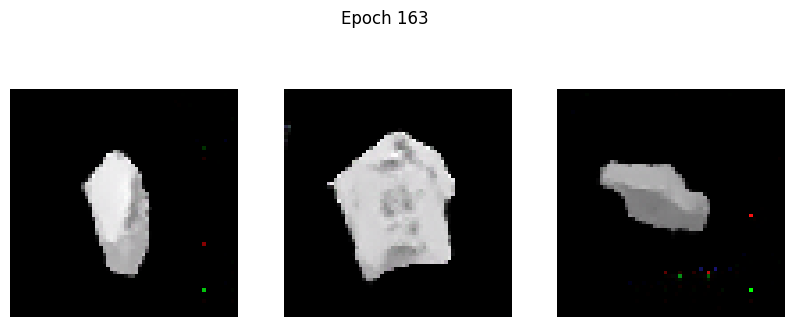

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1538 - g_loss: 3.0056
Epoch 164/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2252 - g_loss: 3.1275

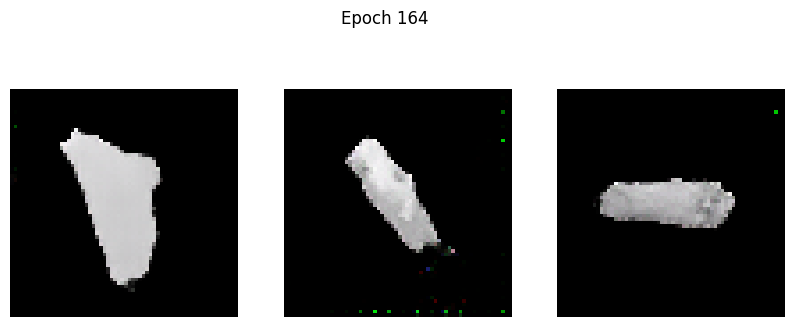

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2251 - g_loss: 3.1266
Epoch 165/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1774 - g_loss: 2.9431

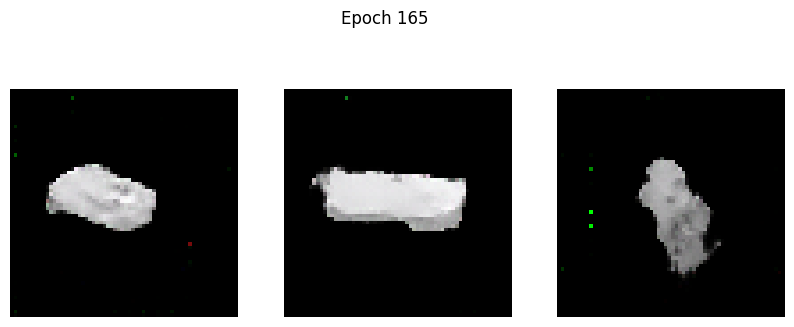

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1775 - g_loss: 2.9435
Epoch 166/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2312 - g_loss: 3.1502

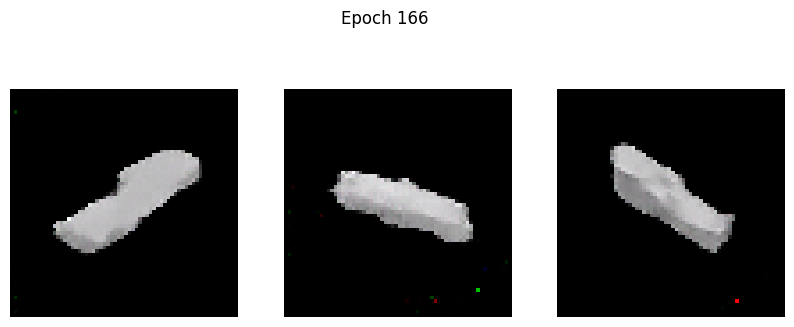

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2307 - g_loss: 3.1484
Epoch 167/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1704 - g_loss: 3.0282

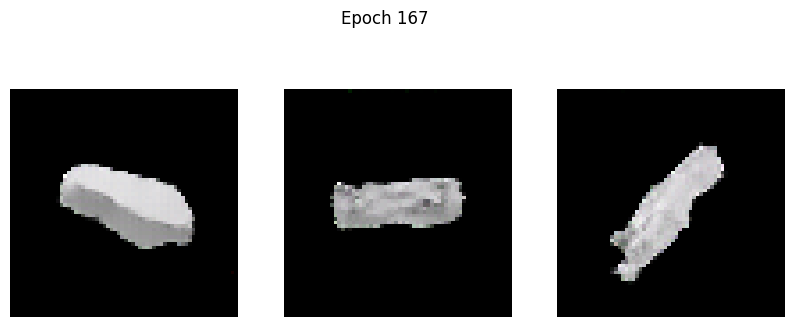

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1708 - g_loss: 3.0289
Epoch 168/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3768 - g_loss: 3.3462

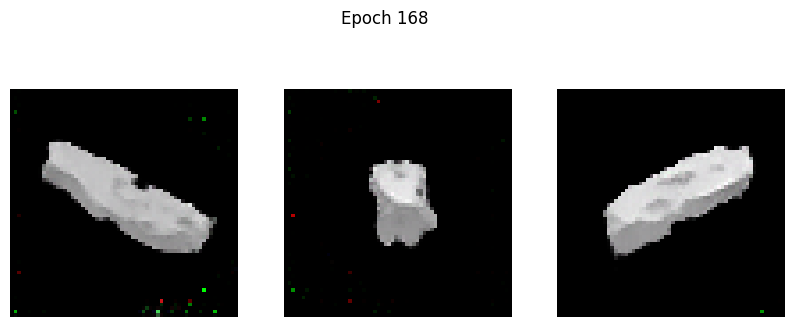

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3754 - g_loss: 3.3431
Epoch 169/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1295 - g_loss: 2.9765

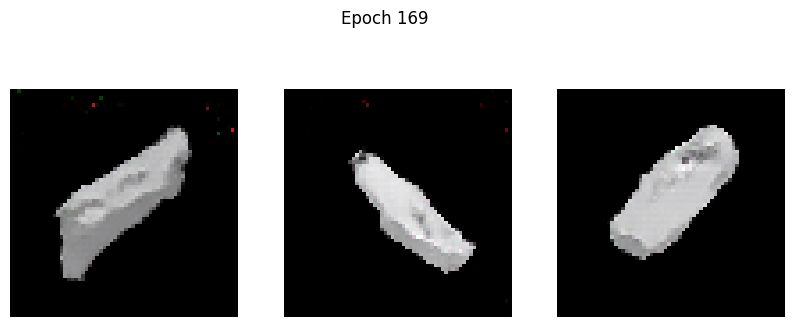

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1296 - g_loss: 2.9763
Epoch 170/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1351 - g_loss: 3.0228

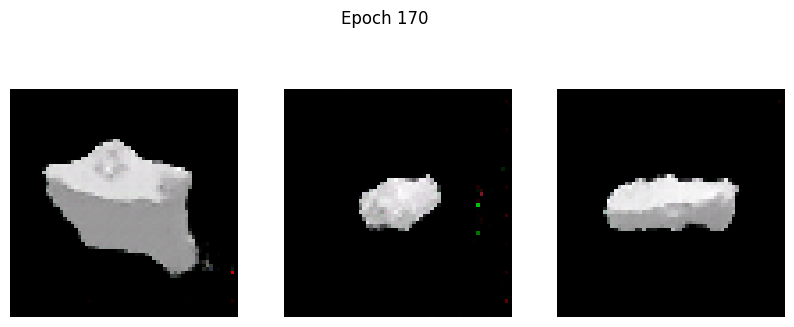

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1352 - g_loss: 3.0228
Epoch 171/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1596 - g_loss: 3.0856

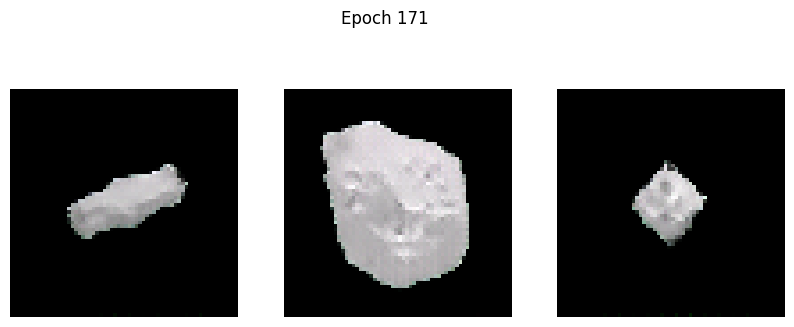

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1608 - g_loss: 3.0867
Epoch 172/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3311 - g_loss: 3.2626

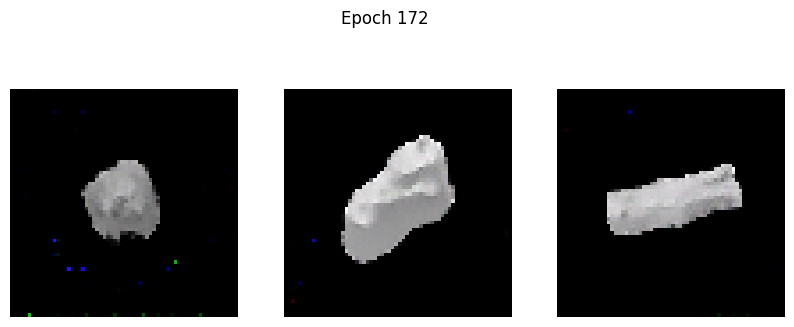

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3299 - g_loss: 3.2602
Epoch 173/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1366 - g_loss: 3.0133

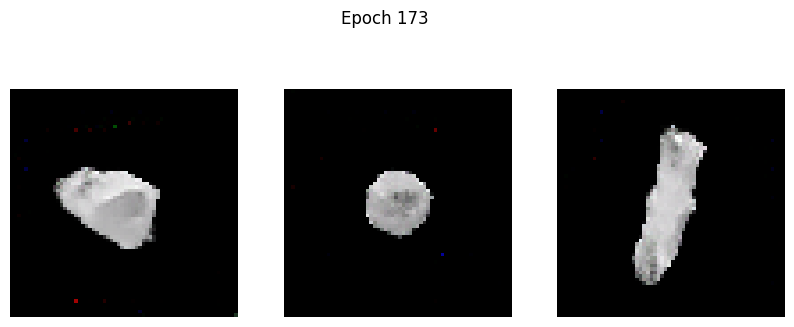

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1367 - g_loss: 3.0131
Epoch 174/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1595 - g_loss: 3.1780

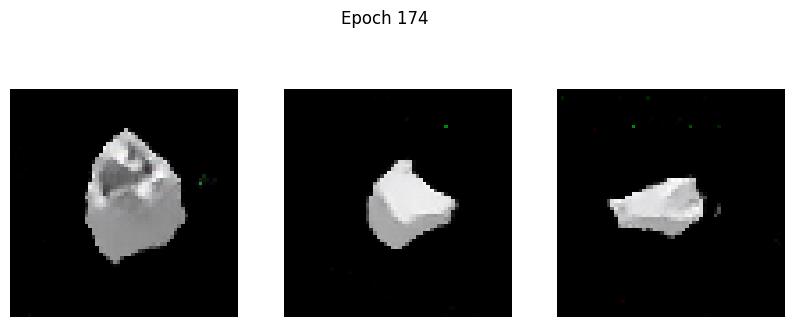

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1593 - g_loss: 3.1771
Epoch 175/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1664 - g_loss: 3.0982

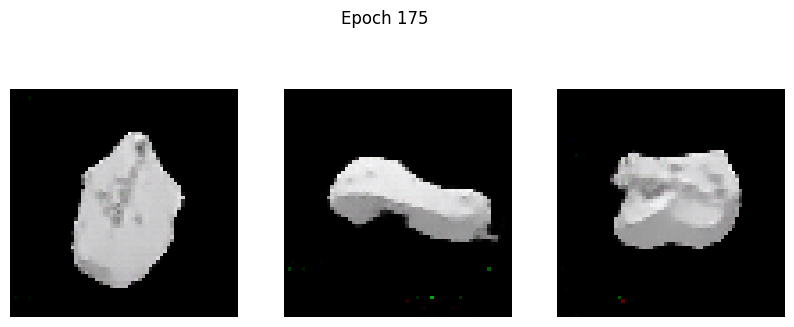

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1665 - g_loss: 3.0982
Epoch 176/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1163 - g_loss: 3.0248

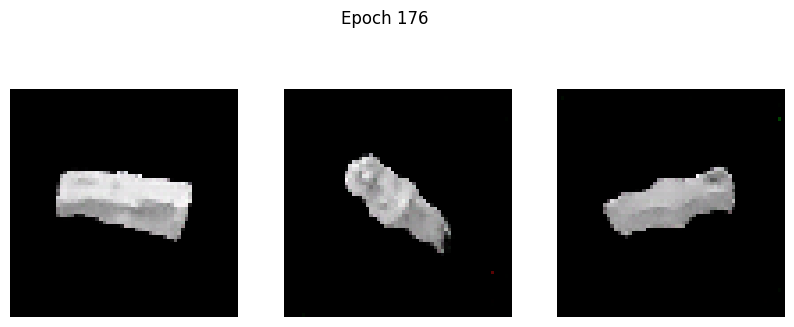

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1164 - g_loss: 3.0251
Epoch 177/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.2815 - g_loss: 3.3604

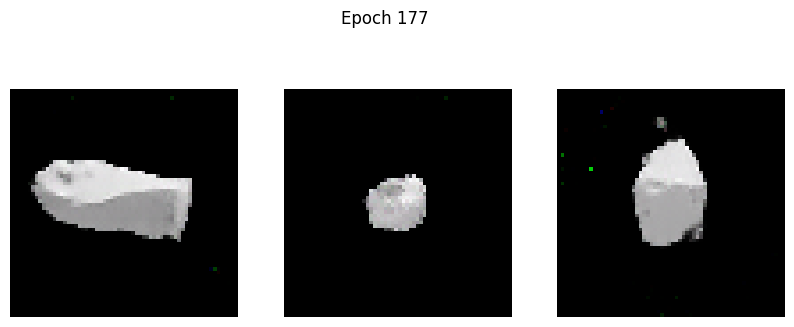

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.2812 - g_loss: 3.3587
Epoch 178/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1236 - g_loss: 3.0152

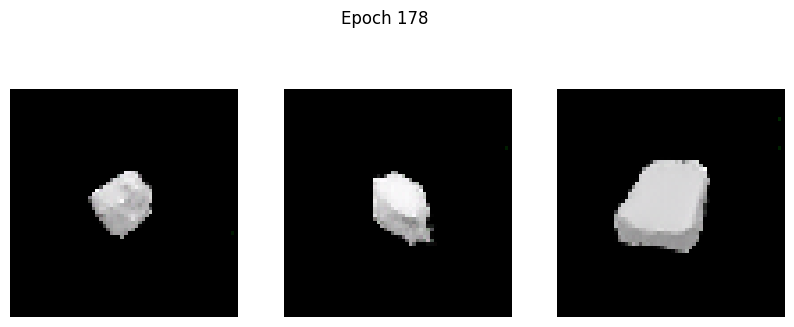

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1236 - g_loss: 3.0159
Epoch 179/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1484 - g_loss: 3.1754

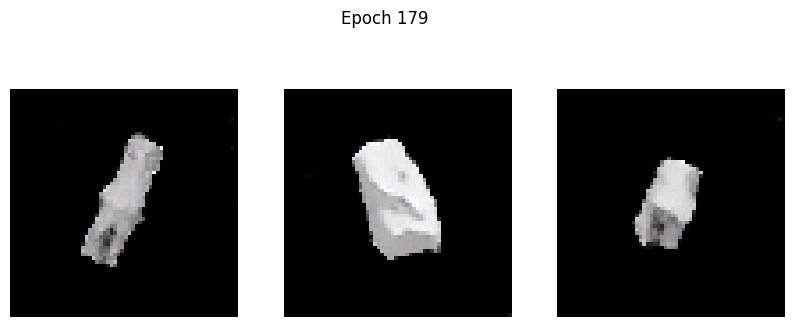

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1487 - g_loss: 3.1750
Epoch 180/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1870 - g_loss: 3.2096

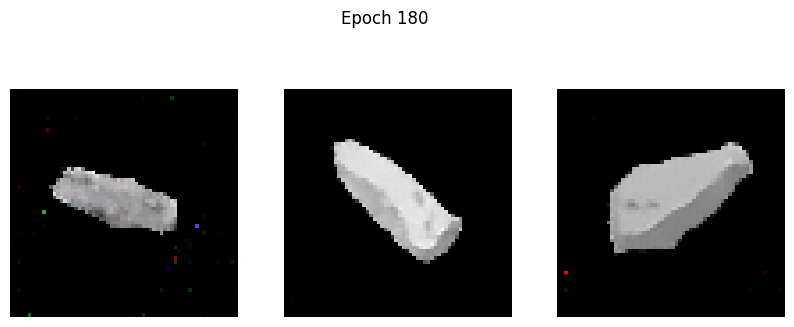

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1873 - g_loss: 3.2092
Epoch 181/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1277 - g_loss: 3.1023

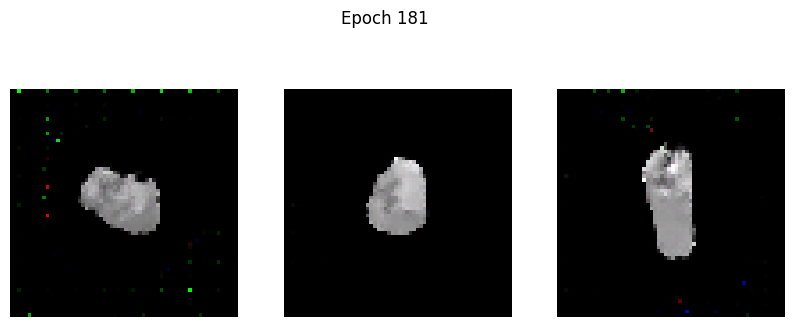

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1277 - g_loss: 3.1021
Epoch 182/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1559 - g_loss: 3.2338

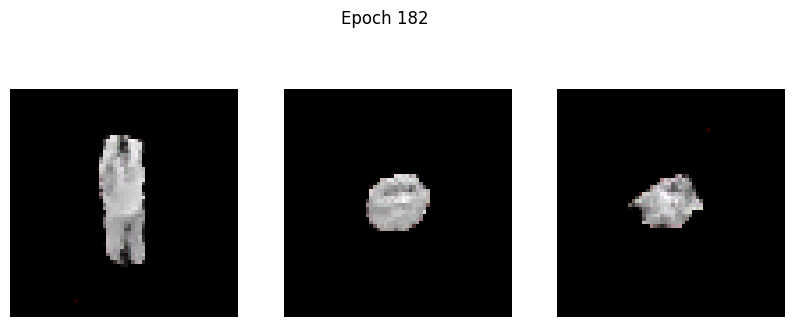

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1562 - g_loss: 3.2336
Epoch 183/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.5786 - g_loss: 3.7548

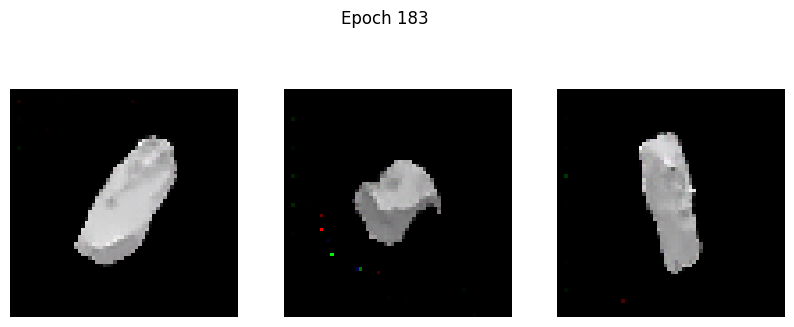

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.5761 - g_loss: 3.7499
Epoch 184/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1234 - g_loss: 2.9075

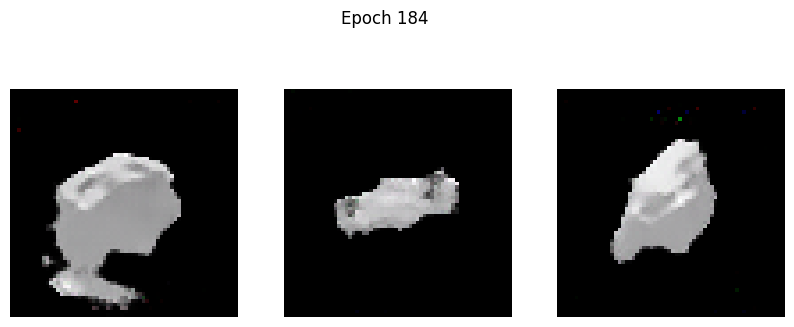

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1234 - g_loss: 2.9082
Epoch 185/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1151 - g_loss: 3.0506

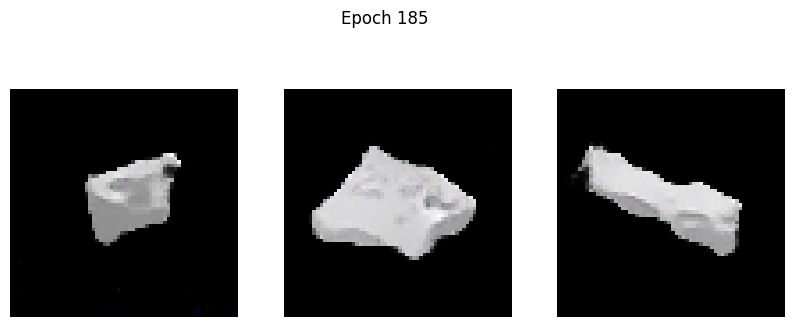

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1151 - g_loss: 3.0507
Epoch 186/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1540 - g_loss: 3.1668

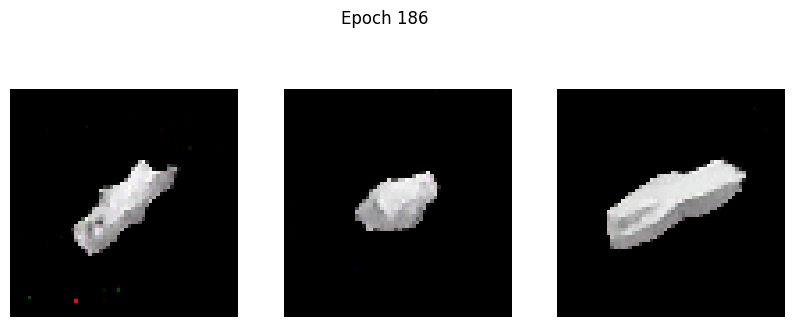

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1546 - g_loss: 3.1673
Epoch 187/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1472 - g_loss: 3.2143

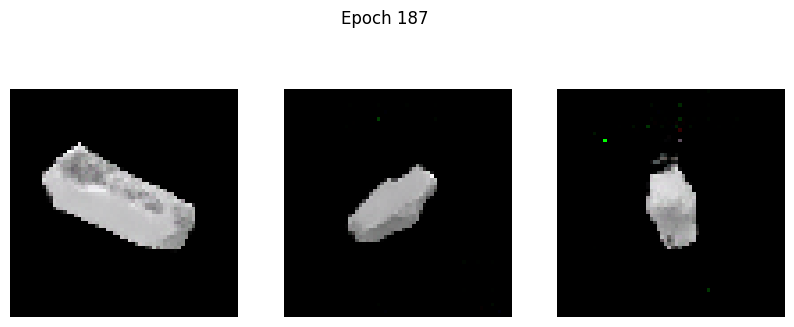

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1472 - g_loss: 3.2134
Epoch 188/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1256 - g_loss: 3.1445

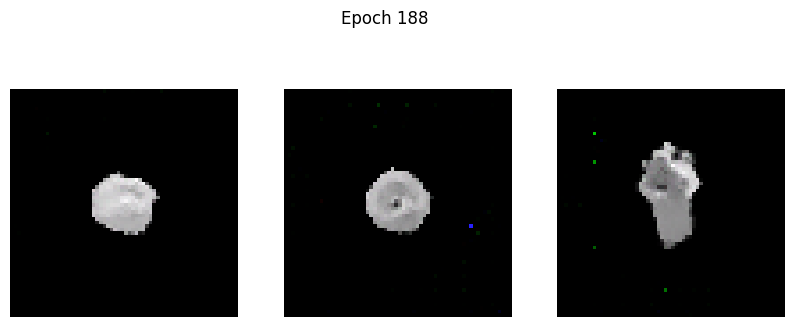

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1256 - g_loss: 3.1447
Epoch 189/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1597 - g_loss: 3.1948

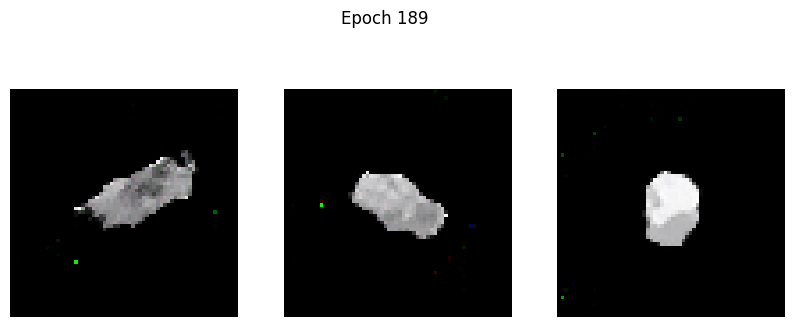

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1598 - g_loss: 3.1949
Epoch 190/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1591 - g_loss: 3.1523

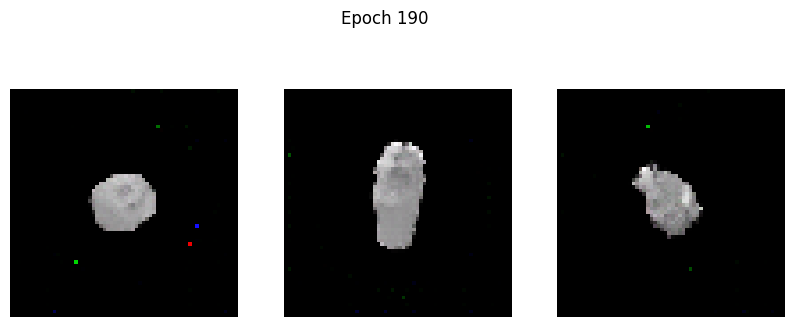

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1590 - g_loss: 3.1527
Epoch 191/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1341 - g_loss: 3.3135

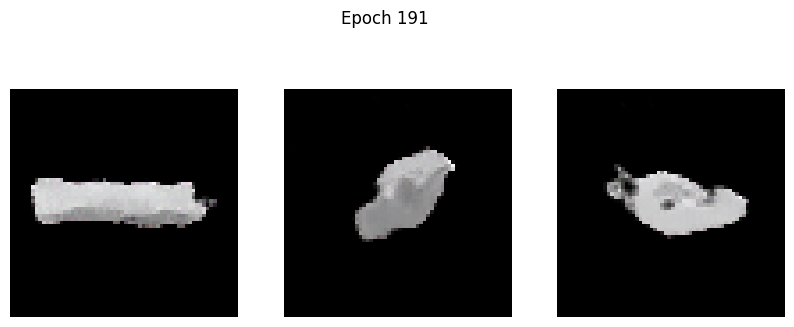

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1345 - g_loss: 3.3134
Epoch 192/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1263 - g_loss: 3.1407

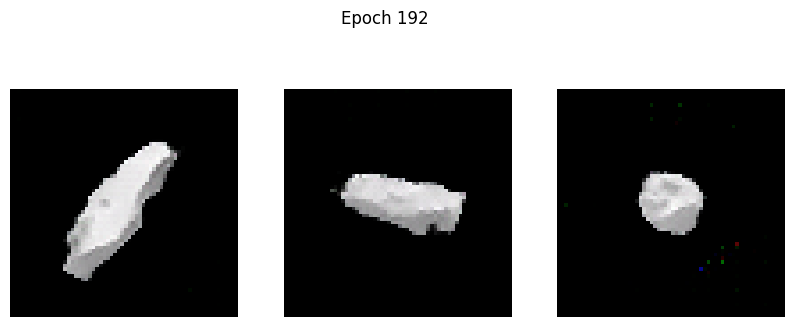

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1262 - g_loss: 3.1415
Epoch 193/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1307 - g_loss: 3.2955

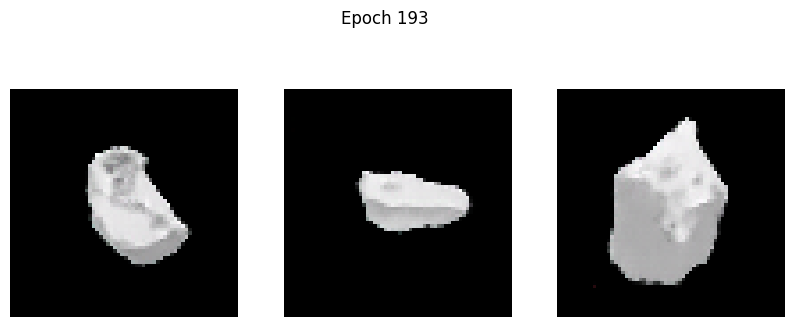

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1309 - g_loss: 3.2957
Epoch 194/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1461 - g_loss: 3.2625

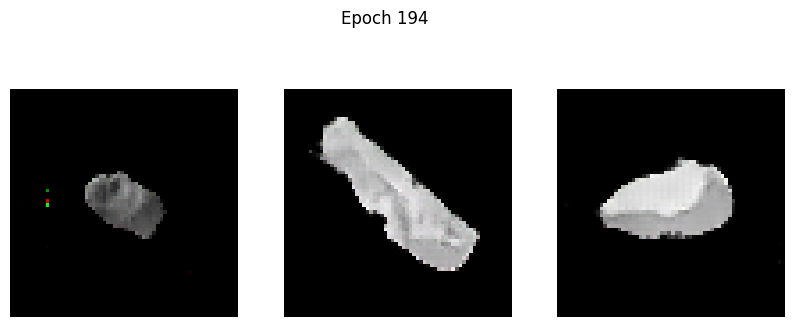

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - d_loss: 0.1478 - g_loss: 3.2651
Epoch 195/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6360 - g_loss: 3.7510

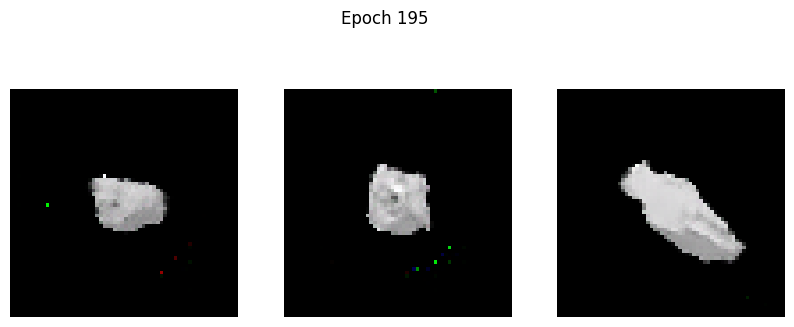

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6330 - g_loss: 3.7454
Epoch 196/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1280 - g_loss: 3.1030

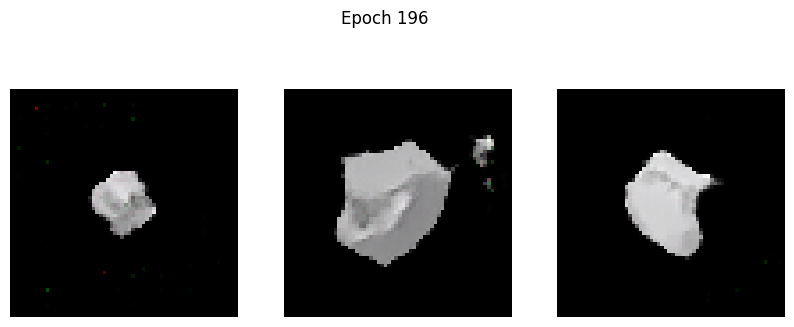

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1280 - g_loss: 3.1027
Epoch 197/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1055 - g_loss: 3.1012

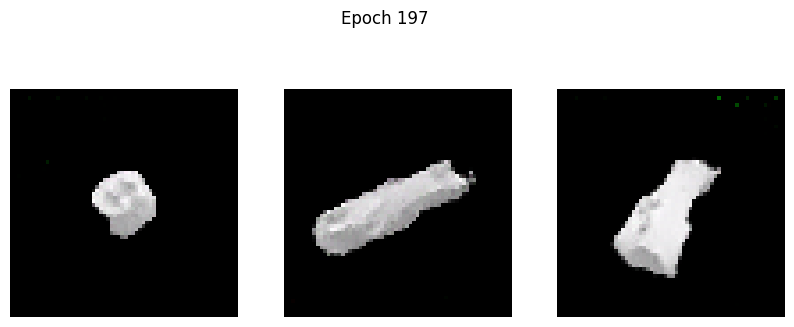

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1055 - g_loss: 3.1013
Epoch 198/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1338 - g_loss: 3.1669

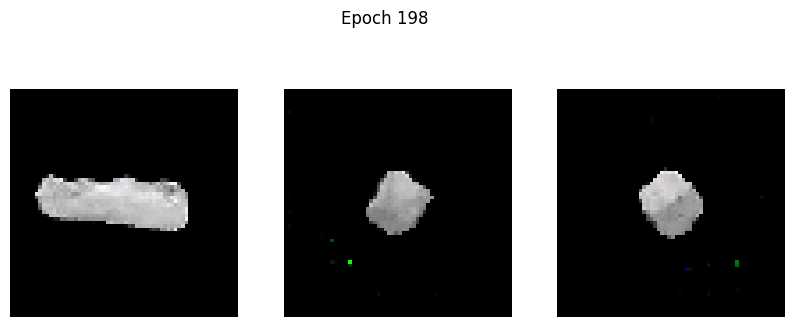

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1340 - g_loss: 3.1672
Epoch 199/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1039 - g_loss: 3.1452

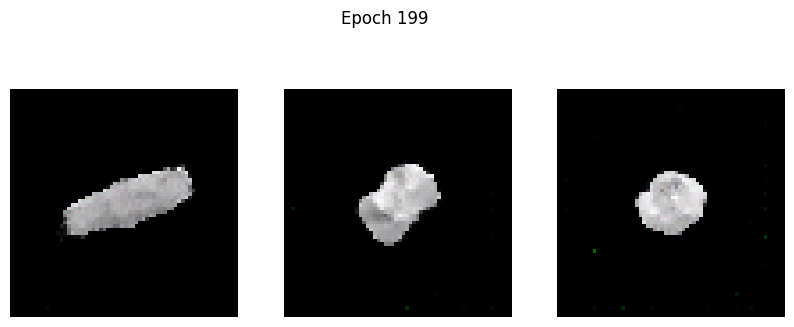

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1040 - g_loss: 3.1455
Epoch 200/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1282 - g_loss: 3.2442

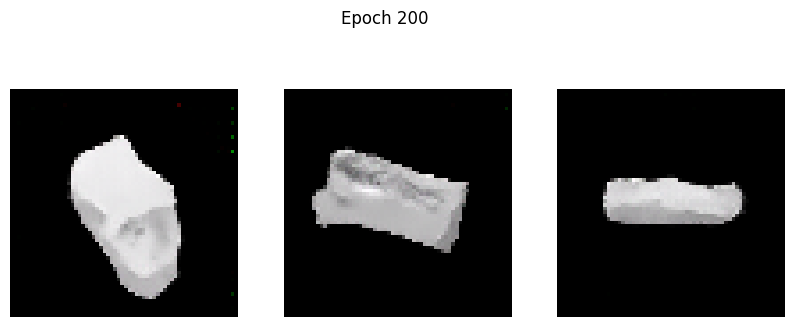

100/100 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - d_loss: 0.1283 - g_loss: 3.2447
Epoch 201/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1227 - g_loss: 3.2671

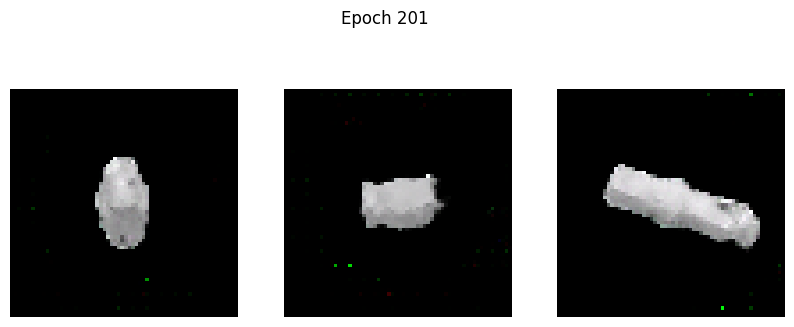

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1228 - g_loss: 3.2676
Epoch 202/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1793 - g_loss: 3.4588

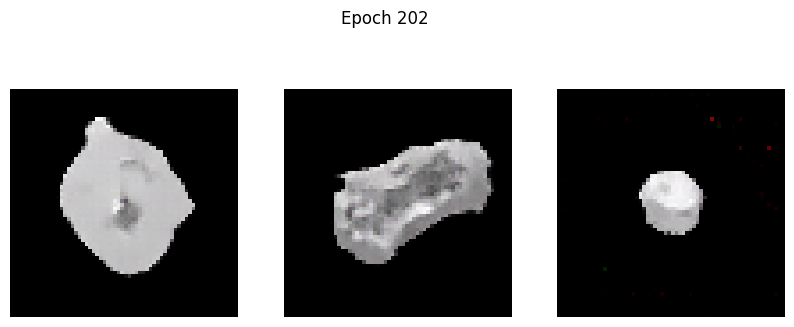

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1797 - g_loss: 3.4588
Epoch 203/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1105 - g_loss: 3.2558

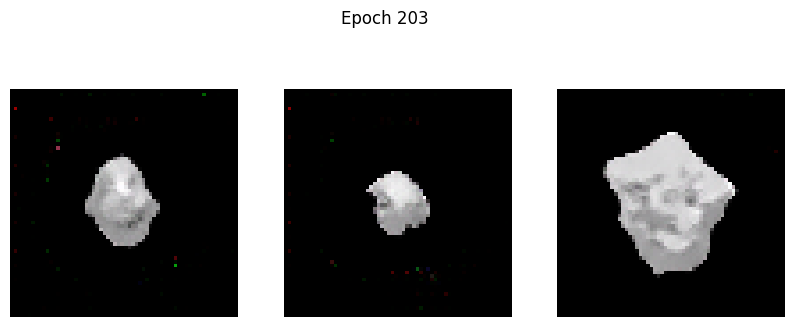

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1105 - g_loss: 3.2561
Epoch 204/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1635 - g_loss: 3.4782

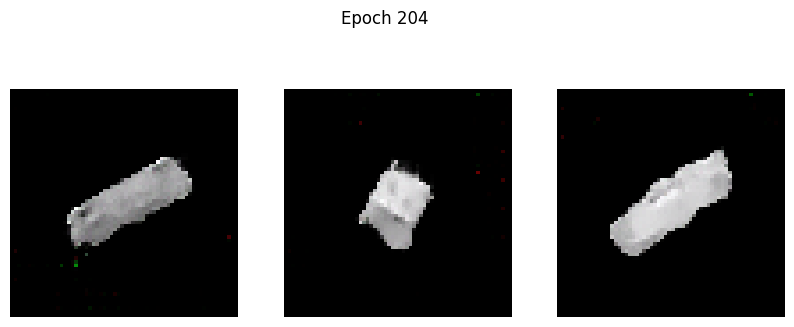

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1637 - g_loss: 3.4775
Epoch 205/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1177 - g_loss: 3.3397

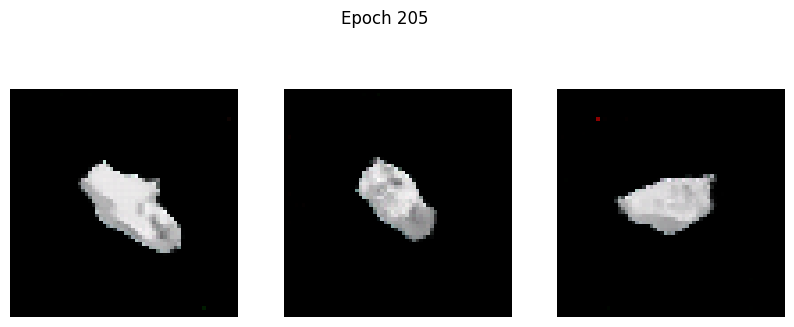

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1181 - g_loss: 3.3406
Epoch 206/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.1246 - g_loss: 4.5930

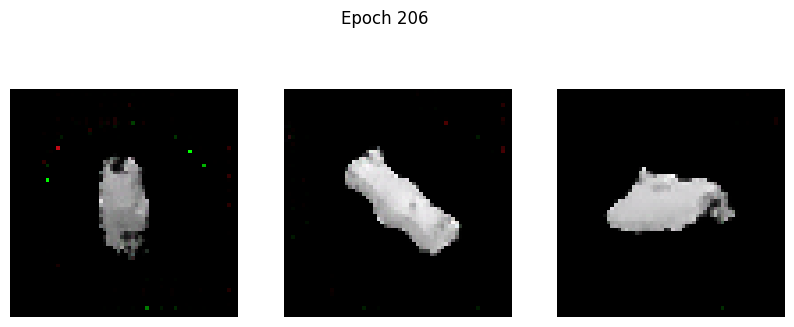

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.1190 - g_loss: 4.5842
Epoch 207/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1382 - g_loss: 3.0749

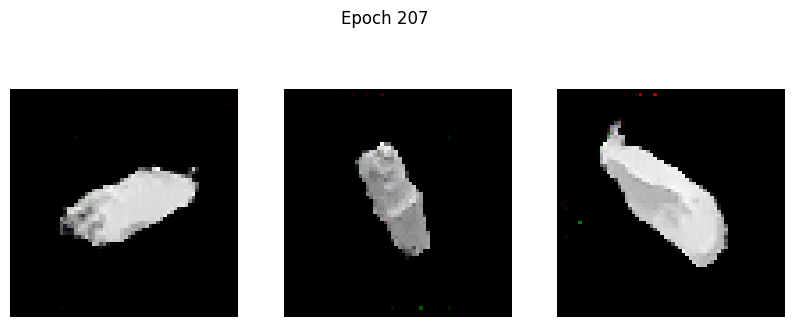

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1382 - g_loss: 3.0753
Epoch 208/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1501 - g_loss: 3.1163

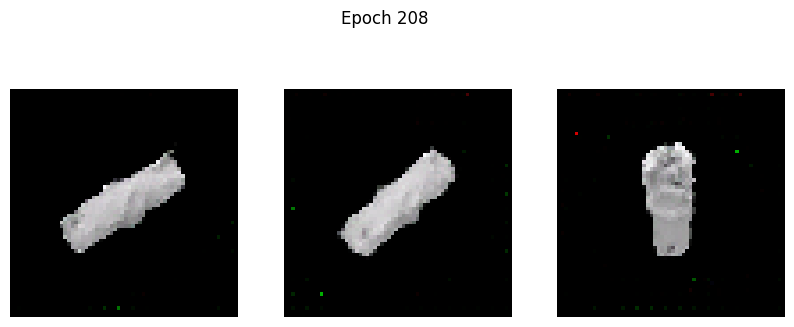

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1499 - g_loss: 3.1166
Epoch 209/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1606 - g_loss: 3.2384

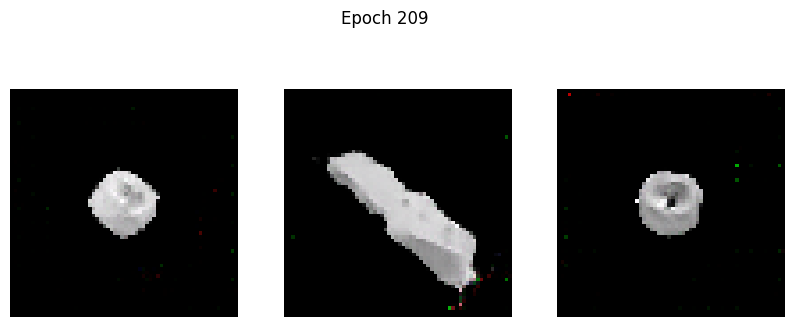

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1604 - g_loss: 3.2385
Epoch 210/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1116 - g_loss: 3.3514

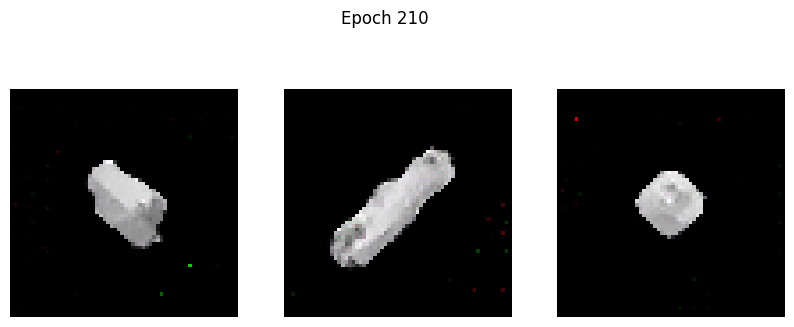

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1117 - g_loss: 3.3508
Epoch 211/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1180 - g_loss: 3.4074

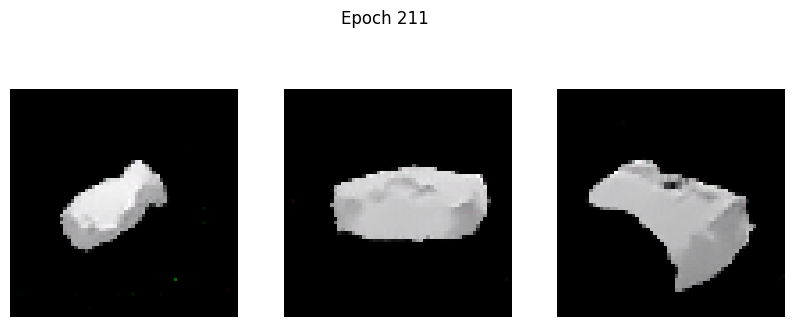

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1179 - g_loss: 3.4064
Epoch 212/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1331 - g_loss: 3.3689

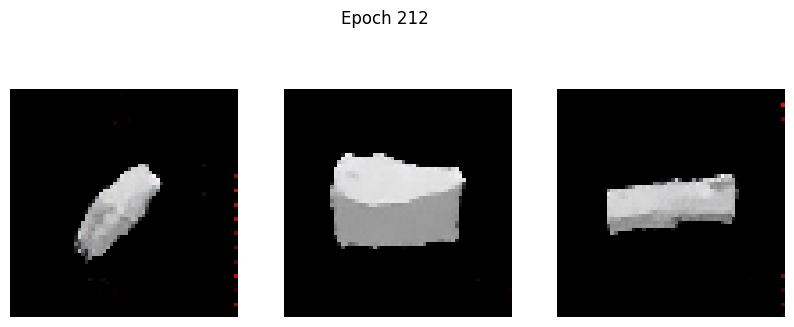

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1333 - g_loss: 3.3689
Epoch 213/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0991 - g_loss: 3.2738

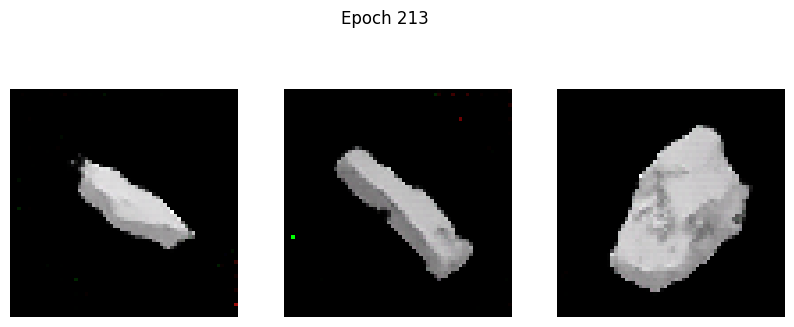

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0991 - g_loss: 3.2737
Epoch 214/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2223 - g_loss: 3.7067

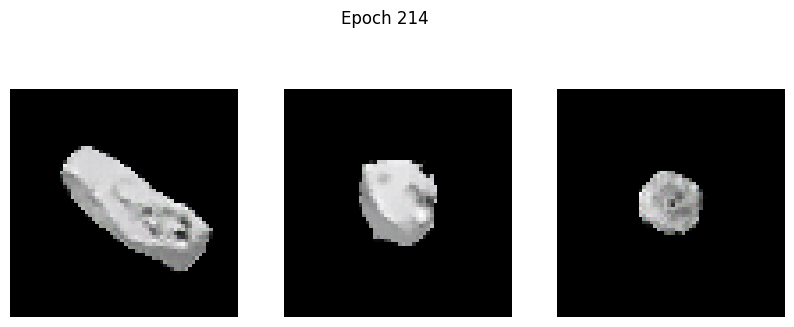

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2233 - g_loss: 3.7098
Epoch 215/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1078 - g_loss: 3.1869

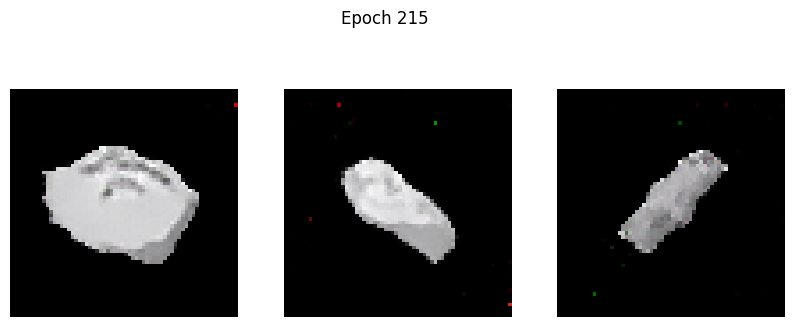

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1077 - g_loss: 3.1871
Epoch 216/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0981 - g_loss: 3.2519

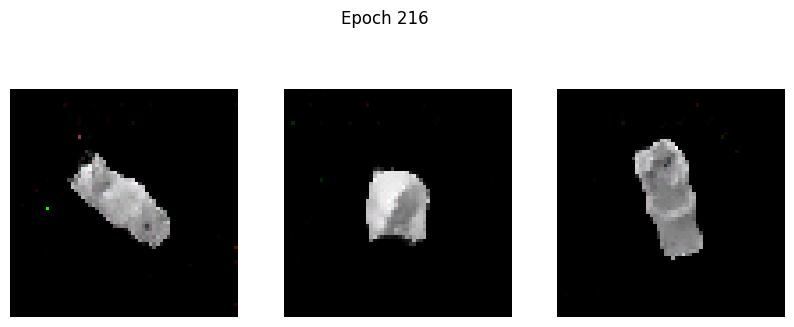

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0982 - g_loss: 3.2523
Epoch 217/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1114 - g_loss: 3.3756

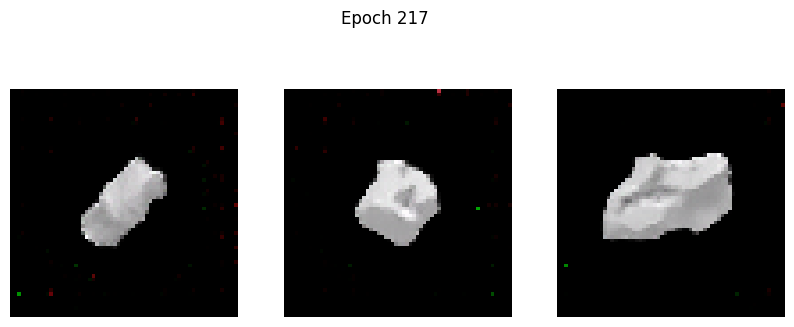

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1114 - g_loss: 3.3753
Epoch 218/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1402 - g_loss: 3.3829

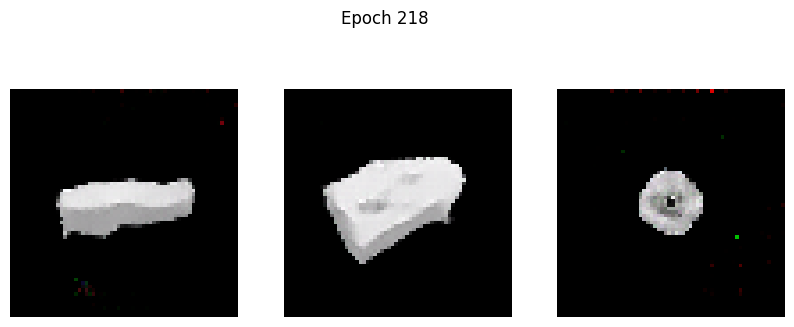

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1403 - g_loss: 3.3835
Epoch 219/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1382 - g_loss: 3.4389

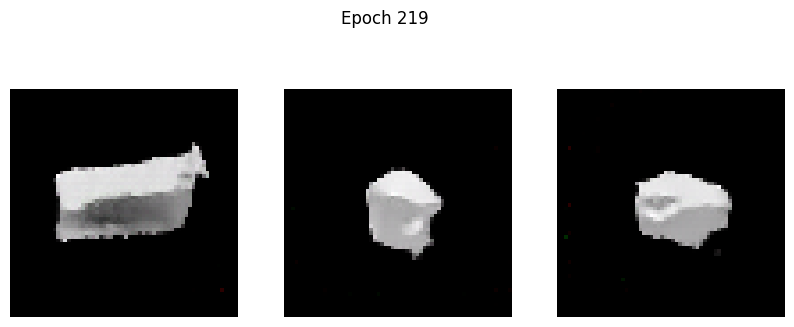

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1382 - g_loss: 3.4389
Epoch 220/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1282 - g_loss: 3.5282

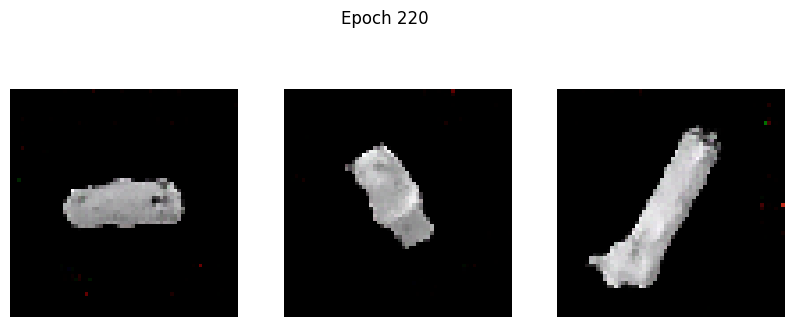

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1282 - g_loss: 3.5278
Epoch 221/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1796 - g_loss: 3.4740

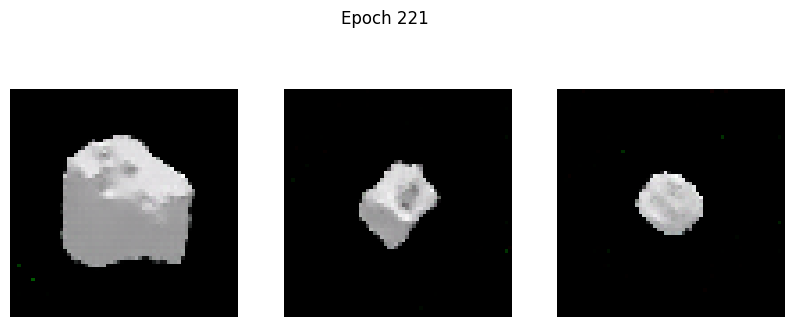

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1795 - g_loss: 3.4737
Epoch 222/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1038 - g_loss: 3.4473

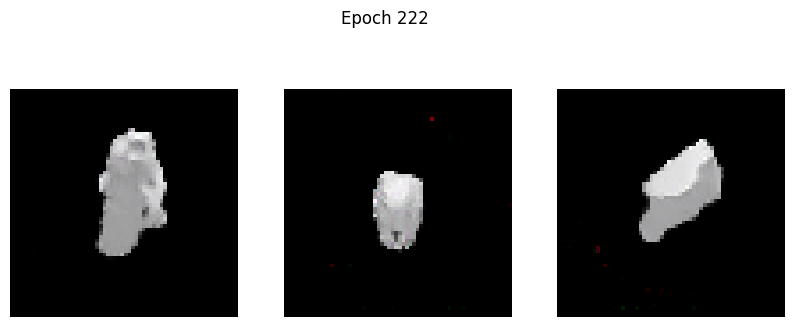

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1038 - g_loss: 3.4475
Epoch 223/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1129 - g_loss: 3.3489

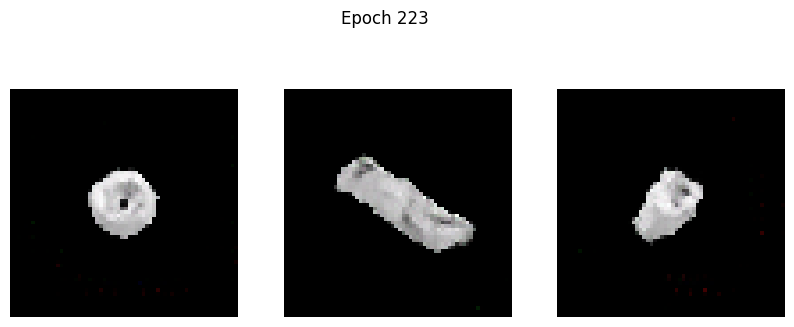

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1128 - g_loss: 3.3502
Epoch 224/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2048 - g_loss: 3.6328

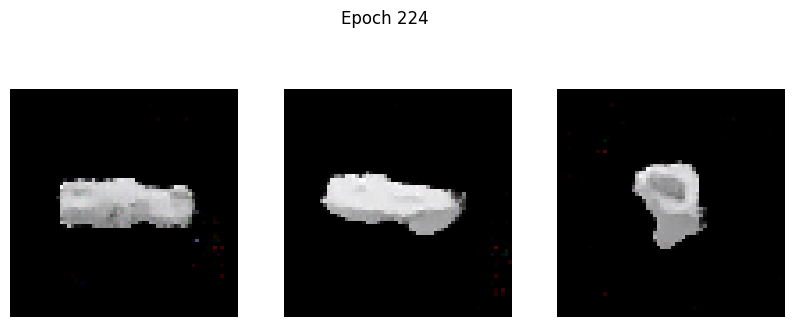

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2053 - g_loss: 3.6336
Epoch 225/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0982 - g_loss: 3.4651

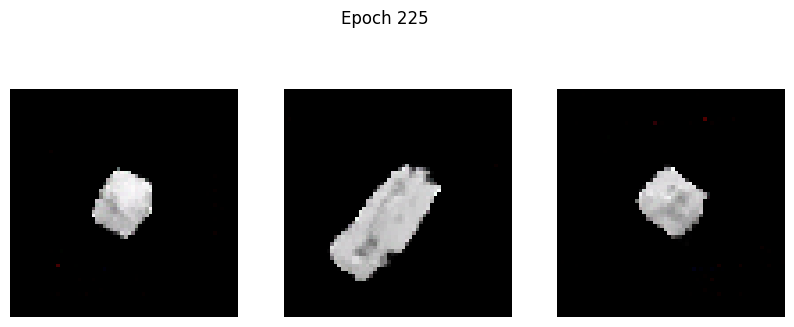

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0982 - g_loss: 3.4648
Epoch 226/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1204 - g_loss: 3.4742

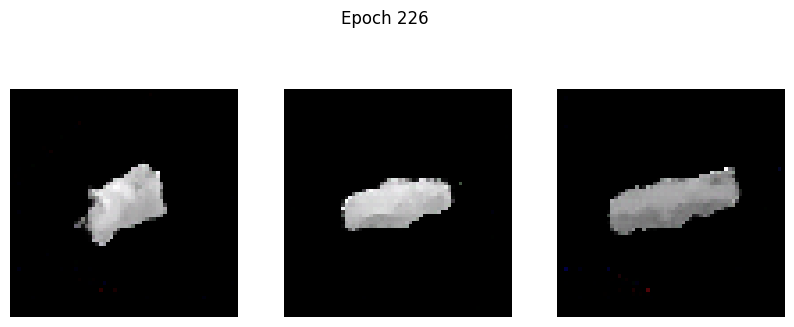

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1206 - g_loss: 3.4750
Epoch 227/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1462 - g_loss: 3.4229

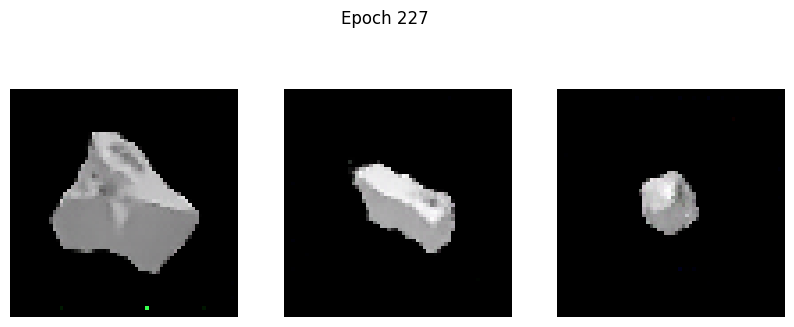

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1458 - g_loss: 3.4234
Epoch 228/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.4577 - g_loss: 4.0051

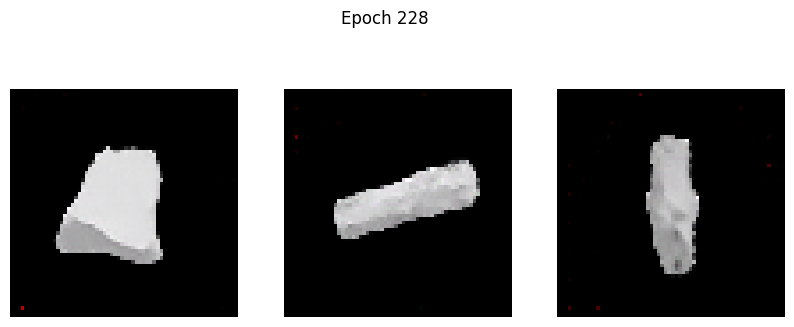

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4557 - g_loss: 4.0011
Epoch 229/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1169 - g_loss: 3.4179

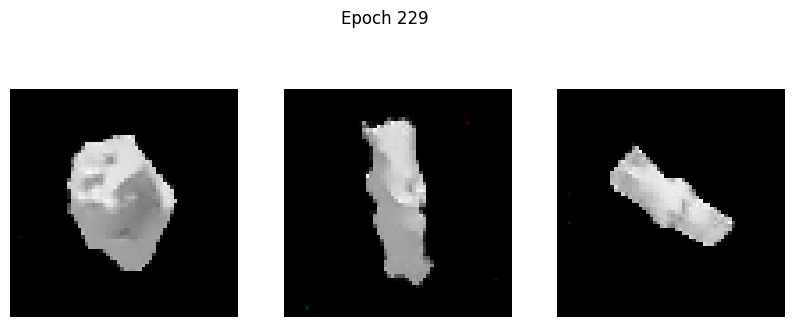

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1168 - g_loss: 3.4178
Epoch 230/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1033 - g_loss: 3.4945

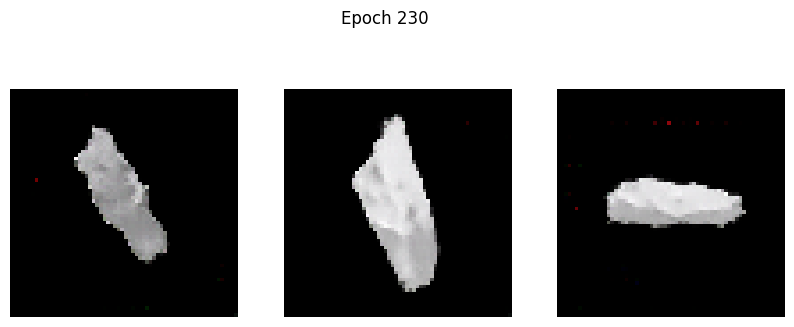

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1037 - g_loss: 3.4952
Epoch 231/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2078 - g_loss: 3.5754

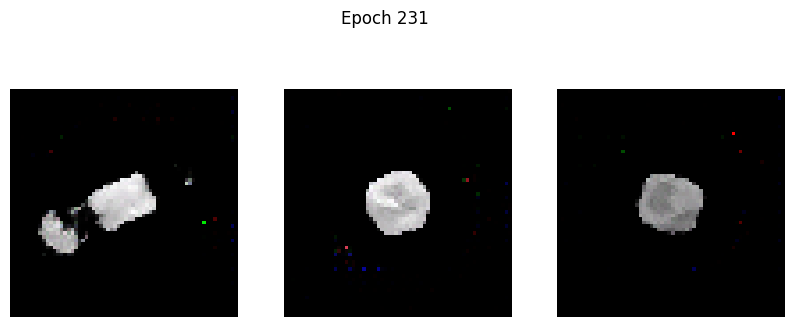

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2071 - g_loss: 3.5747
Epoch 232/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1004 - g_loss: 3.4503

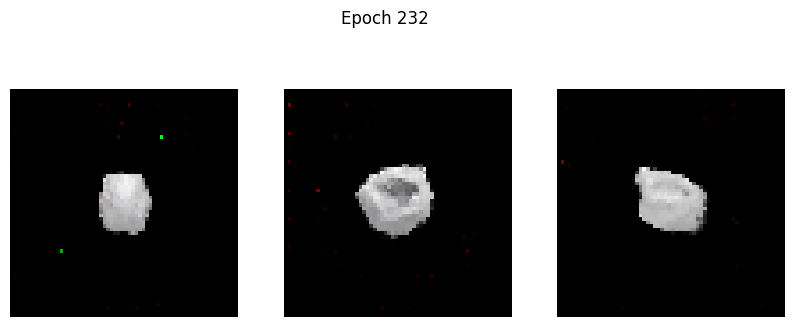

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1005 - g_loss: 3.4506
Epoch 233/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0898 - g_loss: 3.4713

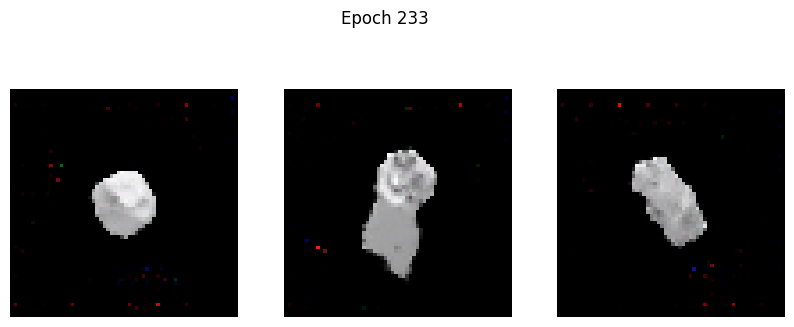

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0900 - g_loss: 3.4722
Epoch 234/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1726 - g_loss: 3.7637

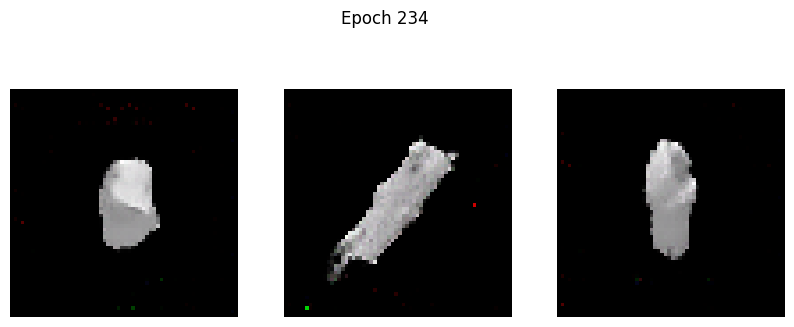

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1725 - g_loss: 3.7629
Epoch 235/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1021 - g_loss: 3.5125

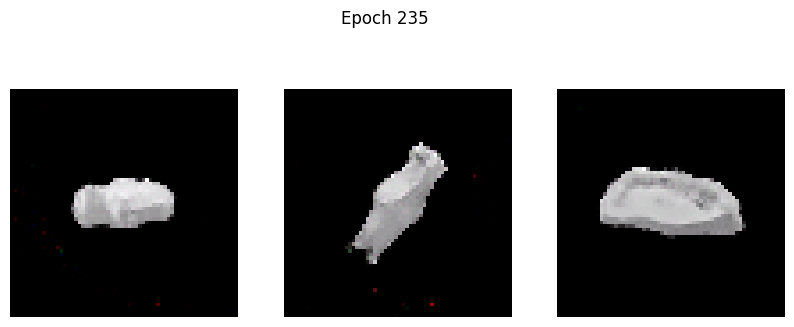

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1021 - g_loss: 3.5128
Epoch 236/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1078 - g_loss: 3.6209

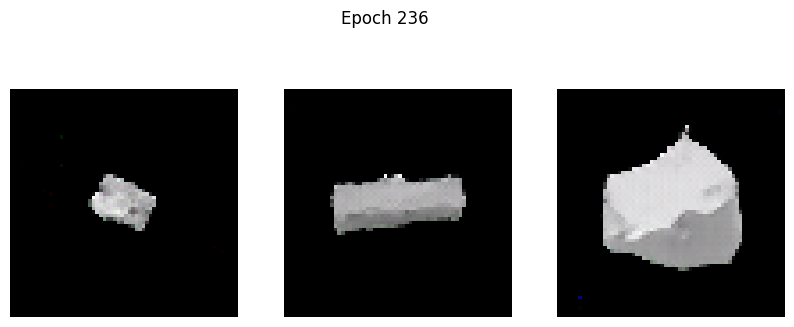

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1080 - g_loss: 3.6213
Epoch 237/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.4094 - g_loss: 3.9411

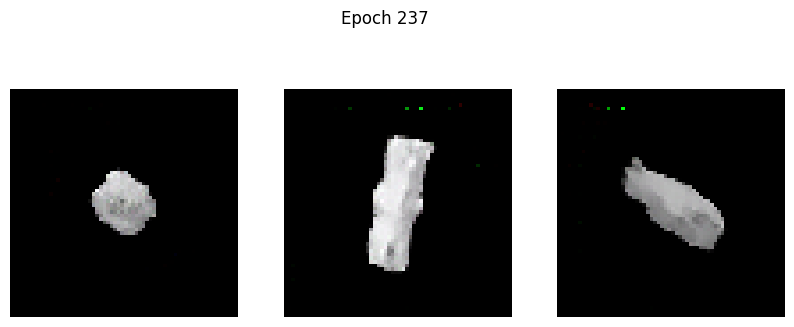

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.4088 - g_loss: 3.9396
Epoch 238/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1057 - g_loss: 3.5272

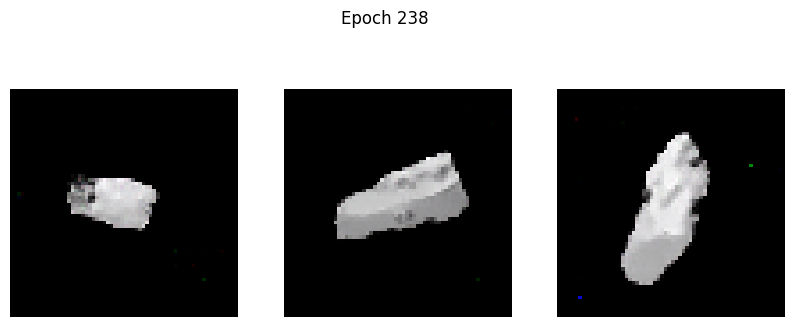

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1056 - g_loss: 3.5268
Epoch 239/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0809 - g_loss: 3.5211

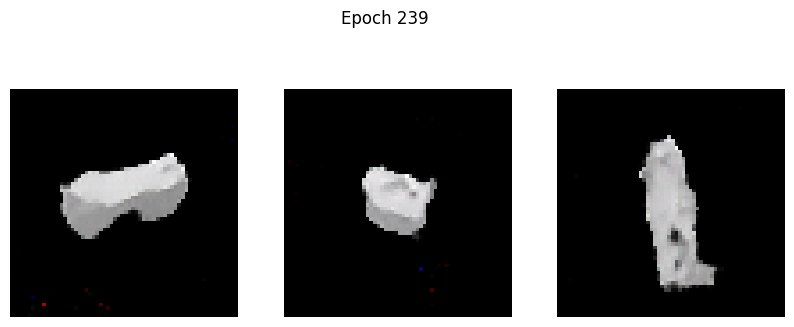

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0809 - g_loss: 3.5209
Epoch 240/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0765 - g_loss: 3.4990

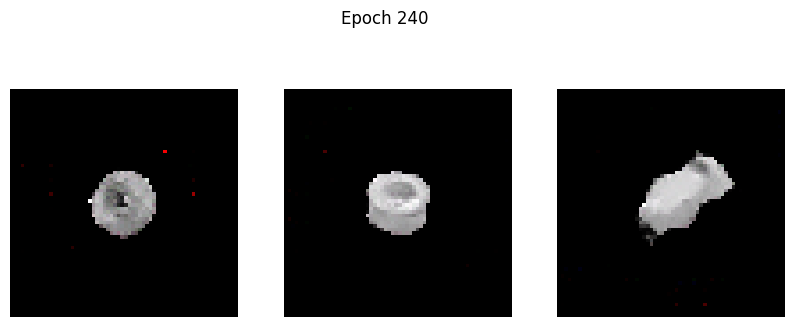

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0765 - g_loss: 3.4992
Epoch 241/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0923 - g_loss: 3.5754

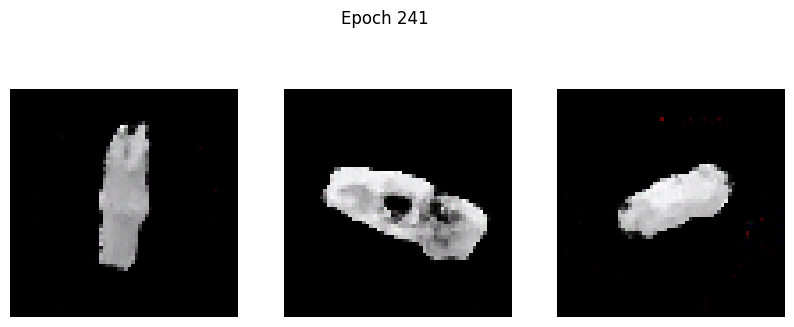

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0923 - g_loss: 3.5754
Epoch 242/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1066 - g_loss: 3.7221

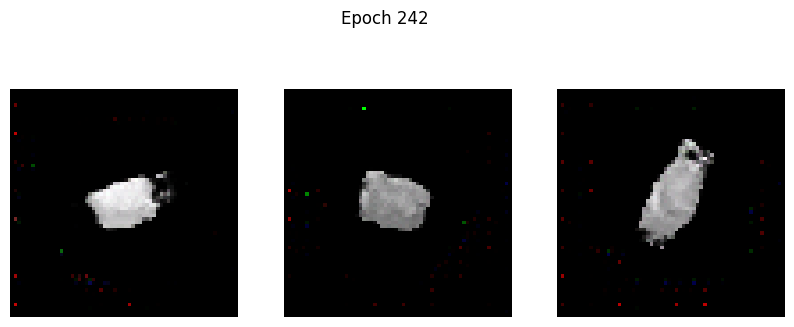

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1069 - g_loss: 3.7222
Epoch 243/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0886 - g_loss: 3.6629

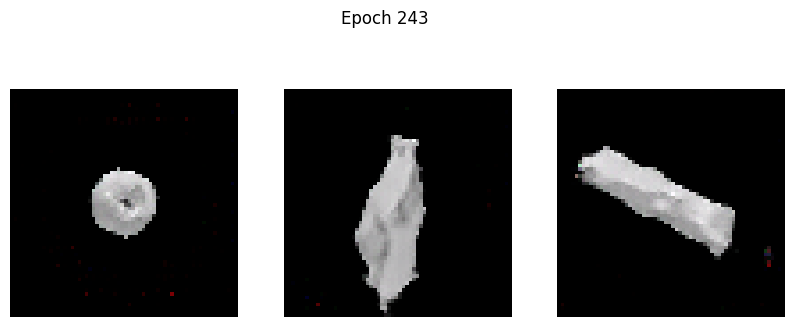

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0886 - g_loss: 3.6632
Epoch 244/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1795 - g_loss: 3.8050

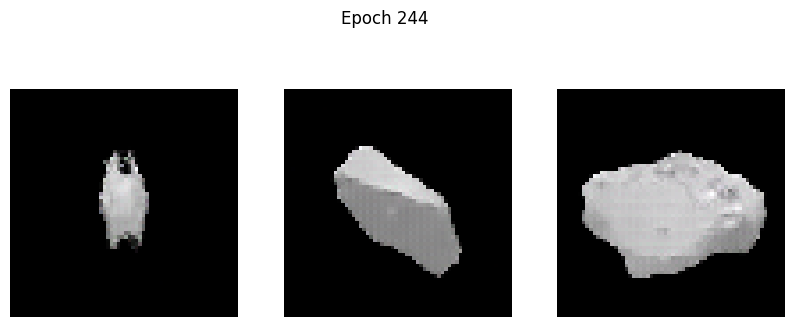

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1806 - g_loss: 3.8076
Epoch 245/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1153 - g_loss: 3.4367

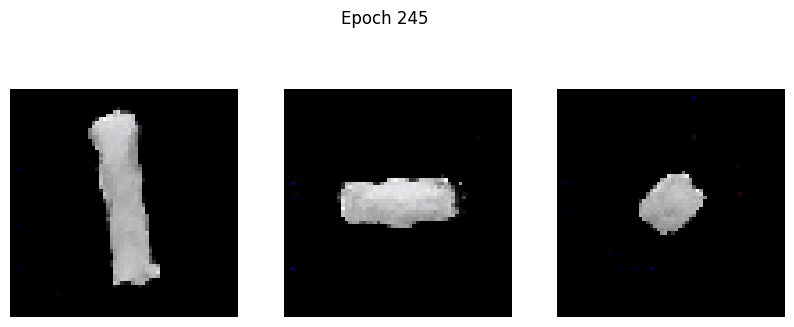

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1152 - g_loss: 3.4367
Epoch 246/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0874 - g_loss: 3.5707

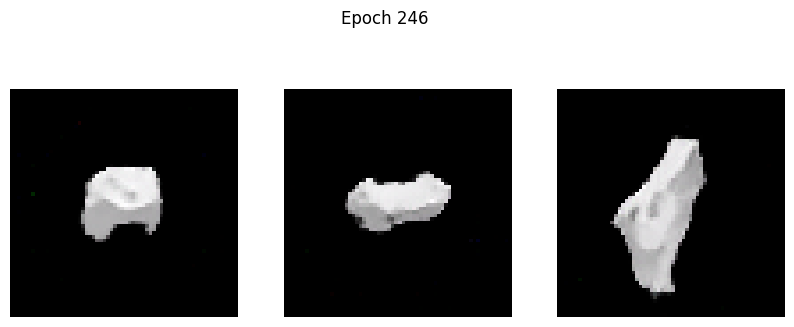

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0873 - g_loss: 3.5712
Epoch 247/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0932 - g_loss: 3.7322

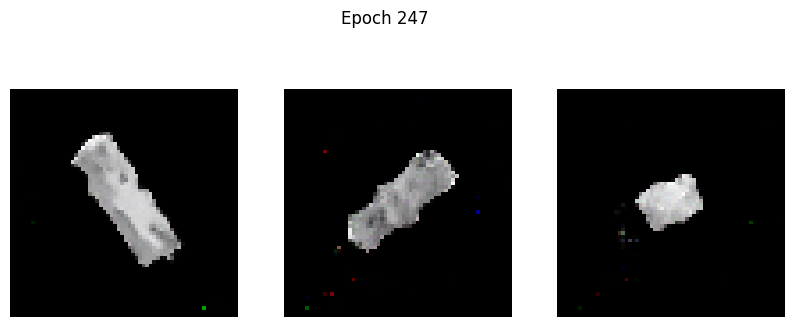

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0933 - g_loss: 3.7321
Epoch 248/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0909 - g_loss: 3.7153

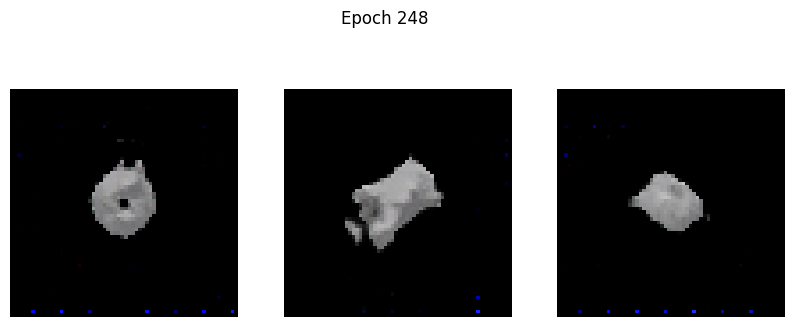

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0909 - g_loss: 3.7148
Epoch 249/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0998 - g_loss: 3.7832

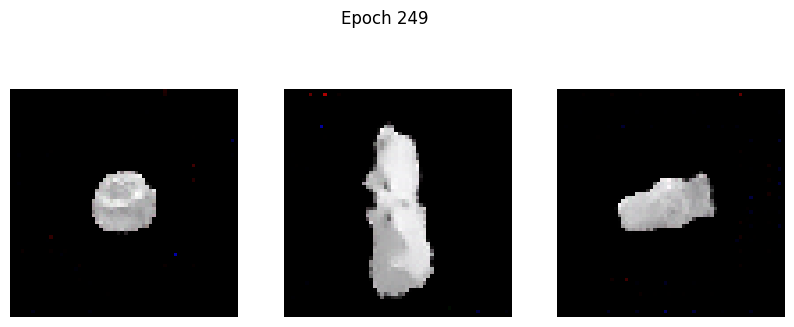

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0999 - g_loss: 3.7829
Epoch 250/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0904 - g_loss: 3.7038

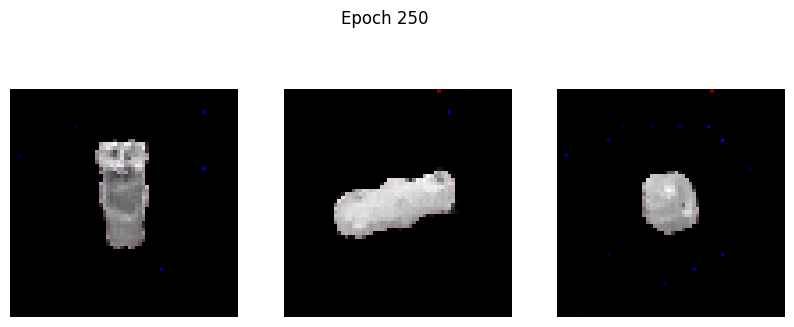

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0908 - g_loss: 3.7049
Epoch 251/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 1.3334 - g_loss: 5.9385

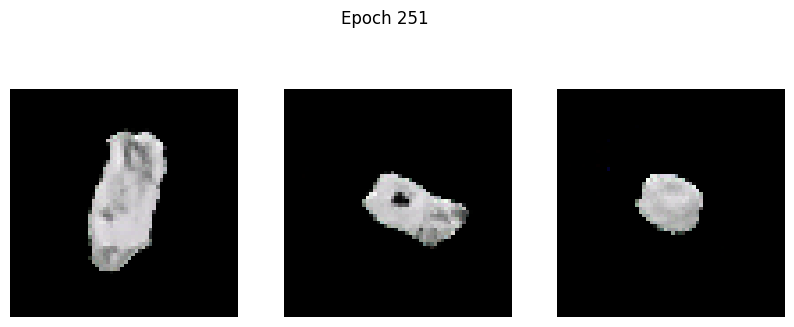

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 1.3261 - g_loss: 5.9200
Epoch 252/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1263 - g_loss: 3.3208

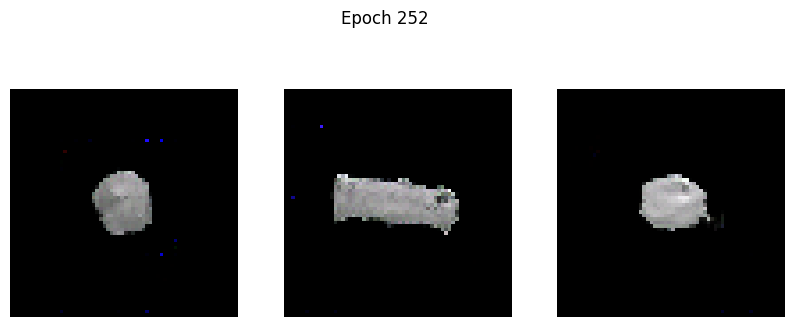

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1263 - g_loss: 3.3212
Epoch 253/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1069 - g_loss: 3.3983

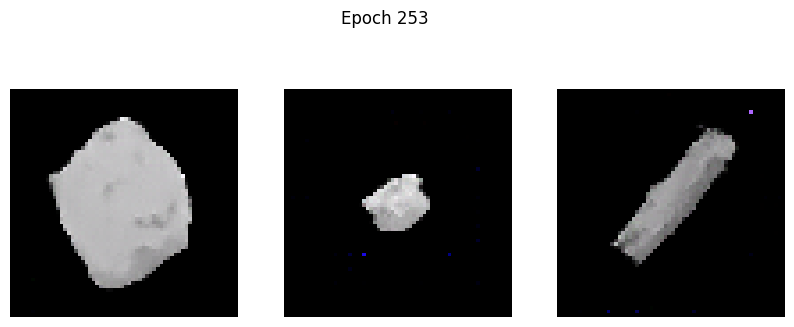

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1068 - g_loss: 3.3986
Epoch 254/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0823 - g_loss: 3.5127

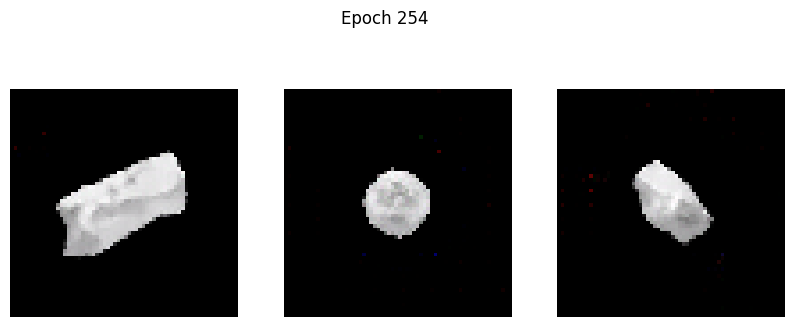

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0823 - g_loss: 3.5128
Epoch 255/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0982 - g_loss: 3.7088

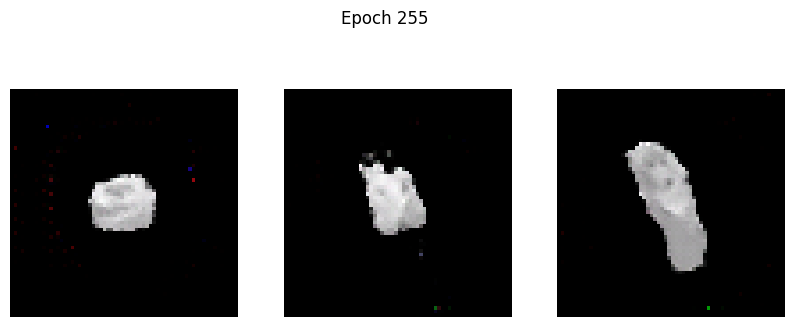

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0983 - g_loss: 3.7087
Epoch 256/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0709 - g_loss: 3.6194

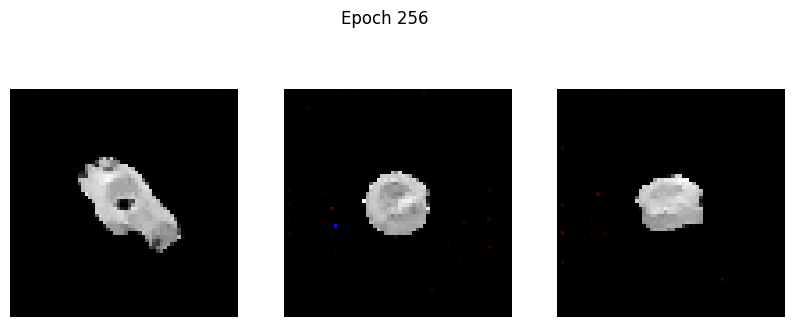

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0710 - g_loss: 3.6193
Epoch 257/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0744 - g_loss: 3.7143

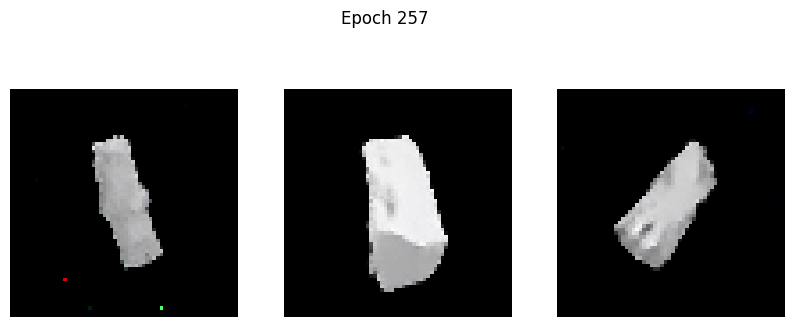

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0745 - g_loss: 3.7142
Epoch 258/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1112 - g_loss: 3.7370

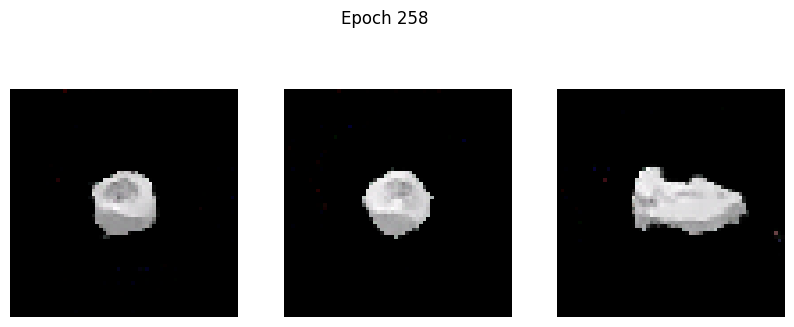

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1114 - g_loss: 3.7383
Epoch 259/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1018 - g_loss: 3.6633

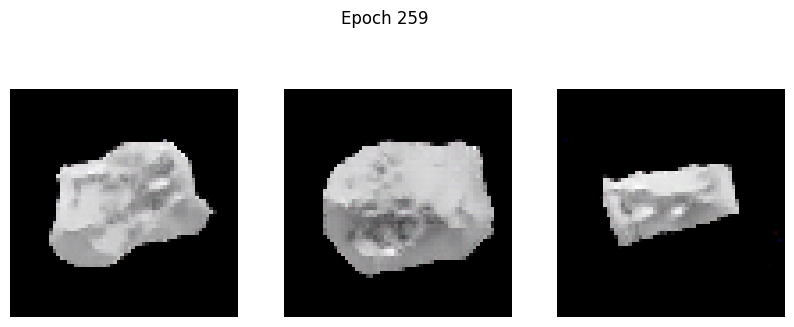

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1020 - g_loss: 3.6640
Epoch 260/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0955 - g_loss: 3.6943

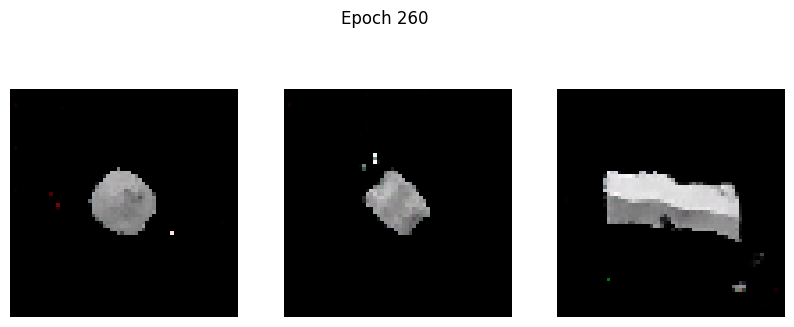

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0956 - g_loss: 3.6948
Epoch 261/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0806 - g_loss: 3.7605

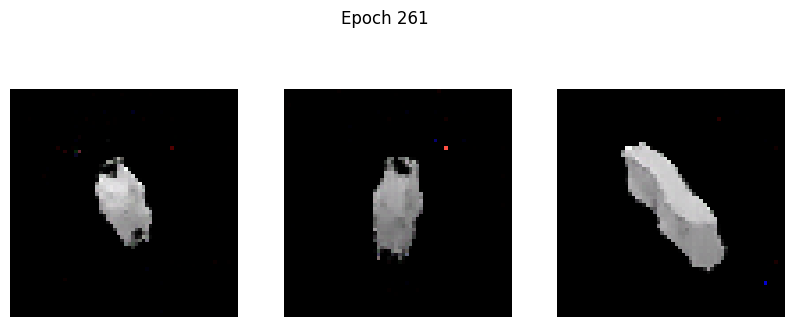

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0809 - g_loss: 3.7614
Epoch 262/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1141 - g_loss: 3.8507

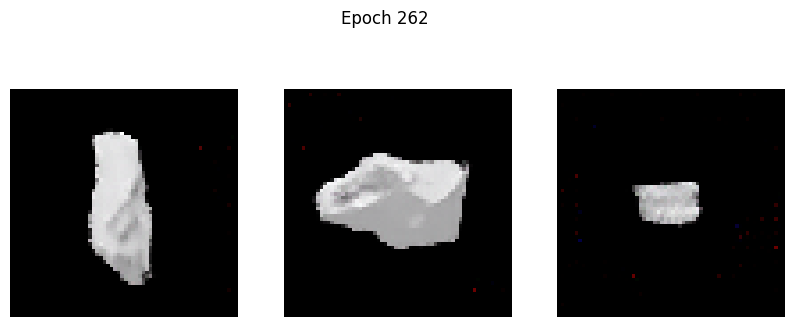

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1140 - g_loss: 3.8506
Epoch 263/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0843 - g_loss: 3.8774

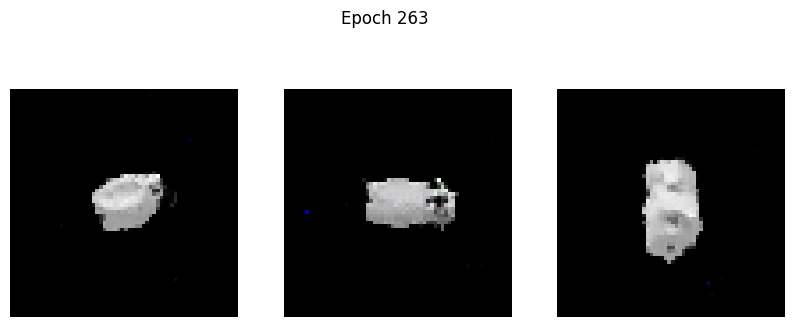

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0844 - g_loss: 3.8778
Epoch 264/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1123 - g_loss: 3.7873

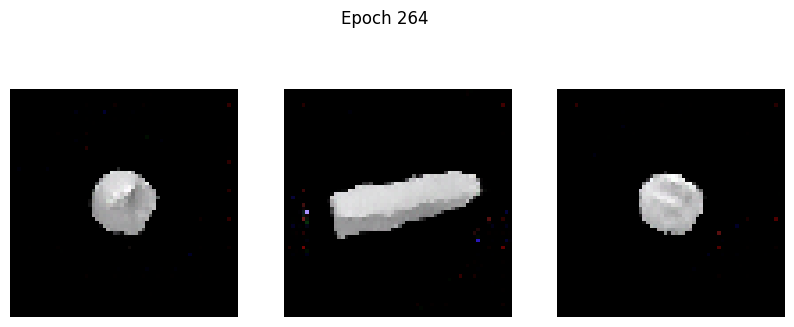

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1123 - g_loss: 3.7872
Epoch 265/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1023 - g_loss: 3.8804

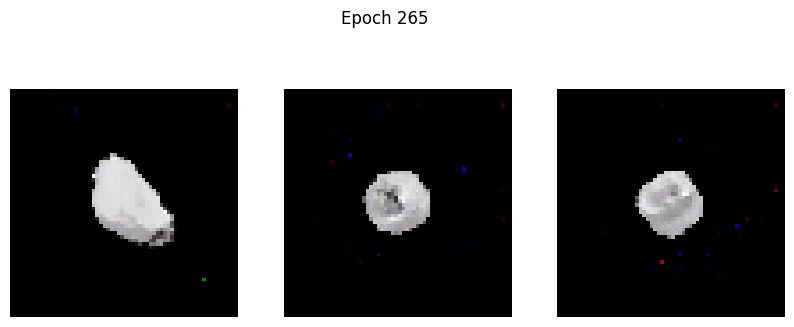

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1025 - g_loss: 3.8806
Epoch 266/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0885 - g_loss: 3.9199

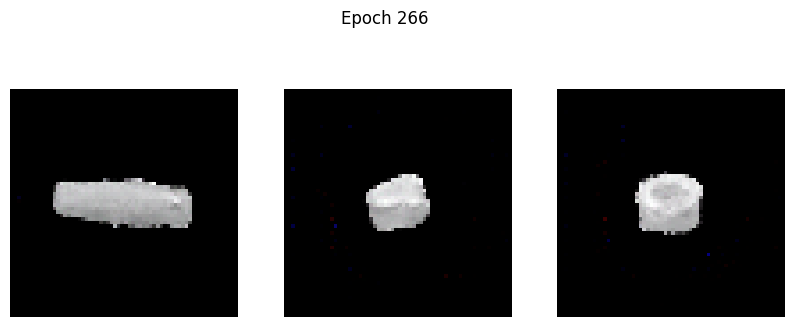

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0887 - g_loss: 3.9197
Epoch 267/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0767 - g_loss: 3.8266

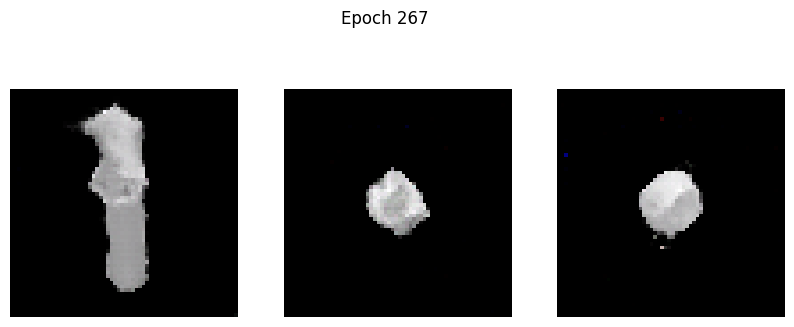

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0767 - g_loss: 3.8262
Epoch 268/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1107 - g_loss: 4.0612

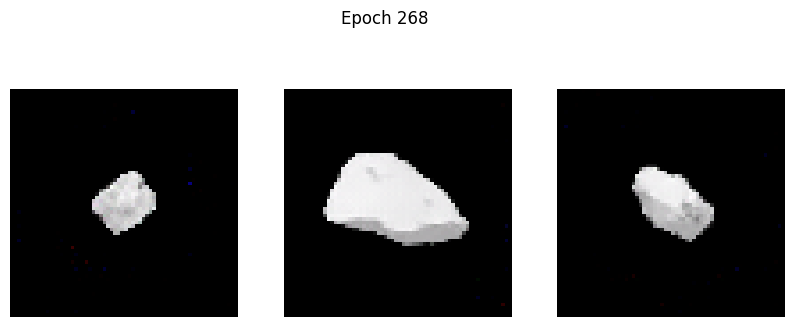

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1109 - g_loss: 4.0608
Epoch 269/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1384 - g_loss: 3.8678

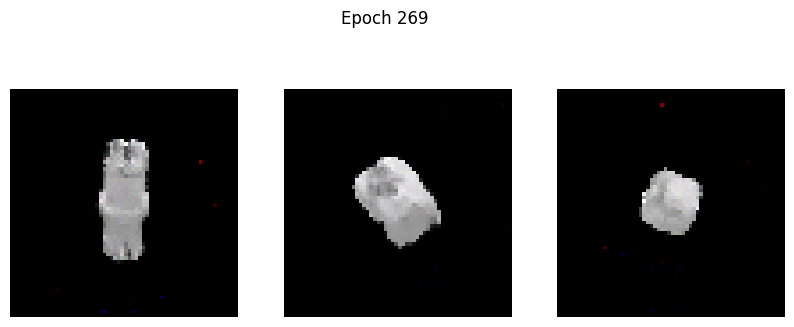

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1391 - g_loss: 3.8688
Epoch 270/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0826 - g_loss: 3.7156

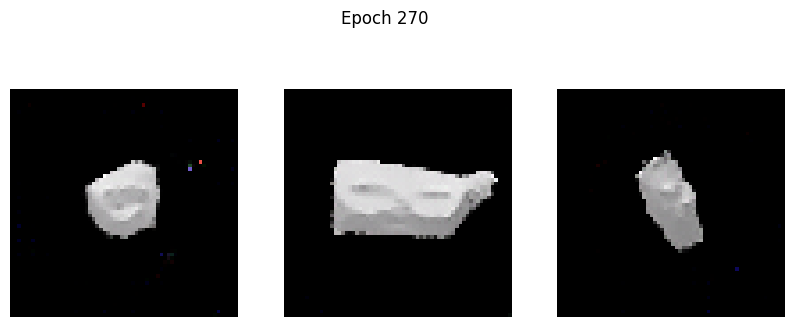

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0826 - g_loss: 3.7160
Epoch 271/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0911 - g_loss: 3.8776

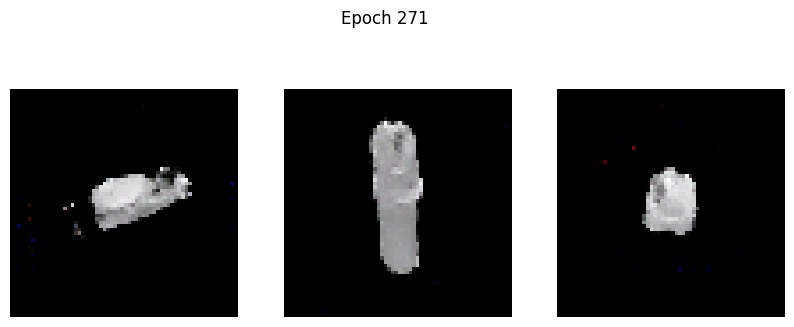

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0912 - g_loss: 3.8781
Epoch 272/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0823 - g_loss: 3.8605

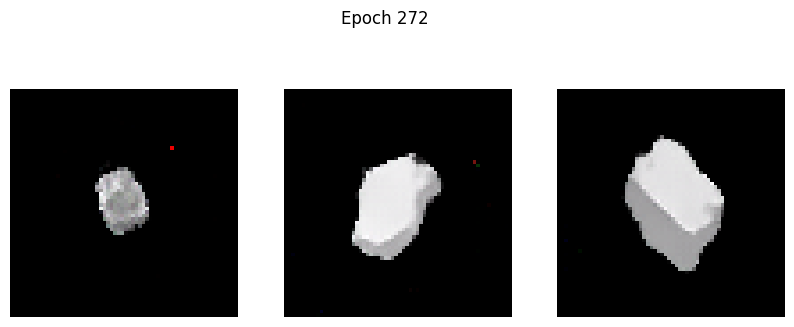

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0822 - g_loss: 3.8603
Epoch 273/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0706 - g_loss: 3.9186

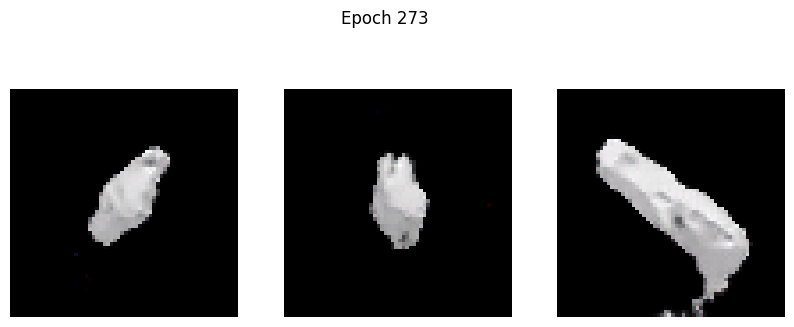

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0708 - g_loss: 3.9192
Epoch 274/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2315 - g_loss: 4.4061

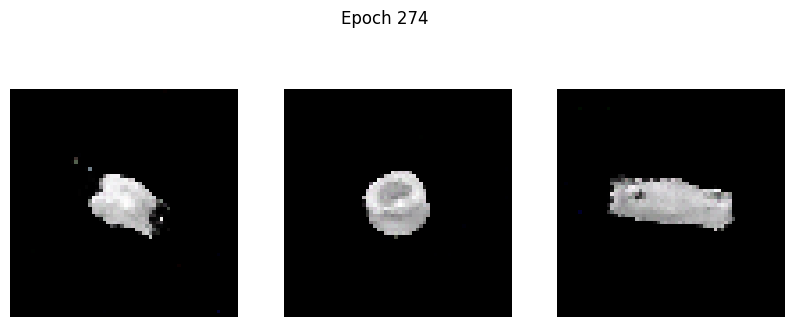

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2306 - g_loss: 4.4031
Epoch 275/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1437 - g_loss: 4.0267

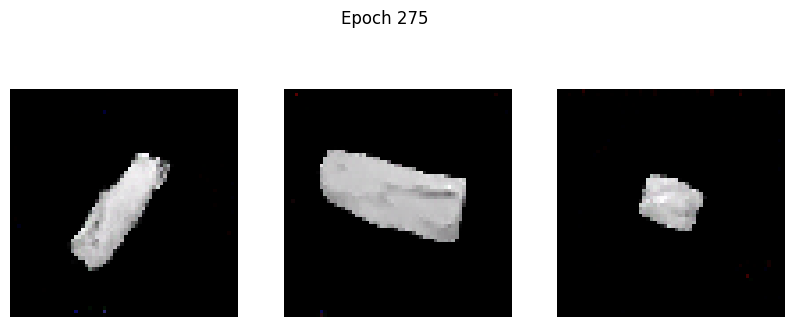

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1439 - g_loss: 4.0267
Epoch 276/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0690 - g_loss: 3.8346

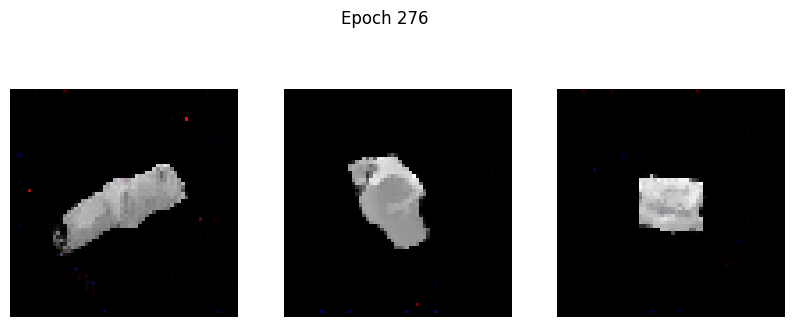

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0690 - g_loss: 3.8347
Epoch 277/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0785 - g_loss: 3.9578

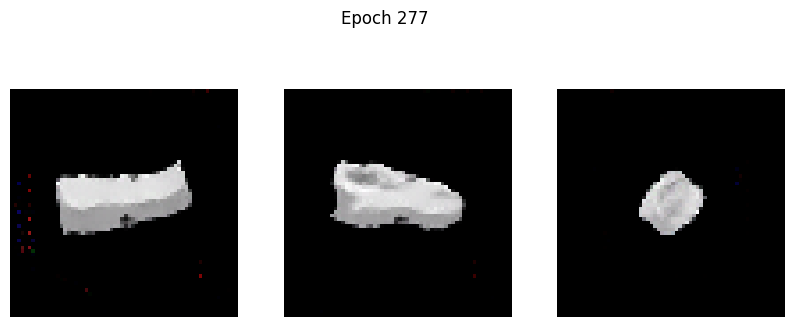

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0786 - g_loss: 3.9571
Epoch 278/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.3786 - g_loss: 4.3262

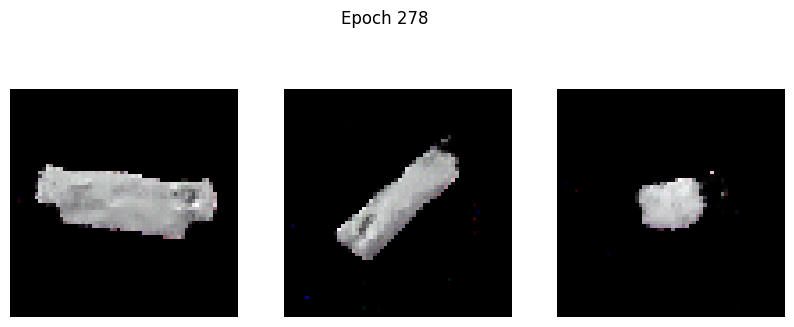

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.3805 - g_loss: 4.3264
Epoch 279/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1229 - g_loss: 3.4307

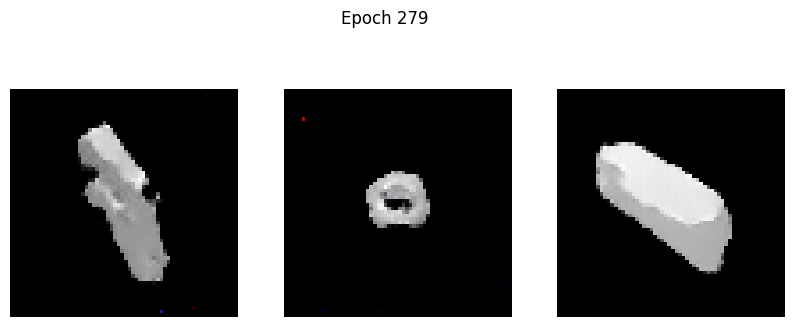

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1228 - g_loss: 3.4313
Epoch 280/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0759 - g_loss: 3.7099

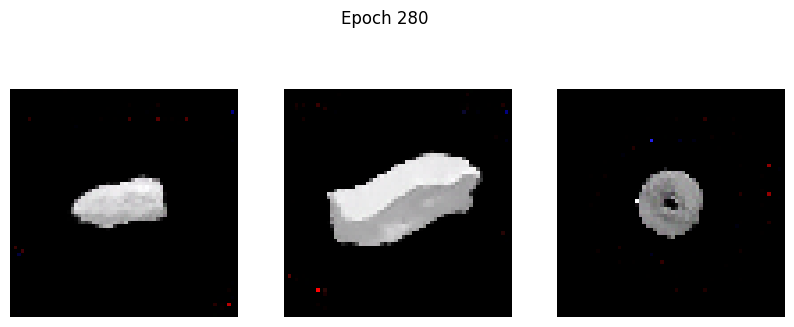

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0759 - g_loss: 3.7097
Epoch 281/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0667 - g_loss: 3.7095

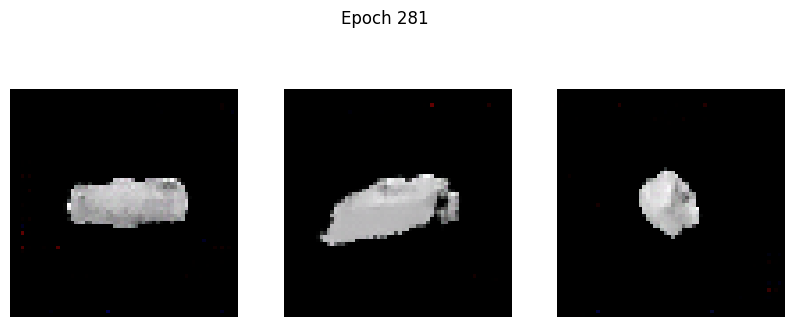

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0669 - g_loss: 3.7108
Epoch 282/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0783 - g_loss: 3.8259

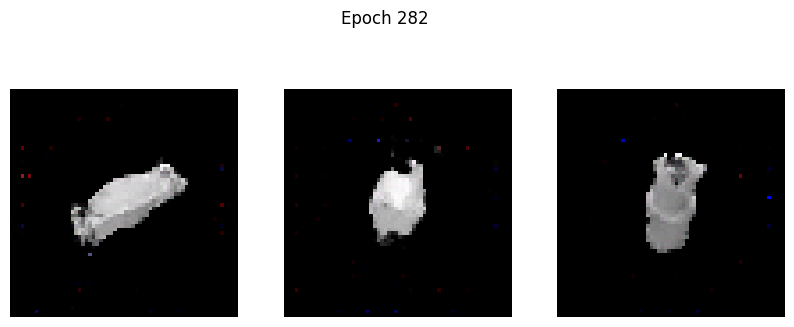

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0784 - g_loss: 3.8258
Epoch 283/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0532 - g_loss: 3.8094

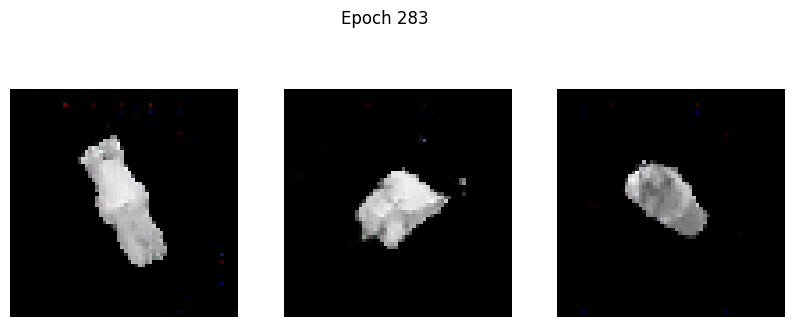

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0532 - g_loss: 3.8095
Epoch 284/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0745 - g_loss: 3.9132

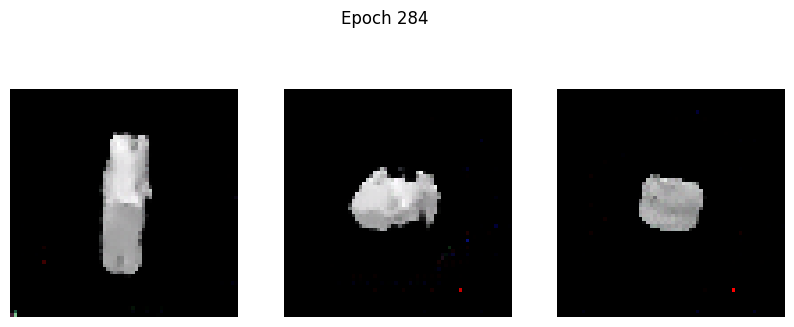

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0745 - g_loss: 3.9134
Epoch 285/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1073 - g_loss: 3.9245

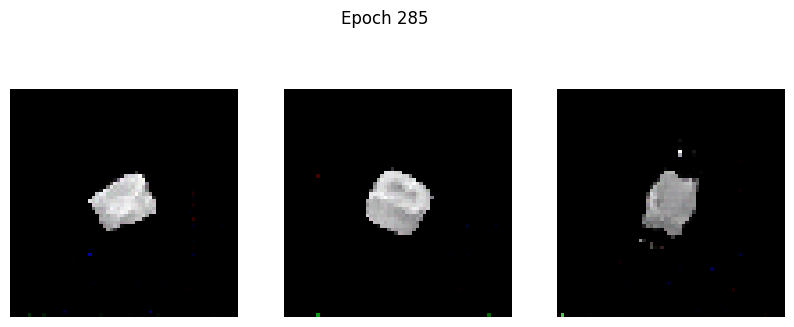

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1072 - g_loss: 3.9254
Epoch 286/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0844 - g_loss: 4.0016

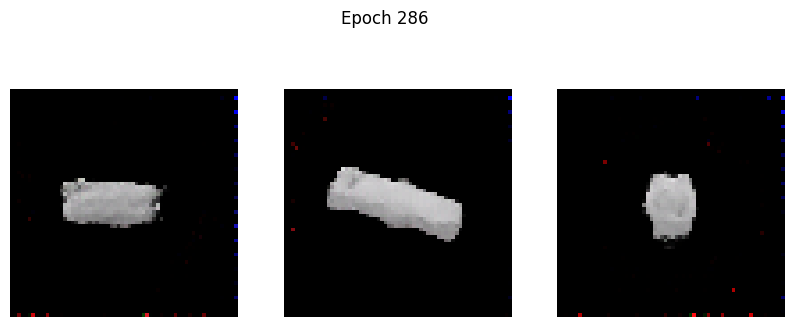

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0845 - g_loss: 4.0016
Epoch 287/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0835 - g_loss: 4.0611

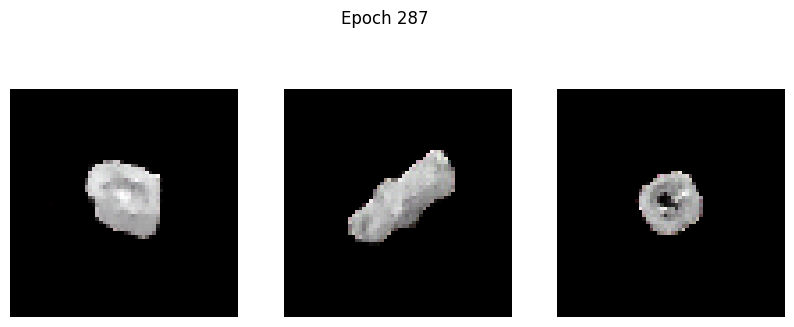

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0850 - g_loss: 4.0629
Epoch 288/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1668 - g_loss: 4.2058

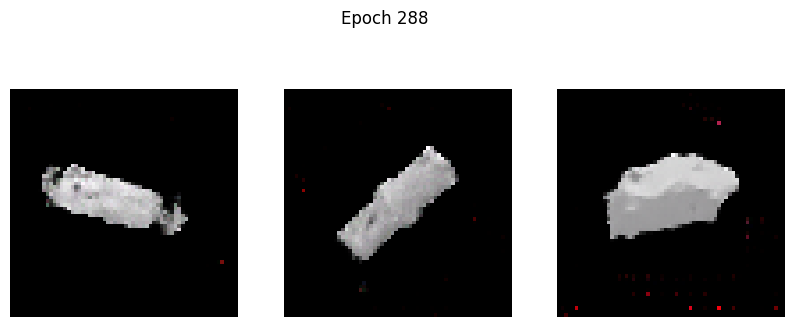

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1662 - g_loss: 4.2031
Epoch 289/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0717 - g_loss: 3.8983

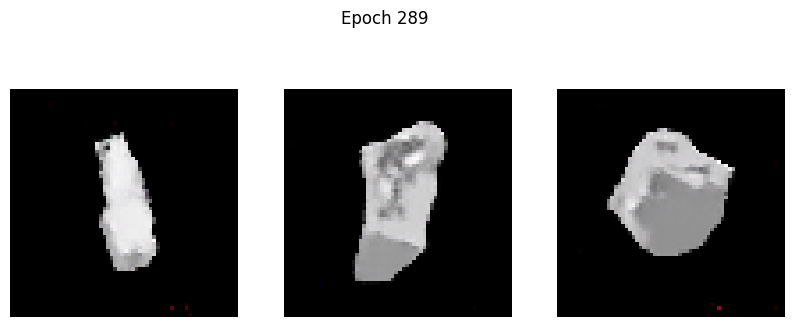

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0718 - g_loss: 3.8988
Epoch 290/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2022 - g_loss: 4.2229

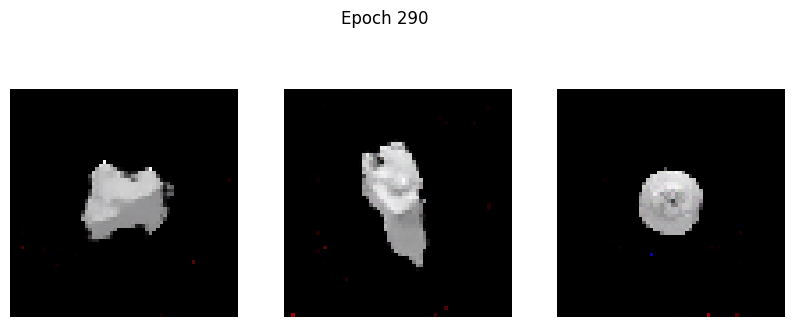

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2017 - g_loss: 4.2210
Epoch 291/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0572 - g_loss: 3.8639

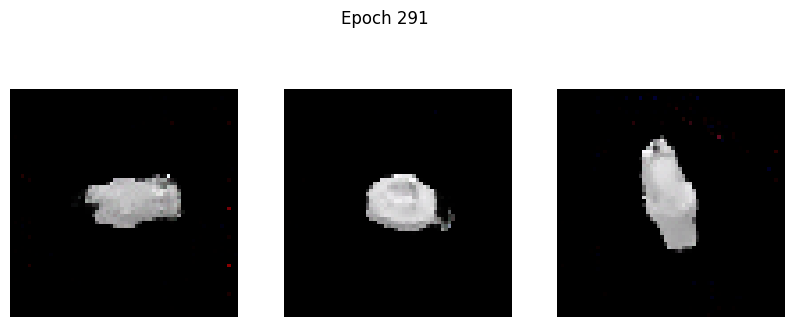

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0573 - g_loss: 3.8646
Epoch 292/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0673 - g_loss: 3.9800

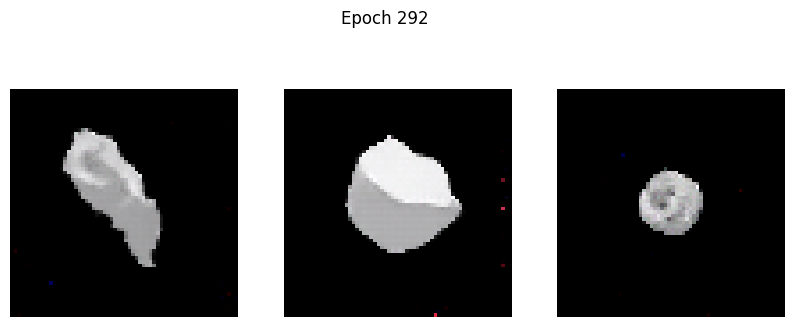

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0674 - g_loss: 3.9805
Epoch 293/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0974 - g_loss: 4.0262

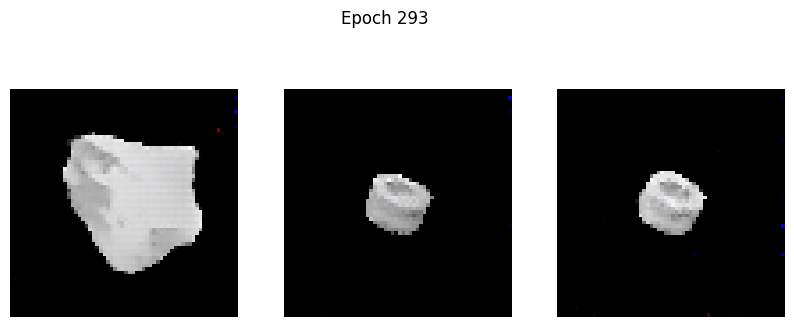

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0973 - g_loss: 4.0256
Epoch 294/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0920 - g_loss: 4.1829

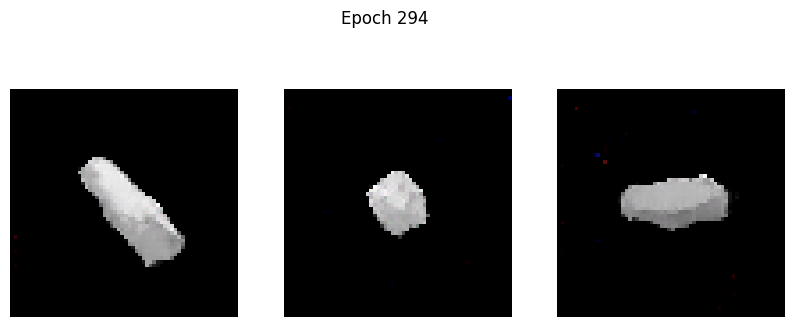

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0919 - g_loss: 4.1815
Epoch 295/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0736 - g_loss: 3.9990

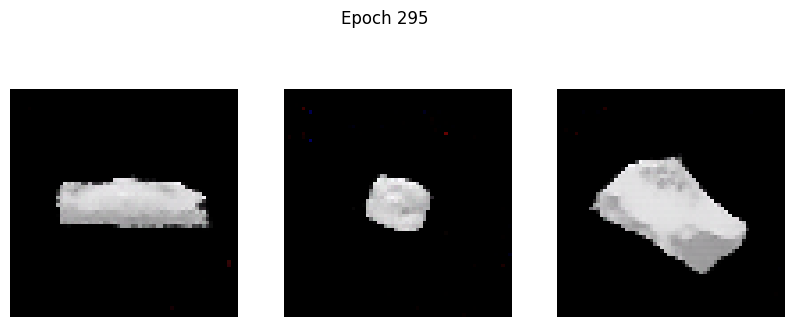

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0735 - g_loss: 3.9990
Epoch 296/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1203 - g_loss: 4.2414

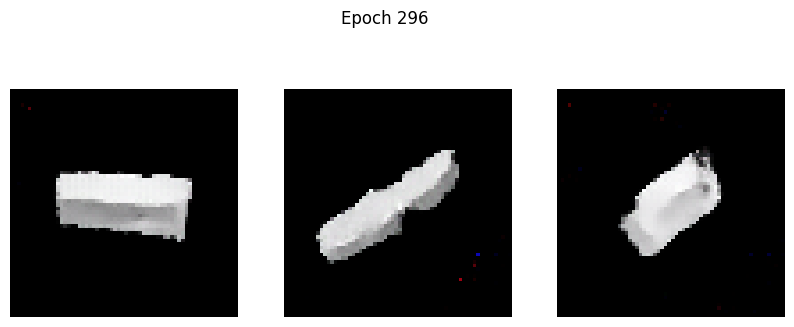

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1204 - g_loss: 4.2413
Epoch 297/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2556 - g_loss: 4.3765

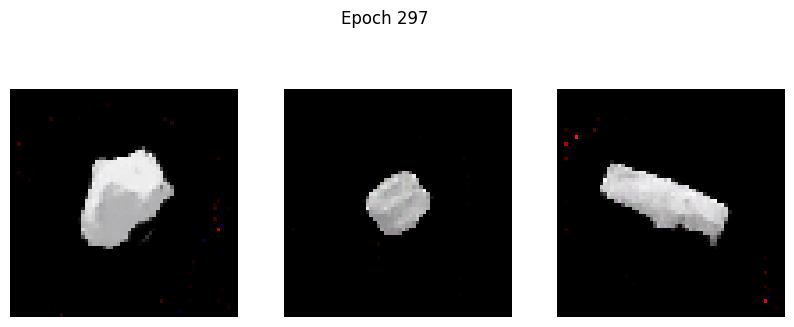

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2559 - g_loss: 4.3754
Epoch 298/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0709 - g_loss: 3.8678

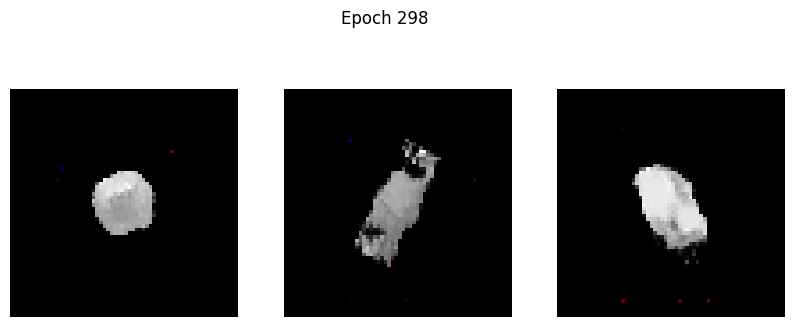

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0709 - g_loss: 3.8680
Epoch 299/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0659 - g_loss: 3.9538

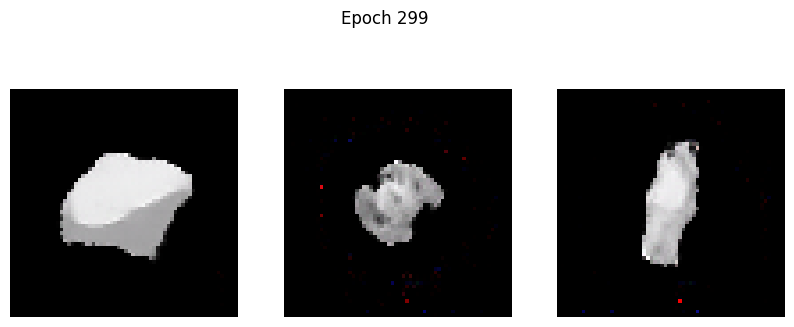

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0658 - g_loss: 3.9533
Epoch 300/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0558 - g_loss: 3.9147

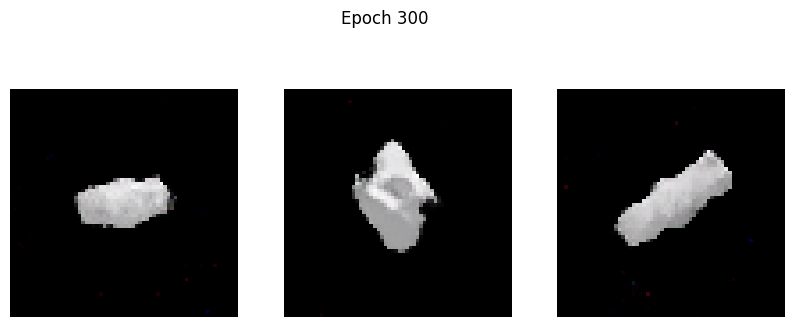

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0559 - g_loss: 3.9155
Epoch 301/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0821 - g_loss: 4.0570

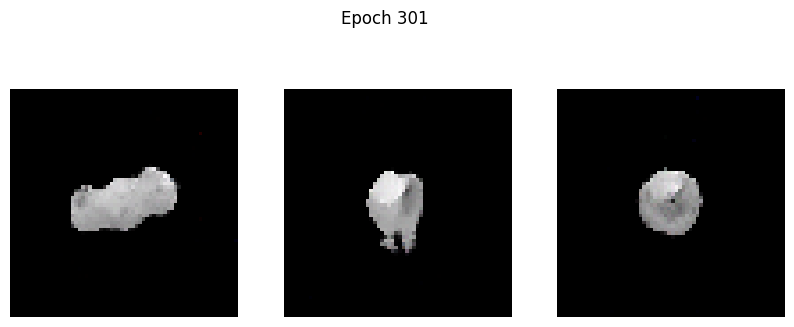

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0819 - g_loss: 4.0564
Epoch 302/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0562 - g_loss: 3.9934

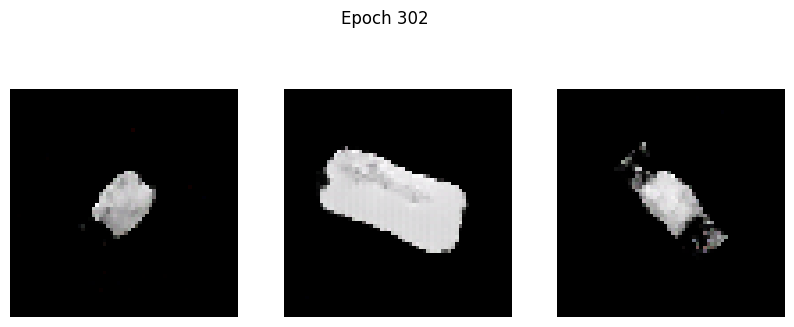

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0566 - g_loss: 3.9950
Epoch 303/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0722 - g_loss: 4.1934

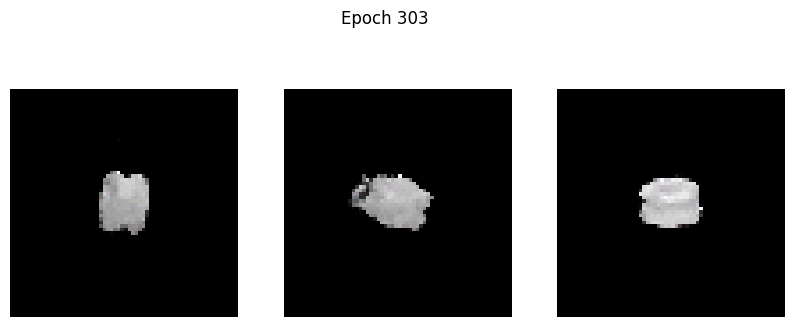

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0719 - g_loss: 4.1935
Epoch 304/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0724 - g_loss: 4.2230

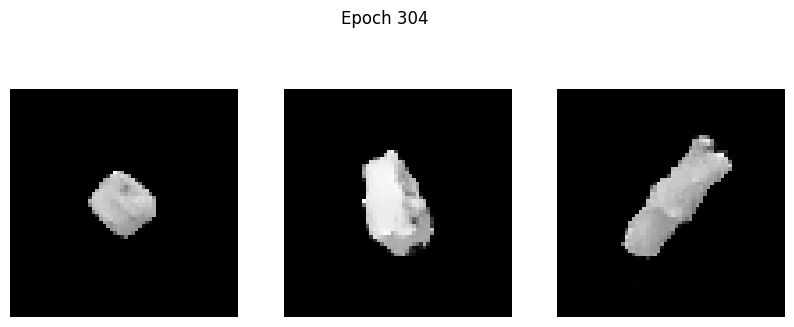

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0725 - g_loss: 4.2227
Epoch 305/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1153 - g_loss: 4.4535

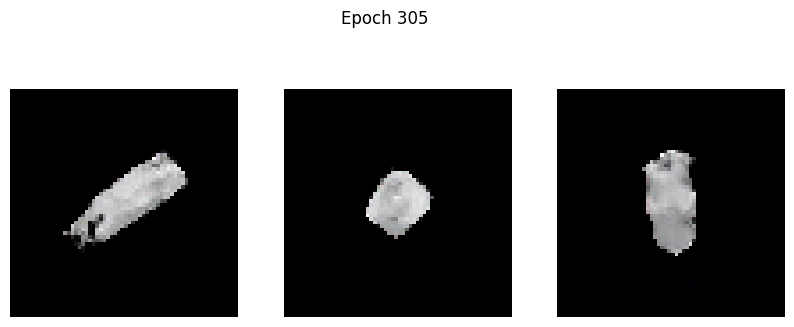

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1152 - g_loss: 4.4515
Epoch 306/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0713 - g_loss: 4.0418

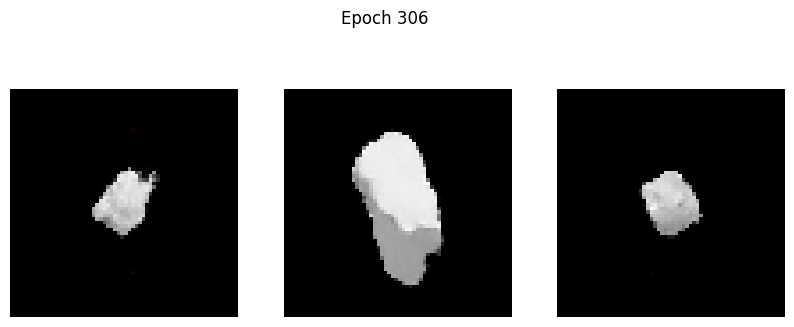

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0713 - g_loss: 4.0426
Epoch 307/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0931 - g_loss: 4.1831

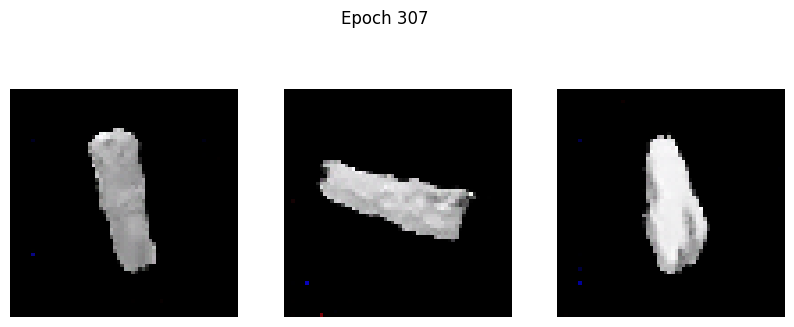

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0931 - g_loss: 4.1836
Epoch 308/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0838 - g_loss: 4.3219

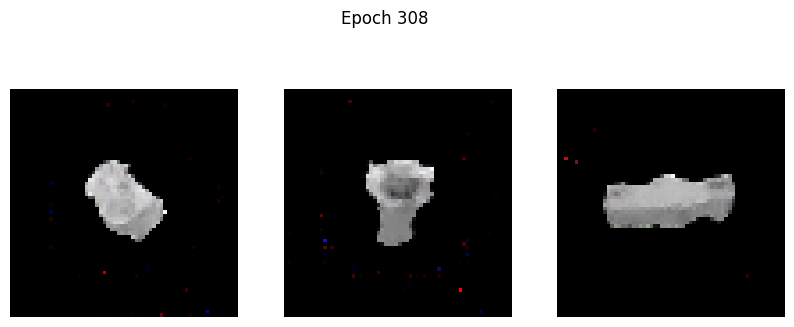

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0841 - g_loss: 4.3206
Epoch 309/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0919 - g_loss: 4.1333

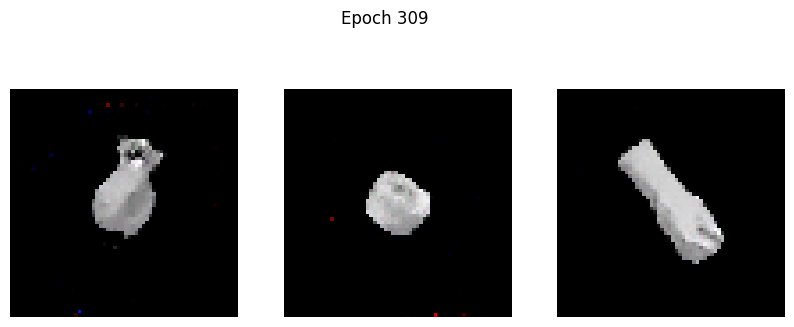

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0919 - g_loss: 4.1334
Epoch 310/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1052 - g_loss: 4.2223

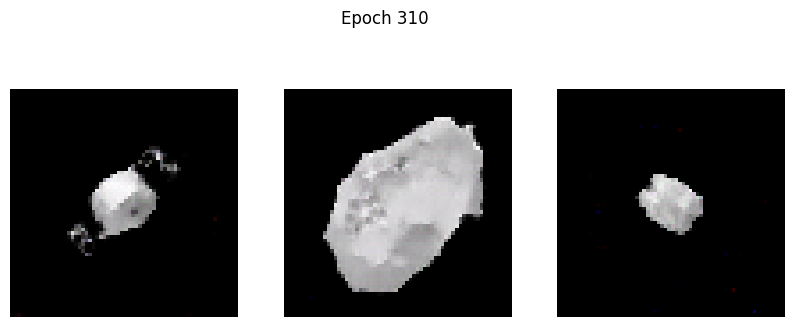

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1062 - g_loss: 4.2236
Epoch 311/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0788 - g_loss: 3.9340

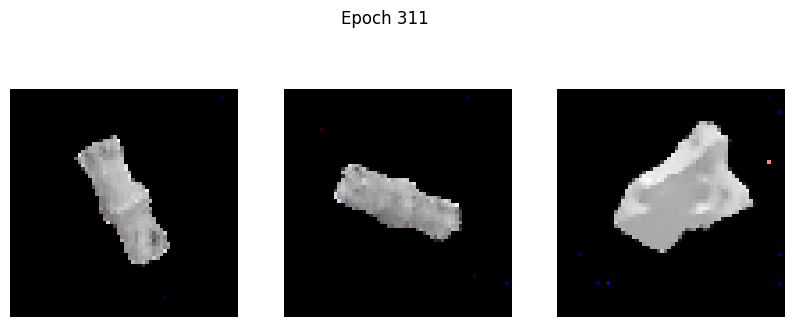

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0787 - g_loss: 3.9344
Epoch 312/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0434 - g_loss: 4.0351

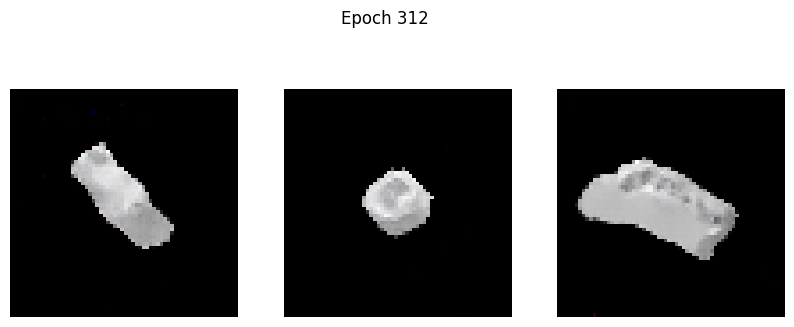

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0436 - g_loss: 4.0362
Epoch 313/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0772 - g_loss: 4.1723

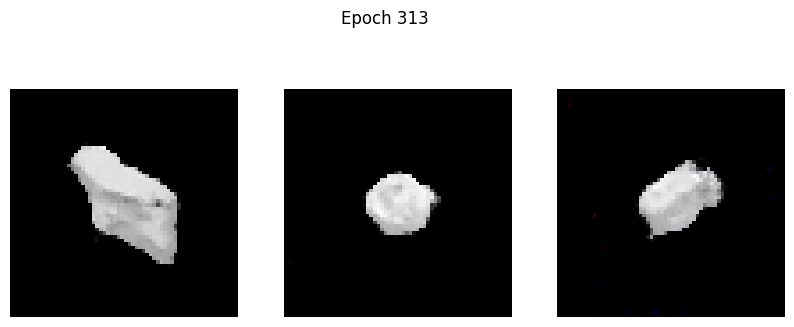

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0771 - g_loss: 4.1719
Epoch 314/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0490 - g_loss: 4.1714

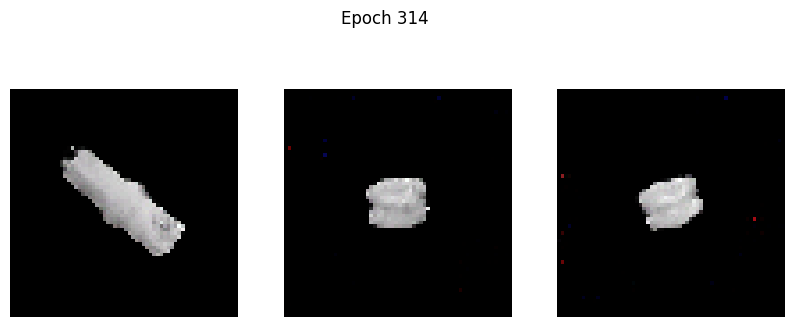

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0492 - g_loss: 4.1713
Epoch 315/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2774 - g_loss: 4.7731

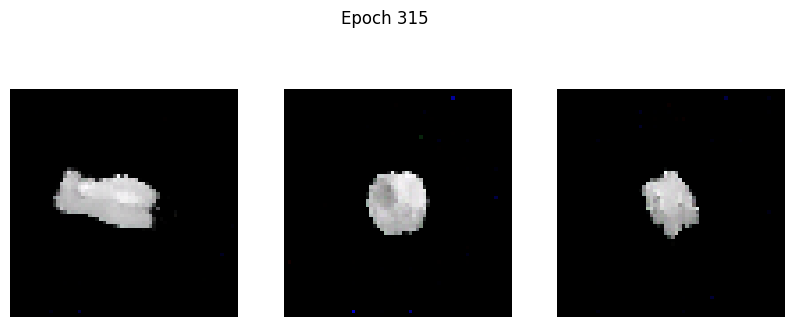

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2762 - g_loss: 4.7689
Epoch 316/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0438 - g_loss: 4.1014

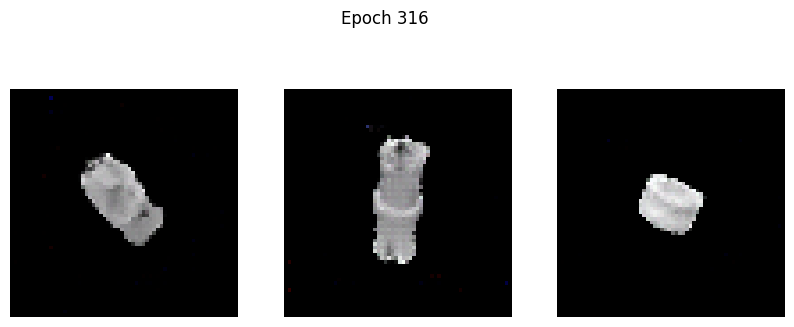

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0438 - g_loss: 4.1013
Epoch 317/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1101 - g_loss: 4.3807

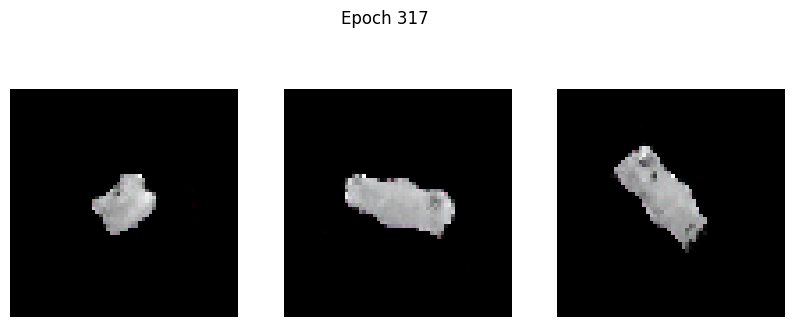

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1117 - g_loss: 4.3831
Epoch 318/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1493 - g_loss: 4.2940

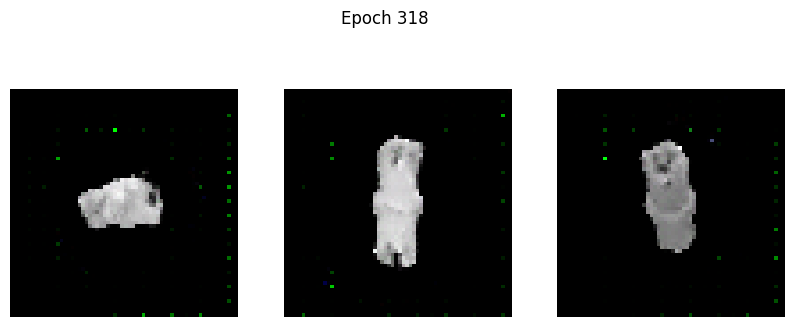

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 0.1489 - g_loss: 4.2924
Epoch 319/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0753 - g_loss: 4.1068

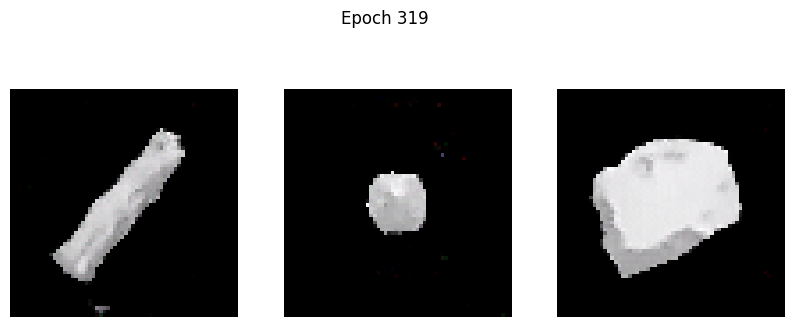

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0752 - g_loss: 4.1064
Epoch 320/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0592 - g_loss: 4.1809

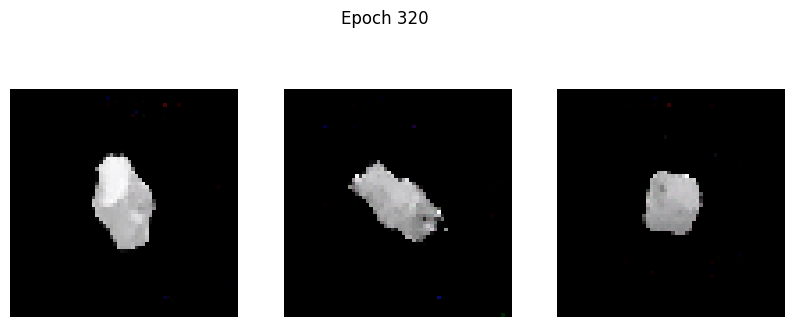

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0593 - g_loss: 4.1805
Epoch 321/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0381 - g_loss: 4.1232

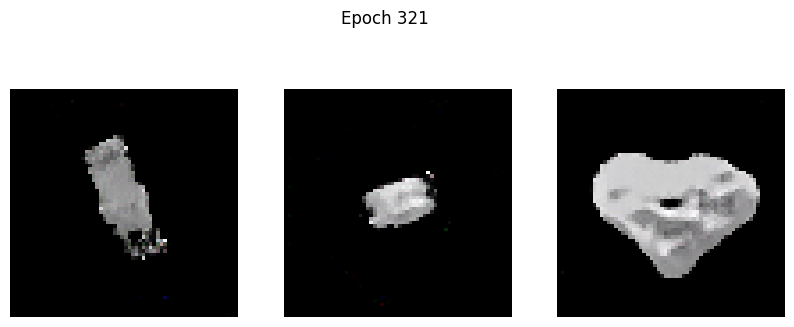

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0384 - g_loss: 4.1236
Epoch 322/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0903 - g_loss: 4.3447

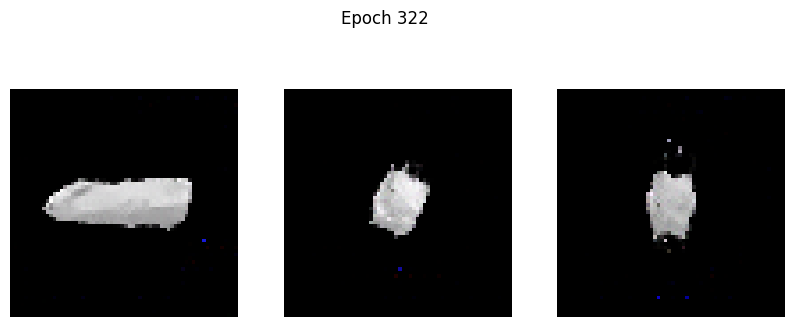

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0911 - g_loss: 4.3444
Epoch 323/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0800 - g_loss: 4.2166

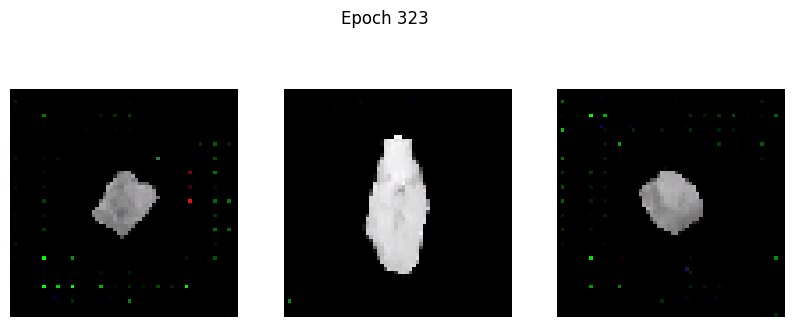

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0801 - g_loss: 4.2164
Epoch 324/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0713 - g_loss: 4.1295

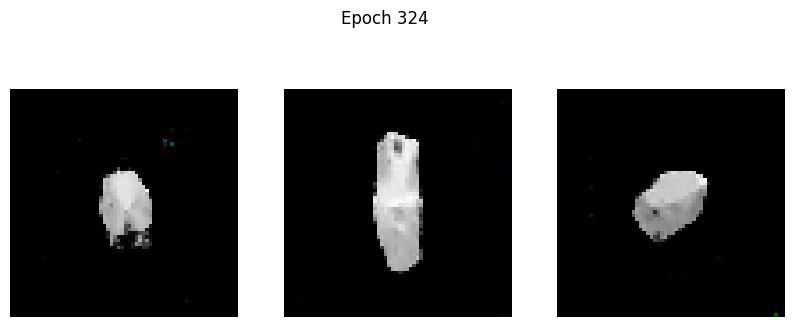

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0712 - g_loss: 4.1293
Epoch 325/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0767 - g_loss: 4.2814

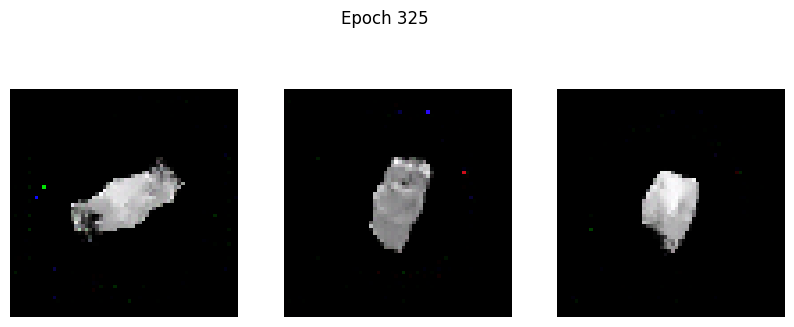

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0770 - g_loss: 4.2817
Epoch 326/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0551 - g_loss: 4.1942

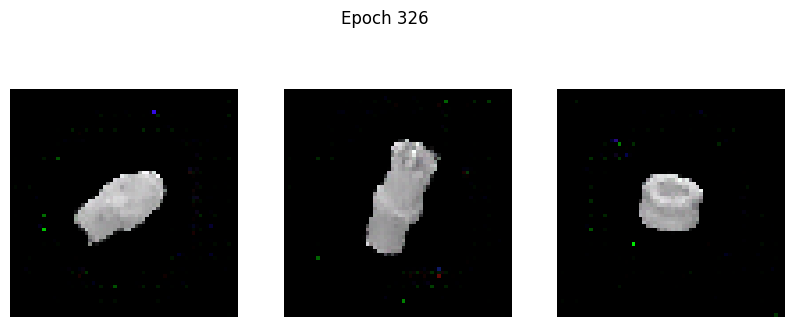

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0551 - g_loss: 4.1951
Epoch 327/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1472 - g_loss: 4.3901

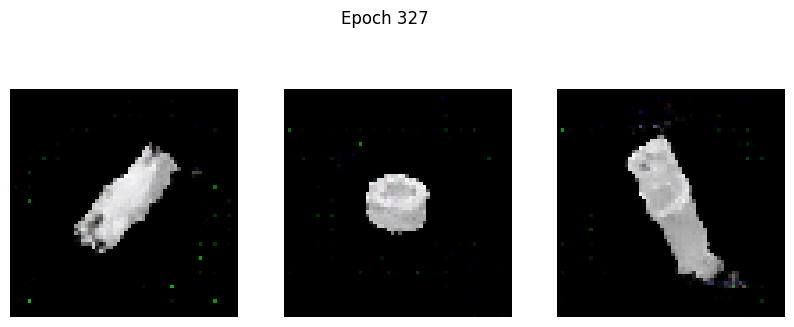

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1475 - g_loss: 4.3897
Epoch 328/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0434 - g_loss: 4.2242

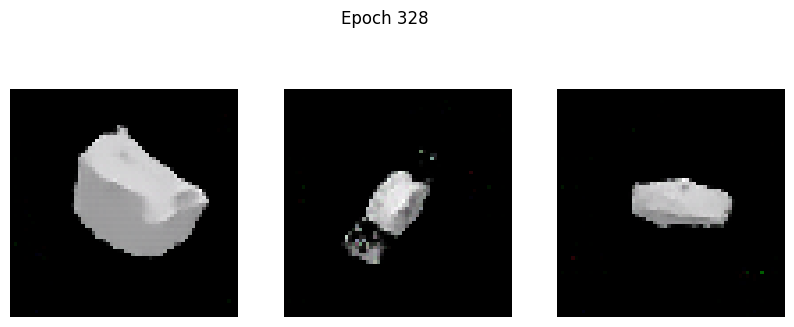

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0433 - g_loss: 4.2232
Epoch 329/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0543 - g_loss: 4.1642

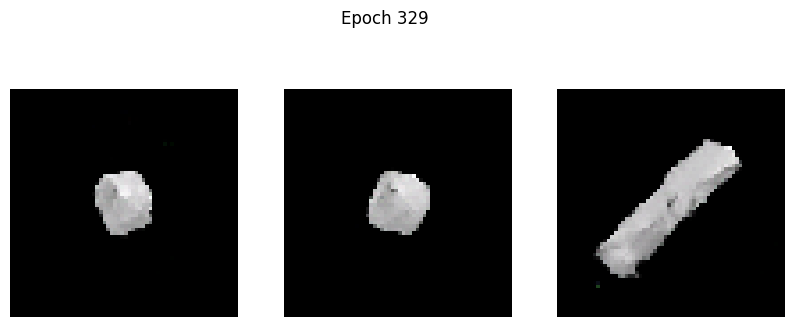

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0544 - g_loss: 4.1648
Epoch 330/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0219 - g_loss: 4.1109

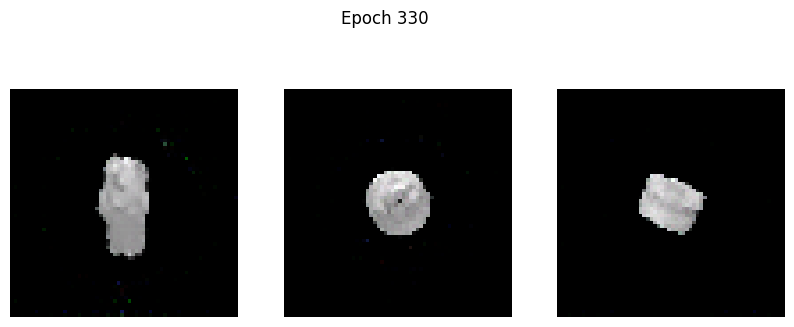

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0221 - g_loss: 4.1121
Epoch 331/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0780 - g_loss: 4.4649

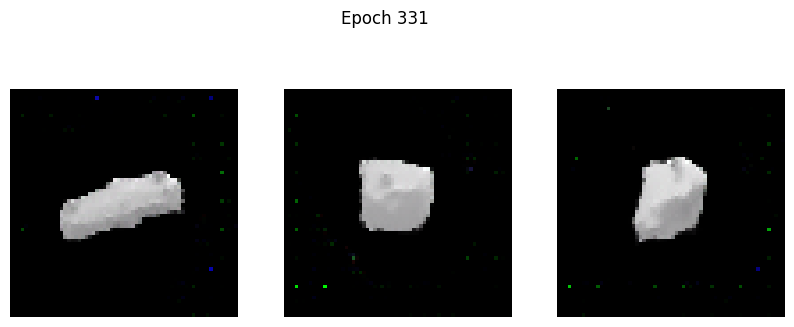

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0780 - g_loss: 4.4641
Epoch 332/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1331 - g_loss: 4.6032

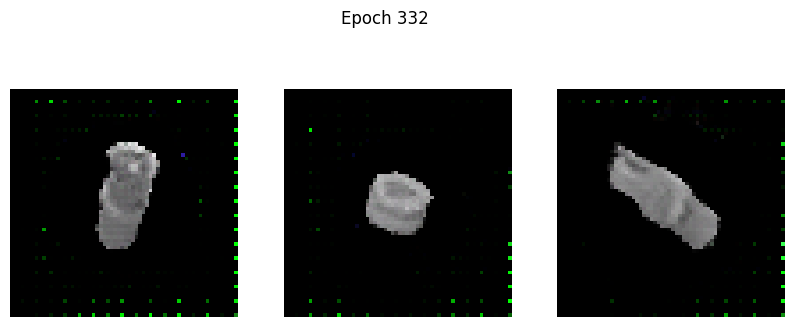

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1331 - g_loss: 4.6024
Epoch 333/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0630 - g_loss: 4.2664

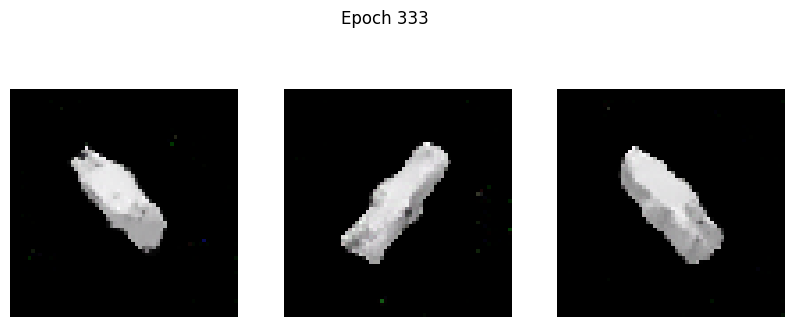

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0632 - g_loss: 4.2673
Epoch 334/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0745 - g_loss: 4.2609

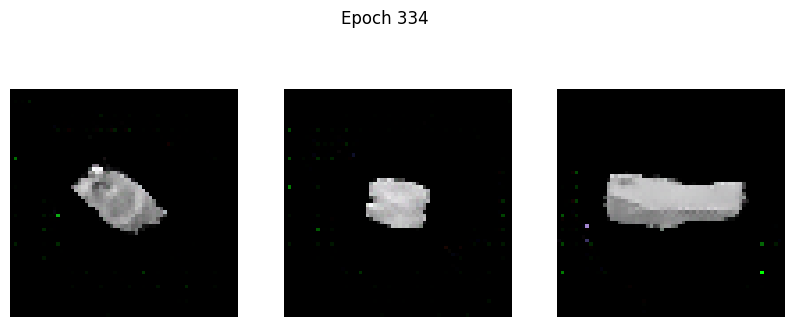

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0744 - g_loss: 4.2609
Epoch 335/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0569 - g_loss: 4.2947

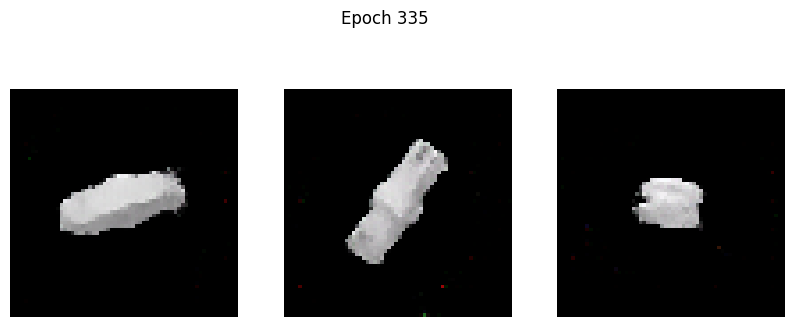

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0569 - g_loss: 4.2947
Epoch 336/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0581 - g_loss: 4.4020

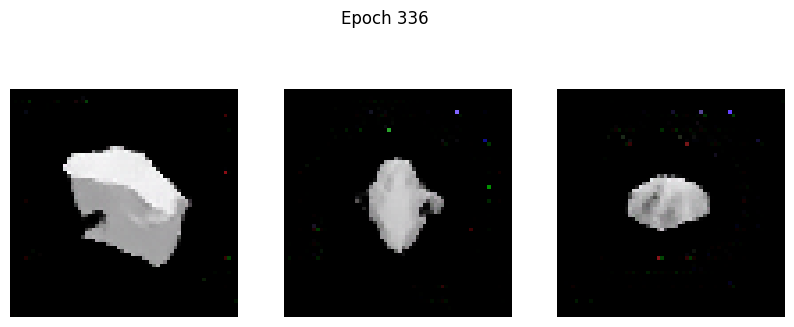

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0580 - g_loss: 4.4013
Epoch 337/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0606 - g_loss: 4.4392

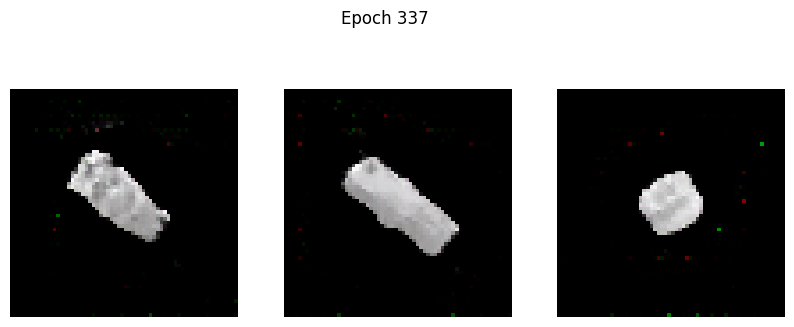

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0609 - g_loss: 4.4406
Epoch 338/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0407 - g_loss: 4.2329

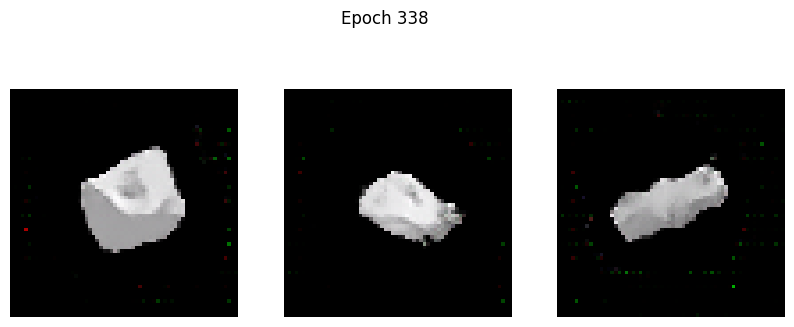

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0409 - g_loss: 4.2339
Epoch 339/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0697 - g_loss: 4.4369

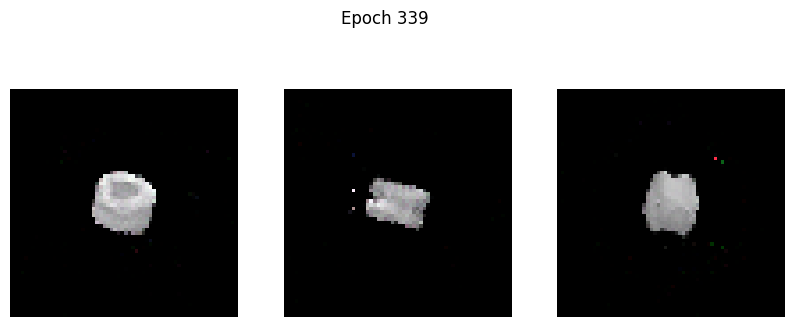

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0699 - g_loss: 4.4372
Epoch 340/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0597 - g_loss: 4.3444

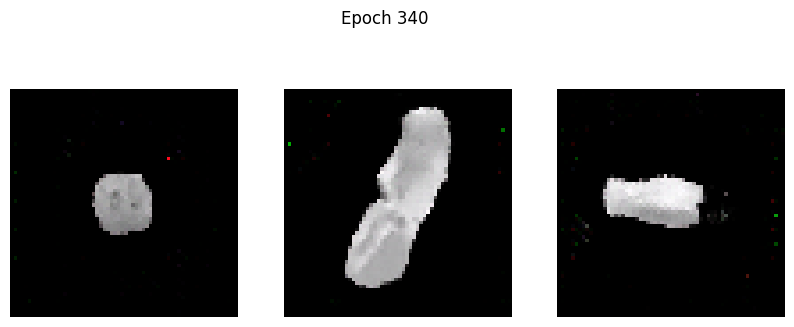

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0597 - g_loss: 4.3439
Epoch 341/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1592 - g_loss: 4.8599

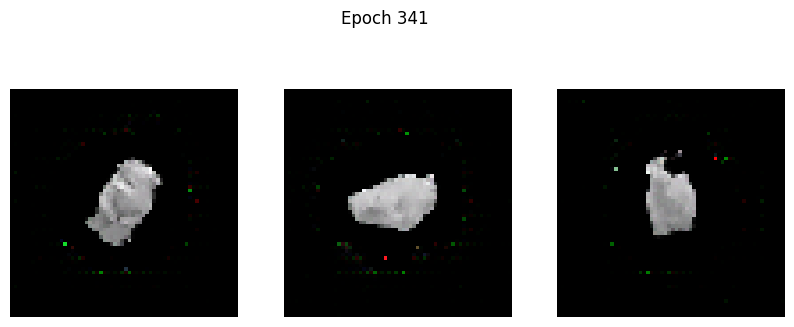

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1595 - g_loss: 4.8599
Epoch 342/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0613 - g_loss: 4.2100

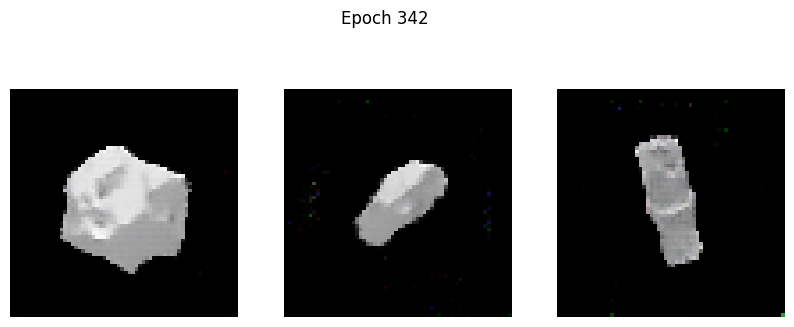

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0613 - g_loss: 4.2110
Epoch 343/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0865 - g_loss: 4.4482

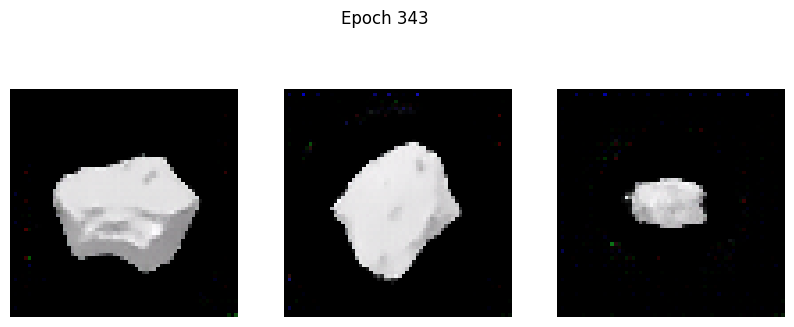

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0864 - g_loss: 4.4472
Epoch 344/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0716 - g_loss: 4.4018

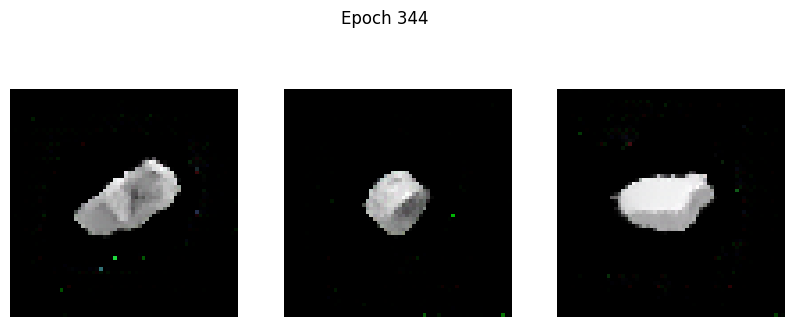

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0716 - g_loss: 4.4017
Epoch 345/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2503 - g_loss: 4.9089

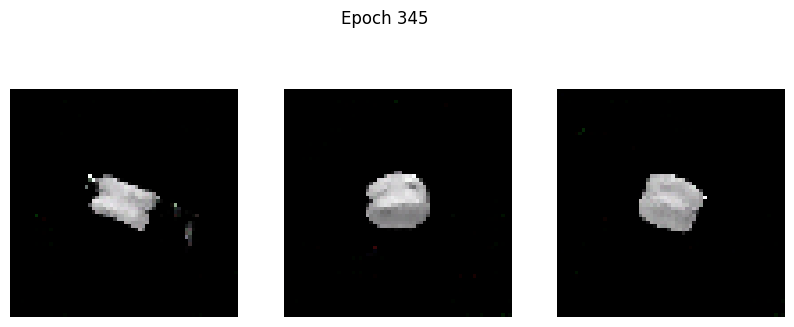

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2489 - g_loss: 4.9044
Epoch 346/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0636 - g_loss: 4.4518

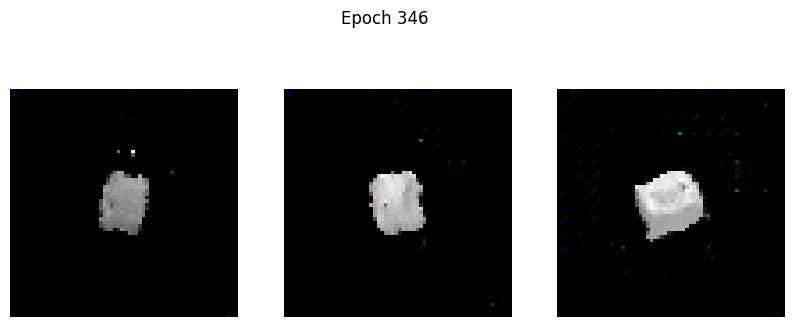

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0637 - g_loss: 4.4520
Epoch 347/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0467 - g_loss: 4.2264

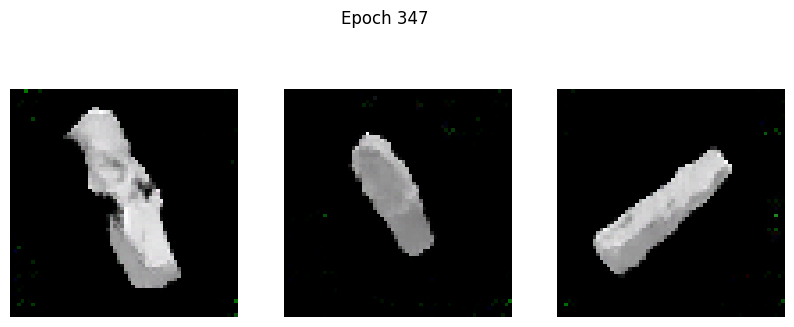

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0469 - g_loss: 4.2271
Epoch 348/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0824 - g_loss: 4.4748

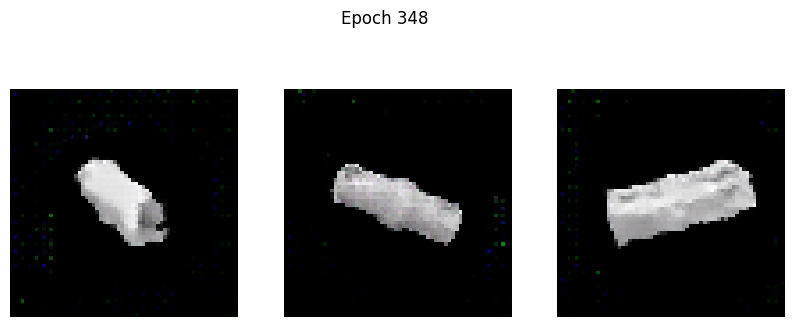

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0823 - g_loss: 4.4747
Epoch 349/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0634 - g_loss: 4.2973

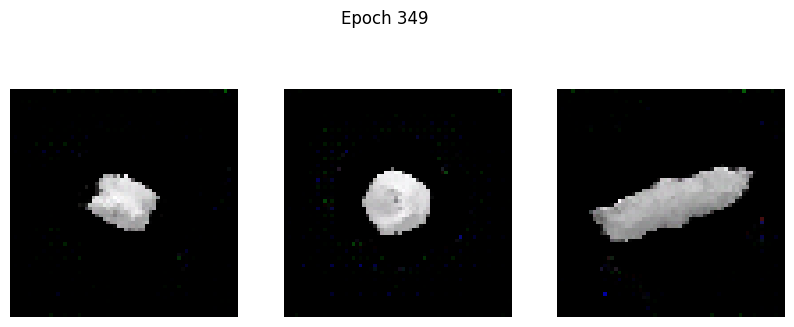

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0633 - g_loss: 4.2974
Epoch 350/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.2921 - g_loss: 5.0672

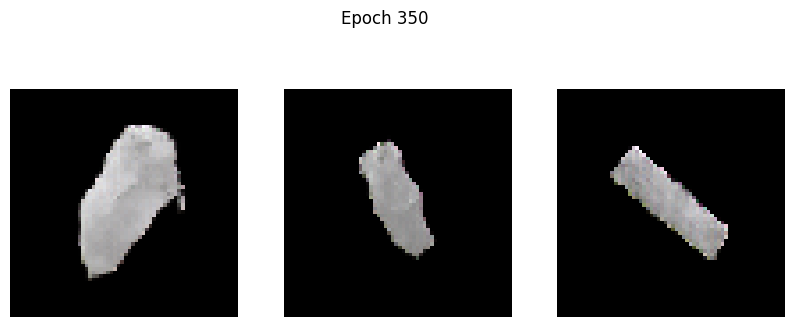

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.2945 - g_loss: 5.0721
Epoch 351/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1038 - g_loss: 4.0411

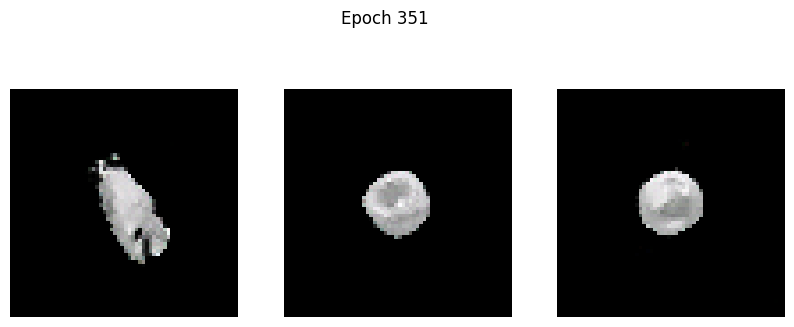

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1037 - g_loss: 4.0414
Epoch 352/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0809 - g_loss: 4.2341

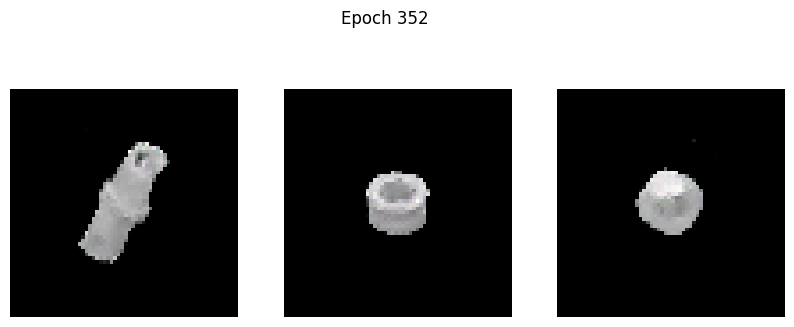

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0808 - g_loss: 4.2327
Epoch 353/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0720 - g_loss: 4.0419

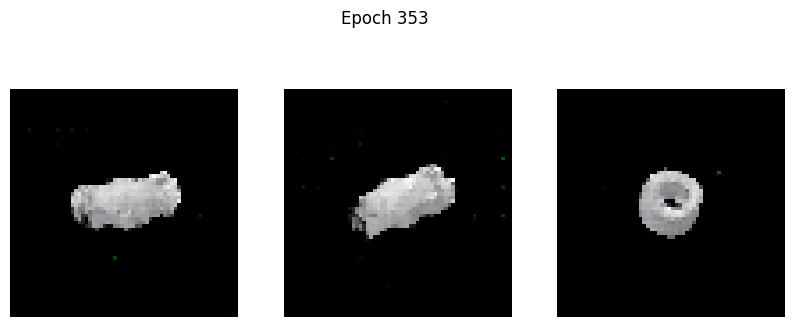

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0718 - g_loss: 4.0423
Epoch 354/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1264 - g_loss: 4.4215

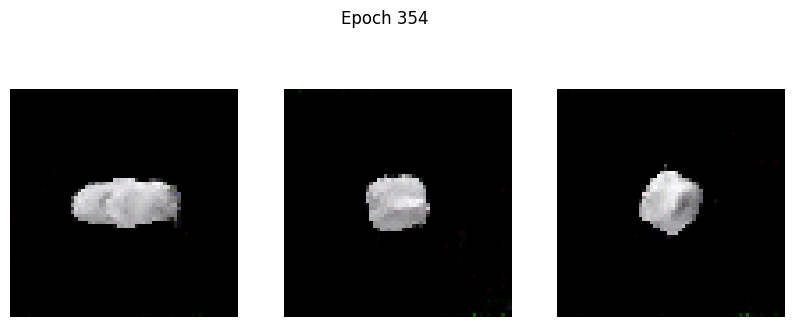

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1281 - g_loss: 4.4258
Epoch 355/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0903 - g_loss: 4.0391

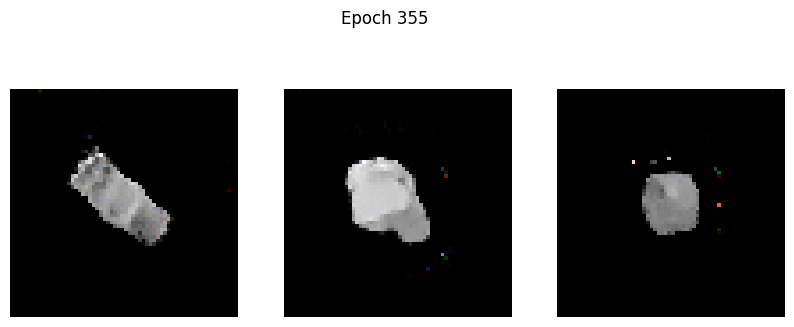

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0901 - g_loss: 4.0400
Epoch 356/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0311 - g_loss: 4.2225

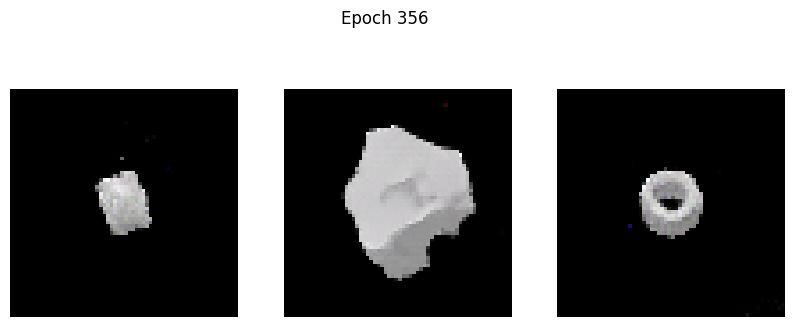

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0312 - g_loss: 4.2222
Epoch 357/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0354 - g_loss: 4.2502

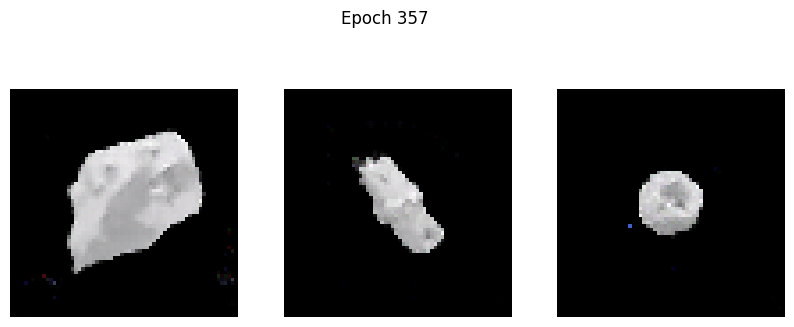

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0355 - g_loss: 4.2510
Epoch 358/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0754 - g_loss: 4.4883

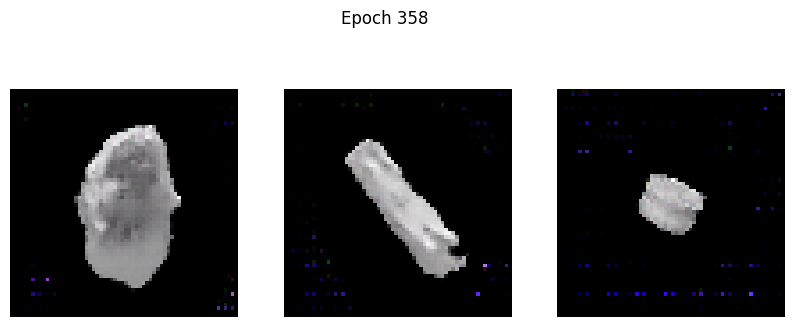

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0753 - g_loss: 4.4877
Epoch 359/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1066 - g_loss: 5.1931

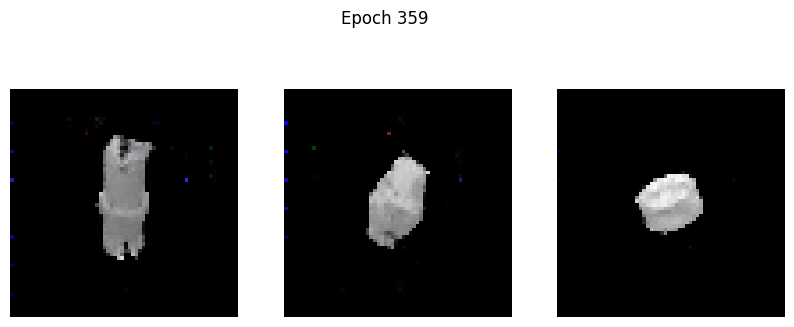

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1064 - g_loss: 5.1891
Epoch 360/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0441 - g_loss: 4.3844

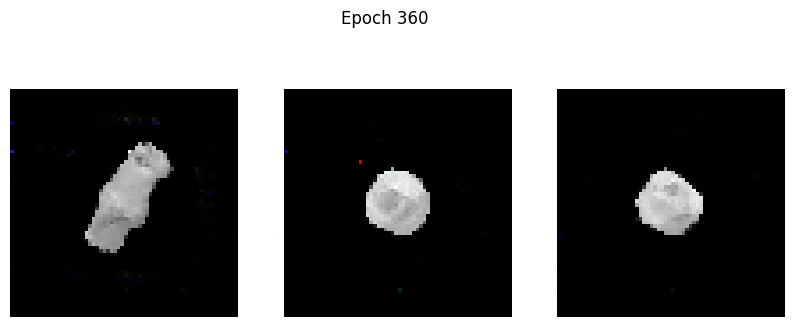

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0442 - g_loss: 4.3852
Epoch 361/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0832 - g_loss: 4.5783

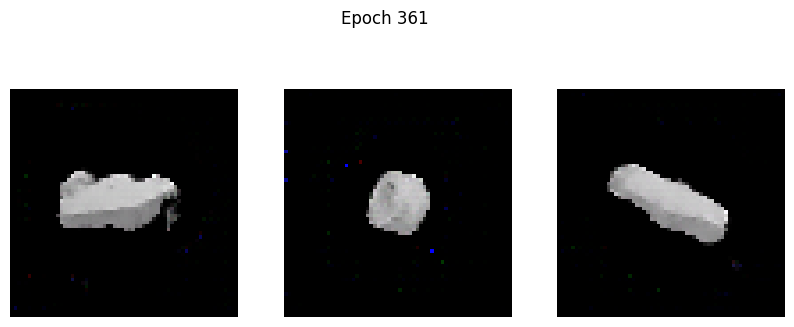

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0831 - g_loss: 4.5778
Epoch 362/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0486 - g_loss: 4.3981

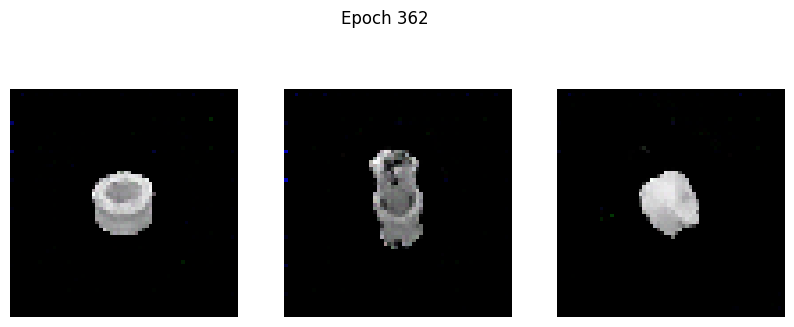

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0486 - g_loss: 4.3987
Epoch 363/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0318 - g_loss: 4.4442

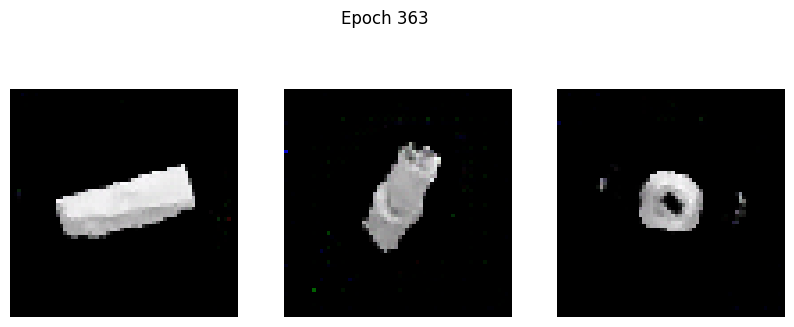

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0319 - g_loss: 4.4441
Epoch 364/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0184 - g_loss: 4.2941

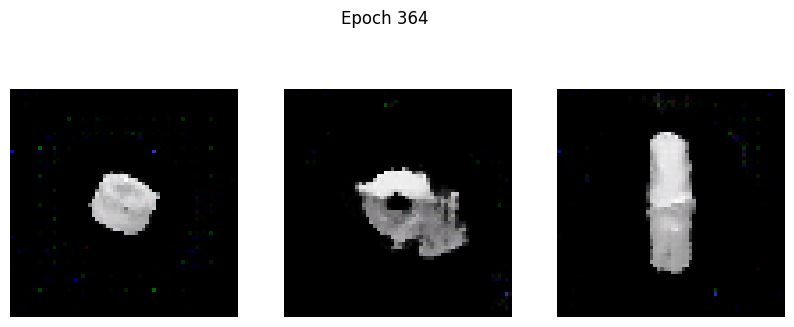

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0186 - g_loss: 4.2948
Epoch 365/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0628 - g_loss: 4.7376

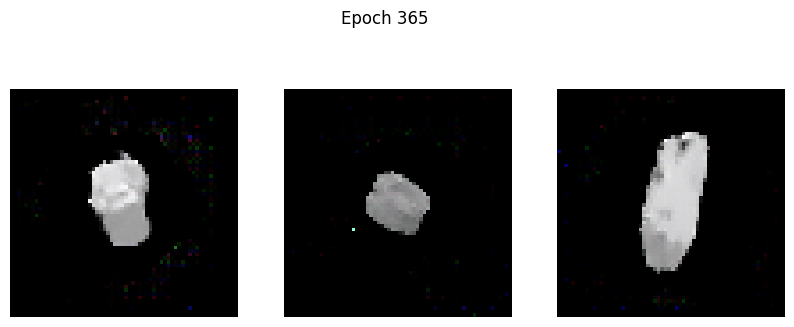

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0629 - g_loss: 4.7364
Epoch 366/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0370 - g_loss: 4.3739

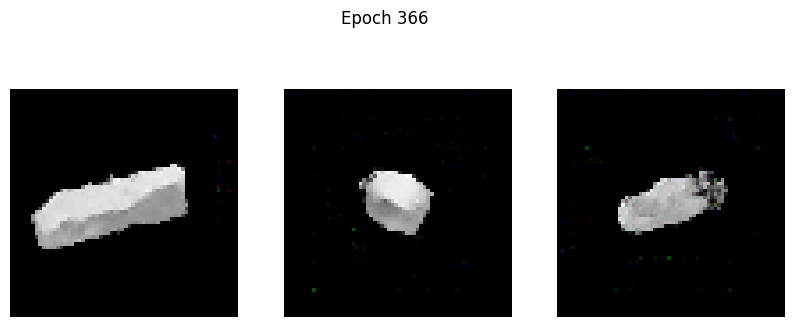

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0371 - g_loss: 4.3747
Epoch 367/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0964 - g_loss: 4.7915

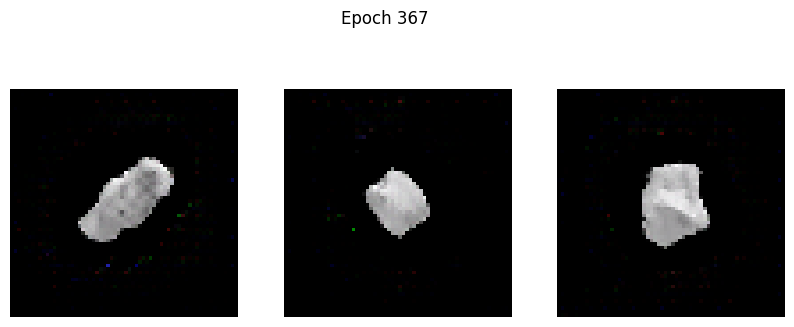

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0966 - g_loss: 4.7912
Epoch 368/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0441 - g_loss: 4.5631

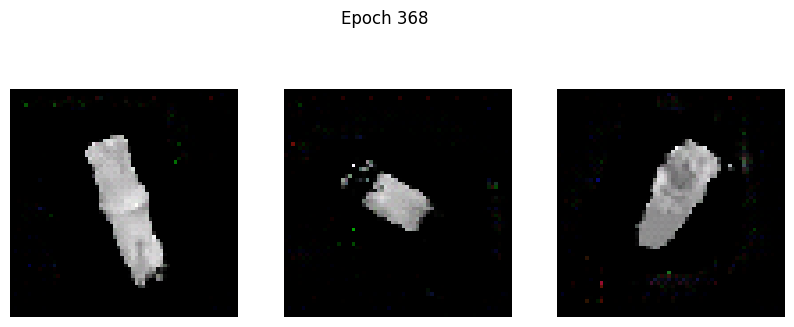

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0442 - g_loss: 4.5621
Epoch 369/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0636 - g_loss: 4.6929

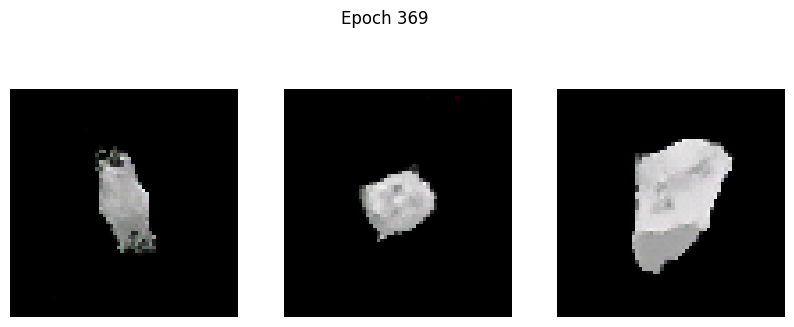

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0636 - g_loss: 4.6946
Epoch 370/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0088 - g_loss: 4.4042

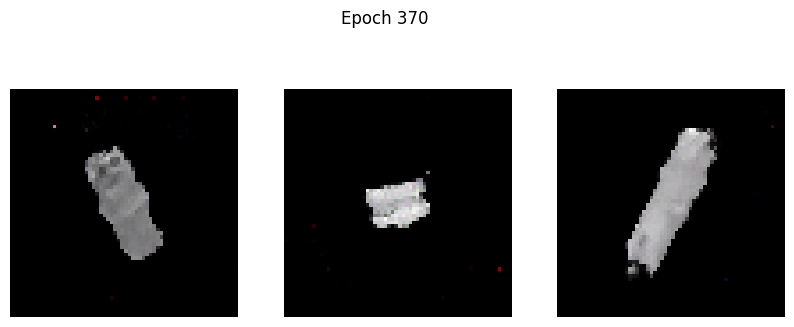

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0086 - g_loss: 4.4052
Epoch 371/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0347 - g_loss: 4.5184

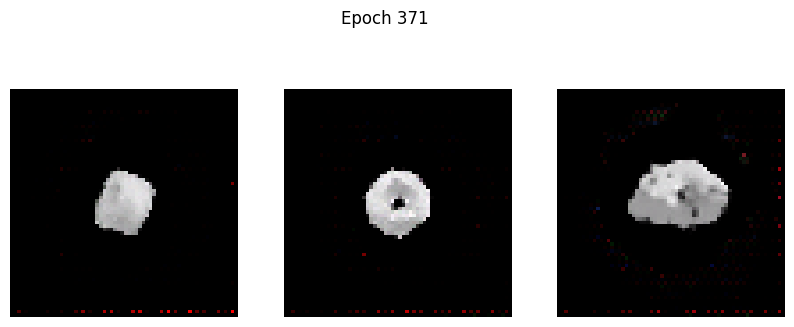

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0347 - g_loss: 4.5187
Epoch 372/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0822 - g_loss: 4.5731

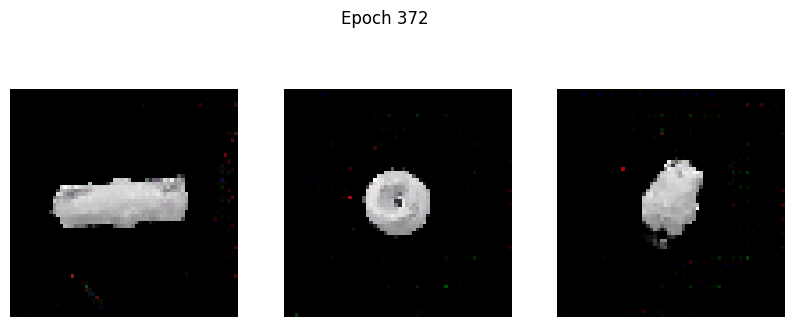

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0821 - g_loss: 4.5736
Epoch 373/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0836 - g_loss: 4.8461

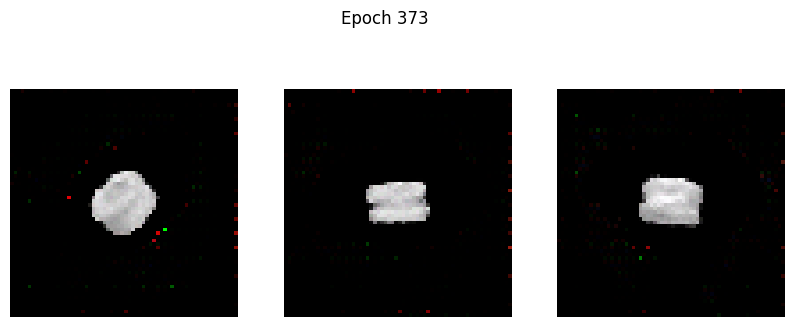

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0838 - g_loss: 4.8467
Epoch 374/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0555 - g_loss: 4.4967

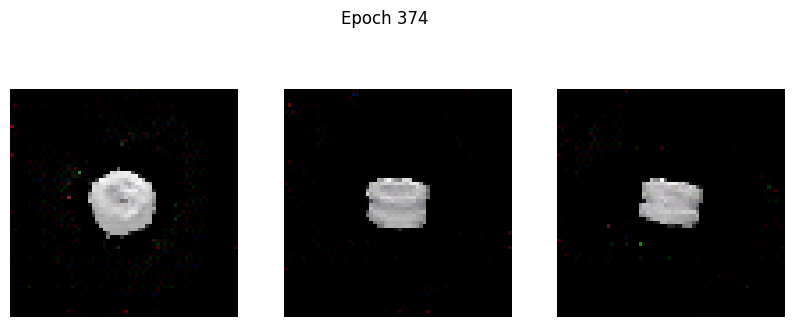

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0555 - g_loss: 4.4975
Epoch 375/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0492 - g_loss: 4.6307

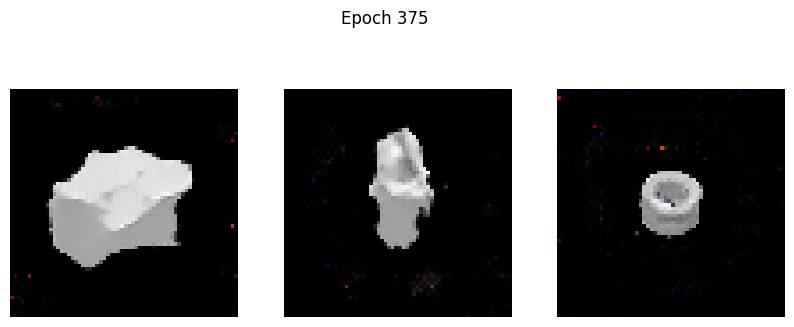

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0492 - g_loss: 4.6298
Epoch 376/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1545 - g_loss: 4.8632

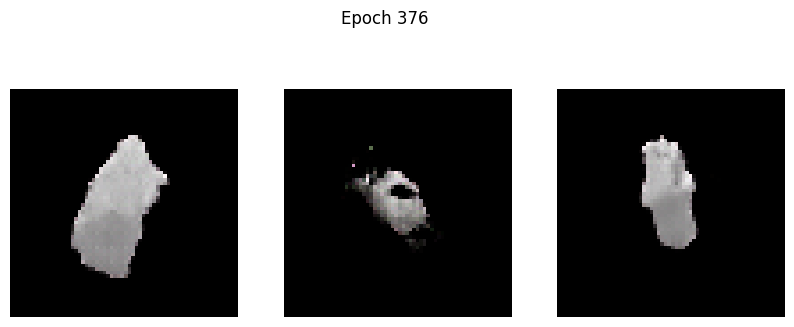

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1566 - g_loss: 4.8750
Epoch 377/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0358 - g_loss: 5.1153

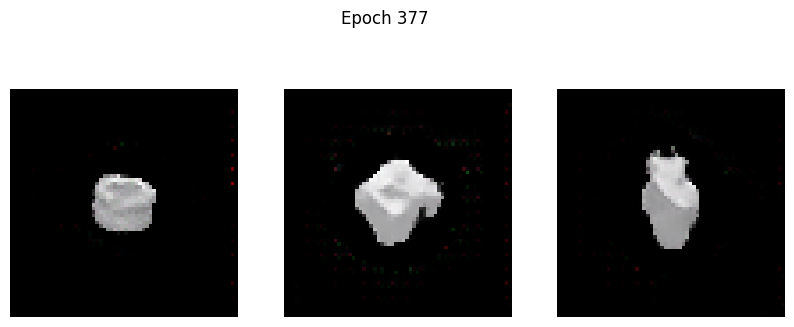

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0356 - g_loss: 5.1094
Epoch 378/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0139 - g_loss: 4.5893

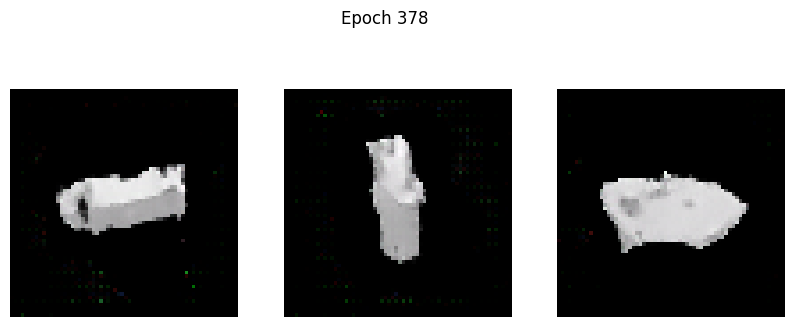

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0142 - g_loss: 4.5900
Epoch 379/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0481 - g_loss: 4.4892

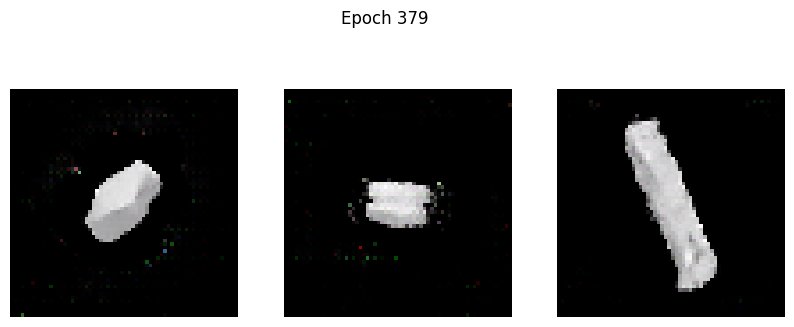

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0481 - g_loss: 4.4897
Epoch 380/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0141 - g_loss: 4.3160

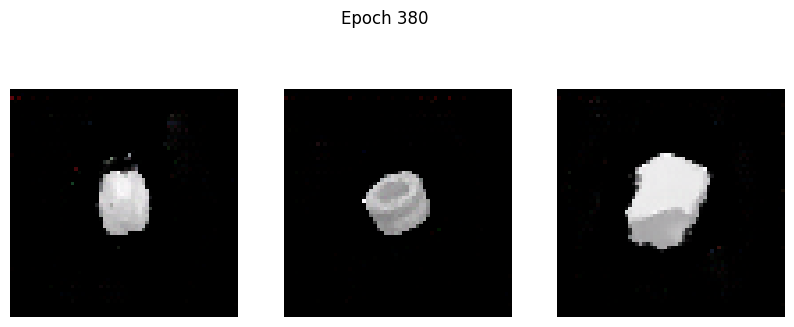

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 0.0141 - g_loss: 4.3157
Epoch 381/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0198 - g_loss: 4.5935

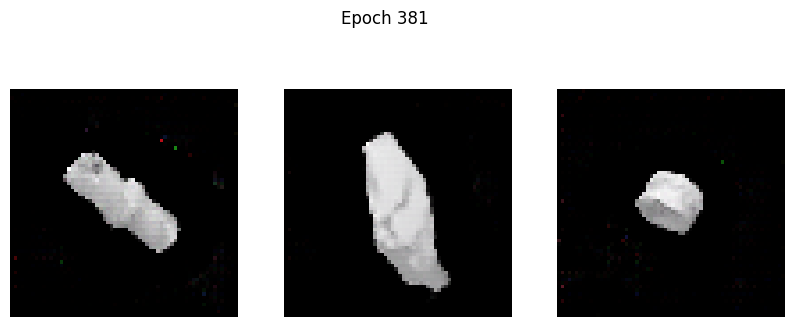

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0199 - g_loss: 4.5931
Epoch 382/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0448 - g_loss: 4.5592

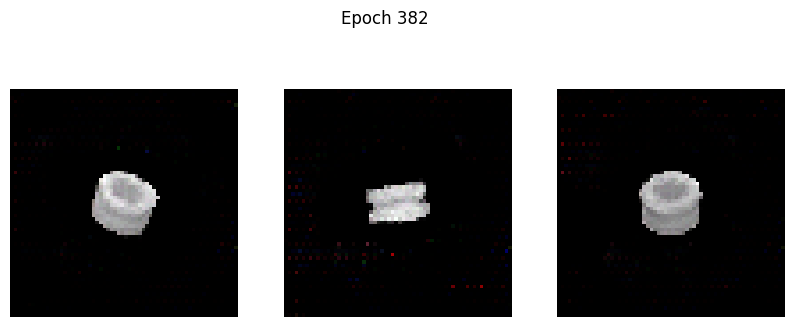

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0448 - g_loss: 4.5602
Epoch 383/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1290 - g_loss: 5.0257

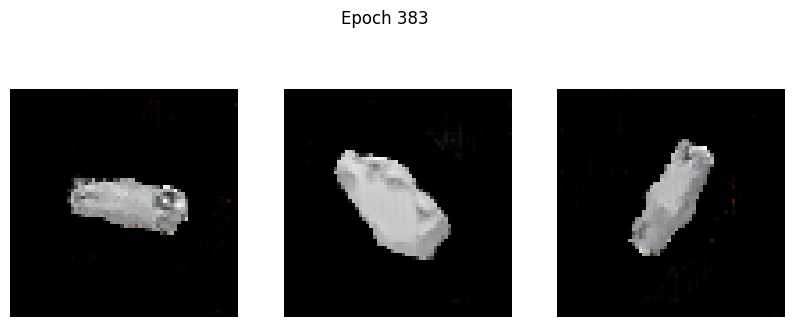

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1285 - g_loss: 5.0232
Epoch 384/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0378 - g_loss: 4.8491

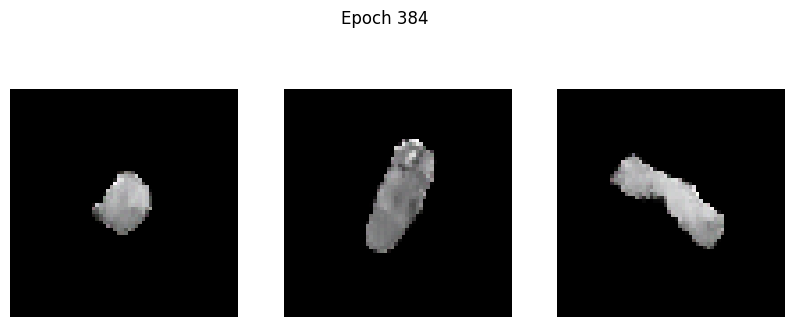

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0376 - g_loss: 4.8551
Epoch 385/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.0401 - g_loss: 5.3309

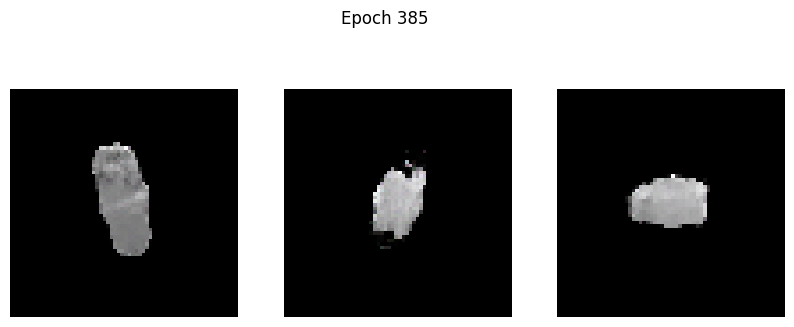

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.0402 - g_loss: 5.3290
Epoch 386/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0318 - g_loss: 4.8769

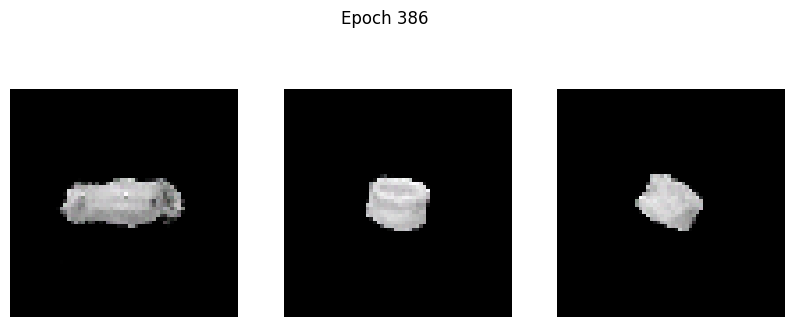

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0317 - g_loss: 4.8758
Epoch 387/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0070 - g_loss: 4.8542

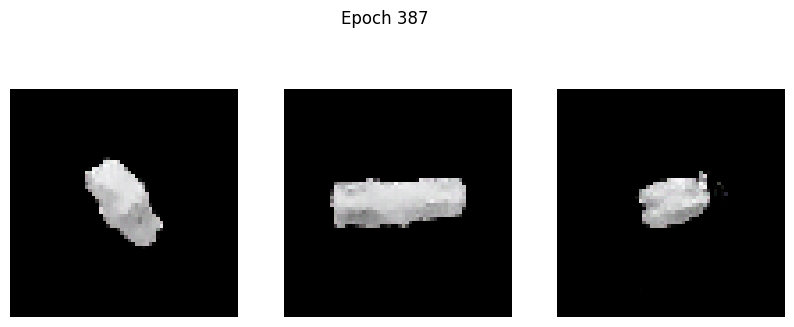

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0071 - g_loss: 4.8536
Epoch 388/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.1071 - g_loss: 4.9515

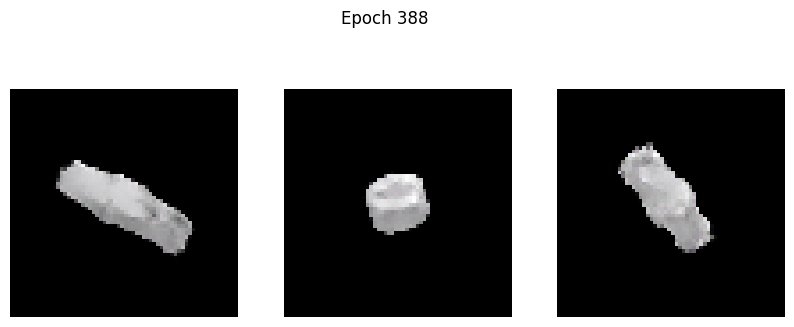

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1073 - g_loss: 4.9518
Epoch 389/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0592 - g_loss: 4.8764

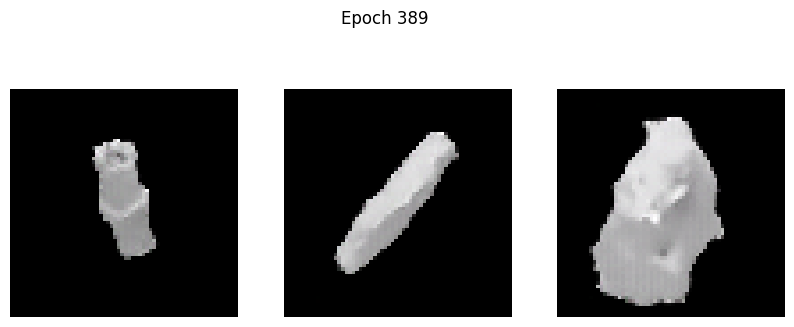

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0591 - g_loss: 4.8756
Epoch 390/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0903 - g_loss: 4.8283

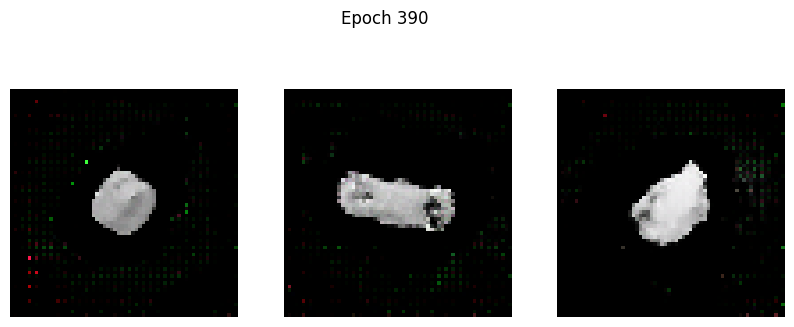

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0904 - g_loss: 4.8282
Epoch 391/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0859 - g_loss: 5.0663

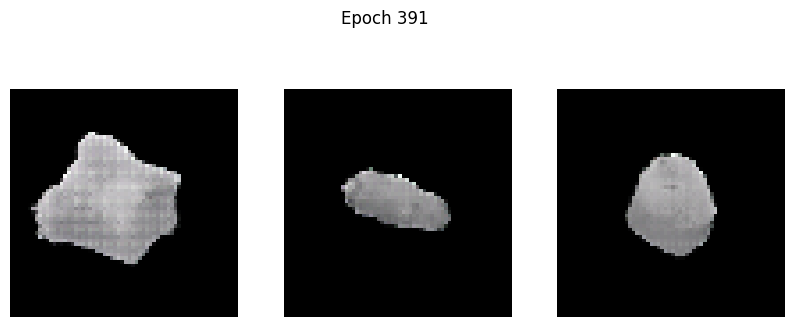

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0861 - g_loss: 5.0687
Epoch 392/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0375 - g_loss: 5.5821

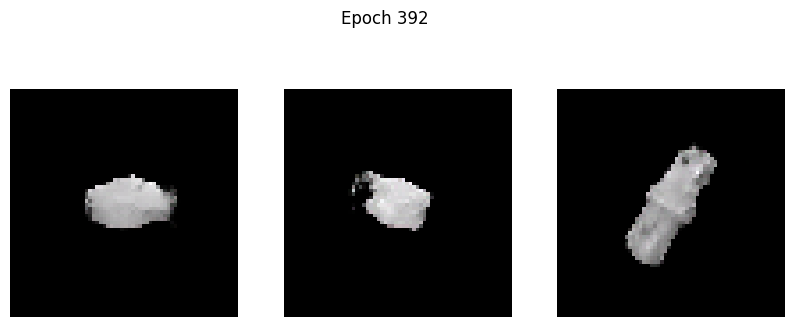

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0376 - g_loss: 5.5783
Epoch 393/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0082 - g_loss: 4.9570

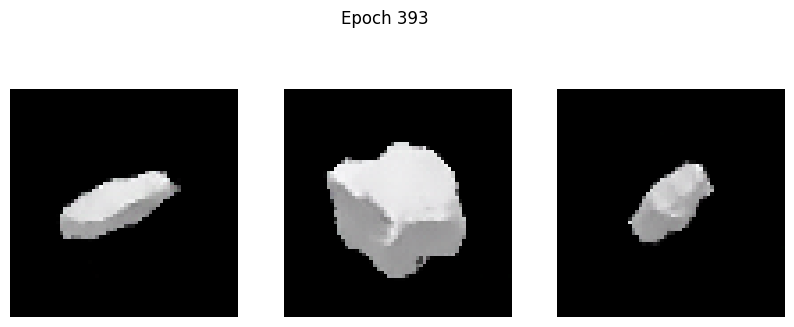

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0082 - g_loss: 4.9556
Epoch 394/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0183 - g_loss: 4.6991

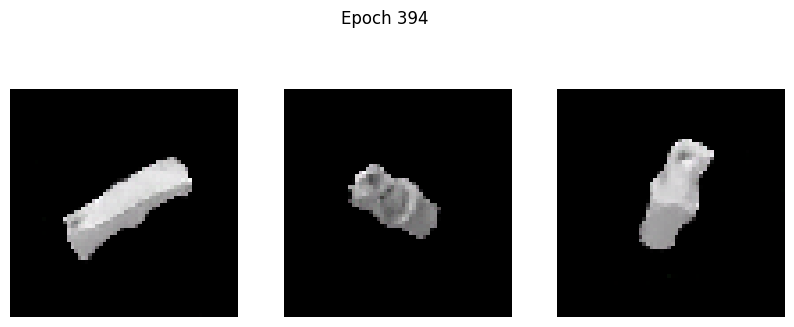

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0180 - g_loss: 4.7010
Epoch 395/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1474 - g_loss: 5.3428

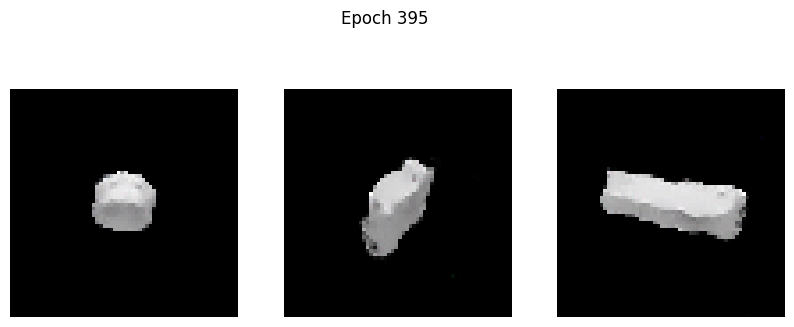

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.1465 - g_loss: 5.3382
Epoch 396/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0623 - g_loss: 4.8157

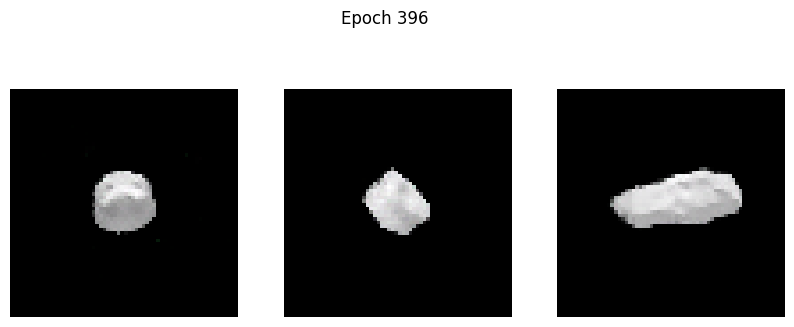

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0623 - g_loss: 4.8157
Epoch 397/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0322 - g_loss: 4.8841

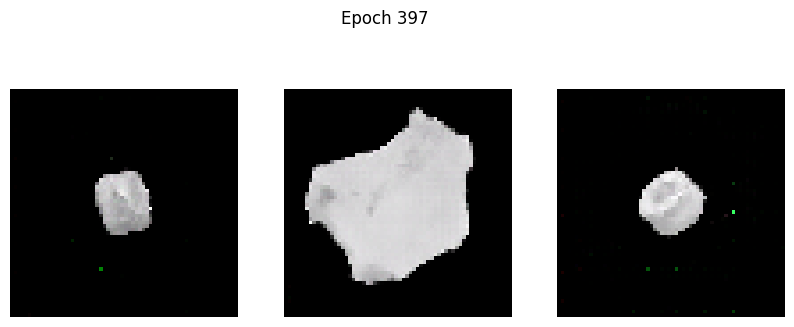

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0323 - g_loss: 4.8828
Epoch 398/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0377 - g_loss: 4.9101

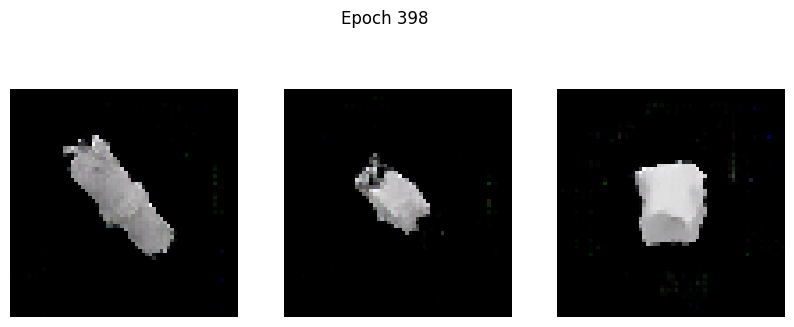

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0380 - g_loss: 4.9105
Epoch 399/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0265 - g_loss: 4.6952

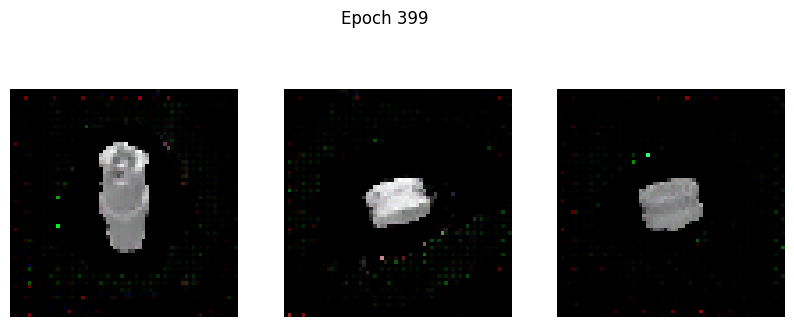

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0266 - g_loss: 4.6955
Epoch 400/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0362 - g_loss: 4.9445

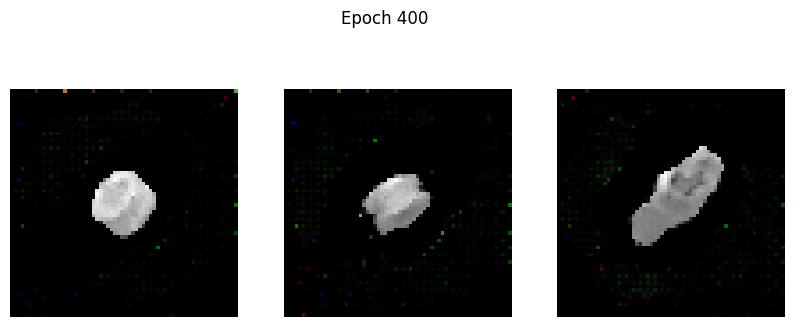

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0361 - g_loss: 4.9432
Epoch 401/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0379 - g_loss: 5.1309

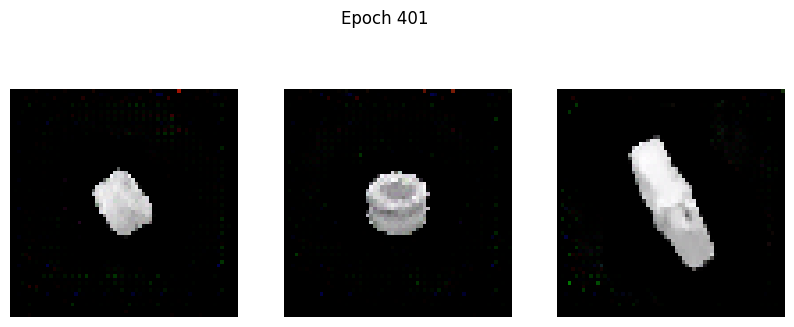

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0378 - g_loss: 5.1297
Epoch 402/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1060 - g_loss: 5.2966

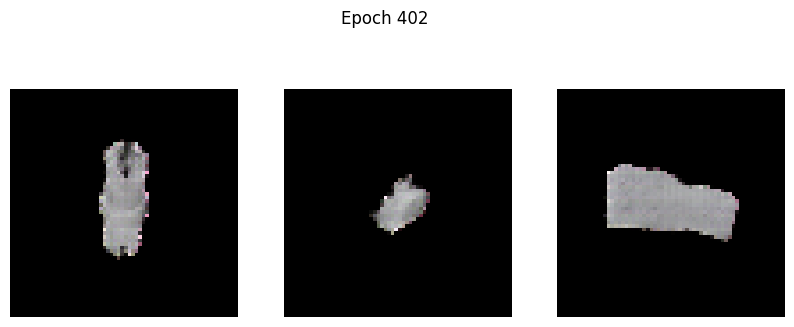

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.1071 - g_loss: 5.3020
Epoch 403/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0341 - g_loss: 5.5507

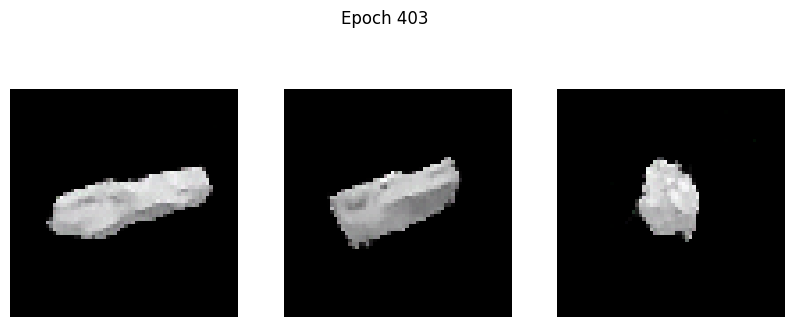

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0343 - g_loss: 5.5479
Epoch 404/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0647 - g_loss: 4.8867

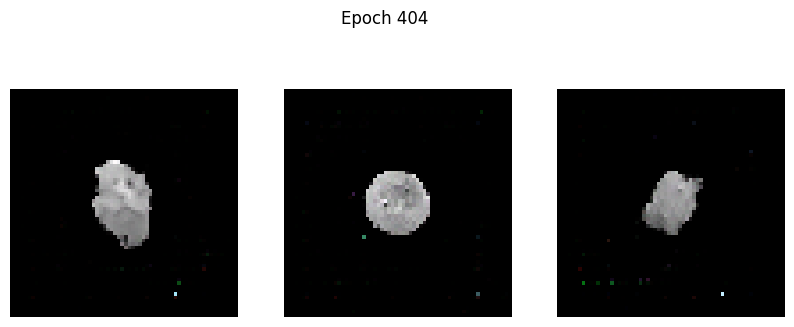

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0647 - g_loss: 4.8868
Epoch 405/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -9.0209e-04 - g_loss: 4.9105

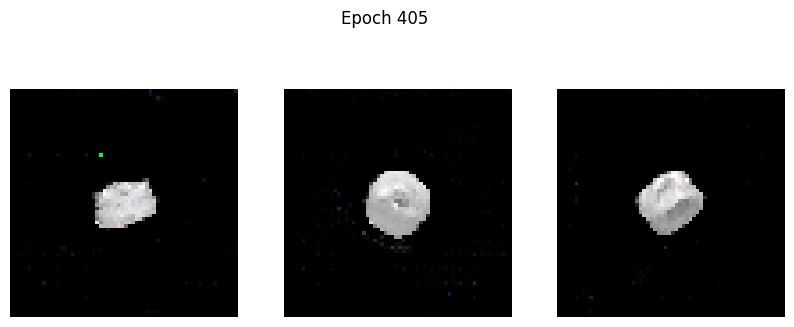

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -6.1099e-04 - g_loss: 4.9134
Epoch 406/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0564 - g_loss: 5.1232

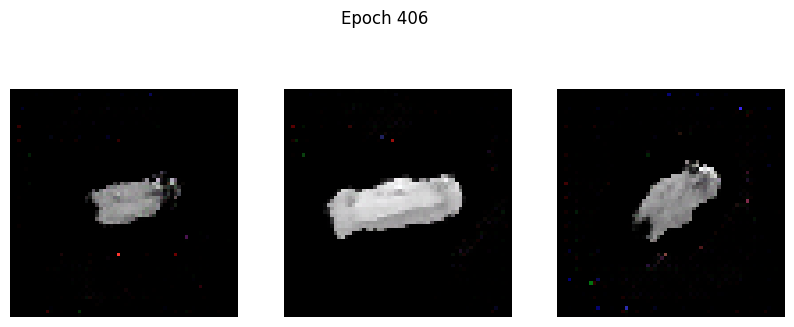

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0562 - g_loss: 5.1231
Epoch 407/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0747 - g_loss: 5.2222

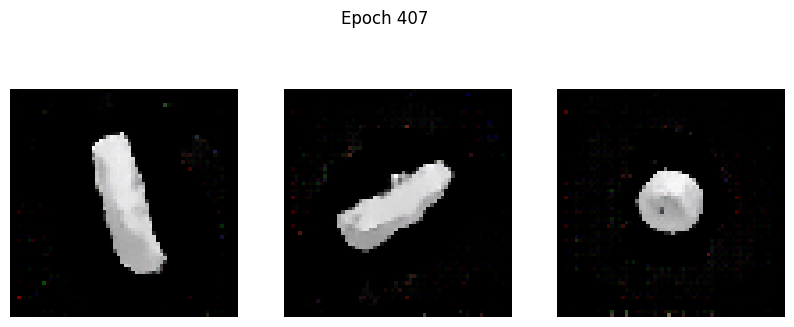

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0752 - g_loss: 5.2242
Epoch 408/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0051 - g_loss: 4.7748

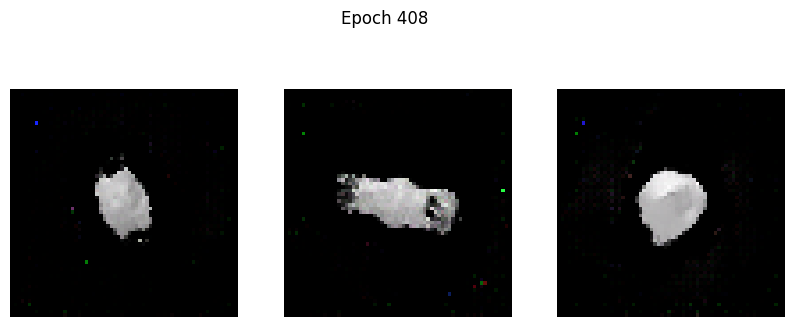

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0050 - g_loss: 4.7758
Epoch 409/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0277 - g_loss: 4.9201

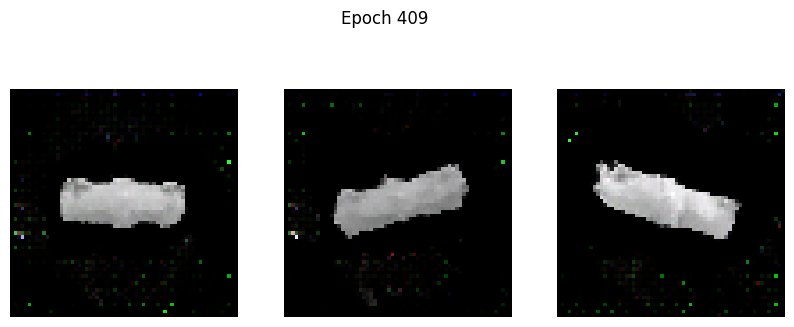

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0279 - g_loss: 4.9209
Epoch 410/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0153 - g_loss: 4.9217

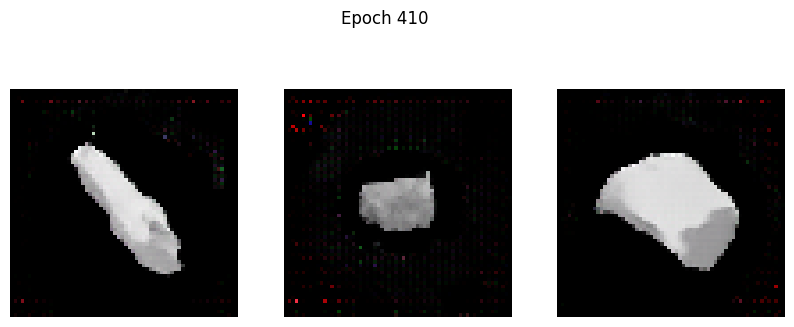

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0158 - g_loss: 4.9222
Epoch 411/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0641 - g_loss: 4.9798

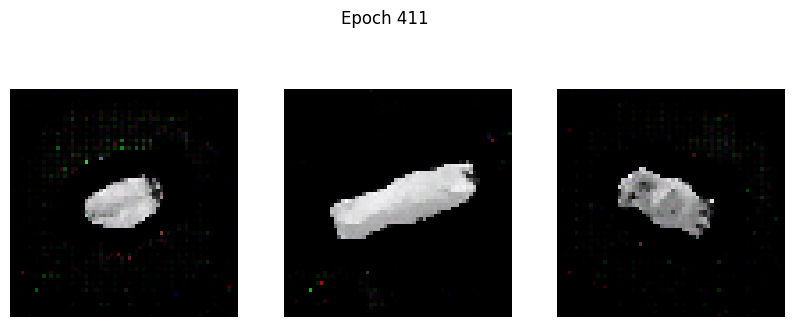

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0640 - g_loss: 4.9796
Epoch 412/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0171 - g_loss: 4.9293

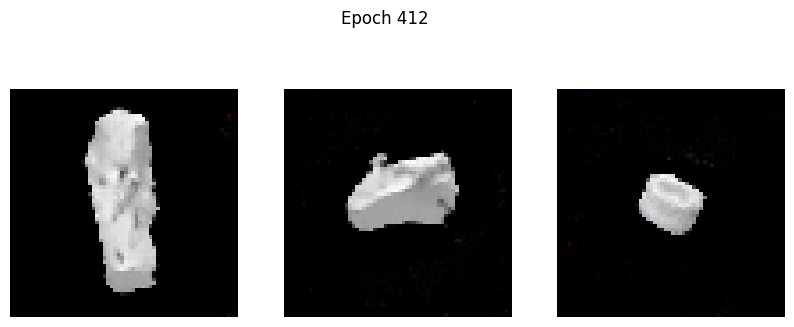

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0173 - g_loss: 4.9301
Epoch 413/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0563 - g_loss: 5.0019

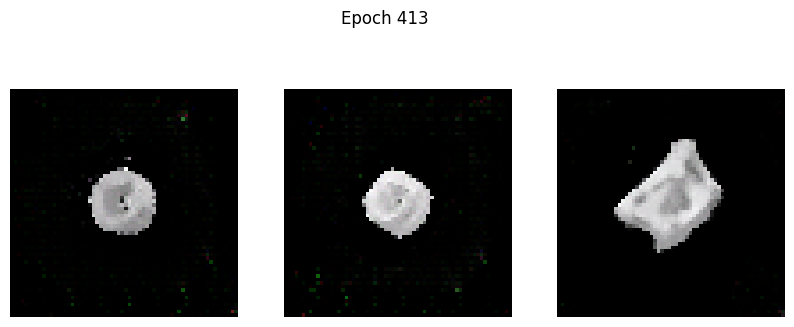

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0565 - g_loss: 5.0021
Epoch 414/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0098 - g_loss: 4.6001

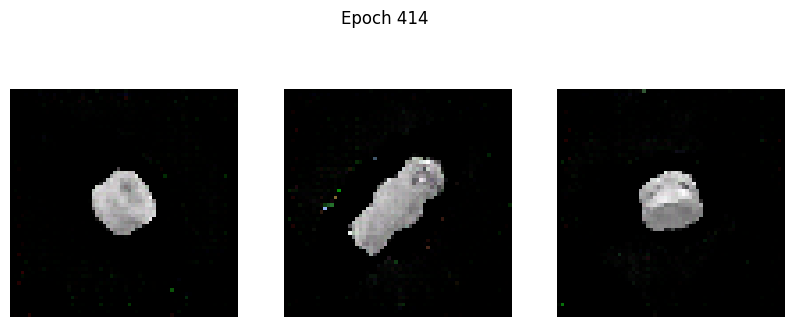

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0098 - g_loss: 4.6010
Epoch 415/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0070 - g_loss: 4.7176

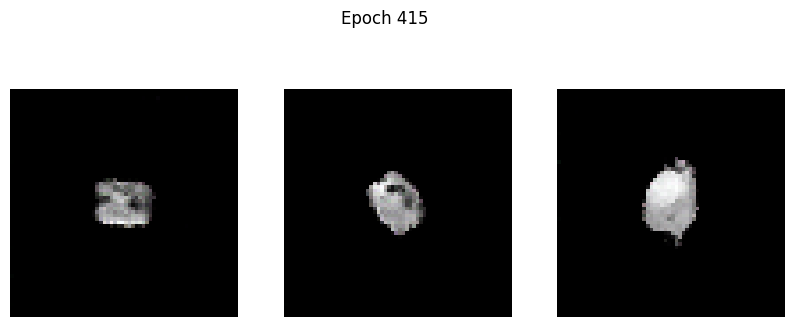

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0068 - g_loss: 4.7221
Epoch 416/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0773 - g_loss: 5.8077

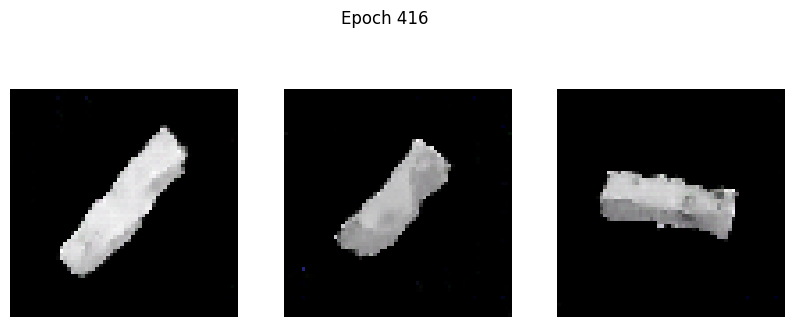

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0775 - g_loss: 5.8049
Epoch 417/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0799 - g_loss: 5.6713

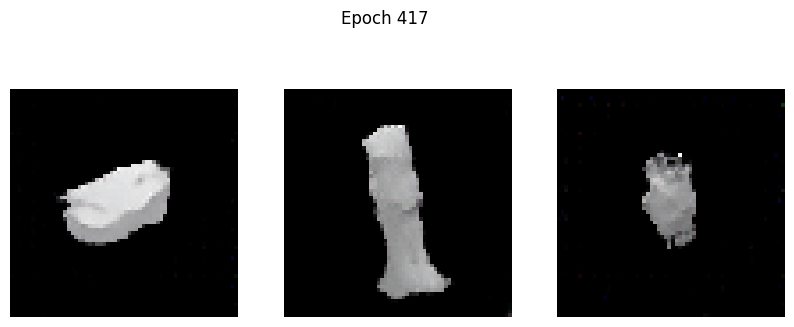

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0801 - g_loss: 5.6686
Epoch 418/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0730 - g_loss: 5.3189

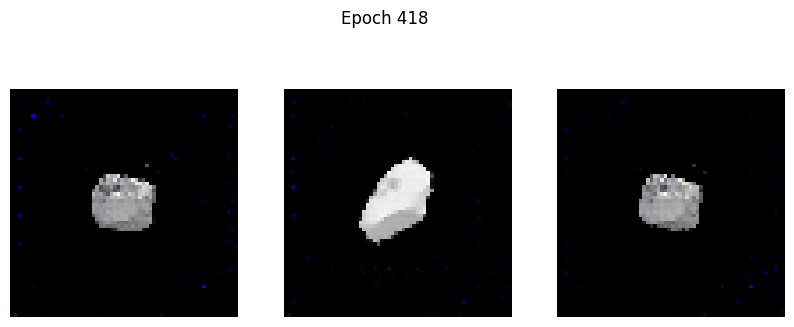

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0730 - g_loss: 5.3192
Epoch 419/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0850 - g_loss: 5.2835

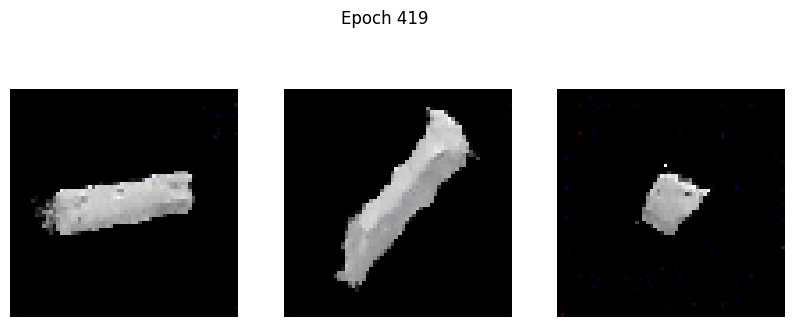

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0849 - g_loss: 5.2835
Epoch 420/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0129 - g_loss: 5.5080

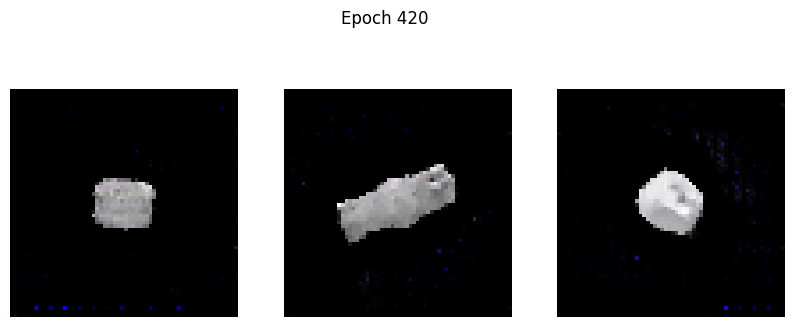

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0127 - g_loss: 5.5110
Epoch 421/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0160 - g_loss: 5.4477

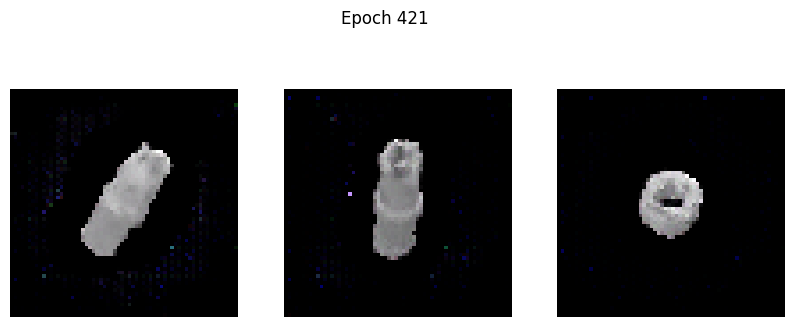

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0157 - g_loss: 5.4489
Epoch 422/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0020 - g_loss: 5.3108

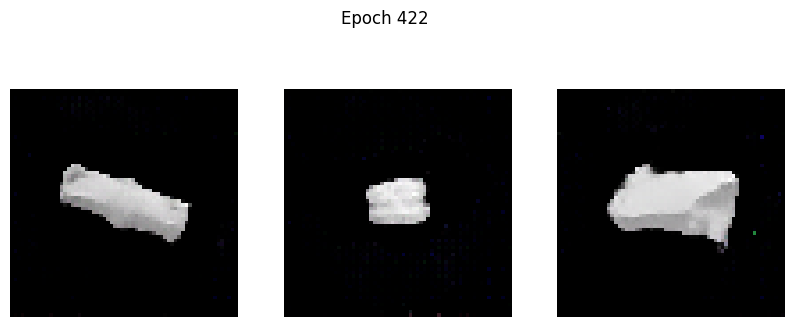

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0023 - g_loss: 5.3125
Epoch 423/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0885 - g_loss: 5.8300

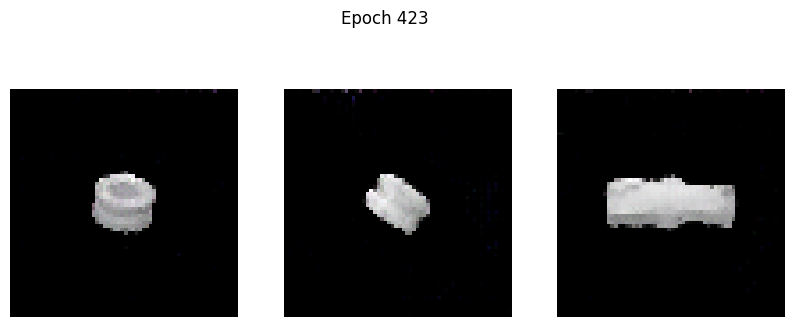

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0891 - g_loss: 5.8304
Epoch 424/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0276 - g_loss: 5.1530

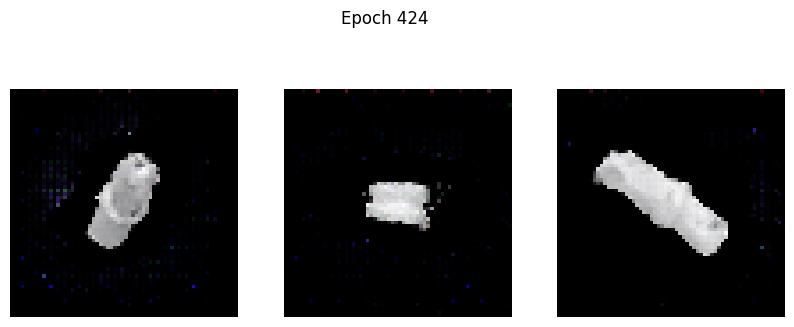

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0273 - g_loss: 5.1527
Epoch 425/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0292 - g_loss: 4.9960

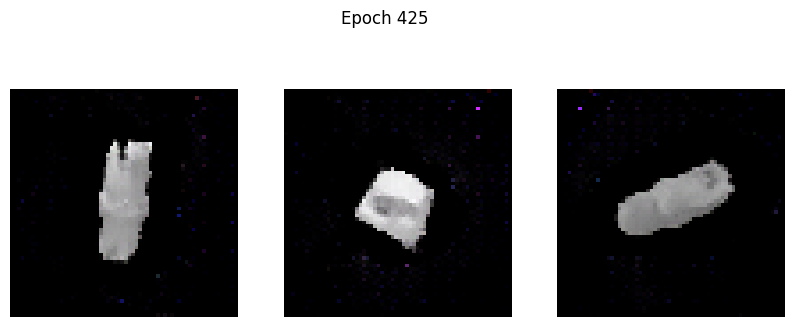

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0284 - g_loss: 4.9985
Epoch 426/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0323 - g_loss: 5.0776

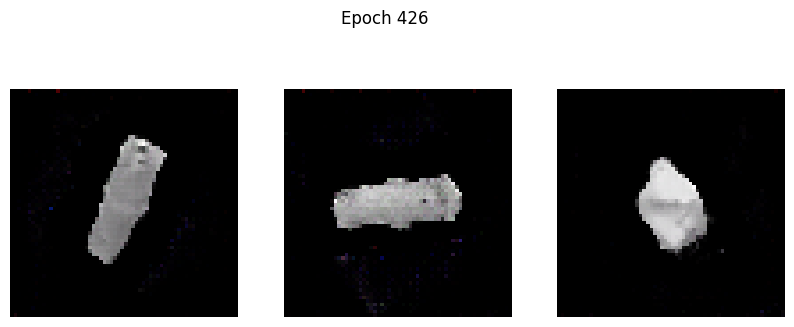

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0321 - g_loss: 5.0787
Epoch 427/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0206 - g_loss: 5.2276

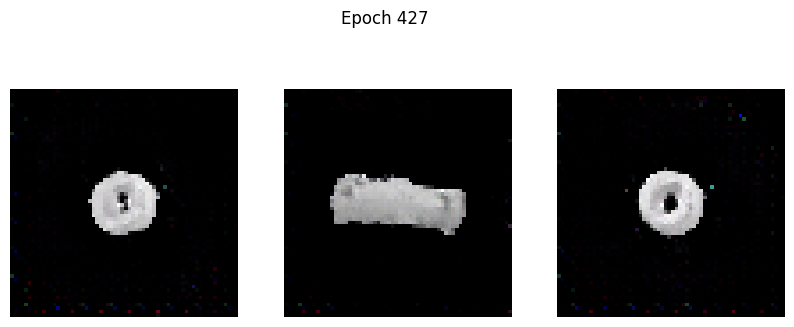

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0208 - g_loss: 5.2288
Epoch 428/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0322 - g_loss: 5.5190

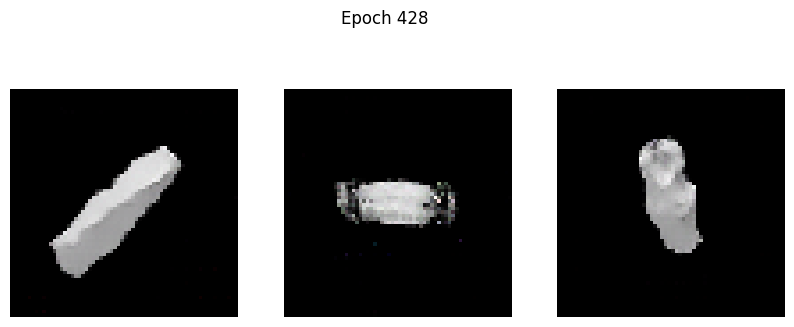

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0324 - g_loss: 5.5147
Epoch 429/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0419 - g_loss: 5.1565

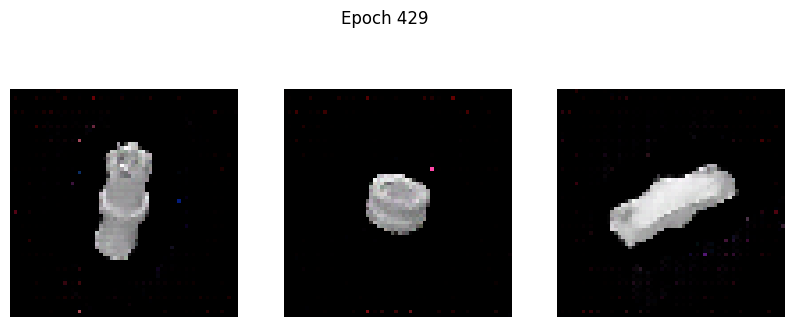

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0416 - g_loss: 5.1561
Epoch 430/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0165 - g_loss: 5.1661

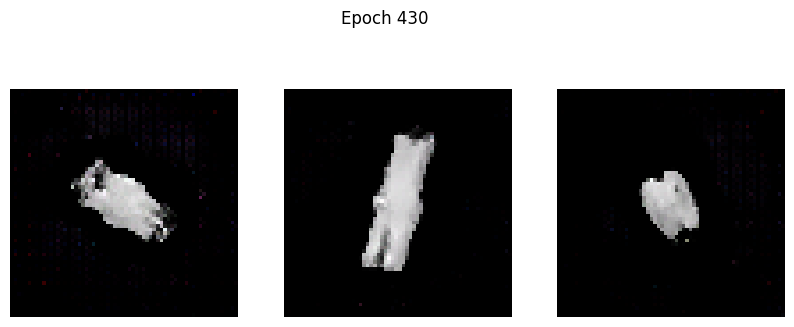

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0163 - g_loss: 5.1675
Epoch 431/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0250 - g_loss: 5.1692

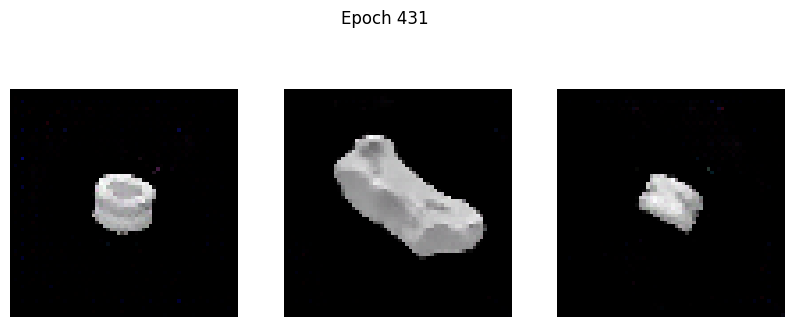

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0249 - g_loss: 5.1695
Epoch 432/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0553 - g_loss: 5.5679

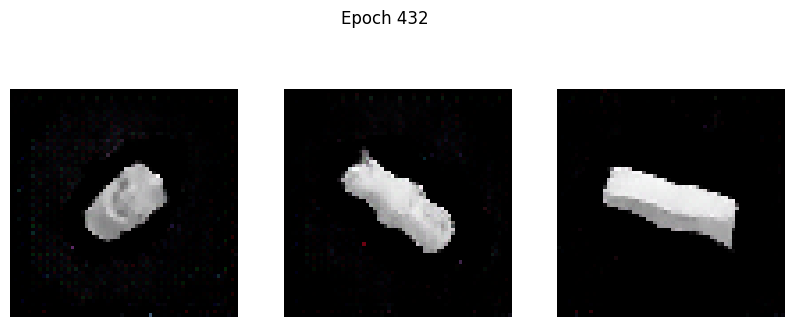

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0554 - g_loss: 5.5680
Epoch 433/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0309 - g_loss: 4.9418

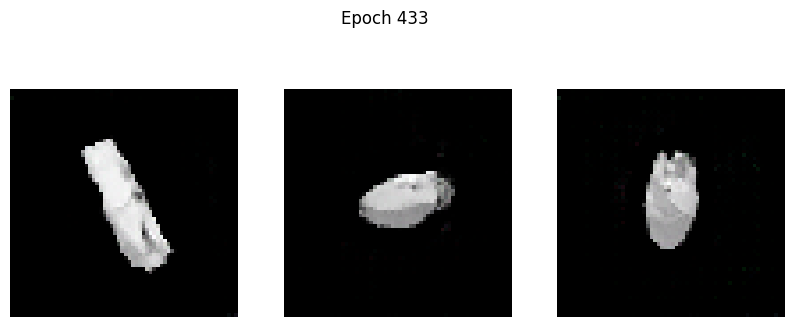

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0305 - g_loss: 4.9439
Epoch 434/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0012 - g_loss: 4.9904    

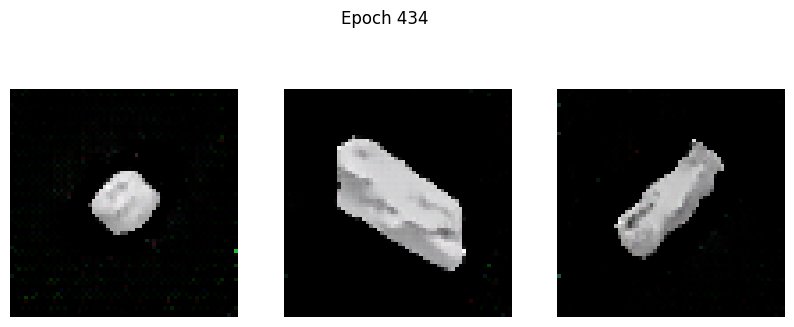

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0014 - g_loss: 4.9913
Epoch 435/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0685 - g_loss: 5.5739

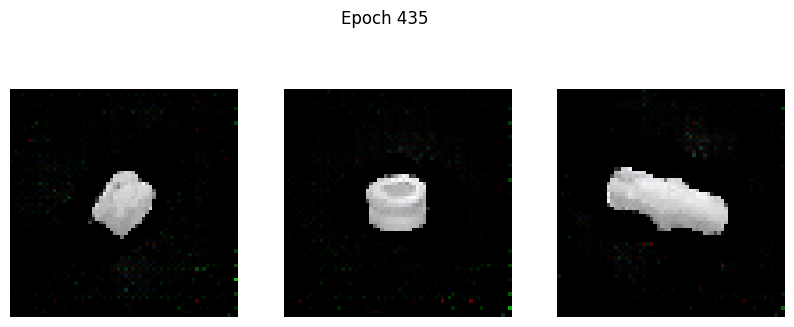

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0684 - g_loss: 5.5729
Epoch 436/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0222 - g_loss: 5.2151

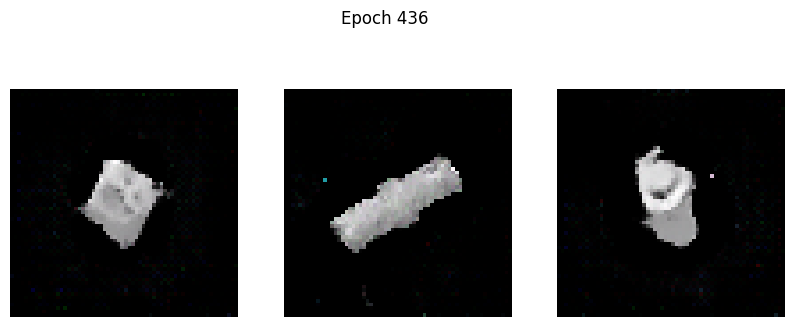

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0220 - g_loss: 5.2140
Epoch 437/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0884 - g_loss: 5.8142

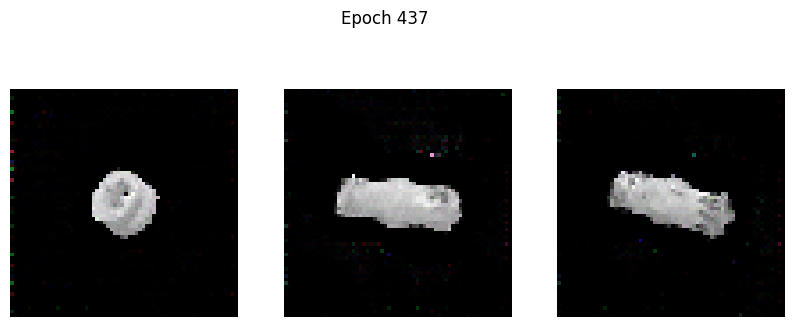

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0879 - g_loss: 5.8099
Epoch 438/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0449 - g_loss: 5.2377

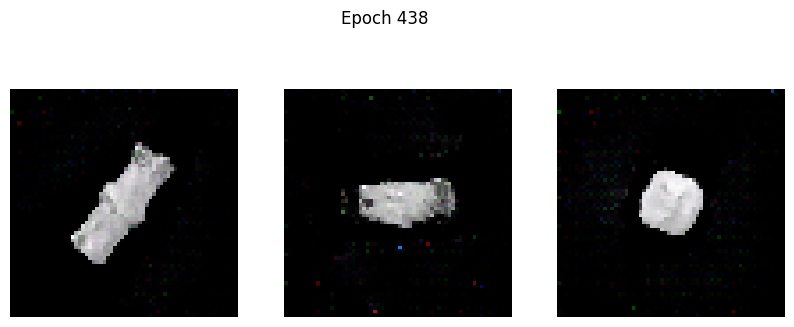

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0450 - g_loss: 5.2383
Epoch 439/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0253 - g_loss: 5.0684

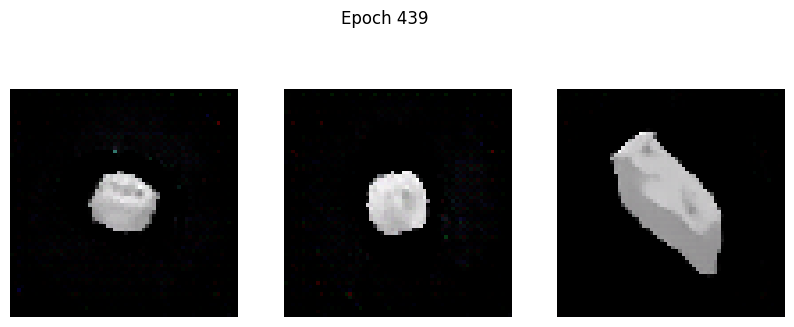

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0254 - g_loss: 5.0670
Epoch 440/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0281 - g_loss: 5.4495

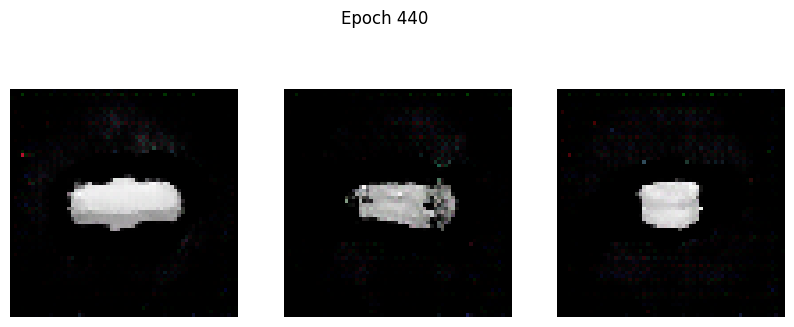

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0281 - g_loss: 5.4501
Epoch 441/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0027 - g_loss: 5.5524

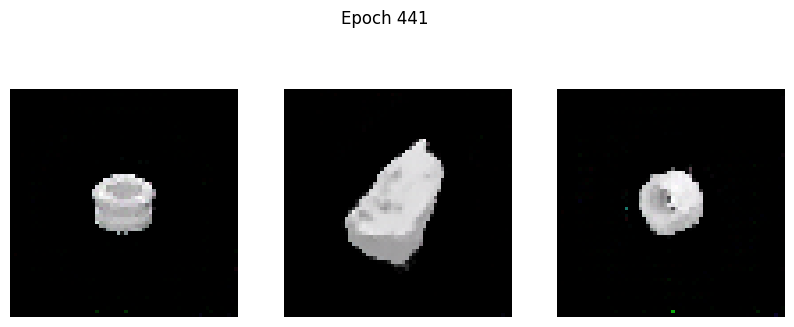

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0028 - g_loss: 5.5517
Epoch 442/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0426 - g_loss: 5.6863

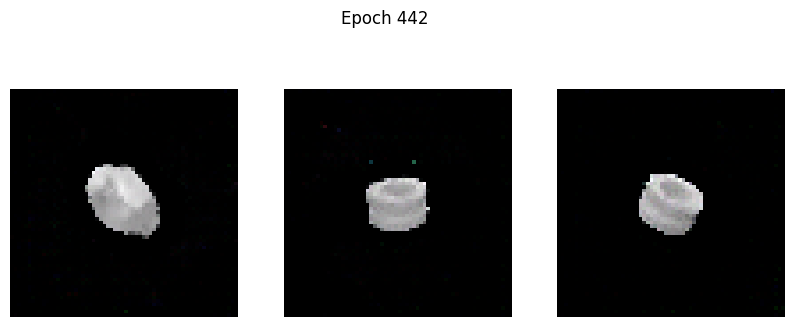

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - d_loss: 0.0421 - g_loss: 5.6838
Epoch 443/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0408 - g_loss: 4.9550

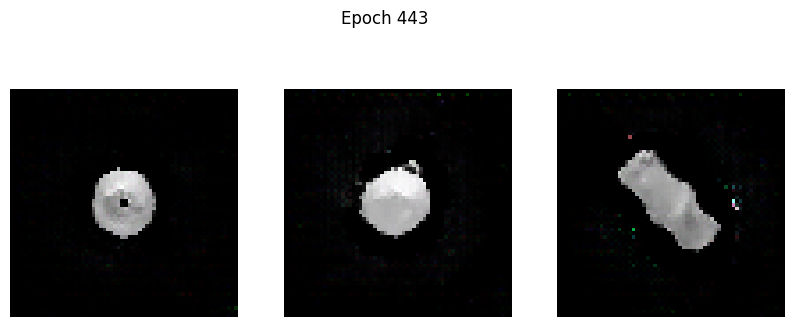

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0404 - g_loss: 4.9565
Epoch 444/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0335 - g_loss: 5.7617

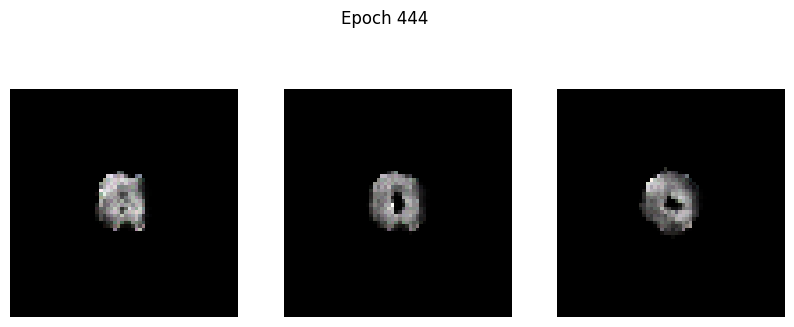

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0340 - g_loss: 5.7653
Epoch 445/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1282 - g_loss: 6.4526

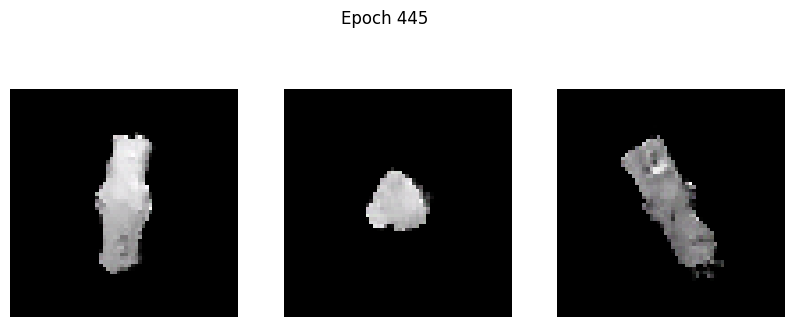

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -0.1282 - g_loss: 6.4498
Epoch 446/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0988 - g_loss: 5.9020

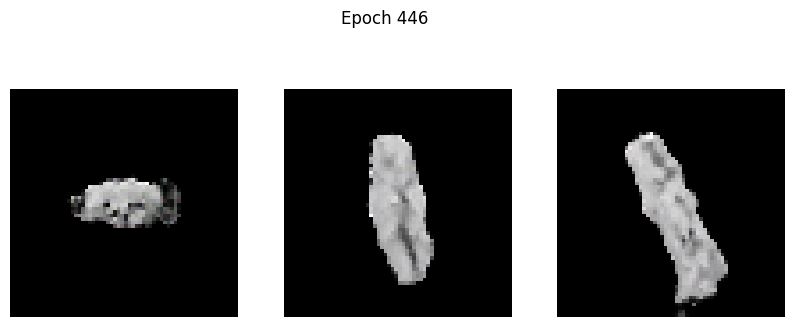

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0991 - g_loss: 5.9018
Epoch 447/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1255 - g_loss: 5.8923

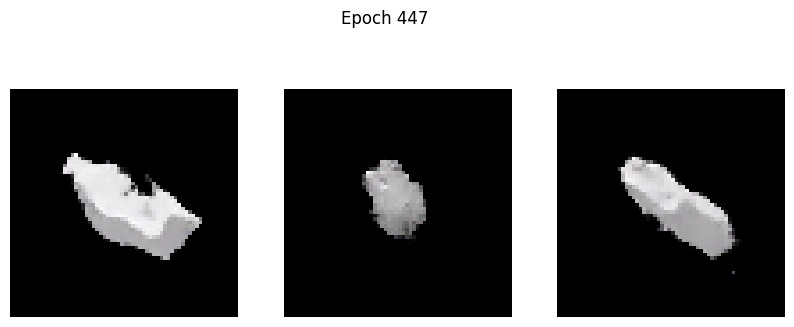

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1254 - g_loss: 5.8931
Epoch 448/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1171 - g_loss: 5.5091

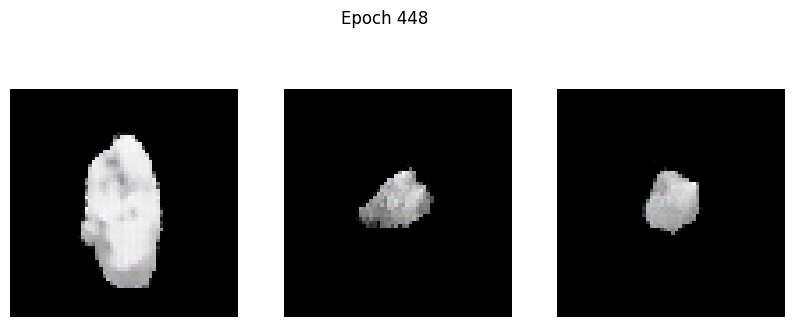

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1171 - g_loss: 5.5111
Epoch 449/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1246 - g_loss: 5.7629

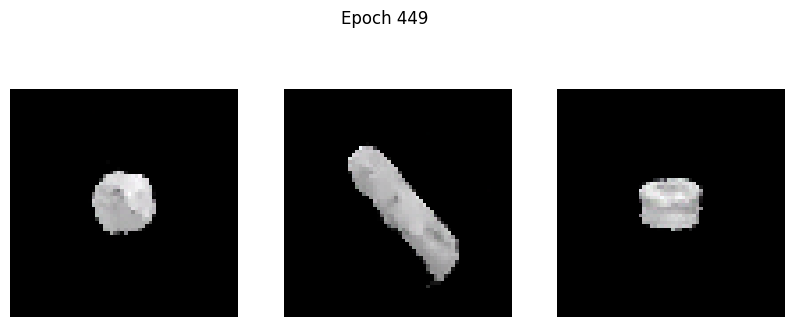

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1246 - g_loss: 5.7630
Epoch 450/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.1059 - g_loss: 5.6880

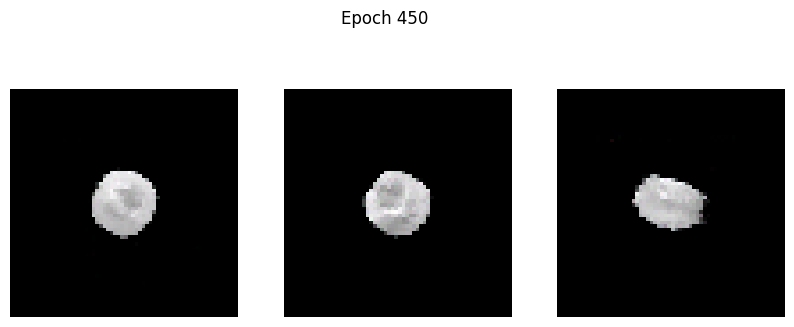

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1054 - g_loss: 5.6908
Epoch 451/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0340 - g_loss: 6.7737

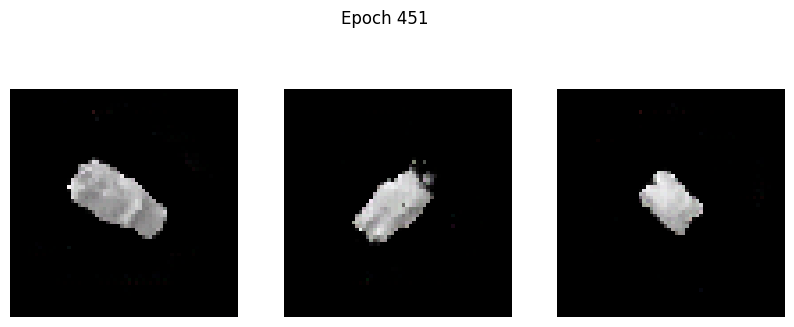

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0347 - g_loss: 6.7756
Epoch 452/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0137 - g_loss: 5.7671

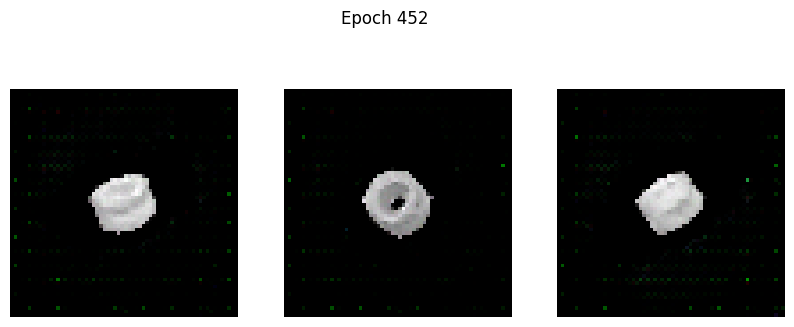

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0138 - g_loss: 5.7673
Epoch 453/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0221 - g_loss: 6.4724

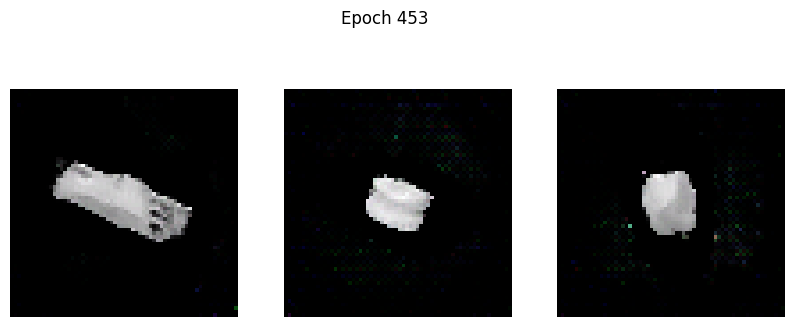

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0219 - g_loss: 6.4679
Epoch 454/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0130 - g_loss: 6.0456

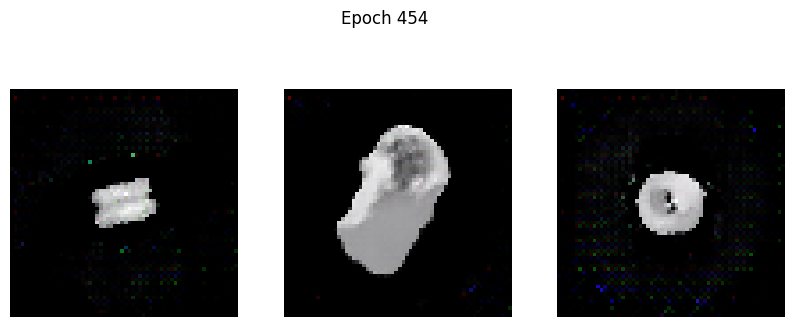

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0127 - g_loss: 6.0463
Epoch 455/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0015 - g_loss: 5.8240

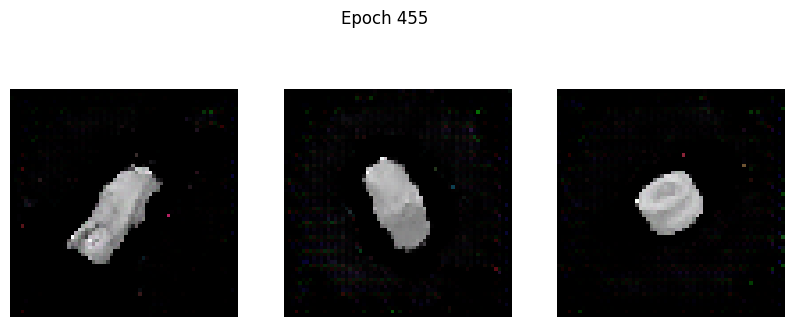

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0013 - g_loss: 5.8249
Epoch 456/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0482 - g_loss: 5.5419

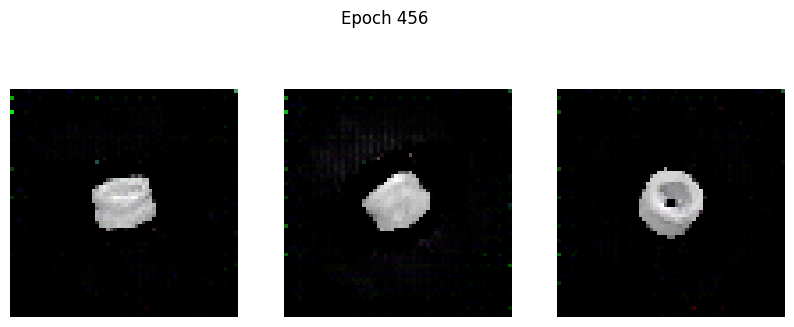

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0483 - g_loss: 5.5416
Epoch 457/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0668 - g_loss: 6.2661

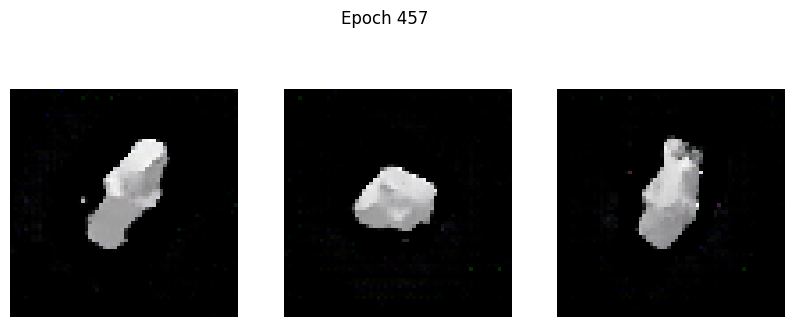

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0664 - g_loss: 6.2636
Epoch 458/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0600 - g_loss: 5.4798

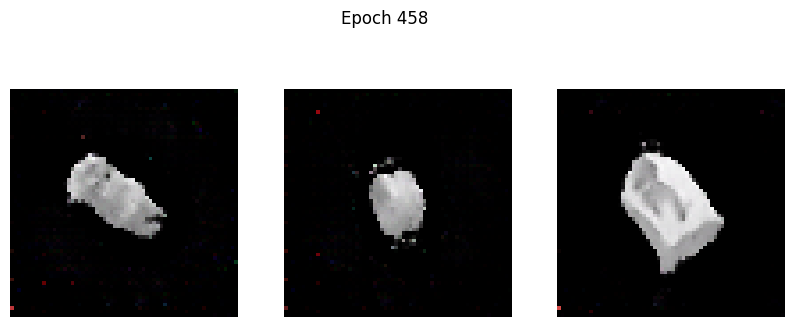

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.0599 - g_loss: 5.4804
Epoch 459/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0238 - g_loss: 5.8059

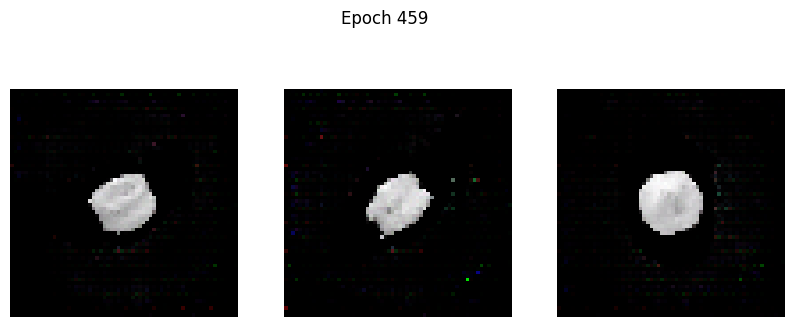

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0235 - g_loss: 5.8049
Epoch 460/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0427 - g_loss: 5.5223

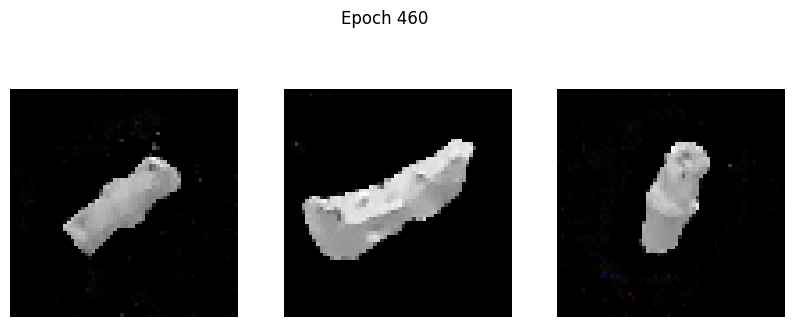

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0423 - g_loss: 5.5241
Epoch 461/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0393 - g_loss: 5.5158

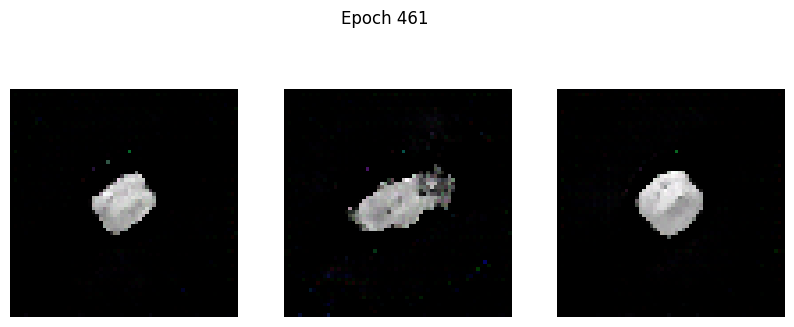

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0392 - g_loss: 5.5180
Epoch 462/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0071 - g_loss: 5.8702

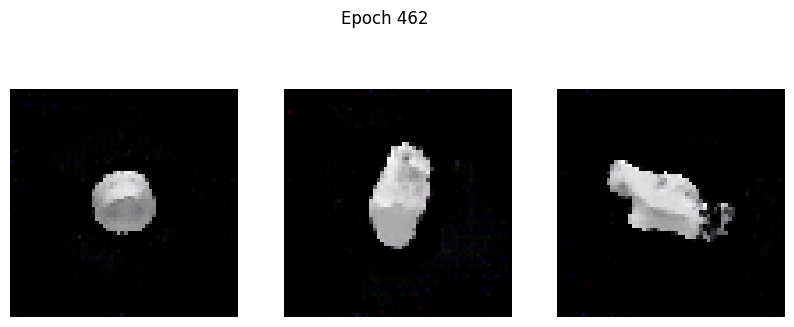

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0070 - g_loss: 5.8689
Epoch 463/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0267 - g_loss: 6.3491

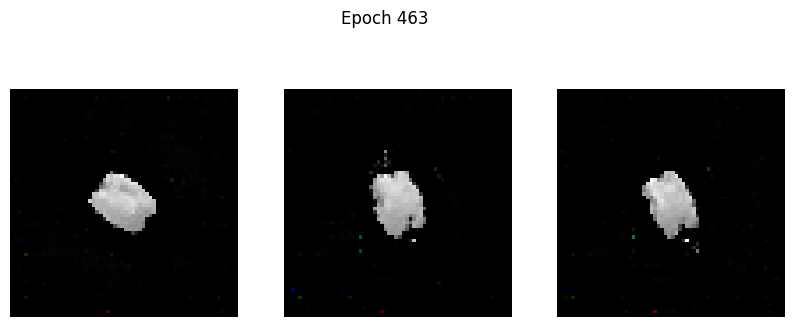

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0263 - g_loss: 6.3450
Epoch 464/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0017 - g_loss: 5.9558

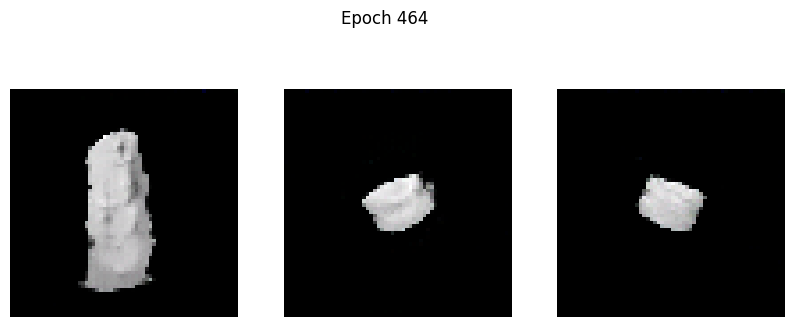

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0016 - g_loss: 5.9562
Epoch 465/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0517 - g_loss: 5.5855

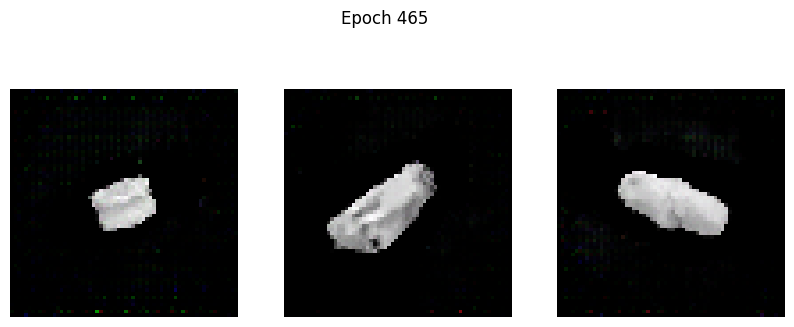

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0514 - g_loss: 5.5872
Epoch 466/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0200 - g_loss: 6.1317

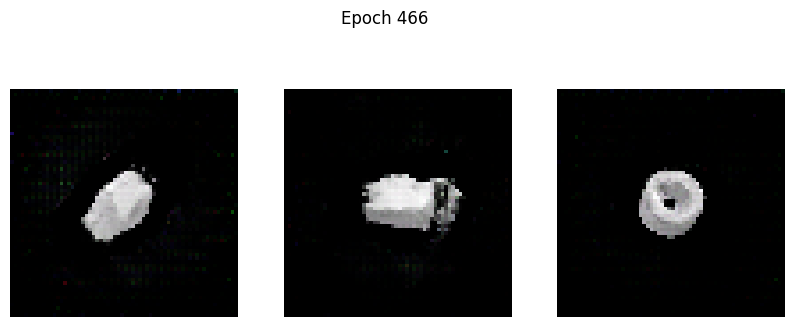

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0194 - g_loss: 6.1271
Epoch 467/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0518 - g_loss: 5.6413

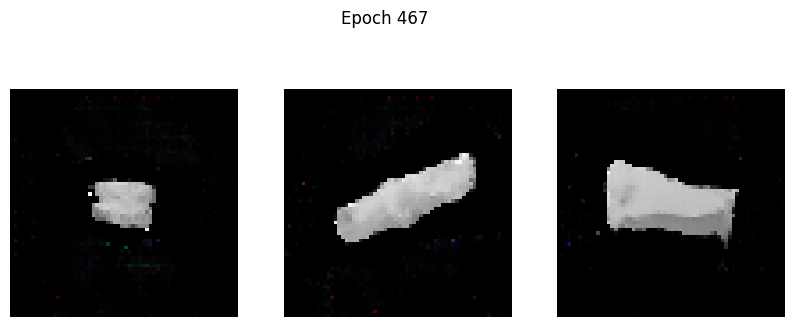

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0516 - g_loss: 5.6430
Epoch 468/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0806 - g_loss: 5.6606

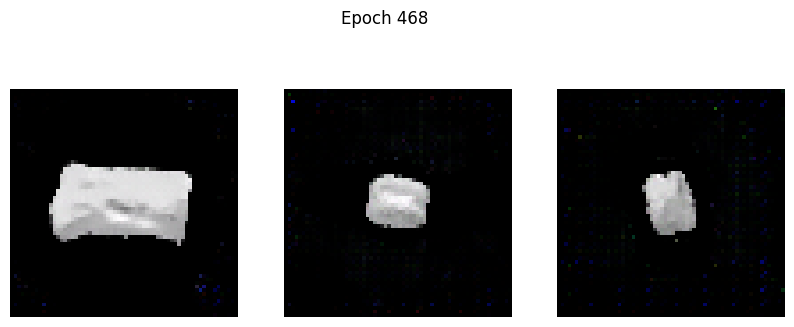

100/100 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - d_loss: -0.0801 - g_loss: 5.6626
Epoch 469/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - d_loss: -0.0156 - g_loss: 5.7261

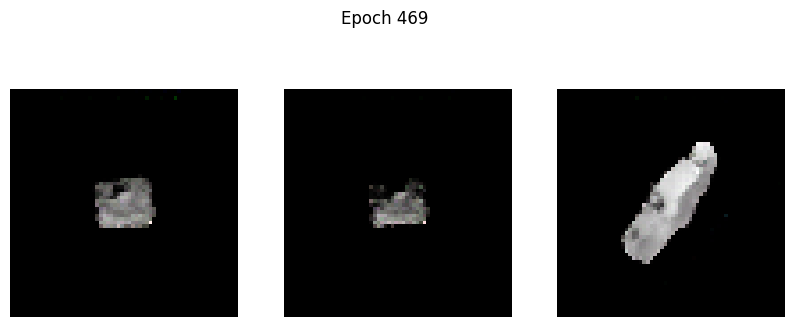

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: -0.0131 - g_loss: 5.7360
Epoch 470/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - d_loss: -0.0405 - g_loss: 6.2247

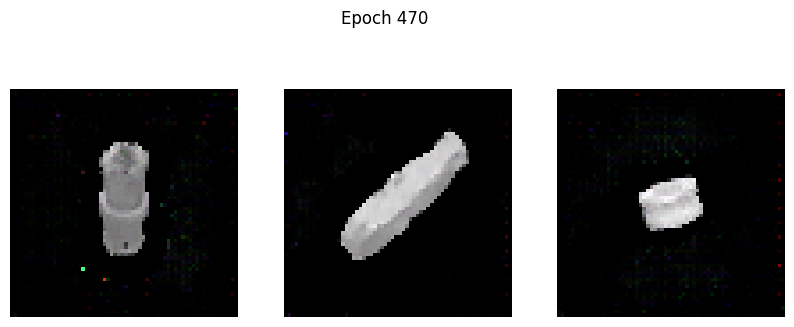

100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: -0.0404 - g_loss: 6.2221
Epoch 471/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0233 - g_loss: 5.9466

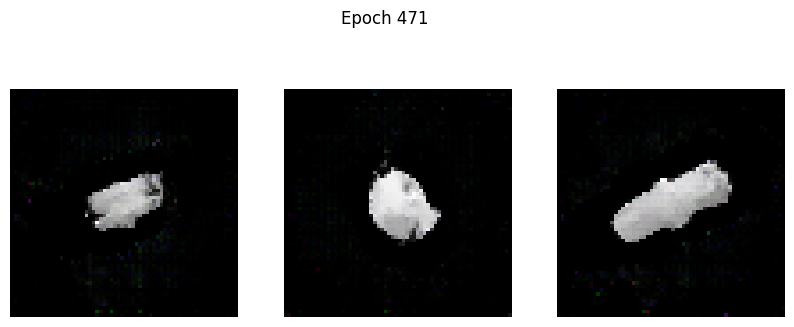

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0228 - g_loss: 5.9441
Epoch 472/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0677 - g_loss: 5.5124

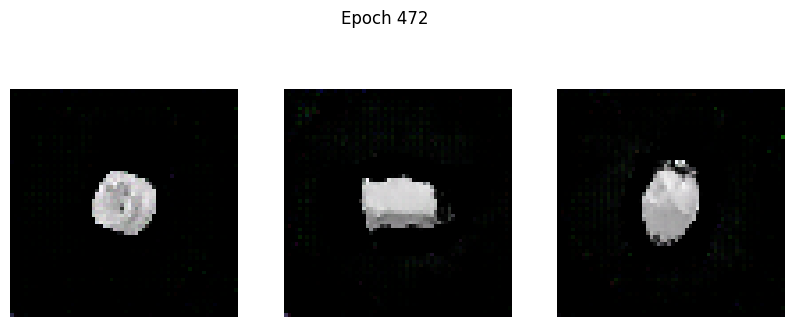

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0677 - g_loss: 5.5139
Epoch 473/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0452 - g_loss: 5.7468

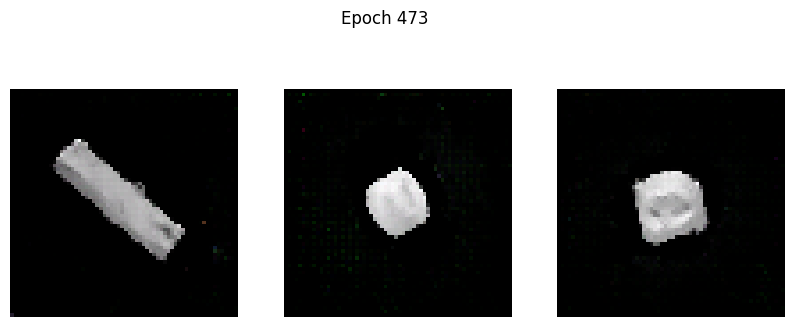

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0448 - g_loss: 5.7484
Epoch 474/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1065 - g_loss: 5.5114

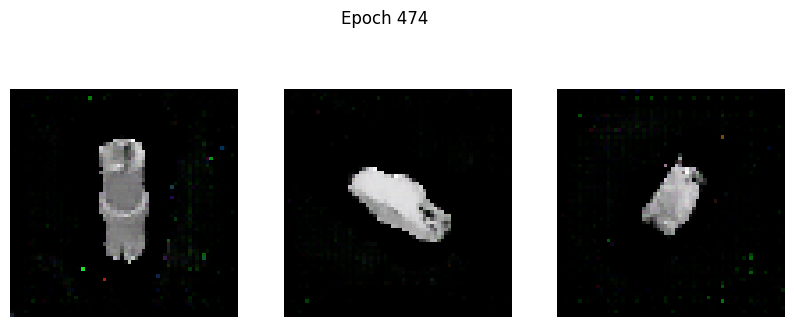

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1060 - g_loss: 5.5140
Epoch 475/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0480 - g_loss: 5.8436

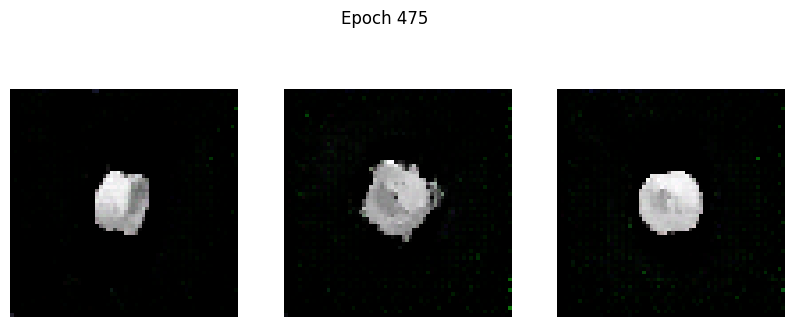

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0480 - g_loss: 5.8439
Epoch 476/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0418 - g_loss: 5.8311

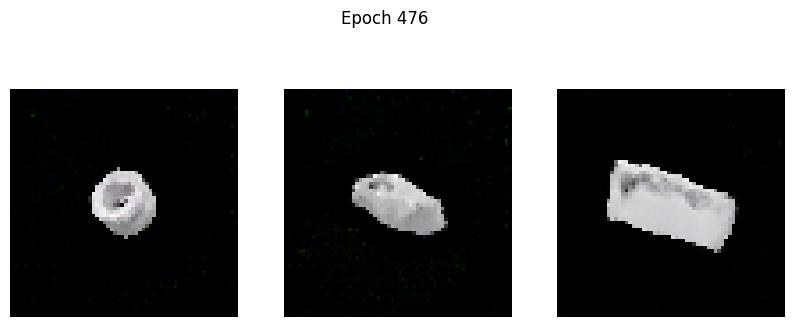

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0416 - g_loss: 5.8324
Epoch 477/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0652 - g_loss: 5.5311

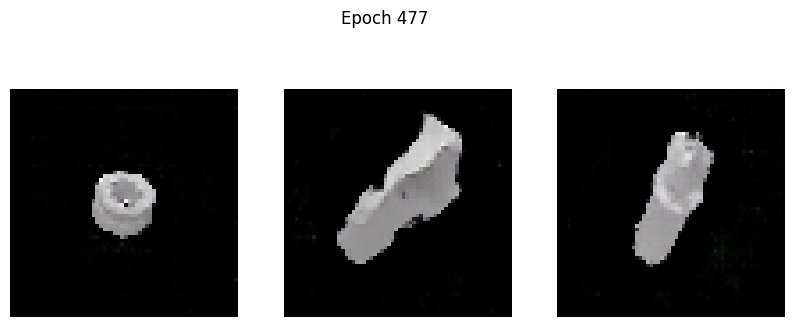

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0653 - g_loss: 5.5320
Epoch 478/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0652 - g_loss: 5.7828

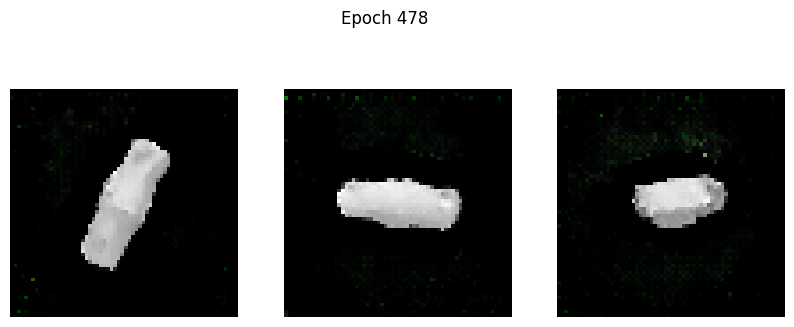

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0648 - g_loss: 5.7868
Epoch 479/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0923 - g_loss: 5.6252

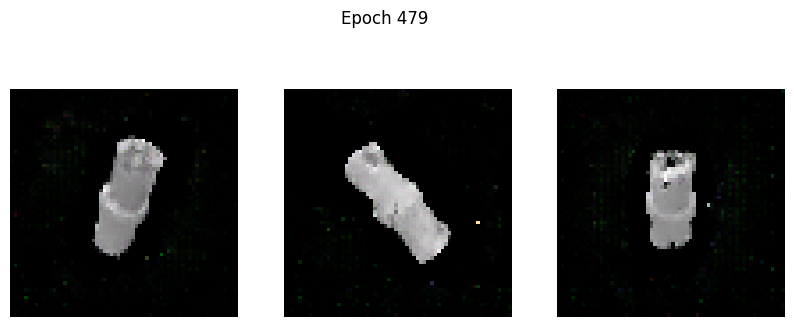

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0923 - g_loss: 5.6258
Epoch 480/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1065 - g_loss: 5.9043

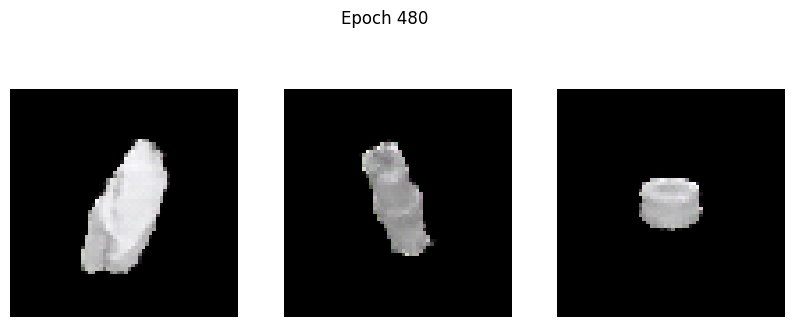

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1057 - g_loss: 5.9075
Epoch 481/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1143 - g_loss: 5.7600

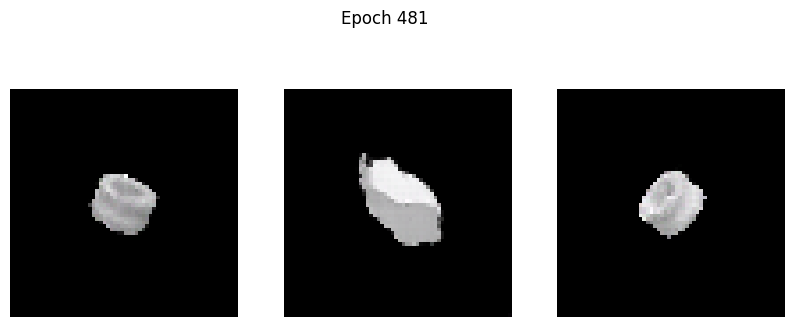

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1141 - g_loss: 5.7610
Epoch 482/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: 0.0066 - g_loss: 6.1615

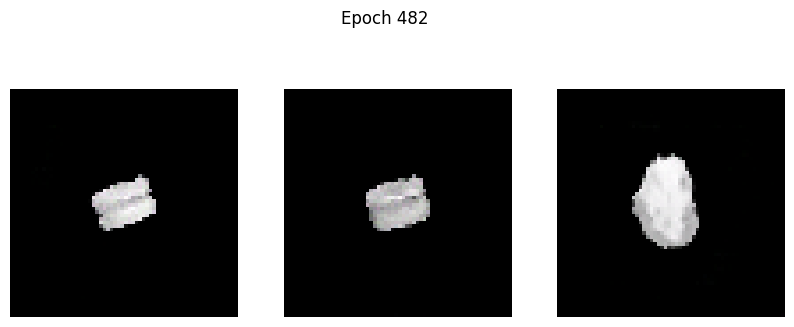

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: 0.0062 - g_loss: 6.1602
Epoch 483/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1789 - g_loss: 5.3420

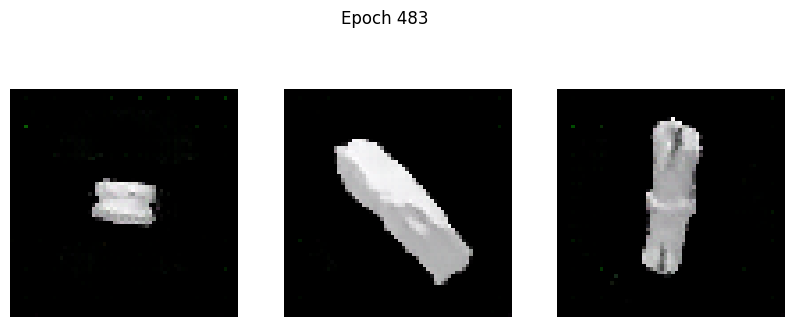

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1788 - g_loss: 5.3428
Epoch 484/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0990 - g_loss: 5.7563

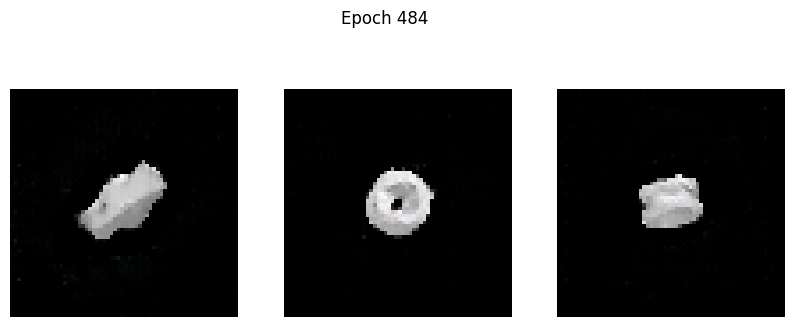

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0990 - g_loss: 5.7565
Epoch 485/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0351 - g_loss: 6.3014

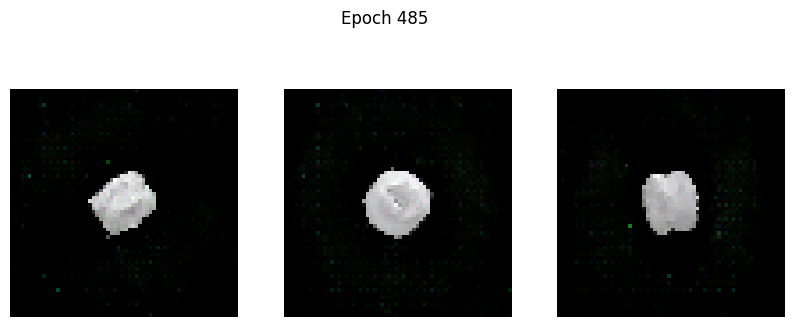

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0349 - g_loss: 6.3023
Epoch 486/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0792 - g_loss: 5.7828

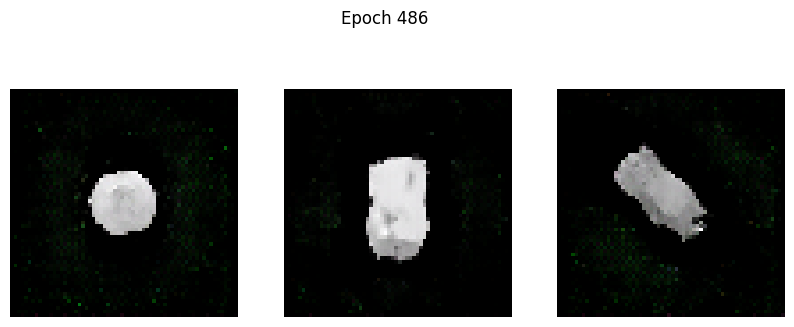

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0789 - g_loss: 5.7848
Epoch 487/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0039 - g_loss: 6.3524

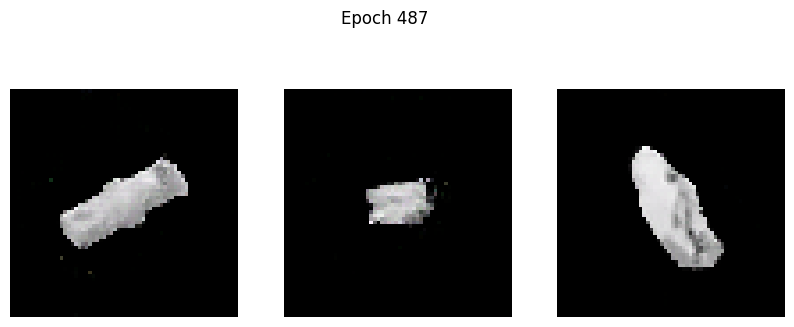

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0036 - g_loss: 6.3523
Epoch 488/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0653 - g_loss: 6.7273

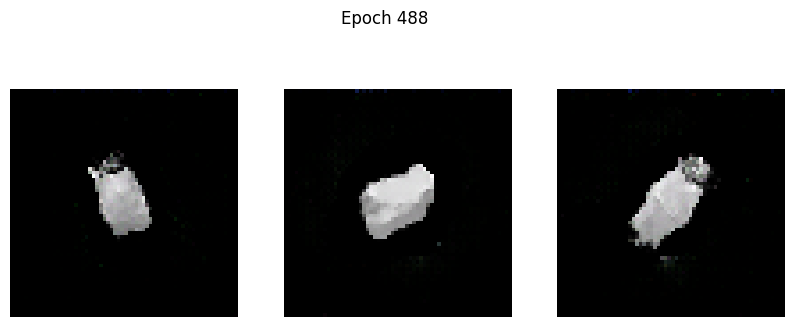

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0639 - g_loss: 6.7188
Epoch 489/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0435 - g_loss: 6.2158

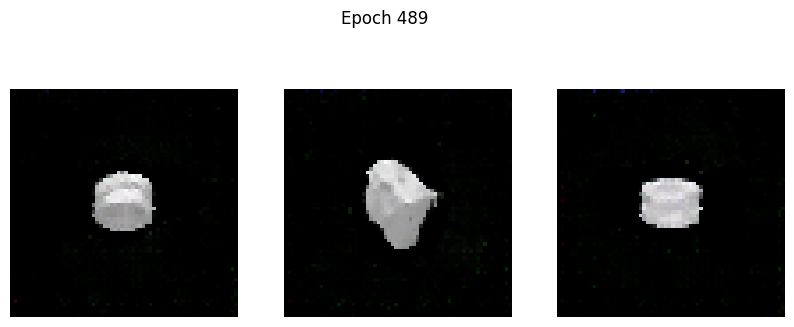

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0432 - g_loss: 6.2175
Epoch 490/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0514 - g_loss: 5.8562

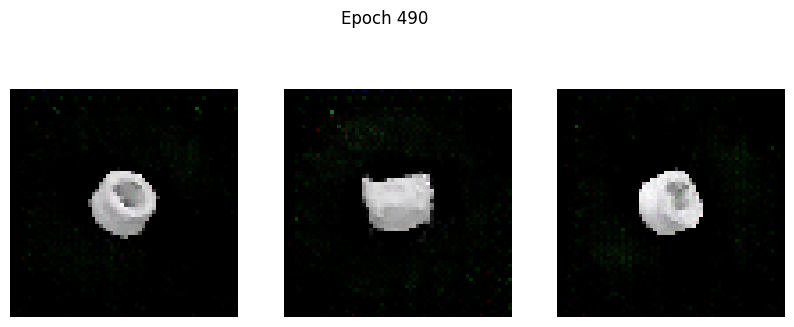

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0516 - g_loss: 5.8568
Epoch 491/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0888 - g_loss: 6.1047

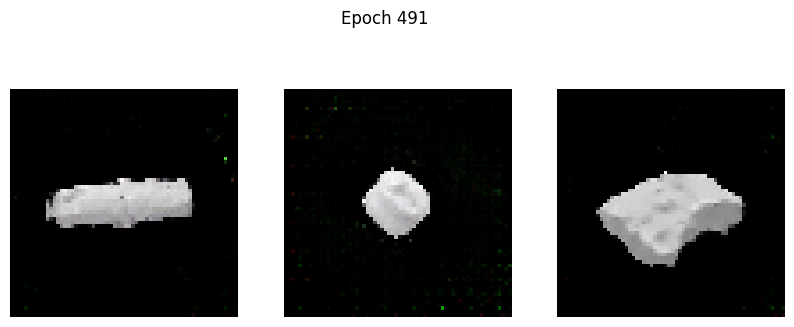

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0888 - g_loss: 6.1042
Epoch 492/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0907 - g_loss: 6.1910

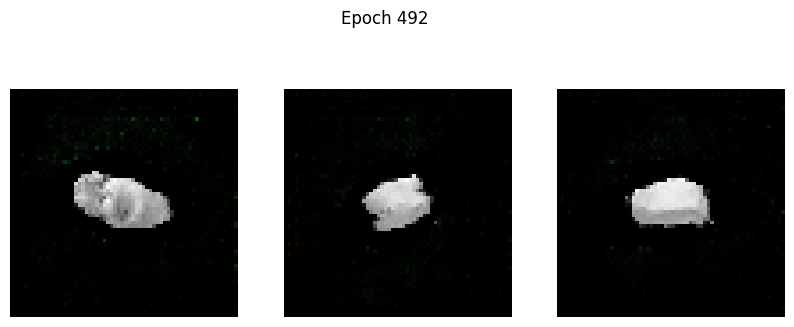

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0906 - g_loss: 6.1936
Epoch 493/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0228 - g_loss: 6.6415

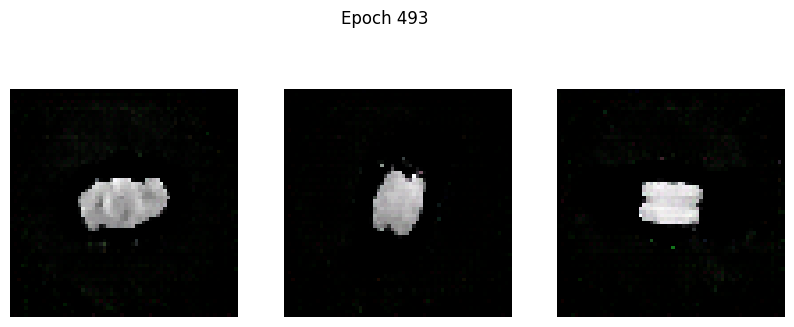

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0229 - g_loss: 6.6407
Epoch 494/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 0.0405 - g_loss: 6.3699

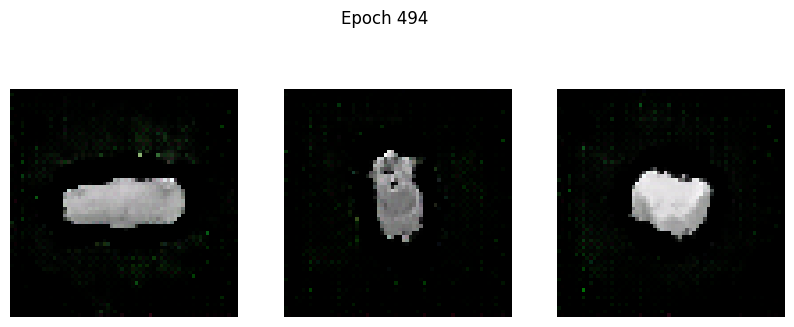

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 0.0404 - g_loss: 6.3674
Epoch 495/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0880 - g_loss: 5.9149

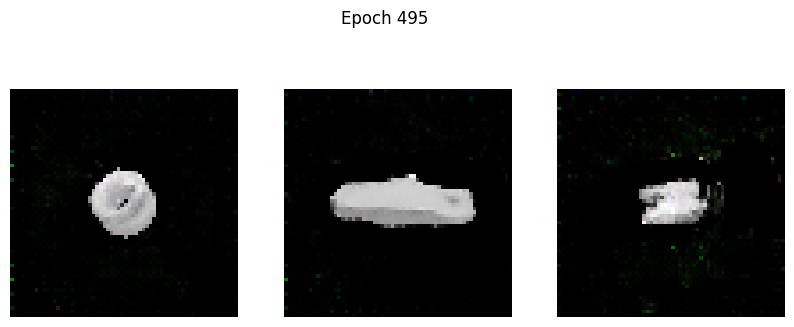

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0880 - g_loss: 5.9176
Epoch 496/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.1096 - g_loss: 6.1579

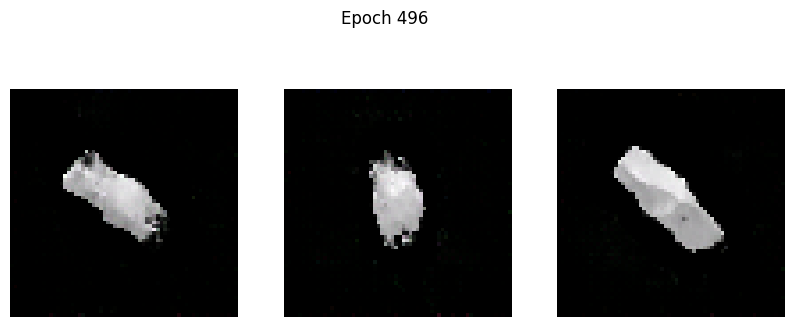

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.1094 - g_loss: 6.1583
Epoch 497/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.0160 - g_loss: 6.8091

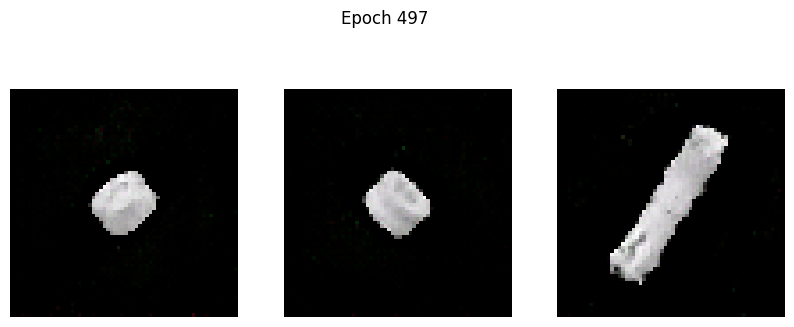

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.0165 - g_loss: 6.8035
Epoch 498/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1068 - g_loss: 6.0422

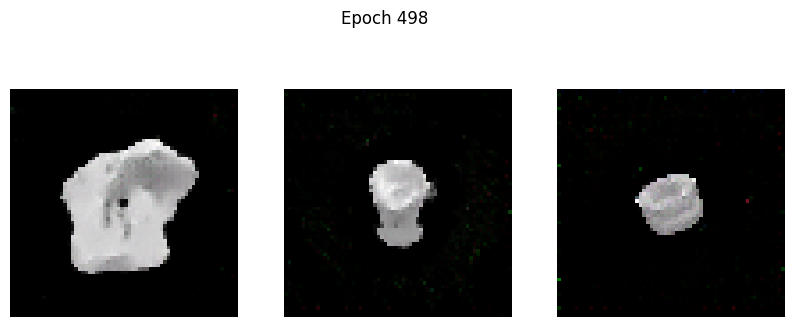

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1068 - g_loss: 6.0420
Epoch 499/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - d_loss: -0.1303 - g_loss: 6.2635

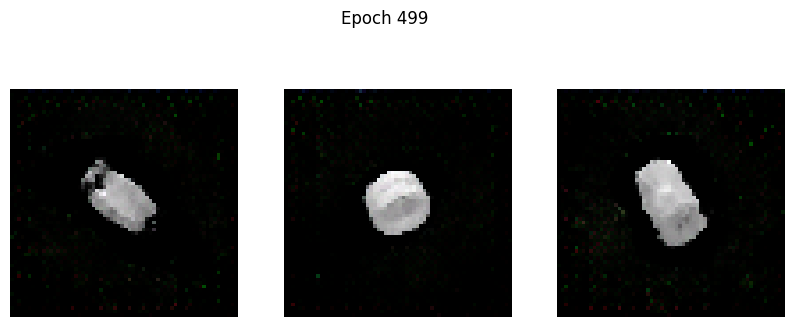

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - d_loss: -0.1303 - g_loss: 6.2622
Epoch 500/500
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -0.0579 - g_loss: 6.3687

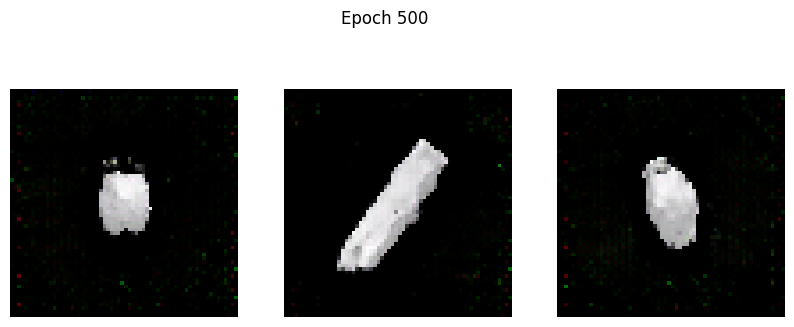

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -0.0578 - g_loss: 6.3698


In [ ]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)